In [29]:
import pandas as pd               
import numpy as np
import math

In [30]:
import spiceypy as sp
import astropy.coordinates
import re
import sgp4.api as sg
import astropy.units as u
from astropy.coordinates import SkyCoord

In [31]:
import matplotlib.pyplot as plt
import os
import sys
from timeit import default_timer as timer
from astropy.time import Time
from astropy.time import TimeDelta
import datetime as dt
import timeit
import skyfield
# from skyfield.framelib import ecliptic_frame # For rotation matrices
from skyfield.api import EarthSatellite # For time calculations
from skyfield.api import load
from skyfield.api import N,S,E,W, wgs84
from skyfield.positionlib import Barycentric

In [32]:
from numba import jit

In [33]:
#Earth shadow angle
np.arctan(690000/150000000)*180/np.pi

0.26355872680311504

In [34]:
# Number of arcseconds in 3 deg
3*3600


10800

In [35]:
#for 500km altitudes satellite is traveling degrees per 30 s
360/90/2

2.0

#### Let us start with reading in the first 10000 LSST observations for Main Belt Asteroids (S1 in the Synthetic Solar System model)

In [36]:
# path = "/data/projects/lsst/baseline_fbs_v1p7p1/"
path = "/data/survey_simulator/v2.99_detections/"
dir_list = os.listdir(path)

dflist=[]

# for d in dir_list:
#     if(d[0:2]=='S1'):
#         dflist.append(pd.read_hdf('/data/projects/lsst/baseline_fbs_v1p7p1/'+d+'/visit-0000000.h5'))
#         dflist.append(pd.read_hdf('/data/projects/lsst/baseline_fbs_v1p7p1/'+d+'/visit-0010000.h5'))
        

dflist.append(pd.read_hdf(path+'/visit-0000000.h5'))
print(dflist)
dflist.append(pd.read_hdf(path+'/visit-0010000.h5'))
print(dflist)

[             ObjID  FieldID      FieldMJD  AstRange(km)  AstRangeRate(km/s)  \
89       S0000tiua   9849.0  60230.257822  6.688510e+07          -10.009785   
434      S0000yXka   8161.0  60228.249621  3.162942e+07            2.265245   
910      S0000IGIa   3276.0  60222.236972  2.935912e+07            2.822530   
929      S0000JJra   5928.0  60225.990617  3.299070e+07            5.715385   
931      S0000JJra   5950.0  60226.001841  3.299625e+07            5.742037   
...            ...      ...           ...           ...                 ...   
6927736   2011HB18   9391.0  60230.040912  2.762612e+08           19.726114   
6927941    2011SE5   6195.0  60226.120334  3.281853e+08           14.846116   
6927944    2011SE5   6245.0  60226.144548  3.282164e+08           14.897443   
6928088   2016FD49   3704.0  60223.022508  3.773242e+08           19.223461   
6928090   2016FD49   3754.0  60223.046520  3.773642e+08           19.290929   

         AstRA(deg)  AstRARate(deg/day)  AstDec(de

In [37]:
# every dataframe looks like this
dflist[0].columns

Index(['ObjID', 'FieldID', 'FieldMJD', 'AstRange(km)', 'AstRangeRate(km/s)',
       'AstRA(deg)', 'AstRARate(deg/day)', 'AstDec(deg)',
       'AstDecRate(deg/day)', 'Ast-Sun(J2000x)(km)', 'Ast-Sun(J2000y)(km)',
       'Ast-Sun(J2000z)(km)', 'Ast-Sun(J2000vx)(km/s)',
       'Ast-Sun(J2000vy)(km/s)', 'Ast-Sun(J2000vz)(km/s)',
       'Obs-Sun(J2000x)(km)', 'Obs-Sun(J2000y)(km)', 'Obs-Sun(J2000z)(km)',
       'Obs-Sun(J2000vx)(km/s)', 'Obs-Sun(J2000vy)(km/s)',
       'Obs-Sun(J2000vz)(km/s)', 'Sun-Ast-Obs(deg)', 'V', 'V(H=0)',
       'fiveSigmaDepth', 'filter', 'MaginFilterTrue', 'AstrometricSigma(mas)',
       'PhotometricSigma(mag)', 'SNR', 'AstrometricSigma(deg)', 'MaginFilter',
       'dmagDetect', 'dmagVignet', 'AstRATrue(deg)', 'AstDecTrue(deg)',
       'detectorID'],
      dtype='object')

In [38]:
# concatenate them into a single dataframe
dfin=pd.concat(dflist)
print(dfin)

             ObjID  FieldID      FieldMJD  AstRange(km)  AstRangeRate(km/s)  \
89       S0000tiua   9849.0  60230.257822  6.688510e+07          -10.009785   
434      S0000yXka   8161.0  60228.249621  3.162942e+07            2.265245   
910      S0000IGIa   3276.0  60222.236972  2.935912e+07            2.822530   
929      S0000JJra   5928.0  60225.990617  3.299070e+07            5.715385   
931      S0000JJra   5950.0  60226.001841  3.299625e+07            5.742037   
...            ...      ...           ...           ...                 ...   
4420297    2010VZ4  11401.0  60232.209317  2.208009e+08           -1.740965   
4420299    2010VZ4  11451.0  60232.233162  2.207973e+08           -1.669668   
4420991   2016FM32  13880.0  60236.052833  3.208046e+08           14.192599   
4421218   2016GH45  11963.0  60233.107019  3.537483e+08           13.268752   
4421220   2016GH45  12013.0  60233.131694  3.537767e+08           13.341739   

         AstRA(deg)  AstRARate(deg/day)  AstDec(deg

In [39]:
# we can sort the resulting dataframe by by FieldID
dfin.sort_values(['FieldID'], inplace=True)
print(dfin)

             ObjID  FieldID      FieldMJD  AstRange(km)  AstRangeRate(km/s)  \
569278   S1004uuMa      0.0  60218.001806  4.061077e+08           19.767022   
119425   S1000GrNa      0.0  60218.001806  3.252865e+08           24.293269   
5885945   2001RD17      0.0  60218.001806  4.143793e+08           17.041151   
220313   S1001qt9a      0.0  60218.001806  1.932723e+08           10.492900   
6765382  2016GH318      0.0  60218.001806  4.075091e+08           21.564300   
...            ...      ...           ...           ...                 ...   
857971   S100bBDua  19999.0  60246.174205  3.952880e+08           22.921371   
283117   S10031ina  19999.0  60246.174205  4.234292e+08           19.451322   
11680    S10003jMa  19999.0  60246.174205  4.292216e+08           20.223435   
1205626  S100hUgca  19999.0  60246.174205  3.318771e+08           20.318171   
3727128  2002QB105  19999.0  60246.174205  3.340220e+08           20.390404   

         AstRA(deg)  AstRARate(deg/day)  AstDec(deg

In [40]:
# then grouping and counting is a little faster. It seems that FieldID 0 has the most observations
dfin.groupby(['FieldID']).count()['ObjID']

FieldID
0.0         34
1.0         40
2.0         34
3.0         12
4.0          6
          ... 
19995.0    276
19996.0    208
19997.0    223
19998.0    274
19999.0    446
Name: ObjID, Length: 17662, dtype: int64

In [41]:
names=dfin['ObjID'].values
print(names)

['S1004uuMa' 'S1000GrNa' '2001RD17' ... 'S10003jMa' 'S100hUgca'
 '2002QB105']


In [42]:
nNeos=0
for n in names:
    if(n[0:2]=='S0'):
        nNeos=nNeos+1

In [43]:
nNeos

2245

In [44]:
def icrf2radec(pos, deg=True):
    """Convert ICRF xyz to Right Ascension and Declination.
    Geometric states on unit sphere, no light travel time/aberration correction.
    
    Parameters:
    -----------
    pos ... real, dim=[n, 3], 3D vector of unit length (ICRF)
    deg ... True: angles in degrees, False: angles in radians
    Returns:
    --------
    ra ... Right Ascension [deg]
    dec ... Declination [deg]
    """
    norm=np.linalg.norm
    array=np.array
    arctan2=np.arctan2
    arcsin=np.arcsin
    rad2deg=np.rad2deg
    modulo=np.mod
    pix2=2.*np.pi
    
    if(pos.ndim>1):
        r=norm(pos,axis=1)
        xu=pos[:,0]/r
        yu=pos[:,1]/r
        zu=pos[:,2]/r
    else:
        r=norm(pos)
        xu=pos[0]/r
        yu=pos[1]/r
        zu=pos[2]/r
    
    phi=arctan2(yu,xu)
    delta=arcsin(zu)
    
    if(deg):
        ra = modulo(rad2deg(phi)+360,360)
        dec = rad2deg(delta)
    else:
        ra = modulo(phi+pix2,pix2)
        dec = delta
    
    return ra, dec

In [45]:
def radec2icrf(ra, dec, deg=True):
    """Convert Right Ascension and Declination to ICRF xyz unit vector.
    Geometric states on unit sphere, no light travel time/aberration correction.
    
    Parameters:
    -----------
    ra ... Right Ascension [deg]
    dec ... Declination [deg]
    deg ... True: angles in degrees, False: angles in radians
    Returns:
    --------
    x,y,z ... 3D vector of unit length (ICRF)
    """
    deg2rad=np.deg2rad
    array=np.array
    cos=np.cos
    sin=np.sin
    
    if(deg):
        a = deg2rad(ra)
        d = deg2rad(dec)
    else:
        a = array(ra)
        d = array(dec)
    
    cosd = cos(d)
    x = cosd*cos(a)
    y = cosd*sin(a)
    z = sin(d)
    
    return array([x, y, z])

In [46]:
###########################################
# OBSERVER STATES

###########################################
def getObserverStates(observationTimes,observerLatitudeDeg=0,observerLatitudeDirection='N',
                     observerLongitudeDeg=0,observerLongitudeDirection='W',observerElevationMeters=0):
    """Produce observer state vectors at observation times.
    Parameters
    ----------
    observationTimes
        Astropy Time array
    observerLatitudeDeg
        observer WGS84 latitude in degrees (float)
    observerLatitudeDirection
        observer latitude direciton ('N' for North or 'S' for South)
    observerLongitudeDeg
        observer WGS84 longitude in degrees (float)
    observerLatitudeDirection
        observer longitude direciton ('E' for East or 'W' for West)
    observerElevationMeters
        observer elevation in meters
    Returns
    -------
    observer positions
        WGS84 x,y,z observer positions at observation epochs in kilometers.
    observer velocities
        WGS84 dx/dt, dy/dt, dz/dt observer velocity at observation epochs in kilometers per second.
    """
    # load time scale object from skyfield
    ts = load.timescale()
    times = ts.from_astropy(observationTimes)
    if(observerLatitudeDirection == 'S'):
        latDir = S
    elif (observerLatitudeDirection == 'N'):
        latDir = N
    else:
        Error("Observer Latitude Direction unknown. Must be 'N' or 'S'.")
    if(observerLongitudeDirection == 'W'):
        lonDir = W
    elif (observerLongitudeDirection == 'E'):
        lonDir = E
    else:
        Error("Observer Longitude Direction unknown. Must be 'E' or 'W'.")
    observer = wgs84.latlon(observerLatitudeDeg * latDir, observerLongitudeDeg * lonDir, elevation_m=observerElevationMeters)
    observerAt = observer.at(times)
    return np.hstack([observerAt.position.km.T])

In [47]:
def getSatelliteStates(times,TLEFirstLine,TLESecondLine):
    """Produce satellite state vectors at observation times.
    Parameters
    ----------
    times
        Astropy Time array
    TLEFirstLine
        First Line of TLEs (str)
    TLESecondLine
        Second Line of TLEs (str)
    Returns
    -------
    satPositions
        x,y,z satellite geocentric positions in kilometers according to SGP4 propagation
    satVelocities
        dx/dt, dy/dt, dz/dt satellite geocentric velocities in kilometers/second according to SGP4 propagation
    """
    satPositions=[]
    satVelocities=[]
    r=0
    v=0
    e=0
    
    sat = sg.Satrec.twoline2rv(TLEFirstLine, TLESecondLine)  
    
    if(np.size(times)>1):
        for jd_t in times.jd:
#             print(jd_t)
            # convert MJD to JD for sgp4 propagation calculation
            fr, whole = math.modf(float(str(jd_t)))  # fr = digits after decimal of MJD

            e, r, v = sat.sgp4(float(str(jd_t)), round(fr, 10))  # r is [x,y,z] for propagated satellite

            satPositions.append(r)
            satVelocities.append(v)
#             print(r)
        return np.array(satPositions), np.array(satVelocities)
    else:
        fr, whole = math.modf(float(str(times.jd)))  # fr = digits after decimal of MJD
        e, r, v = sat.sgp4(float(str(times.jd)), round(fr, 10))  # r is [x,y,z] for propagated satellite
        return r,v
    


In [48]:
@jit
def crossTrackDistanceVectors(P1,P2,P3):
    # check if the point is within the line connecting P1 and P2
    # returns distance in distance units
    v1=P3-P1
    v2=P3-P2
    
    if(np.dot(v1,v2)<0):
    
        S = np.cross(P1,P2)
        dot = np.dot(S,P3)
        normS = np.linalg.norm(S)
#     print('S',S)
#     print('dot',dot)
        dist = np.arctan2(dot/normS, np.sqrt(1 - (dot/normS)**2 )) 
    else:
        dist=1e10
    
    return dist

In [49]:
field_ids = dfin['FieldID'].unique()

In [50]:
dates = dfin['FieldMJD'].unique()

In [51]:
dates

array([60218.00180556, 60218.00225437, 60218.00270465, ...,
       60246.17324421, 60246.17369375, 60246.17420513])

In [52]:
print("Earliest field date: " + str(min(dates)) + " or 10-01-2022 at 23:39:19.663 UTC")
print("Last field date: " + str(max(dates)) + " or 10-30-2022 at 05:03:20.104 UTC")

Earliest field date: 60218.001805555556 or 10-01-2022 at 23:39:19.663 UTC
Last field date: 60246.17420513237 or 10-30-2022 at 05:03:20.104 UTC


In [53]:
cwd = os.getcwd()  # Get the current working directory (cwd)
files = os.listdir(cwd)  # Get all the files in that directory
print("Files in %r: %s" % (cwd, files))

Files in '/home/ss53': ['.bash_logout', '.bash_profile', '.bashrc', '.mozilla', '.emacs', '.zshrc', '.kshrc', '.local', '.bash_history', '.ipynb_checkpoints', '.ipython', '.config', '.cache', 'plot_example.ipynb', 'softwares', '.pki', '.bashrc-anaconda3.bak', 'valerie', '.astropy', '.python_history', 'anaconda3', '.conda', 'environment.yml', '.bashrc_backup', '.ssh', 'FreeFlyer_7.7.1_Installer_Linux_64-Bit.zip', 'freeflyer_7.7.1.55976-0-0.el7.x86_64.rpm', '.nv', '.history', 'data', 'starlinktle.txt', 'untitled.txt', 'sunvectors.txt', 'BrightnessFn.ipynb', 'REU-Summer-2022-David', 'Untitled.ipynb', 'Untitled1.ipynb', 'REU-Summer-2021', 'sanjisbest', 'ISO.ipynb', 'LSST_Satellite_SSO_Loss.ipynb', 'starlink_v2_final.txt', 'Homework2_Molnyia_orbits.ipynb', 'LSST_satellite_SSO_loss_OpSim_v2_99-Copy2.ipynb', 'S0_copy', 'starlink100.txt', 'foo.csv', 'LSST_satellite_SSO_loss_OpSim_v2_99.ipynb', '.lesshst', 'outputs', 'affected_20kFOVs.csv', 'abaqus_v6.env', 'LSST_Satellite_SSO_Loss.py', '.vimin

In [54]:
# open the TLE files
# with open('/home/davidar6/Solution Testing/starlink_tle.txt') as f:
#     starlinks = f.read().splitlines() 

In [55]:
# with open('starlink_tle.txt') as f:
#     starlinks = f.read().splitlines() 

In [56]:
with open('starlink100.txt') as f:
    starlinks = f.read().splitlines() 

In [57]:
# split up the list into 3-line lists for each satellite
chunks = [starlinks[n:n + 3] for n in range(0, len(starlinks), 3)]

In [58]:
satdf=pd.DataFrame(chunks,columns=["SatID",'TLELine1',"TLELine2"])

In [59]:
satdf['SatNumber']=satdf.index

In [60]:
satdf

,SatID,TLELine1,TLELine2,SatNumber
0,starV2 8000,1 08000U 20001A 23274.00000000 .00000000 0...,2 08000 53.0000 0.0000 0001000 0.0000 278...,0
1,starV2 8001,1 08001U 20001A 23274.00000000 .00000000 0...,2 08001 53.0000 0.0000 0001000 0.0000 281...,1
2,starV2 8002,1 08002U 20001A 23274.00000000 .00000000 0...,2 08002 53.0000 0.0000 0001000 0.0000 285...,2
3,starV2 8003,1 08003U 20001A 23274.00000000 .00000000 0...,2 08003 53.0000 0.0000 0001000 0.0000 288...,3
4,starV2 8004,1 08004U 20001A 23274.00000000 .00000000 0...,2 08004 53.0000 0.0000 0001000 0.0000 291...,4
...,...,...,...,...
95,starV2 8095,1 08095U 20001A 23274.00000000 .00000000 0...,2 08095 53.0000 0.0000 0001000 0.0000 589...,95
96,starV2 8096,1 08096U 20001A 23274.00000000 .00000000 0...,2 08096 53.0000 0.0000 0001000 0.0000 592...,96
97,starV2 8097,1 08097U 20001A 23274.00000000 .00000000 0...,2 08097 53.0000 0.0000 0001000 0.0000 596...,97
98,starV2 8098,1 08098U 20001A 23274.00000000 .00000000 0...,2 08098 53.0000 0.0000 0001000 0.0000 599...,98


In [61]:
print("There are " + str(len(chunks)) + " satellites")

There are 100 satellites


In [62]:
FOV_dist_lim = 5/180*np.pi #3 degrees distance to FOV for a satellite to be excluded
rearth = 6371
LSSTExpDays = 30/86400
distlim = 3/180/3600*np.pi # 3 arcsecond distance from satellite track
shadow=0
affected=[]

# check each satellite against each FIELD
for f in field_ids: #[100:1000]:

    data = dfin[dfin['FieldID']==f]  # all objects in the field

    sun_vector = data[['Obs-Sun(J2000x)(km)', 'Obs-Sun(J2000y)(km)', 'Obs-Sun(J2000z)(km)']][0:1].values[0]
    sv = sun_vector/np.linalg.norm(sun_vector)

    ra_f = data['AstRA(deg)']  # RA for all objects
    dec_f = data['AstDec(deg)']  # Dec for all objects
    range_f = data['AstRange(km)'] # Distance for all objects
    time_f = data['FieldMJD'].median()
    objID_f = data['ObjID']
    xyzu = radec2icrf(ra_f, dec_f, deg=True)
    
    FOV_mean_direction=np.median(xyzu,axis=1)
#     print(xyzu)
#     print('md',mean_direction)
#     min_ra, max_ra = min(ra_f), max(ra_f) # Global minimum and maximums for objects in the field in question
#     min_dec, max_dec = min(dec_f), max(dec_f)
    
    time = Time(time_f, format='mjd', scale='utc')
    observer_state = getObserverStates(time,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                  observerLongitudeDeg=70.74913,observerLongitudeDirection='W',observerElevationMeters=2663)
    
    for index, row in satdf.iterrows():
        
        sat_r,sat_v = getSatelliteStates(time,row['TLELine1'],row['TLELine2'])
       
        
        # print('time',time,sat_r)
        
        #Is the satellite in Earth's Shadow?
        r_parallel = np.dot(sat_r,sv)*sv
        r_tangential = sat_r-r_parallel
            
        if(np.linalg.norm(r_tangential)<rearth):
            #print(np.linalg.norm(r_tangential),np.linalg.norm(r))
            #yes the satellite is in Earth's shadow, no need to continue (except for the moon of course)
            shadow=shadow+1
            continue
#         else:
#             print('not in shadow')
            # break
            
            
        #Is the satellite near the FOV?
        sat_d = np.linalg.norm(sat_r)
        ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
        
        if(ang_dist > FOV_dist_lim):
            continue
        
        tminus = Time(time.mjd-LSSTExpDays/2,format='mjd',scale='utc')
        tplus = Time(time.mjd+LSSTExpDays/2,format='mjd',scale='utc')
#         print((tminus-tplus)*86400,'timestuff')
#         print(tminus.jd)
        # do a more thorrow analysis by propagating the satellite to +15 and -15 secs and check for cross track distance
        R1,V1 = getSatelliteStates(tminus,row['TLELine1'],row['TLELine2'])
        R2,V2 = getSatelliteStates(tplus,row['TLELine1'],row['TLELine2'])
#         print('R1, R2',np.array(R1),np.array(R2))
#         print('R1-R2',np.array(R1)-np.array(R2))
        
        OBSERV1 = getObserverStates(tminus,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                  observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
        OBSERV2 = getObserverStates(tplus,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                  observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
   
        O1 = np.array(R1)-OBSERV1
        O2 = np.array(R2)-OBSERV2
        
        P1 = O1/np.linalg.norm(O1)
        P2 = O2/np.linalg.norm(O2)
        
        i = 0
        mincdist = 1
        minsat = ""
        
        for obj in objID_f: 
            P3 = xyzu[:,i]
            # print('P1',P1,'P2',P2,'P3',P3)
            cdist = np.abs(crossTrackDistanceVectors(P1,P2,P3))
            #print('cdist [arcsec]',cdist*3600*180/np.pi)
            # print('cdist',cdist)
            adist = np.arccos(np.dot(P1,P3))
            if (cdist < mincdist):
                    mincdist = cdist
                    minsat = row.SatID
            if ((cdist <= distlim) & (adist <= FOV_dist_lim)):
                affected.append([time,cdist*3600*180/np.pi,obj,f,ra_f.values[i],dec_f.values[i],row,P1,P2,P3])
                print([time,cdist*3600*180/np.pi,obj,f,ra_f.values[i],dec_f.values[i],row,P1,P2,P3])
            i=i+1
        if (cdist < 1e9):
            print('minimum distance ["]',mincdist*3600*180/np.pi,'of satellite ',minsat)
    #radec2icrf(ra, dec, deg=True)
        
        #Is it in the extended FOV?
        
  
    
    
    
    

2460218.5018055555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/1337929031.py:11: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float64, 1d, C), array(float64, 1d, A))
  dot = np.dot(S,P3)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5022543706
2460218.502704649


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5031536203
2460218.503602191


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5040692626
2460218.5045317966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.504980489
2460218.5054307673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.505879921
2460218.506328582


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.506795659
2460218.5089947334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5094419797
2460218.509890224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5103377
2460218.5107857795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.511233499
2460218.5116813593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.512127318
2460218.512573256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5130208256
2460218.513466409


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.513914289
2460218.51435954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.514807401
2460218.515252258
2460218.515699971


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.516147464
2460218.516592985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.517040259
2460218.517485353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.517936241
2460218.5197372027
2460218.520195475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.523876386
2460218.5275443844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.528887947
2460218.5293342136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5297832466
2460218.5302291894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5306753013
2460218.531127322


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5329097295
2460218.5333575974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5338065927
2460218.5342541793


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.534703048
2460218.5351499696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5355971386
2460218.5360438377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5364903887
2460218.5369370854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5373832677
2460218.537830498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.538276325
2460218.5387235037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5391688184
2460218.539615727
2460218.5400632024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.540509084
2460218.540957856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5414032196
2460218.5418563806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.543661744
2460218.544121831
2460218.5519508785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5528410934
2460218.5532865473
2460218.5537382225
2460218.554184254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5546320635
2460218.5550780413
2460218.555524299


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.555971161
2460218.5564173325
2460218.5568644614
2460218.557311304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5577583713
2460218.558205535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5586527633
2460218.55909992
2460218.5595468045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5599932014
2460218.5604389613
2460218.5608840375
2460218.561335113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5617794683
2460218.562230384
2460218.562675582
2460218.563121508
2460218.56357079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5640167706
2460218.5644654613
2460218.5649124677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5653606607
2460218.565807416
2460218.5662552696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.566702438
2460218.567150035
2460218.567596764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.568044051
2460218.5684929127
2460218.5689391037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5693849707
2460218.569837845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.570282815
2460218.570732759
2460218.5711780116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.57566664
2460218.5765565378


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5770020327
2460218.5774566624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5779027804
2460218.578353841


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.578800192
2460218.579247024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.579692926
2460218.58013989
2460218.5805862164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5810340745
2460218.581482371


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5819309303
2460218.582379693
2460218.582828461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.58327695
2460218.583724854
2460218.5841719545
2460218.584618169
2460218.5850714487
2460218.5855170223
2460218.585969452
2460218.586415825
2460218.5868631103
2460218.587312353
2460218.5877596536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.588208238
2460218.5886568096
2460218.589104802


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.589552951
2460218.590000486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.590449082
2460218.590896222
2460218.591344159


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5917908303
2460218.592240209
2460218.5926872385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5931337425
2460218.593589086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.594034155
2460218.5944842133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5966832875
2460218.5971392076
2460218.5975988335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5980641786
2460218.598539043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.59898627
2460218.599433919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.5998982685
2460218.600345992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.600807388
2460218.601254541


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6017027167
2460218.602160274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.602609497
2460218.6030694195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.603518894
2460218.6039807317


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.604436651
2460218.60546064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.60590972
2460218.6063863453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6068489263
2460218.6073476886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.607800661
2460218.608248167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.608695944
2460218.6091461573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.609594549
2460218.610042762


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6104913116
2460218.610993102


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.611441905
2460218.6118905446


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.612340945
2460218.612811781


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6133354967
2460218.613800168
2460218.6142716403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.614728805
2460218.615206581
2460218.6156875617
2460218.6161665376
2460218.616614954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.61708581
2460218.6175607042
2460218.618034199


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6184819695
2460218.618951414
2460218.619420993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6198818777
2460218.6203315454
2460218.6207874655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.621247092
2460218.621712437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6221807627
2460218.6226276606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.62307542
2460218.623539769


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.623987535
2460218.624448931


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.62489573
2460218.6253433516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6258009095
2460218.6262487103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.626708633
2460218.6271565366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.627618374
2460218.6280742935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.628525709
2460218.628974789


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.629451414
2460218.629913995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.630402344
2460218.6308553163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.631302785
2460218.6317504495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.632200663
2460218.632648836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6330968696
2460218.6335454197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6340348674
2460218.6344834003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6349317906
2460218.635382191


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.635853027
2460218.636359365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6368240365
2460218.6372955088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6377526736
2460218.6382304495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.638751816
2460218.639201742


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.63965263
2460218.640102668


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.640552772
2460218.641046591


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6419387795
2460218.642387105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6428357176
2460218.643282411


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.643731391
2460218.644180334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.644629219
2460218.6450771606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6455248985
2460218.6459773895
2460218.646425778


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.646873866
2460218.647323632
2460218.647772516
2460218.6482215826
2460218.648686014


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.649135893
2460218.649585782
2460218.6500539053


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6505069667
2460218.650956563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.651413578
2460218.6518675587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.652317593
2460218.6527710585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.653227277
2460218.653678046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6541270157
2460218.6545816185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6550317407
2460218.6554803904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6559275696
2460218.6563754496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.656823805
2460218.6572742346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6577243074
2460218.658171072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.658623735
2460218.6590695023
2460218.659519618


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6604103423
2460218.660860304
2460218.6618867833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.662344782
2460218.6627926626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.663241072
2460218.6636910113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.664138839
2460218.6646166933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6655089064
2460218.6659573643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.666405841
2460218.6668514526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6673002536
2460218.667749034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.668197772
2460218.6686441936


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6690905155
2460218.669543006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6699897503
2460218.6704363427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.670885885
2460218.671333004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6717801825
2460218.672244614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6726939254
2460218.673143604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6736117275
2460218.6740647885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.67451432
2460218.674971335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6754253153
2460218.67587535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6763279987
2460218.6767842174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6772349863
2460218.6776825706
2460218.67813622


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.678585366
2460218.6790331313
2460218.679480067
2460218.679926494
2460218.680373546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6808239757
2460218.6812734017
2460218.681719603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6821703888
2460218.684369463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6848194045
2460218.687133159


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6880457825
2460218.6889431593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.689830321
2460218.690290533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6907405164
2460218.6911991304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.691649066
2460218.692098989


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.6925489125
2460218.694516753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7004885175
2460218.700938335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7013881193
2460218.7018378903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7022876604
2460218.7036385303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7045581425
2460218.705459473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.711329711
2460218.7117784424
2460218.713636708
2460218.7145880307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7159795226
2460218.717791818


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.718240714
2460218.7200231217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.720470305
2460218.720918893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7218212043
2460218.7231779834
2460218.7236373113
2460218.727715573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7328929724
2460218.735647111


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7360913455
2460218.7365473565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.737005608
2460218.7374504134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7378951027
2460218.738342759


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7387878224
2460218.7396859056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.740131452
2460218.740576943
2460218.7410257063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.741473594
2460218.741919073
2460218.742370052
2460218.742818923
2460218.743264498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.743713471
2460218.74416374
2460218.7446157825
2460218.745526625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7459725616
2460218.7464318895
2460218.749162338

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460218.75050865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7556856964
2460218.758438949


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7588827237
2460218.759338735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7597969864
2460218.760241212


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.760685263
2460218.7611317965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.761576098
2460218.7642269055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.765352915
2460218.766504259
2460218.7677816073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7682396127
2460218.768761763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.771510618
2460218.7742288862
2460218.7749124826
2460218.7756525795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.776439259
2460218.7772783726
2460218.777729336
2460218.7786593433
2460218.779632466
2460218.780383365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7808379238
2460218.7816872513
2460218.7824155944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.78298068
2460218.783604498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.784277587
2460218.785258168
2460218.7859014375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7865801817
2460218.787201679


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.787654175
2460218.788670935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7900008583
2460218.7904533795
2460218.790960469


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7916521034
2460218.7926496067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7938834336
2460218.7943378305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7955390965
2460218.7966823513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.7989645484
2460218.799545139


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.800073872
2460218.8006384615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8011544193
2460218.8021649285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8026127284
2460218.8140423927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8153979727
2460218.8190419436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.820422879
2460218.820873188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.821768939
2460218.82311677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8235714547
2460218.824020753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.824466877
2460218.8249164065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8386525214
2460218.840439305
2460218.841854015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.843679626
2460218.844129935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8450252754
2460218.8459273903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8463729355
2460218.8468276197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8472765232
2460218.8477769755


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8486715
2460218.8491189615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8495646813
2460218.8500129636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.850458421
2460218.850906438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.851354469
2460218.851799504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.852255794
2460218.8527035047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.853151675
2460218.8535969704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8540442013
2460218.85448971
2460218.8549370454
2460218.855382836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.855830322
2460218.856276385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.856724147
2460218.8571721627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.857618177
2460218.8585122474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8589600776
2460218.8594055763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8598536183
2460218.8602988934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.860746669
2460218.8611944625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8616393427
2460218.862095226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8625426856
2460218.86299113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8634361527
2460218.8638831386
2460218.8643283388


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8647754174
2460218.8652208783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8656680975
2460218.8661138117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.866561304
2460218.8670096435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8674573624
2460218.8679049956
2460218.868353888


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.868801795
2460218.869251505
2460218.8696973883
2460218.8705888093
2460218.873033344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.87347983
2460218.873929011
2460218.8743753964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8748206557
2460218.8752671396
2460218.87571264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8761581974
2460218.8766038152


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8770511653
2460218.8775003124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.877947924
2460218.8783976184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8788432963
2460218.879734475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8825871646
2460218.883033399
2460218.8834827244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8839288447
2460218.8843737715
2460218.8848199775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.885265114
2460218.8857103195
2460218.8874927266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.88772973
2460218.8879665695
2460218.888204514
2460218.8884409657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.888677272
2460218.888915005
2460218.8891510796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8893873156
2460218.8896256704
2460218.889866605
2460218.890104971


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.890341823
2460218.890580261
2460218.890817358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.89105428
2460218.891292161
2460218.8915286814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8917650464
2460218.8920026994
2460218.89223883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.892475132
2460218.8927134406
2460218.892954402
2460218.8931927243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8934296668
2460218.8936680644
2460218.8939052573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8941422636
2460218.894380077
2460218.894616667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460218.8948530913
2460218.89509066
2460219.485520692


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4859683765
2460219.4864204135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.486867548
2460219.4873184883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4877651413
2460219.488215026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4886612804
2460219.4891101625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.489556105
2460219.490004569


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.490451279
2460219.490907499


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4913573014
2460219.491804671


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4922553916
2460219.4927031826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4931548443
2460219.4936030973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4940564954
2460219.494505231


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.4962876383
2460219.496734875
2460219.4971883562
2460219.497635232
2460219.4980864977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.498532909
2460219.4989829236
2460219.499428838


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.499877716
2460219.50032314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5007716836
2460219.5012177164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5016738195
2460219.5021240497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5025707413
2460219.503022092


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.503469222
2460219.503922346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5043699755
2460219.5048297113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.505277888
2460219.5057569495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5062050633
2460219.506665806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.507124843
2460219.5075791543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5080289184
2460219.5084801405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5089324997
2460219.5093791536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5098307775
2460219.510281612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5107314037
2460219.5111814304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5116299996
2460219.512079937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5125587946
2460219.5130087775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.513455476
2460219.51390501


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.514351158
2460219.514797664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.515245427
2460219.515694586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5161426207
2460219.5165923783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.517038474
2460219.517488846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.517939601
2460219.5183864874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.518838173
2460219.5192898167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5197363226
2460219.5201893784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.520644146
2460219.521091836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.521552677
2460219.5220141727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5224729357
2460219.5229265303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5233762623
2460219.5238324967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5242824755
2460219.5247399667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.525196627
2460219.5256526913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.526431653
2460219.5269179125
2460219.5273983926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5278482144
2460219.528312612
2460219.528781186
2460219.529234763
2460219.529701218


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.530157523
2460219.530611782
2460219.5310617005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5315119317
2460219.5319642914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.532414461
2460219.5328657776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5333154504
2460219.533763478


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5342134945
2460219.5346604222


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5351105197
2460219.5355810383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5360307526
2460219.5364779644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5369275645
2460219.5373740857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5378198284
2460219.538268576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5387186357
2460219.539165166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5396161787
2460219.540063712


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5405157823
2460219.5409674877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.541416113
2460219.541868267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5423237747
2460219.54277175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5432352507
2460219.543694113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5441456656
2460219.5446056006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5450745425
2460219.5455488283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5460233185
2460219.54647192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.54695789
2460219.5474070557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5479063634
2460219.5483849933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.548897062
2460219.5497752153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5503357984
2460219.5507851327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5512420735
2460219.5517063155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.552181393
2460219.5527406656


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.553188338
2460219.5536399214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.554087302
2460219.5545380088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5549943484
2460219.5554440916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.555892235
2460219.5563413906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5567892343
2460219.5572391604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.557686634
2460219.5581342867
2460219.5585823893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.559029985
2460219.559479396
2460219.559927765
2460219.5603745626
2460219.5608237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5612725103
2460219.5617230735
2460219.562169732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5626212168
2460219.563069594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5635256437
2460219.5639786003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5644269357
2460219.5648850244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.565348422
2460219.565813792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.566277613
2460219.5667263037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5672009955
2460219.567677351


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5681507634
2460219.568617249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.569069954
2460219.5695416564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.570026436
2460219.5705187256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.571175048
2460219.571671997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.572185335
2460219.5726472526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.573394206
2460219.573855313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.574304249
2460219.574760124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.575219432
2460219.5756844967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.576245961
2460219.576694684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.57714688
2460219.5775954016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5780463596
2460219.578501665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5789507553
2460219.579399471


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5798484837
2460219.580297096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5807474847
2460219.5811959184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.581644396
2460219.58209303
2460219.582541504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.582989599
2460219.58343906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.583887156
2460219.584337676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.58478544
2460219.5852371724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.58568533
2460219.5861410704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5865917993
2460219.587053399


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.587517653
2460219.5879654693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5884407978
2460219.5889128787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.589377191
2460219.5898335315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.590282386
2460219.5907445867
2460219.591219964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5917065283
2460219.592198657
2460219.59265015
2460219.5931647285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.593673099
2460219.5942683993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5947505743
2460219.595216786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5956982197
2460219.596146142


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5966139715
2460219.597077834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.59752752
2460219.5981714004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.5986200417
2460219.5990724247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.599533782
2460219.599984444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6004543975
2460219.6009037844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.601353279
2460219.6018014895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.60224985
2460219.6026980313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6031476804
2460219.6035949276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6040445017
2460219.604491133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6049404903
2460219.6053878684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.605835273
2460219.6062840596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.606731673
2460219.6071802843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.607628682
2460219.6080772895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6085263607
2460219.60897487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.609423637
2460219.609872979


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.61032293
2460219.610806319


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6112566288
2460219.6117075845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.612198461
2460219.612649902


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.613102026
2460219.613601766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.614055971
2460219.6145135555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.614973211
2460219.615547347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6160096466
2460219.616475035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.616996812
2460219.6174695333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.617944407
2460219.618405409


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6188733717
2460219.6193213174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.619783046
2460219.6202429477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.62069294
2460219.6212834474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6217310876
2460219.6221834705
2460219.622645597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.623094976
2460219.623557416
2460219.624005164
2460219.6244532736
2460219.624902619


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6253496353
2460219.6257963134
2460219.626246377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6266922737
2460219.6271422734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.627587768
2460219.6280376757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6284839283
2460219.6289303703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6293783663
2460219.6298273006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6302751913
2460219.6307229362
2460219.6311709634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6316196322
2460219.6320681223
2460219.632516547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.632965735
2460219.6334150336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.633885686
2460219.6343356282


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.63478562
2460219.635260041


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.635710813
2460219.636162884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6366411196
2460219.6370927985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6375488928
2460219.638131489


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6385811092
2460219.639033866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6394846966
2460219.6399337784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6403833264
2460219.6408332796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.641393415
2460219.6418460025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6423039534
2460219.6427667816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.643233242
2460219.6438273955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.644292003
2460219.6450138907


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.645482551
2460219.645949906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6463990514
2460219.646858057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6473100856
2460219.6477594795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.648209154
2460219.6486564386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6491054986
2460219.649554458


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6500028595
2460219.650451579


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6509057544
2460219.6513535087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.651810221
2460219.6522588055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.652706266
2460219.653153878
2460219.6536016343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6540487963
2460219.6544960844
2460219.6549433446
2460219.655392245
2460219.655839688


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6562867477
2460219.6567333476
2460219.6571787316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.657625295
2460219.6580723487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.658530604
2460219.6589789065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6594264833
2460219.659873488


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.660319974
2460219.6607742533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6612457046
2460219.661694188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.662146945
2460219.6625947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6630413844
2460219.663490967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.663938182
2460219.664458608


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.664911195
2460219.665369146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.665831974
2460219.666298434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6668352922
2460219.6672998997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.667920666
2460219.6683893255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.668856681
2460219.669305243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.669763119
2460219.6702151475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6706638183
2460219.6711128843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.671560744
2460219.672008391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6724566664
2460219.6729038935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.673351967
2460219.6738038315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6742519634
2460219.6747077764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.675154715
2460219.6756017604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6760489033
2460219.6764961546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6769421836
2460219.6773890457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.677835039
2460219.6782840365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.678730106
2460219.679175864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6796212685
2460219.6800663015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6805116464
2460219.680957355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.68141561
2460219.682028201


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.682494523
2460219.6829430135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.68339226
2460219.683840961


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6842896827
2460219.684738547
2460219.6851875777


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.685660073
2460219.686110543
2460219.686563284
2460219.687018084
2460219.6874911506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6879412765
2460219.688390425
2460219.6888922076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6893466874
2460219.689799865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.69025109
2460219.6907562874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6912147948
2460219.6916710334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.692144499
2460219.692607209


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6930573448
2460219.693528604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6939763986
2460219.694442754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6949017933
2460219.6953619206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.695821313
2460219.696270147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6967333
2460219.697182034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.6976361466
2460219.6980856857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.698616411
2460219.6990689267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.699518438
2460219.6999652246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7004188853
2460219.700865594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7013146407
2460219.7017665743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.702215138
2460219.702666496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.703116467
2460219.703563361


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7040363126
2460219.7044832134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7049299576
2460219.7053962797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.70584477
2460219.7062931242


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.706741825
2460219.7071892903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7076366595
2460219.708083987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7085564816
2460219.709006952


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.709459693
2460219.7099144924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7103875596
2460219.7108376855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.711286571
2460219.7117749997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7122294796
2460219.712682657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7131338823
2460219.713626146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.714084653
2460219.714540892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7150143576
2460219.7154770675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7159272716
2460219.716398531
2460219.716845717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7173120724
2460219.717771112
2460219.7182312394
2460219.7186906314
2460219.719138942


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7196020954
2460219.720050467
2460219.72050458
2460219.72095358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7214645855
2460219.7219171007
2460219.7223663065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7228129627
2460219.7232666234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7237124476
2460219.7241614936


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7246130486
2460219.7250606283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.725511986
2460219.726012865
2460219.726467931


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7269149674
2460219.7273632204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.727809783
2460219.728255617
2460219.7287073173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7291536084
2460219.729599621


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.730049725
2460219.7304957737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.730942344
2460219.731398394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7318547727
2460219.7327722143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.733219193
2460219.73641732
2460219.7368636983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7373204627
2460219.7377666514
2460219.7382120867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7386581013
2460219.73911134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7395567894
2460219.740001954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.740450759
2460219.740903334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7413489753
2460219.7417978775
2460219.7422435693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7426922373
2460219.7431475315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.743596249
2460219.7440560213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7445016885
2460219.744950198


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.74539595
2460219.745840847
2460219.746289286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.746737662
2460219.747189129


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.747644467
2460219.748089854
2460219.7485353965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7489888403
2460219.749434872
2460219.749883548
2460219.7503289594
2460219.7507734923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.75122465
2460219.7516697147
2460219.7521143924
2460219.7525644563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7530102483
2460219.7534553814
2460219.7539114314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7543678097
2460219.755285252


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7557311147
2460219.7589273206
2460219.7598293032


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.760274356
2460219.7607195247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7611644287
2460219.7616159976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7620602543
2460219.762504187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.762953353
2460219.763404245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.764298069
2460219.7647426594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7651916943
2460219.7656464973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.766095571
2460219.7665553438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7669999134
2460219.7674487326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.767893426
2460219.7683377326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7687863973
2460219.7692350144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.771017422
2460219.771461745
2460219.771905755
2460219.772350071


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7727962458
2460219.773246936
2460219.773691764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7741422663
2460219.7745888447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7750324113
2460219.7754790224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7759289066
2460219.7763729226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.776823282
2460219.777275486
2460219.7777204677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.77817287
2460219.778629495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7795462087
2460219.78424074
2460219.784700319


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7856081235
2460219.786064077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.786508936
2460219.7869632994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7878561486
2460219.790122434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.791480742
2460219.791933996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7923840806
2460219.792827693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.793277312
2460219.7950597196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.795504096
2460219.7959468546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.796391716
2460219.7968378915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.7977318163
2460219.798628897
2460219.79907208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.799518691
2460219.7999685747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.800412431
2460219.800862542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8013147465
2460219.8017599094


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.802668937
2460219.8035856504
2460219.809645972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8101019254
2460219.810546784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.811001148
2460219.811894212
2460219.8159509683


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8164102994
2460219.8168567596
2460219.8173024743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8177496525
2460219.8181987014


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8186475285
2460219.8190909857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.819536725
2460219.819994872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.820438483
2460219.8208879097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.821333574
2460219.8217837797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8222268363
2460219.8226938876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8231384424
2460219.823582412
2460219.8240327127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.82447685
2460219.824920508
2460219.825364447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8258147673
2460219.8262587553
2460219.8267029505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.827153198
2460219.827597463
2460219.82804115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8284859597
2460219.8289299295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8293742524
2460219.829824188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.830268562
2460219.8307125433
2460219.8311582874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8320464697
2460219.8324913806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8329364946
2460219.833381811


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.833831365
2460219.8342769933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.834807329
2460219.8401613883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8406207194
2460219.8410679996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8415132663
2460219.8419610756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8424105677
2460219.8428596095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8433023407
2460219.843747004
2460219.846419754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8482202813
2460219.851517163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.852453566
2460219.852907795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8538228185
2460219.8542889473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.854752878
2460219.857869343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.862966919
2460219.8639033213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.86435755
2460219.8652726323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.865738761
2460219.866202692


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8670935933
2460219.876032869
2460219.877815276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460219.8867546637
2460220.485970523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4865063117
2460220.486963911


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4874266996
2460220.487876129


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4883318613
2460220.4887877875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4892772795
2460220.489725615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4901770996
2460220.490628181


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4910780606
2460220.491526547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.491975985
2460220.492424874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4928769576
2460220.4933659034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4938160446
2460220.494272743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4947402235
2460220.4951988873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4969812944
2460220.497548939


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.498008873
2460220.4984854804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4989346364
2460220.499400079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.4998638313
2460220.500373034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.500821785
2460220.5012773457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.501729964
2460220.502179844
2460220.5026284815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.503078834
2460220.5035278415
2460220.503979925
2460220.504489527
2460220.5049395487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5053962474
2460220.5058703283
2460220.506328992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5081113996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5086693903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.509148002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5096105384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5100882966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5105401296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5109880627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.511499797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5119493315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5124109816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5128595484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.513316748


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5137640205
2460220.514211677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5146882515
2460220.5151404003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.515586631
2460220.516037957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.516485432
2460220.516933212


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.517396628
2460220.517843927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5182915498
2460220.5187404873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.51918768
2460220.519634519


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5200832044
2460220.5205299673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.520978691
2460220.5214249766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.52187377
2460220.5223224782


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5227736
2460220.5232223934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.523674333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.524123245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5245773057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5250348477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5254833945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.525946395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.526398014


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.526866722


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.527341428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5278778793


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5283530722


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.528825958


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5293060066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5298676104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5303293625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5308125876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.532594995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.53318909
2460220.5337075335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5341671174
2460220.5346619166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.535113749
2460220.5355624626
2460220.5360500934
2460220.5364984307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5369675676
2460220.537415543
2460220.5378750023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.538323678
2460220.5387724517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.539237264
2460220.53969155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5401396463
2460220.54059112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.541039774
2460220.541488525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5419474375
2460220.5423959703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.542844623
2460220.5432934165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.543741864
2460220.5441901716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.544637155
2460220.5450853803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5455345865
2460220.545982538


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5464298874
2460220.5468768207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.547328867
2460220.5477758925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.548232821
2460220.548680299


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5491449106
2460220.5496079205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.550056182
2460220.5506146937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.551087523
2460220.55153832


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.552019413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.552488435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.552976106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.553473837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5543218893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.554810151


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.555295624
2460220.5557576925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5562312785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.556757222


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5572108077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5577394147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5581968464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5586470305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.559157913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5596167375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5600764817
2460220.560534692


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5609887196
2460220.5614416953
2460220.5618953765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5623461925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.562798691
2460220.5632486893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5637359293
2460220.564185708


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.564634485
2460220.5650833114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5655320045
2460220.565980995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5664288
2460220.566876151
2460220.5673237788
2460220.567772798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5682198117
2460220.5686745904
2460220.569122279


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5695689493
2460220.5700178873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5704640523
2460220.570911382


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5713599036
2460220.571844259


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.572292344
2460220.5727417874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.573192596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.57365104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5754334475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.57589676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.576355158


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5768225705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5772866528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.577757842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5782328183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5789277307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5794022605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5798763894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.580338458


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5808063135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5812961864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.581749772


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5822406528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.582698084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5831482685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.58363085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.584089674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5845465236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5850047343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.585458762


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5859117378
2460220.586365419


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5868157954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.587268294
2460220.587718292


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5881916075
2460220.588640776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5890877424
2460220.589535952


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5899823504
2460220.590431251


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5908770347
2460220.5913241813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.59177005
2460220.5922190906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5926664323
2460220.593119354


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.593567335
2460220.5940146553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5945409676
2460220.59499015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5954388413
2460220.5958878244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.596337337
2460220.5967894257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.5972398757
2460220.597750772


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.59820432
2460220.5986558213
2460220.5992477243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.59970715
2460220.60016468
2460220.6006202204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.6012348784
2460220.601697428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.602159944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.6026211013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.603070803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.6035439


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.604015306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.6044839807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.6049425155
2460220.605405341


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460220.6058733114
2460221.4864262464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.486879437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4873562097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4878065055
2460221.4883266804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4887798205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4892995246
2460221.4897537255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4902043147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.490652919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.49114749


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.491598977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4920505616
2460221.4925023927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.492958685
2460221.493410378


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.493870445
2460221.4943213323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.494836573
2460221.495285846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.496003997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4977864046
2460221.4982395954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.4987322693
2460221.499182565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.499719345
2460221.500172485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.500713999
2460221.5011750157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5016263328
2460221.5020750146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.502580717
2460221.5030390313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5034950953
2460221.503956847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5044236695
2460221.5048854547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5053588827
2460221.505815264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.506356134
2460221.5068069156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5076292297
2460221.509411637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.509885566
2460221.5103513002
2460221.510811474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.511271332
2460221.5117287366
2460221.5121814567
2460221.5126365884
2460221.5130863497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.513539573
2460221.51399624
2460221.514456233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.514919299
2460221.5154218087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5158796897
2460221.516340527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.516804075
2460221.517270018


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5177181903
2460221.5181824504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5186311766
2460221.5190939754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5195592213
2460221.520007587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.520464127
2460221.5209126724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.521386187
2460221.5218350645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5222838884
2460221.5227539367


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5232030237
2460221.5236519882


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.524100943
2460221.524569333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5250186827
2460221.52548826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.52593801
2460221.5264076907


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5268756533
2460221.5273712194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.527841681
2460221.5282917963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5287642186
2460221.529240853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.529695841
2460221.5301617687


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.530626303
2460221.531075845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5317027825
2460221.532193128


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5339755355
2460221.5344422604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5349420365
2460221.5354323043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5359022357
2460221.5363744204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5368322413
2460221.5372924497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5377423936
2460221.5381956175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.538652678
2460221.539112786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.539575852
2460221.540121995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5405798764
2460221.5410407134
2460221.5415042615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.541970204
2460221.542417225
2460221.542881485
2460221.5433288952
2460221.543791694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.54425694
2460221.5447066287
2460221.545162836
2460221.545612405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5460859197
2460221.546985393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.547455441
2460221.54790536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5483552925
2460221.5488053365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5492737265
2460221.549723962


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5501935394
2460221.550643877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.551113558
2460221.5515815206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5521398443
2460221.552641191


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5531058596
2460221.55357443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.554041056
2460221.5545215113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5550713013
2460221.5555216433


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5559938704
2460221.5564692505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5569275077
2460221.55739944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5578700993
2460221.558320413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.558788301
2460221.5592570016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.559710627
2460221.560177305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.560665148
2460221.561129839


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5616195537
2460221.5620750925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5625410024
2460221.5629965803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.563461591
2460221.563925593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5643778057
2460221.5648401855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.565294231
2460221.565781396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.566231096
2460221.566697279


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5676061367
2460221.568531254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.568999664
2460221.5694674635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.569917578
2460221.570384205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5708513907
2460221.5713015394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.571767874
2460221.5722181667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5726842727
2460221.5731499637
2460221.5736000994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.574065645
2460221.5745574865
2460221.5750217163
2460221.5768041234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.577299996
2460221.5777646643
2460221.5782332346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5786998607
2460221.5791768883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5796925384
2460221.580141507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.580613734
2460221.581089114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5815626294
2460221.582034562


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.582505221
2460221.5829552016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5834230897
2460221.58389179


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5843454152
2460221.584812093


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5853068414
2460221.5857715323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5862612473
2460221.586716786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.587182696
2460221.587638274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5881032846
2460221.5885672867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5890194993
2460221.589481879


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.589935924
2460221.5904230895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.590873195
2460221.5913393777


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5922484086
2460221.5931735253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.593641936
2460221.5941097355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.594559787
2460221.5950264134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5954936
2460221.5966728334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5971226953
2460221.597569432


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.5980182104
2460221.598464824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.598936918


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.599388892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.599844537
2460221.6003033635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6007643924
2460221.6012623305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6017248095
2460221.602182655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6026355806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.603085037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6035368256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.603985955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.604438425
2460221.604897189


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6053624945
2460221.6059419904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.60639952
2460221.606865131
2460221.6078273356
2460221.608276263


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.608740473
2460221.6092110914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6096856217
2460221.6101602414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6106074685
2460221.6110752113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.611542088
2460221.6120055267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6124638435
2460221.6129180104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.613367745
2460221.61382105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.614278661
2460221.6147393025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6152494336
2460221.6157020847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.616157465
2460221.616613984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6170621193
2460221.6175139877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6179617657
2460221.6184167066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6188695054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.619319651


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6197674503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.621549858


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6219997904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.622445575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6228922107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.623338092


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.62380437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.624256343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6247119885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.625170815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6256318437
2460221.626107286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.626569765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6270276103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6274805362


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6279287213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.62838051


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.628828528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6292809974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.629739762


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6302050673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.630736875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.631194404


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6316600153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.632453267
2460221.6329019857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.633366196
2460221.633836814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.634311344
2460221.6347859637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6352330586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6357008014
2460221.636167678


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6366311167
2460221.6370894336
2460221.6375418724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6379904924
2460221.638443798
2460221.6389014083
2460221.63936205
2460221.639823691


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460221.6402728907
2460221.6407220787
2460221.641170501


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.641618917
2460221.642067247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6425153296
2460221.642963086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.643410476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.643857483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.644304101


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.644757043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.645204895
2460221.6456531


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.646100433
2460221.646549215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.647002916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6474532126
2460221.647905415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.64835415
2460221.648811085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6492661354


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6497185854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6501979297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6506482805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6511023915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6515600225
2460221.6520204865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.652566741


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6530263512
2460221.6534901294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.653988767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.654455148
2460221.6549106096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.655421022
2460221.6558949947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6563682896
2460221.656837888


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.657306954
2460221.6577733


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6582409693
2460221.6586882956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.65915046
2460221.659598573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6600559303
2460221.6605037306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.660957506
2460221.6614050106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.661857363
2460221.6623056903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6640880974
2460221.664535562


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.664983173
2460221.665431247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.665878327
2460221.6663251887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.666771747
2460221.6672179843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6676639067
2460221.66810953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6685548723
2460221.669007809
2460221.6694540735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.669900632
2460221.670347701
2460221.6707946653
2460221.671248307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6716986033
2460221.672150806
2460221.672599804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6730567394
2460221.673511789


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.673964239
2460221.674432326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6748826765
2460221.6753367875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.675794419
2460221.6762548825


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6767669767
2460221.6772265867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.677690365
2460221.6781745087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.67864089
2460221.6790963514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6795914127
2460221.6800653855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6805386804
2460221.6810082784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6814773446
2460221.681943691


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.68241136
2460221.682858239


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6833204026
2460221.6837849407


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6842388343
2460221.6846853327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.685175453
2460221.6856239107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6860754276
2460221.686522893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6869722614
2460221.6874198206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.687868199
2460221.688317335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6887657433


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6892146356
2460221.689662783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.690110161


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.690556753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.691006396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6914523738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.691898986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6923676813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6928161434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6932649757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.693713823
2460221.6941614146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6946100593
2460221.6950562047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.695504747
2460221.6959507987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6963970196
2460221.6968453736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6972916345
2460221.697739429


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6981857223
2460221.6986319395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.6990806875
2460221.6995270415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.699976128
2460221.700423401


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.700872506
2460221.701321086
2460221.7017716444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.702220587
2460221.7026685867
2460221.7031169278


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7035644683
2460221.704014551


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.704463082
2460221.7049203883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7053689193
2460221.705948272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7077306793
2460221.708184573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.708630464
2460221.7091001314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7095462466
2460221.7099977634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7104432406
2460221.7108909255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.711336505
2460221.7117826734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7122294144
2460221.7126764855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.713123209
2460221.7135693296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7140148636
2460221.7144598197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7149094376
2460221.715353991


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.715799028
2460221.716257134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7167036966
2460221.717152617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.71760154
2460221.718047595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7184963897
2460221.718942007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.719390767
2460221.7198356735
2460221.72028075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7207294437
2460221.721174496
2460221.7216209574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.72206597
2460221.7225113325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.722958437
2460221.7234042175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7238514344
2460221.7242978103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7247454254
2460221.725194173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.725644731
2460221.7260931833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7265404295
2460221.7269878127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7274334254
2460221.7278834917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.72832965
2460221.728776393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.729223697
2460221.7296738387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7301207855
2460221.7305682343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7310153637
2460221.731464084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7319101067
2460221.7323645847
2460221.73280906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7332579484
2460221.733702598
2460221.73415147
2460221.7345970795
2460221.735044549
2460221.7354903934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.73593712
2460221.7363842432
2460221.736830175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7372769616
2460221.7377248122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.738171213
2460221.738617362


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7390640723
2460221.739512478


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.739959638
2460221.7404091503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.740856371
2460221.74130934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.741756422
2460221.7422027728


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7426550766
2460221.743115854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7435670192
2460221.7440156224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7444640137
2460221.7449196056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.745369776
2460221.7458187393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7462646673
2460221.746713345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7471602885
2460221.747605864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.748052133
2460221.7484982265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7489441503
2460221.749389511


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.749834329
2460221.750280379


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7507251725
2460221.751170385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7516160146
2460221.752066174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7525115903
2460221.7529574255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7534035756
2460221.753852364
2460221.7542977203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.754751633
2460221.7551957006
2460221.755644771
2460221.756089048


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.756538069
2460221.7569830753
2460221.757428975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7578741107
2460221.7583200075
2460221.75876534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7592102424
2460221.7596554128


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.760101574
2460221.7605475937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.760993299
2460221.7614385462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7618851
2460221.762330753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7627802645
2460221.763226067
2460221.763679037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.764124878
2460221.7645705333
2460221.765022837
2460221.7654786617
2460221.7659298275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.766377627
2460221.766826018
2460221.767278049


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7677282197
2460221.768177183
2460221.7686225004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7690711776
2460221.7695177454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7699622116
2460221.770407175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.770852335
2460221.7712970036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7717638533
2460221.772211095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.772656375
2460221.7731024707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.773549402
2460221.774050912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.774496649
2460221.774943319


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.775390951
2460221.775868202


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.776315534
2460221.7767661405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.777217294
2460221.777671737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7781308186
2460221.778635753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7790946355
2460221.7795594325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7800135417
2460221.780480547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.780929411
2460221.7813929184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7818541024
2460221.7823121604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.782762263
2460221.783215913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7836723523
2460221.7841310427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.784591278
2460221.785039581


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.785496761
2460221.7859778935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.786430221
2460221.7868800308


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.787326773
2460221.7878719997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7883197404
2460221.788767567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7892137123
2460221.789661064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7901082486
2460221.7905545123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.791000426
2460221.7914462765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.791891791
2460221.792342061


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.792787502
2460221.7932377937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.793683121
2460221.7941278247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7945723
2460221.7950182264
2460221.795463179


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.795907717
2460221.796352758
2460221.7968357787
2460221.7972809067
2460221.7977256984
2460221.798172952


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460221.7986392532
2460221.7990860413
2460221.7995366477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.7999855643
2460221.8004400074
2460221.800899089
2460221.8013833333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8018422164
2460221.802307013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8027611226
2460221.803228128


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.803676461
2460221.804139968


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8046011524
2460221.80505921


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.805509247
2460221.805962897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8064193362
2460221.806878027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.807338262
2460221.807785261


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.808242441
2460221.8087235736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.809175901
2460221.809625711


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8100715666
2460221.810604738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.811051447
2460221.8114982555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.811943556
2460221.812389909


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8128360845
2460221.8132811594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.813725874
2460221.8141708267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.814615069
2460221.815065355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.815674458
2460221.8161237524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8170195976
2460221.817471635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8179216078
2460221.818374692


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8188221706
2460221.8192762556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.819724494
2460221.820179405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.820631076
2460221.8210810176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8215324883
2460221.8219802184
2460221.8224260365

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460221.822874939
2460221.823321266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.82377177
2460221.8242244865
2460221.8246780294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8251372487
2460221.825587167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.826046941
2460221.8264970686
2460221.826956249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.827405108
2460221.827852671
2460221.8283113884
2460221.828761413
2460221.82921833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460221.829666123
2460221.830569135
2460221.831023256
2460221.8314714786
2460221.8323850217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.832840923
2460221.8369140076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8373614913
2460221.837812194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8382612704
2460221.838710939


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.839604138
2460221.8400561754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8405063087
2460221.840959393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8414062583
2460221.841860343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8423078414
2460221.8427627524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8432144234
2460221.843664189
2460221.8441156596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8445633897
2460221.845009565
2460221.845458332


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8459049114
2460221.8463554154
2460221.846808132


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8472616742
2460221.847720894
2460221.848170604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.848630378
2460221.849080351
2460221.8495395314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.84998744
2460221.8504345636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.850893281
2460221.8513435274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.851800444
2460221.853148367


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.8536024876
2460221.8554188055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.859510112
2460221.8604192142
2460221.8696560813
2460221.8705651835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.883796608
2460221.884708216
2460221.88698785
2460221.8883477314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460221.889351276
2460221.8902853034
2460222.4868880142
2460222.487357923
2460222.4878135943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.488307846
2460222.4887707066
2460222.4892208115
2460222.4896843494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.49014335
2460222.4906688863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.4911151137
2460222.4915612885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.49201285
2460222.492459969


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.4929250274
2460222.4933732934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.4938842095
2460222.494351396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.494820828
2460222.4953145133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.495785441
2460222.496233287


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.4980156943
2460222.498493606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.4989492777
2460222.4994599135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.4999237536
2460222.500373729


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5008372664
2460222.501296267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5018298766
2460222.502276473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5027234345
2460222.503174996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5036228006
2460222.504087859


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.504536651
2460222.505041084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.50550827
2460222.5059777023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5064660213
2460222.5069369487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5073856297
2460222.5080225556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5084709995
2460222.5090155043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5094675357
2460222.509921265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.510372149
2460222.510836327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.511285429
2460222.511734049


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.512185881
2460222.5126352473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5130859944
2460222.5135369143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.513986053
2460222.514436131


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5148951467
2460222.515344512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.51579401
2460222.516242856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.516691772
2460222.517140732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.517588623
2460222.5180369853
2460222.518492586
2460222.518939529


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.519389081
2460222.519835238
2460222.5202836283
2460222.5207337085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5211799643
2460222.521626939
2460222.522073207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.522518838
2460222.5229651923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.52341126
2460222.5238572173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5243040198
2460222.524751779


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5252578477
2460222.525704194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5261516613
2460222.526600371


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5270495065
2460222.5274994425


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.527948613
2460222.528441391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.528891355
2460222.529343017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5297996653
2460222.5304194726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.53220188
2460222.532649744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.53323978
2460222.5337136504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.534198173
2460222.534662575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5351763163
2460222.5356265227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.536076666
2460222.5365525004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.537002054
2460222.5374665237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5379329147
2460222.538382275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.53884045
2460222.5393202347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.539772638
2460222.540225936


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5406749933
2460222.541126561


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5415782537
2460222.5420261105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.542474481
2460222.5429336275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5433820672
2460222.5438317964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.544280792
2460222.544731125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.54518129
2460222.5456303144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5460780873
2460222.5465246746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.54697157
2460222.5474197534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5478673074
2460222.548314396
2460222.548761444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5492100813
2460222.549731308
2460222.5501786456
2460222.550626148


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.551075752
2460222.5515342527
2460222.55331666
2460222.553793348


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5542673846
2460222.554739538


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5552103645
2460222.555726105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5561965057
2460222.5566652045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.557131988
2460222.5575994086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.558064733
2460222.558531581


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5589803844
2460222.559447248


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.559908493
2460222.560373241


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.560840335
2460222.561301966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.561774475
2460222.562222843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.562689443
2460222.5631544767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5636183014
2460222.5640745875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5645338953
2460222.564998737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5654626987
2460222.5659556356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5664219693
2460222.566887528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5673831077
2460222.5678514745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5683192927
2460222.5687798285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5692506214
2460222.5696987538


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.57017338
2460222.570648276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5710957525
2460222.57157598


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5720555875
2460222.572531959


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.573003487
2460222.5734640933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.573929122
2460222.5743925814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.574854273
2460222.575325071


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5758396
2460222.5764655066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.578247914
2460222.578724602


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5791986384
2460222.579670792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5801416184
2460222.5806472707
2460222.5811176714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5815863702
2460222.582053154
2460222.5825205743
2460222.582985899
2460222.5834527467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.583901162
2460222.5843680254
2460222.5848292704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.585294018
2460222.585761112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.586222743
2460222.586695252


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.587142415
2460222.587609015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5880740485
2460222.5885378732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5889941594
2460222.589453467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.589918309
2460222.5903822705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.590875208
2460222.591341541


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5918071
2460222.5923026795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5927710463
2460222.593238865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5936994003
2460222.594170193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.594618754
2460222.59509338


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5955682755
2460222.596175169


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5966265965
2460222.5970814256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.597538831
2460222.597997597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.598577514
2460222.5990279247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.5994802103
2460222.599934122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.600388593
2460222.6008425104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6012948947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.601745029


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.602770753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.603218884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6037545493


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.604209164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6046605026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.605109234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6055569653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.606003865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.606451857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.606898124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.607348077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.60785325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.608301505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6087532444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6092095333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6096698586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6101330738
2460222.6105826194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6112468056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.611694429


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6121452805
2460222.6126020905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.613064822
2460222.613658805
2460222.614107238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6145624304
2460222.6150310775
2460222.6155429035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.616046824
2460222.616517674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.616988754
2460222.6174571654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6179208173
2460222.6183708147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6188277313
2460222.6192885786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.619752097
2460222.621534504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.621985932
2460222.6224407605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.622898166
2460222.623356932


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6239030687
2460222.624352874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6248051594
2460222.625259071


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.625713542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6261674594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6266198438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.627069978


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6275174594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6279639467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6284731994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6289278143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.629379153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.629826943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6302731796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6307189525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.631164733


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6316098887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6320601366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.632548666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6329958364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.633447576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.633903865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6343641896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6348274047
2460222.6352771157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.635884152


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.63633035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.636781201


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.637238011


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6377007426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6382496394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6386976717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.639152864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.639621511


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6401315667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.640582364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6410308434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6414780333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6419283063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.642374693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6428244803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.643272951


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.643718582


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6441648114
2460222.6446132152


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6450616983
2460222.6455084765
2460222.6459573554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6464058952
2460222.646854414
2460222.647302574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6477497695
2460222.6481996696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.648648195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.649097115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.649546389


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6499924464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6504422612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.650892092


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6513414183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.651790476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6522408645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.652691364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6531375106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.653590084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.654043156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.65449471


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.654943422


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6553994534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6558561283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.656310971


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6568398154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6573006446


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.657760819


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6582175065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.658668678


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.659118521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6595690213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.660018938


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6604924
2460222.6609465214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6613932736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6618428696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.662289601


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6640720083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.66451997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6649666177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.665412461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6658603023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.666305475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.666755434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.667202008


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6676468607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6680923174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6685400787
2460222.668988145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6694357586
2460222.6698840046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.670331846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6707790946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6712262025
2460222.6716726567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.672121992
2460222.672569449


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.673017045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6734647052


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6739099873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6743578804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6748060156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6752539673
2460222.6757022385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.67615165
2460222.6766016753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6770468177
2460222.677499391
2460222.6779524633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.678404017
2460222.6788518187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6793078496
2460222.679764525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6802193676
2460222.6807155153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6811763444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.681636519


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6820932063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6825443776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.682994227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.683444727
2460222.683904786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.684383757
2460222.684833209


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6852823957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6857314496
2460222.68618238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.686630966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.68708128


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6875285404


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.687993207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.688441632
2460222.6888887384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.689337334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6897856244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.690233063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.69068111


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.691128636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6915848413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6920350855
2460222.6925323303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.692980165
2460222.693489866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6939547774
2460222.6944217775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6949438797
2460222.6954118316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6958719343
2460222.6963422336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6968165953
2460222.6972926226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.697767462
2460222.698216032


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.6986842104
2460222.699132518


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.699613502
2460222.700061211


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.700546161
2460222.7009933745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.701479496
2460222.701927744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7024128167
2460222.702866326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7033251845
2460222.7037790874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7042281735
2460222.7046759883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7051225794
2460222.7055723914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7060193466
2460222.7064683363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.708250744
2460222.708713806
2460222.709163275
2460222.7096104547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7100595906
2460222.7105080374
2460222.710956815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7114049476
2460222.711851538


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7123154933
2460222.712763328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.713210948
2460222.7136589233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7141065793
2460222.7145544966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7150018425
2460222.715448668


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.715904586
2460222.7163548297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7168336026
2460222.717280585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.717767701
2460222.7182326126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.718699612
2460222.7191956174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7196635692
2460222.720123672


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7205939717
2460222.721068333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7215443603
2460222.7220192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.722466718
2460222.722934896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7233821866
2460222.723852725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7242993843
2460222.7247744487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.725220615
2460222.7256982145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7261448842
2460222.7266230457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7270765556
2460222.7275354136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7279929253
2460222.7284410163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.728889297
2460222.729337646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7297891015
2460222.730236835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.730684835
2460222.731132041


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7315797657
2460222.732028024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7324917996
2460222.732938425


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.733387527
2460222.7338365233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.734285428
2460222.7347320663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.735181114
2460222.735630168


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.736079253
2460222.73652521
2460222.736972267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.73742137
2460222.7378690187
2460222.738318106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7387663857
2460222.739215541


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.739664498
2460222.74011369
2460222.7405784763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.741028157
2460222.7414781544
2460222.7419468304
2460222.742397912
2460222.742850152


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.743302876
2460222.743755274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.744203966
2460222.744659534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.745111332
2460222.7455606884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7460097903
2460222.7464587353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.746907989
2460222.7473574486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7478055353
2460222.7482543406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7487029717
2460222.7491514864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7495994386
2460222.75004771


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.751830117
2460222.7522767037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7527234657
2460222.7531703315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.753619798
2460222.754066206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.754514433
2460222.754960489
2460222.755408534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.755856294
2460222.7563131656
2460222.7567590205
2460222.7572076023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7576560443
2460222.7581043667
2460222.7585517154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7590001533
2460222.7594486345
2460222.7598971836
2460222.760344065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7607904607
2460222.761239051
2460222.7616858897
2460222.7621343876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.76258168
2460222.76303023
2460222.7634779867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.763925753
2460222.764386211
2460222.7648344277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.765283293
2460222.7657471118
2460222.766198193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.766650433
2460222.7671031575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.767555556
2460222.76800437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.768459938
2460222.768911727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.769360629
2460222.7698097434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7702569715
2460222.7707057064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.771155166
2460222.7716027526
2460222.7720727636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.77252157
2460222.772968985
2460222.773418484
2460222.773865406
2460222.7743140794
2460222.77476078
2460222.7752088886
2460222.7756555197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7761031
2460222.7765497514
2460222.776997954
2460222.7774445633
2460222.7778927176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7783396705
2460222.7787877647
2460222.779235829
2460222.7796839704
2460222.7801323165
2460222.7805889905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.78103701
2460222.781484592
2460222.781932634
2460222.782379637
2460222.7828281284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.783276812
2460222.7837254936
2460222.7841743203
2460222.78462359


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.785070827
2460222.785520106
2460222.785967964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.786417728
2460222.7868683515
2460222.787319077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.787768435
2460222.788223453
2460222.7886731476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.789121096
2460222.789569676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7900183205
2460222.7904670825
2460222.7909152904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.791363274
2460222.7918110285
2460222.792260248


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.7927074097
2460222.7931547756
2460222.79360234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.794052594
2460222.7944996604
2460222.794946928


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.795394686
2460222.7958426108
2460222.7962900256
2460222.7967373924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.79718463
2460222.7976316107
2460222.7980788155
2460222.7985254144
2460222.798972667
2460222.799420381


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.799866248
2460222.8003139016
2460222.800760064
2460222.8012076346
2460222.8016551523
2460222.80210273
2460222.8025499647
2460222.8030057033
2460222.8034531833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8038998637
2460222.804347356
2460222.8047953513
2460222.805242698
2460222.8056901693
2460222.8061376167
2460222.8065859233
2460222.8070336613
2460222.8074812833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.807928863
2460222.808377082
2460222.8088268456
2460222.8092774693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.809728195
2460222.8101775944
2460222.810632612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8110822607
2460222.811530284
2460222.8119771727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8124245694
2460222.8128730915
2460222.813319791


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.813766271
2460222.8142125625
2460222.814661752


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.815107646
2460222.8155537094
2460222.816057534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8165056123
2460222.81695285
2460222.8174043032
2460222.8178517786
2460222.8182990933
2460222.8187462953
2460222.819195046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.819642516
2460222.82009104
2460222.8205463653
2460222.82099263
2460222.8214401826
2460222.821887586
2460222.822337666
2460222.822785474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8232318214
2460222.8236821056
2460222.824128582
2460222.824575027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.825023574
2460222.825470287
2460222.8259168044
2460222.82636322
2460222.826809896
2460222.827254982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8277024888
2460222.828149663
2460222.8285976206
2460222.8290445604
2460222.8294933275
2460222.829941002
2460222.8303904254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460222.830837198
2460222.8312858776
2460222.8317343765
2460222.832205453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.832653526
2460222.8331024125
2460222.833551373


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.833999965
2460222.8344478915
2460222.8348972523
2460222.835344259


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.835791256
2460222.836238196
2460222.83668932
2460222.83713565
2460222.837581928
2460222.8380283006
2460222.838476272
2460222.8389230445
2460222.839369012
2460222.8398186197
2460222.8402649774
2460222.8407126097
2460222.8411587593
2460222.8416078696
2460222.842054133
2460222.8425031183
2460222.842957655
2460222.843403099
2460222.843850154
2460222.844297049
2460222.84474654
2460222.8451938196
2460222.8456391967
2460222.846088873
2460222.846534239
2460222.846979633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.847427497
2460222.8478729944
2460222.848318259
2460222.848763415
2460222.84920943
2460222.8496532454
2460222.850100699
2460222.8505462236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8509929776
2460222.8514382537
2460222.851886944
2460222.852332763
2460222.85278165
2460222.8532286654
2460222.8536772965
2460222.854125762


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460222.8545968384
2460222.8550450155
2460222.855493764
2460222.855942262


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.856390874
2460222.856837278
2460222.857286536
2460222.857732252
2460222.8581779464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460222.8586236043
2460222.8590731886
2460222.8595183953
2460222.860266432
2460222.8607111825


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.861156998
2460222.861600765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8624890847
2460222.8629429517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.867439186
2460222.8678984535
2460222.868341649
2460222.8687850772
2460222.8692299607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.869675452
2460222.870125575
2460222.8705709055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8710167212
2460222.871460541


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8723479235
2460222.87280179


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.877295545
2460222.8777548126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8781980854
2460222.8786415514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8790870155
2460222.879533002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8813154097
2460222.8815524364
2460222.8817924876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8826069483
2460222.8828428336
2460222.883083468
2460222.8833188233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8835552894
2460222.8837918737
2460222.884028268
2460222.88426448
2460222.8845046572
2460222.8847412956
2460222.884981352
2460222.885218505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.885458572
2460222.8857024545
2460222.8859382453
2460222.8861788935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8864141526
2460222.8866506857
2460222.886887347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8871238255
2460222.887360126
2460222.8876003125
2460222.887837052


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.88807712
2460222.8883143836
2460222.888554465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8887984725
2460222.8890341637
2460222.889274825
2460222.889509982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8897465845
2460222.8899833243
2460222.8902198905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8904562825
2460222.8906964795
2460222.890933324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460222.8911734046
2460222.8914107834
2460223.4873559633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.487804813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.4882543203
2460223.4887008388


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.4891495993
2460223.489597798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.490047345
2460223.4904941954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.4909397913
2460223.491384923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.491829601
2460223.49227868


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.4927239036
2460223.493171453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.4936172892
2460223.494081768
2460223.494530477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.494979605
2460223.4954289454
2460223.495898901


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.496347559
2460223.498129966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.4985790276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.499029171
2460223.499477036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.499926287
2460223.500374755


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.500824375
2460223.5012712344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.501717608
2460223.5021635154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5026089572
2460223.5030581728


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.503504273
2460223.5039520822


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.504398935
2460223.504868856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5053177546
2460223.505767603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.506217823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.506696839


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5071457224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.50892813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.50937922


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5098277438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5102771935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.510732932


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.511184899


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5116343643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.512085023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5125345606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5129840574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5134418933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5138914245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5143600926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5148163117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.515265798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5157308034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.516179284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.516634599


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5170823126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.517534225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.517983055
2460223.518430852


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5188999274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.519346808


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.519797769


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5202455097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5207166346
2460223.521164532


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5216131094
2460223.5220614737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5225083744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5229552556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.523403523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5238533346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.524302054
2460223.5247650407


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.525212909
2460223.525660412
2460223.5261098887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5265578628
2460223.527007194
2460223.527455536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.527904707
2460223.5283532357


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.528803082


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5292515447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5297012352


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.530193324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.530642919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.53114171


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5329241175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.533377563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5338266073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.534294012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.534754462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5352061973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.535655124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.536111244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5365596325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.537008107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.537465088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5379191646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5383821065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.538838326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5392878125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.539751256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5401999853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5406565974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.541105209


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.541556852
2460223.5420045233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5424535736
2460223.5429149773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5433635917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5438156286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.544263819


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5447253906
2460223.5451745116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.545623008
2460223.54607163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.546520259
2460223.5469685444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.547416358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.547868146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.548315433


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.548773753
2460223.549222404


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5496709654
2460223.5501199546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5505693695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5510183494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5515321074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5520046563
2460223.5524542783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.552929734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.553378492


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.553828727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5542777344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5547269606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5551748197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5556216696
2460223.5560700786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5565171395
2460223.5569654596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5574144064
2460223.5578619493
2460223.5583098945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5587574467
2460223.5592062837
2460223.5596551653
2460223.560104611


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.560553941


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5610029064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5614545657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5619063415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5623624176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.56281395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5632723793


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.563723076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.564191857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.564697004
2460223.5651455773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5656160153
2460223.566064913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.566551001


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.567036389


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5675142943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.567963293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5684609627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.568954822


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.569455105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5699259616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5704157054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.570864554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.571319623


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5717681046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.572223248


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.572717811


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.57317455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.573632722


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5740807867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.575863194
2460223.5763256284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5767748468
2460223.577240236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.577688409
2460223.578136535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5785849695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.579032442


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.579480597
2460223.5799293756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5803782153
2460223.5808263654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5812737513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.581722248
2460223.5821695947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5826186426
2460223.583067629


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5835162657
2460223.5839648913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.58441385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5848656413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5853141462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5857648067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5862304247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.58668406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5871563414
2460223.587622827


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.588099875
2460223.588580395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5891521703
2460223.589619612
2460223.5901333285
2460223.590614401


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5911494265
2460223.5916487626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5921159643
2460223.592566075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5930388416
2460223.5935848067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.594055942
2460223.594522382


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.595004242


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5957237347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5961989993
2460223.596729476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.59720076
2460223.5977331894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5982157043
2460223.5986998314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.5991497054
2460223.5996086285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6001025545
2460223.6005525473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.601054657
2460223.6015146985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6019657357
2460223.6024475633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.602900177
2460223.603349323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.603797758
2460223.60424438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.60469296
2460223.6051419764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6055877777
2460223.6060632155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.606508126
2460223.6069535376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6074009906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6078486717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.60829556
2460223.6087429714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.609190441
2460223.6096385536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6100863474
2460223.6105342084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.610981559
2460223.6114296624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.611880957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6123803034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6128263623
2460223.6132728867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6137240105
2460223.6141942646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.614643403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.615098994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.615571732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6160301864
2460223.6164859612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6169384066
2460223.617388591


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6178458305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.618307513
2460223.6200899207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.620555651
2460223.621048149
2460223.6215121807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6220064787
2460223.6224596635
2460223.6229222016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6233711652
2460223.623819178
2460223.6242946098


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.624743425
2460223.6252245912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.625684633
2460223.626133483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.626609231
2460223.627061844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.62751099
2460223.6279581077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.628403658
2460223.628850681


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6292979266
2460223.629743791


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.630206931
2460223.630652106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6310976846
2460223.631543824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.631990114
2460223.6324368566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6328829816
2460223.6333302045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.633778624
2460223.634226122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6346736816
2460223.6351214945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.635569271
2460223.6360197435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.636505012
2460223.63695111


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6373976343
2460223.637848758


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6383190122
2460223.6387683484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.640550756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.641000678


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6414483483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.641899497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.642417124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.642867423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.643316335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6437828834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6443391307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6448372384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6452925624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6457565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6463099476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.646760611


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.647250815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.647699682


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.648161625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.648610796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6490801075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.649547487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.65001935
2460223.6504839226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.651045597
2460223.6515236143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.651973063
2460223.6524416283
2460223.6529151658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.653390477
2460223.653862631
2460223.6543128495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.654782171
2460223.655251458
2460223.6557173375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6561796786
2460223.6566295912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.657085163
2460223.657545388


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6580080427
2460223.658530525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6589835356
2460223.659441156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.659900396
2460223.6603614697


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6608078647
2460223.6612628456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.66172654
2460223.6621746835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6626333934
2460223.663081292


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6635315046
2460223.6639784444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.664425939


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6662083464
2460223.6666557966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.667103361


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6675545094
2460223.6680441066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.668491921


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6689404533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6694038226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6699271505
2460223.6704081073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.670863431
2460223.6713273684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.671838744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6722894073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.672767878


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6732163364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6736782794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6741269277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.67459624
2460223.675063619


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6755354824
2460223.6760000545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.676507618
2460223.676968964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6774168555
2460223.6778762867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.678334911
2460223.678791298


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6792408093
2460223.679691028


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.680140595
2460223.6805936345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.681047016
2460223.6815008176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.681949703
2460223.682400979


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6828530086
2460223.68330405
2460223.6838131743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6860122485
2460223.6864289152
2460223.686845582
2460223.6872622487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.687678915
2460223.6880955817
2460223.6885122485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.688928915
2460223.689345582


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6897622487
2460223.6915446557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6919613224
2460223.692377989


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.692794656
2460223.6932113227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6936279894
2460223.6940446557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6944613224
2460223.694877989


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.695294656
2460223.6957113226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6961279893
2460223.6965446556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6969613223
2460223.697377989


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.697794656
2460223.6982113225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6986279893
2460223.699124154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.6995408204
2460223.701323228


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7017502636
2460223.7021669303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.702583597
2460223.703000264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.70341693
2460223.703833597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7042502635
2460223.7046669303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.705083597
2460223.7055002637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.70591693
2460223.7063335967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7067502635
2460223.70716693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.707583597
2460223.7080002637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7084169304
2460223.7088335967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7092502634
2460223.711032671


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.711457549
2460223.711874216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7122908826
2460223.7127075493


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.713124216
2460223.713540883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.713957549
2460223.714374216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7147908825
2460223.7152075493
2460223.715624216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7160408827
2460223.7164575495
2460223.7168742158
2460223.7172908825
2460223.717707549


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.718124216
2460223.7185408827
2460223.7189575494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7207399565
2460223.721162431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7215790977
2460223.7219957644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7224124307
2460223.7228290974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.723245764
2460223.723662431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7240790976
2460223.7244957644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7249124306
2460223.7253290974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.725745764
2460223.726162431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7265790976
2460223.7269957643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.727412431
2460223.7278290973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.728245764
2460223.728662431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7290790975
2460223.7294957642


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.729912431
2460223.7303290972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.730745764
2460223.7311624307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7320588673
2460223.7325158194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7329729507
2460223.7334260675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.733874004
2460223.7343225237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7347687827
2460223.7352247634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.735681477
2460223.736597189


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7375067547
2460223.737959882


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.738427249
2460223.7388748564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.739320386
2460223.7406852497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7411296354
2460223.743408301


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7438537837
2460223.7443019277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.74475083
2460223.7452117987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.745660879
2460223.7461097855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7465557232
2460223.7470045434
2460223.7474499363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.747894737
2460223.7483435036
2460223.748789591
2460223.749235851
2460223.7496821955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7501284424
2460223.750576448
2460223.7510252595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.75147482
2460223.751923711


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7524018525
2460223.7528506597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7532966975
2460223.753746992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7541937907
2460223.7559761982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7564331503
2460223.7568898685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7573429854
2460223.7577909217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.758238281
2460223.7586838743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.759139855
2460223.759596569


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7605122807
2460223.7614218467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7618749733
2460223.7623423403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.762789948
2460223.763235042


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.76414839
2460223.764596758


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.765040943
2460223.766842717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7673191065
2460223.7677639322


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.768210938
2460223.768660174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.769121143
2460223.7695704456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7700195755
2460223.770464525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.770913479
2460223.7713579317


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7718025064
2460223.7722512917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7726961686
2460223.773141265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.773604352
2460223.774049199


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7745100097
2460223.774958893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7758474466
2460223.776294779


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.776742813
2460223.7771914764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.777640368
2460223.7780887005
2460223.778537431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.778986069
2460223.7794365534
2460223.779884917
2460223.780334643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.780787738
2460223.7812365233
2460223.781684928
2460223.7821330517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.782581203
2460223.783029121
2460223.78347685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7839247044
2460223.784372783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7848202945
2460223.785273944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7857224103
2460223.7861707187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.786620001
2460223.787085396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.787532572
2460223.7879840503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.788514222
2460223.7889619283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.789418963
2460223.789897011


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.79035867
2460223.790819039


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.791295003
2460223.7917612367


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7922249692
2460223.792684715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7931398987
2460223.7936315285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.794080202
2460223.7945634946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7950124983
2460223.795460641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.795940833
2460223.796391475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7968434137
2460223.7972917487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.797739636
2460223.798187009


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.7999694166
2460223.8004161566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8008632893
2460223.8013107474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.801759413
2460223.802206506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8026549723
2460223.8031033175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.803551816
2460223.803999892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8044477957
2460223.804898804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8053460494
2460223.8057942144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8062409326
2460223.8066888885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8071366292
2460223.8075844897
2460223.808032222


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8084788537
2460223.8089263462
2460223.8093799953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.809828373
2460223.81027661
2460223.8107241224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.811189517
2460223.811637055
2460223.8120885333
2460223.8125910065
2460223.8130387943
2460223.813495829


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8139731097
2460223.8144347686
2460223.8148951377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8153620944
2460223.815828328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.816278547
2460223.816728499


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8171779504
2460223.8176494907


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8181256903
2460223.818598412


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8190472517
2460223.819496113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.819942806
2460223.820391534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8208377464
2460223.821283195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8217291157
2460223.8221777454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.822624178
2460223.8230800997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8235266977
2460223.823973627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.824420891
2460223.824869132


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8253331627
2460223.825780088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8262265665
2460223.826673799


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.827121183
2460223.8275686796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.828016196
2460223.8284809543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.82892938
2460223.8293784885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.829831027
2460223.830278829


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8307330534
2460223.831180241


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8316359734
2460223.8320852993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.832533176
2460223.833003854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8334594276
2460223.833911127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.834360944
2460223.8352955766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8357611303
2460223.836239083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.83668582
2460223.837146085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8375922996
2460223.8389330665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.839378834
2460223.8398250276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8402742366
2460223.8407203667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.841166793
2460223.841615559
2460223.843397966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8438439574
2460223.844292365
2460223.8447379936
2460223.845184535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8456313964
2460223.8460797113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.846526942
2460223.8469832125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8474305877
2460223.847878175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8483259943
2460223.8487739265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.849238609
2460223.8496846035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8501319652
2460223.8505782452


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8510245574
2460223.8514709002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.851918944
2460223.8523837025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8528317176
2460223.853280826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8537333645
2460223.854180256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8546344806
2460223.8550809235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.855534678
2460223.855983725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.856430756
2460223.8569074366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8578077476
2460223.858255548


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8596425545
2460223.8601146205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.860561022
2460223.8610157534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8614617223
2460223.8853746234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460223.8858229015
2460223.8890612843
2460224.487830218


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4882797296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.488729196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.489243983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4897105386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4901789376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.490682334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4911425887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4916034127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4920623805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4925172604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.492975609
2460224.49342455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.493876417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4943254343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4947835286
2460224.495250432


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.495787911


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4962581554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4969340786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.497393682


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4991760897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.4996258747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5000755307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.500611381


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5010902314
2460224.5015743463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.502094015
2460224.5025653723
2460224.5030390806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5035108835
2460224.5039767907


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5044351676
2460224.504884124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.505339495
2460224.505788471


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.506258261
2460224.506742155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.50731566
2460224.507803533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5085614244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5090522403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5101475385
2460224.510596338


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5111231683
2460224.511574163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5120306853
2460224.512484543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5129798763
2460224.5134323062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.513882644
2460224.5143320756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.514780842
2460224.515229515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5156790335
2460224.51612918


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5165797495
2460224.5170308556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5174964354
2460224.517945974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.518395281
2460224.5188441994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5192924216
2460224.519768866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5202176753
2460224.52066657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.521115322
2460224.521565342


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5220152163
2460224.522463127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5229493123
2460224.5233992073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.523847298
2460224.524300161


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5247494774
2460224.5251991358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.525649054
2460224.5261020283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.526636267
2460224.527088595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.527576526
2460224.528032809


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.528489105
2460224.5289482293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.529396322
2460224.5298653566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5303294337
2460224.5308476556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5313119614
2460224.5317824977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5322471983
2460224.5327312327
2460224.5345136398
2460224.5349752377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460224.535568608
2460224.536028238
2460224.5365065956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.536979404
2460224.5375126204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5379798776
2460224.5384428794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5388987134
2460224.5393474875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.539799301
2460224.5402550227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5407148036
2460224.541176018


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5416359426
2460224.542122869


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.542576431
2460224.5430295467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5434816475
2460224.5439321697


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5444326443
2460224.5448839692


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.545335039
2460224.545784707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.546237084
2460224.5466886205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5471371925
2460224.5476214685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5480715726
2460224.54851981


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5489749056
2460224.5494242804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.549873939
2460224.550323597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5507765715
2460224.5513039804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5517563964
2460224.552270556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5527268387
2460224.5531917447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.554974152
2460224.555443294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.555960456
2460224.5564306523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.556896775
2460224.557397738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5578651205
2460224.5583174075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5587828085
2460224.5592316343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5596955703
2460224.560156704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.560603817
2460224.56106659


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5615163897
2460224.5619781334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.562454928
2460224.562918576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5633793245
2460224.5638243337
2460224.564287208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5647326442
2460224.5651843725
2460224.565652823
2460224.5660991645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.566567655
2460224.5670144283
2460224.567460993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5679285657
2460224.5683768876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5688665626
2460224.5693132635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.569783496
2460224.5702330363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5707047307
2460224.5711763105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5716466177
2460224.5720948502


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.57256749
2460224.573041084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.573538118
2460224.5740140704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5744903698
2460224.574991509


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5754722496
2460224.5759519935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.576428072
2460224.576893773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5776570532
2460224.578124279


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5799066867
2460224.58038957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.580904876
2460224.5813762182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5818462484
2460224.582348771


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5828161533
2460224.583268441


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.583733842
2460224.584182667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.584646603
2460224.5851077368


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.585553849
2460224.586016622


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5864654277
2460224.5869271713


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.587403966
2460224.587867614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5883283624
2460224.5887746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5892374744
2460224.5896845683


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.590136297
2460224.590604747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.591052606
2460224.5915210964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.591969344
2460224.592417512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.592885085
2460224.5933329295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5938226045
2460224.5942709004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.594741133
2460224.5951909055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5956626
2460224.5961341797
2460224.596604487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.5970551656
2460224.597709819
2460224.598169176
2460224.598629213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.599089328
2460224.599548727
2460224.5999971814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6004519584
2460224.6009053863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6013542856
2460224.601809653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6022585365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.603274398


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6037231116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.604174707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6046307143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.605083605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.605538681


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.605988293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6064355443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6068836097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.607339211


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.607788381


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.608236275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.608705203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.609152567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6096323375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6100805844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.61057182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.611030883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.611533637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6120183915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6124667698


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.61291544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6133813527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6138925217
2460224.614358023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6148307314
2460224.61529544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.615771641
2460224.616249183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.616725035
2460224.617190317


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.617660753
2460224.61813136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.618600194
2460224.6190654705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.619517695
2460224.6199805355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6204451527
2460224.6209102543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.622692662
2460224.6231520185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6236120556
2460224.624072171


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6245315694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.624978771
2460224.625433548


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6258869763
2460224.626335925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6267912923
2460224.6272401675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6277084392
2460224.6281571668


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6286087623
2460224.6290647695
2460224.62951766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.629972737
2460224.630422348


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.630869224
2460224.6313168705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.631772472


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.632221201


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6326695294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6331341867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.633581127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6340527185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.634500421


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.634979543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6354386057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.635926172


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6364017893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6368495626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.637298233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6377641456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.638260548


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.638726049


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6391987577
2460224.6396634663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.640139667
2460224.6406172095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6410930613
2460224.6416343544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6420936882
2460224.6425445094


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6429967415
2460224.6434540963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6439028457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6443546196
2460224.644805313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.64525482
2460224.6457038717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.646151407
2460224.6465996467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6470474144
2460224.647496424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6479442134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6484059393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.648886036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6493441747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.649792803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6502409773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6506887767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6511361445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.651609462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6520573962


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6525394255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6529947324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.653472058


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6539201327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6544075436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.654855721


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.655321591


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.655847592


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6563092913
2460224.656775402


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.657238796
2460224.657707884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6581799635
2460224.65865188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6595960367
2460224.660076181
2460224.6605252367
2460224.6610340243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.661484329
2460224.6619913764
2460224.6624451275
2460224.6628944064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6633880464
2460224.663837763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6643274548
2460224.66477852


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6665609274
2460224.6670202613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.66746895
2460224.6679203385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.668375982
2460224.6688246885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6692752237
2460224.669723684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6701714527
2460224.6706205467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.671067007
2460224.671514816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6719613364
2460224.6724103163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.672856778
2460224.673318019


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.673787641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.67424578


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6746927635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6751405695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.675588035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6760351406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6765023866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6769499243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6774230897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.677878397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.678349012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.678796628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.67927423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6797224823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6801883522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.68068609
2460224.681147789


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6816139
2460224.682077294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6825463823
2460224.683018462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6834903783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.684284202
2460224.684764346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.68521295
2460224.6857239376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6862085992
2460224.6866774266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6871427526
2460224.6876041787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6880615563
2460224.6885122657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.688975887
2460224.689433512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6898823967
2460224.690346131


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.690815881
2460224.6912761773
2460224.69172983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6922038193
2460224.6926547913
2460224.6931358455
2460224.6936186454
2460224.6941874875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460224.694636568
2460224.695109634
2460224.695585551


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6960629127
2460224.6965230894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.696996407
2460224.6974698133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6979178786
2460224.6984200603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.6988690645
2460224.699318075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.700275291
2460224.700743876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7012231727
2460224.70169247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.702172965
2460224.702694001


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7031614436
2460224.7036092263


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.704057137
2460224.704527254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.704987044
2460224.705433919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7058970225
2460224.7063525673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.706816798
2460224.7072707806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7077364237
2460224.7081997492


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.708649494
2460224.7104319017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.710916564
2460224.711385391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.711850717
2460224.712312143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.712769521
2460224.7132180445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.713681666
2460224.714139291


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.714587995
2460224.7150514764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.715521226
2460224.7159815226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.716435176
2460224.716909165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7173599754
2460224.7178410296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7183238296
2460224.7188578467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7193055637
2460224.71977863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.720254547
2460224.7207319085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.721192085
2460224.721665403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.722138809
2460224.7225856776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7230878593
2460224.7235355843
2460224.7239834997
2460224.724431552


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7249474423
2460224.7254160265
2460224.7258936623
2460224.7263629595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.726841473
2460224.7273549237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.727822366
2460224.728268574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7287150784
2460224.7291851956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7299275133
2460224.730377311


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7308271998
2460224.7312781797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7317266036
2460224.732176567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7326237755
2460224.733072152


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.733520826
2460224.7339689857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.734417042
2460224.7348650447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.735313089
2460224.7357612443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.736209497
2460224.736657831


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7376410137
2460224.7380926353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7385430345
2460224.7390920063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.739546093
2460224.7399999127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7404525257
2460224.740910162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.741370326
2460224.741829746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.742287068
2460224.742741302


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.743191377
2460224.7436475717
2460224.744097779


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.744603343
2460224.745068684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7455361867
2460224.7460029423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.746451715
2460224.7469076295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.747356405
2460224.747805142


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7482657125
2460224.7487352244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7491837833
2460224.749644836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7501071445
2460224.7505545714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.751009662
2460224.7514945334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7519511883
2460224.752397406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.75284848
2460224.7546308874
2460224.7550784335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460224.7555260146
2460224.7559751226
2460224.7564234952
2460224.75687136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7573183174
2460224.757766929
2460224.758213959


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.758662403
2460224.759109017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7595556313
2460224.7600033637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7604512135
2460224.760899167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.761347208
2460224.762333448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.76278507
2460224.7632343275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.763755767
2460224.7642098544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.764663674
2460224.7651162865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7655739235
2460224.7660340867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7664935067
2460224.766950829


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7674050634
2460224.767854389
2460224.768310583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7687600106
2460224.769247517
2460224.7697128584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.770180361
2460224.7706471165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7710958985
2460224.7715518135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.772000592
2460224.7724493365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7729099067
2460224.7733969153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.773845332
2460224.774294088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7747433316
2460224.775192221


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.77565996
2460224.7761081792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.776557412
2460224.777004776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.777453916
2460224.777900608


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7783472245
2460224.778793743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.779240303
2460224.779685298


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7801300166
2460224.7805787087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7810255922
2460224.7814714606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.781918916
2460224.7823688667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.782816396
2460224.7832627874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7837110586
2460224.7841569823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7846050197
2460224.785050677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7854990624
2460224.785944514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.786392536
2460224.786837896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.787285534
2460224.7877331306
2460224.7881788244
2460224.7886259463
2460224.7890731916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7895219587
2460224.789969715
2460224.7904175417
2460224.790865756
2460224.791313782
2460224.7917587035
2460224.7922069905
2460224.792651972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.793100544
2460224.7935491307
2460224.7939977003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.79444334
2460224.79489208
2460224.7953380863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.797120494
2460224.7975692516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7980172713
2460224.798464807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7989122416
2460224.7993799807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.7998266807
2460224.8002753914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8007214
2460224.8011701033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.80161558
2460224.802060942


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8025061935
2460224.802951491


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8033953565
2460224.8038390386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.804287702
2460224.8047334715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8051782493
2460224.8056256277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8060755916
2460224.8065230185
2460224.8069681507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.807416193
2460224.8078610026
2460224.8083088724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8087535393
2460224.809201702
2460224.809646275
2460224.8100941186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.810538692
2460224.8109862036
2460224.811433693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.811878459
2460224.8123255395
2460224.8127727173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8132207342
2460224.8136683432
2460224.8141160104
2460224.8145644637
2460224.815012309
2460224.8154565794
2460224.8159046606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8163489318
2460224.81679727
2460224.8189963438
2460224.819442318
2460224.8198912144
2460224.8203377
2460224.82078413
2460224.821232529


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8216783665
2460224.8221241045
2460224.82257355
2460224.823022876
2460224.823469745
2460224.823917994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8243655507
2460224.8248131257
2460224.8252617037
2460224.825710007
2460224.8261582074
2460224.826606988
2460224.827055813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8275043084
2460224.8279532003
2460224.8284020084
2460224.8288509194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.829298496
2460224.8297519544
2460224.8302007928


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.830648795
2460224.8310977207
2460224.8315454246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.83199756
2460224.832450773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8328982396
2460224.8333462505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8338052025
2460224.834254657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.83471554
2460224.8351624743
2460224.8356090104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8360555107
2460224.8365043374
2460224.836950621
2460224.83739949


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8378465166
2460224.838295424
2460224.838744385
2460224.8391902735
2460224.8396392763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8400858054
2460224.8405336747
2460224.8409796613
2460224.8427620684
2460224.843207026
2460224.8436556007
2460224.8441009643
2460224.8445463334
2460224.8449951294
2460224.845440066
2460224.845884974
2460224.8463340667
2460224.8467830154
2460224.847228746
2460224.84767741
2460224.848123635
2460224.848569818
2460224.849018622
2460224.8494653236
2460224.849911923
2460224.8503607735
2460224.8508078256
2460224.851254657
2460224.851703534
2460224.852150621
2460224.852599512
2460224.8530456405
2460224.8534987243
2460224.853945888


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8543925215
2460224.8548414856
2460224.855288003
2460224.855740138


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8561933516
2460224.8566397177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8570867167
2460224.8575402102


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8579896647
2460224.8584505473
2460224.858896079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.859341282
2460224.8597867726
2460224.860235579
2460224.860680862
2460224.8646433987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8650970063
2460224.868234332


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.869139394
2460224.8700689026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.870517467
2460224.87545937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8799546133
2460224.880883937
2460224.8813321507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.884548556
2460224.884997566
2460224.8881993527
2460224.8886616463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460224.8891109517
2460224.8895602813
2460225.487704563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4881869913
2460225.488642476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4890952692
2460225.489545934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.489994744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.490443149


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4908918957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.491340703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4917886304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4922465943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4926955947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.493144456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.493595652


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4940479095
2460225.4945030105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.494959747
2460225.4954160633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4958700873
2460225.496356564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.496805628
2460225.498588035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4990892448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.4995543957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.500012297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5004640776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.500912796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5013617733


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5018103844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5022590775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5027079415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5031658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5036156257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5040644603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5045176586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.504978177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5054439553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5059118676
2460225.5063783675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5068404167
2460225.5073360163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5077879797
2460225.5087946113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5092409025
2460225.5096863844
2460225.510133427
2460225.5105789625
2460225.511026598


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.511474308
2460225.5119233215
2460225.512371309
2460225.512817215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.513265524
2460225.5137142786
2460225.514159824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5146082817
2460225.5150542194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.515502344
2460225.515948193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.516394206
2460225.5168434605
2460225.5172915678


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.517741808
2460225.518189821
2460225.5186378337
2460225.5190859116
2460225.5195335313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5199836823
2460225.520431027
2460225.520878402
2460225.5213267202
2460225.5217738748
2460225.5222223983
2460225.522686364
2460225.523133305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5235825824
2460225.524027512
2460225.5244736373
2460225.5249183606
2460225.525362813
2460225.525807906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.526268526
2460225.526718694
2460225.527162636
2460225.5276129288
2460225.528056771
2460225.5285006594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.52894458
2460225.5294143106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.529859138
2460225.5303046764
2460225.530779976
2460225.5325623835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.533008368
2460225.5334547316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5339010456
2460225.5343476445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5347948335
2460225.535242197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.53569133
2460225.536139003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5365862474
2460225.537034366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.537483206
2460225.537929903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.538378398
2460225.538825666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5392737635
2460225.5397208207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.540168028
2460225.540618789
2460225.5410670037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.541518532
2460225.541966569
2460225.542414559
2460225.5428626337
2460225.543310217
2460225.543761689
2460225.5442088353
2460225.544656086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5451044547
2460225.5455514593
2460225.546000066
2460225.5464636832
2460225.5469102273


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.547359629
2460225.5478053316
2460225.548250812


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.548696168
2460225.5491411067
2460225.549585635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5500463713
2460225.5504966113
2460225.5509408247
2460225.5513911396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.551835854
2460225.552252521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.552697279
2460225.5531416843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5535919378
2460225.5540363053
2460225.5544803943
2460225.5549308695
2460225.5553748347
2460225.5558185503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.556268711
2460225.556718567
2460225.557162448
2460225.5576065844
2460225.5580509906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.558511261
2460225.5594054055
2460225.5598672032
2460225.5607616864
2460225.5621064017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5709806248
2460225.5718739075
2460225.572327227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.572774248
2460225.5732211857
2460225.573667521
2460225.5741141704
2460225.5745597016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.576342109
2460225.5767880627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5772335283
2460225.577683695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.578129228
2460225.5785746365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.579026085
2460225.5794712524
2460225.579916147
2460225.580366303
2460225.5808203383
2460225.5812653103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5817105304
2460225.5821559937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5826200126
2460225.583514894
2460225.5839800816
2460225.5848772195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.586670149
2460225.5880221357
2460225.591357806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.595122006
2460225.5971883624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.597676992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5982187386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5986923985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.599156637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.5996068064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6000559307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6005399916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.600993014


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6014406434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6019169963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.602363883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6028435836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.603299783
2460225.603745657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.604192343
2460225.6046403176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6050926265
2460225.605541426
2460225.6059887973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.606439453
2460225.6068874495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.607338182
2460225.692661321


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6931114667
2460225.693561175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6940095085
2460225.694457903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6949046357
2460225.6953699826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6958179823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.696264285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.696711745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6971579236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.697604615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6980503616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6985112694
2460225.6989572598


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.6994036715
2460225.699850534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7002965435
2460225.7007553624
2460225.7012225343
2460225.7016676264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7021165886
2460225.7025615196
2460225.70301088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.703456048
2460225.7039014245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.704346847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7047926923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7052391437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7056857543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7061312897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7065761834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7070239238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.707472372


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.70792131


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7083705487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7088192636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7092688284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7097178516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.710163902


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7106121625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7110623023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.71284471
2460225.7132948716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7137445803
2460225.7141911425


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.714637754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7150832224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7155399863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7159862644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.716431372


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7168772225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7173220194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7177675734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.718212011


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7186672613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7191124777


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.719557511


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7200035616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7204483533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.720900742


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7213678486
2460225.7218121267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.722261087
2460225.7227056283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.723154998
2460225.723599697


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.724045792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.724490654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7249358157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7253829436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7258287175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.726273358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7267178018


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.727164226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7276115045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.728059994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.728507829


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7289549573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7294046814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.729851982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7302968446
2460225.7307435055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.731193651
2460225.733860473
2460225.7348657246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7353756046
2460225.7358297827


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7376740347
2460225.738127527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7385815834
2460225.739978665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.740440847
2460225.7423024797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.744136455
2460225.7450335347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.746924608
2460225.747819118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.74971097
2460225.7516918173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.752154874
2460225.7535153176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7545032366
2460225.7555369963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.756940786
2460225.75877498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.759242569
2460225.760662816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.761126013
2460225.7621643753
2460225.763173935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7650159453
2460225.765479962
2460225.766450454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7692510244
2460225.771070159


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7719809758
2460225.7741800495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7745967163
2460225.775013383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7754300497
2460225.7758467165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7762633828
2460225.7766800495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.777096716
2460225.777513383
2460225.7779300497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.779712457
2460225.7801291235
2460225.78054579


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.780962457
2460225.7813791237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7817957904
2460225.782212457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.782629124
2460225.78304579


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.783462457
2460225.7838791236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7842957904
2460225.784712457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.785129124
2460225.78554579


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.785962457
2460225.7863791236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7867957903
2460225.787212457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.787629124
2460225.789411531


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7898281976
2460225.7902448643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.790661531
2460225.791078198


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7914948645
2460225.791911531


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7923281975
2460225.7927448642


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.793161531
2460225.7935781977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7939948644
2460225.7944115307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7948281975
2460225.795244864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.795661531
2460225.7960781977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7964948644
2460225.796911531


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7973281974
2460225.799110605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.7995272717
2460225.7999439384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.800360605
2460225.800777272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.801193938
2460225.801610605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8020272716
2460225.8024439383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.802860605
2460225.803277272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.803693938
2460225.804110605
2460225.8045272715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8049439383
2460225.805360605
2460225.8057772717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8061939385
2460225.8066106047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8070272715
2460225.808809679
2460225.8092263457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8096430125
2460225.8100596787
2460225.8104763455
2460225.810893012
2460225.811309679
2460225.8117263457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8121430124
2460225.812559679
2460225.8129763454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.813393012
2460225.813809679


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8142263456
2460225.8146430124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.815059679
2460225.8154763454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.815893012
2460225.816309679


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8167263456
2460225.8171430123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.817559679
2460225.8179763453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.818393012
2460225.818809679


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8192263455
2460225.820616489


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8211592496
2460225.8216239614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8220741847
2460225.8227612474
2460225.823231237
2460225.8236993784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8241651272
2460225.824615577
2460225.825079741


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.825546908
2460225.82601605
2460225.8266089456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8270746223
2460225.827542999
2460225.828062624
2460225.828529895
2460225.8290472636
2460225.829512161


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.829963019
2460225.8304134035
2460225.8309296565
2460225.831426947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.83205199
2460225.832687896
2460225.8332115375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8336632783
2460225.8341146647
2460225.83469908


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8352060327
2460225.835657748
2460225.8361089136
2460225.8367500864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.837202169
2460225.8376542972
2460225.8381591667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.838606357
2460225.8391146623
2460225.839566975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.84001913
2460225.840470987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8411826007
2460225.8418077584
2460225.8422600334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8427119576
2460225.8434280725
2460225.8440580764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.844510486
2460225.844955332


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.845400809
2460225.8458783617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.846325853
2460225.846801494
2460225.8472726676
2460225.847737387
2460225.848217478
2460225.8486661245
2460225.849114794
2460225.849576709
2460225.85002453
2460225.8504738
2460225.850948236
2460225.8514619847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8519328446
2460225.852395641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8537572967
2460225.854203651


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8546588067
2460225.855112089


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.855557366
2460225.8573397733
2460225.857786886
2460225.858256154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8587225555
2460225.859184926
2460225.859658026
2460225.8601066335
2460225.860555296
2460225.8610168197
2460225.8614648157
2460225.8619130985
2460225.862383546
2460225.8628885215
2460225.8656277442


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8660828997
2460225.8683349364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.868794831
2460225.8692395915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.870134312
2460225.870578629


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8710234896
2460225.871469859


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.871915251
2460225.8728102916
2460225.8732562717
2460225.873704765
2460225.874151128
2460225.874598779
2460225.8750498467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.875499949
2460225.8759573917
2460225.8768660254
2460225.8773669014
2460225.878258144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.878702821
2460225.8791627157
2460225.879607455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8805017625
2460225.880946063
2460225.881390821


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460225.8818371906
2460225.8822823428
2460225.8831773833
2460225.883623121
2460225.884071614
2460225.88451759
2460225.8849652405
2460225.8854163084
2460225.8858663836
2460225.8863238264
2460225.8877332537
2460226.48879804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4892695127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4897169545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.490169632


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4906169637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4910660014
2460226.4915131456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4919596147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.492407149
2460226.4928534855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4933012705
2460226.493749112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.49419702
2460226.4946450726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4950922965
2460226.495549066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.495996107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.496442811


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.49689069


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4973378507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4977853484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.4982326883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.500015096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.500489532


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5009371224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5013936376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5018412843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.502290671
2460226.502737336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5031841276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5036313096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5040780413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.504525573
2460226.5049731894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5054208958
2460226.50586876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5063163005
2460226.5067727724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.507220189


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5076674256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5081150522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.508562717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.509009835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5094567216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5112391287
2460226.5116516543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.512065412
2460226.512478307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.512899193
2460226.513311431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.513749443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5141656543
2460226.5145790717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.514996336
2460226.5154447095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5158581818
2460226.516281587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5167399044
2460226.517162251
2460226.5175846587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5180034917
2460226.518457006
2460226.5189074664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5195005233
2460226.519942427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5203723856
2460226.5207906542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5212176642
2460226.5216370905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5220579114
2460226.5224755653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.522891624
2460226.5233519366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.523767745
2460226.5241819504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5245947526
2460226.5250811973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.525495644
2460226.5259087845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.526320798
2460226.526734427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.527146686
2460226.5275599672


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.527981616
2460226.528393968


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5288092834
2460226.5292216334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.529637005
2460226.530049689


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.530465009
2460226.530878718


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.531294265
2460226.531707921


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.532120356
2460226.533868041


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5343140536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5347636747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.535210282


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5356706427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.536119281


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.536613113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5370687926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.537515772


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.537976512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5384811885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5389333107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5393883158


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5399125703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5403858703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5408981186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5414124345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.541923795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5424023555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5430198535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.54349444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5439700326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5444423035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5448941435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5453563696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.545805444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.546259012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.546776521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5472585275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5477087167
2460226.5481573096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.548606199
2460226.549103955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5495519573
2460226.5500003533
2460226.550449012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.550897402
2460226.551345559


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5517934407


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5522512347
2460226.552698878


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.55314852


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.55359559


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5541536026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5546437916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5551285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.55559078


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5560383173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.556494682


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.556977741


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.557429948


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.557881969


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5583310975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5587818073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5592331337


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.559680711


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.560129053


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5605783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.561026863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.561474627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5619216356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.562371989


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5628179605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.56326435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5637130737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5641588555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5646074647


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.565057265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5655062506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5659601237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5664114584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.566857909


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.56730994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.567759738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5682092668


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5686593154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.569109093


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.569557961


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.570007819


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.570459289


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5709566306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5714082713


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5718674324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5723173376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.572781426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.57323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5738268574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5742896567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5747394143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.575393162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.575843865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.576441044


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.576890721


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5786731285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5791691835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5796379712
2460226.5801148843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5805634316
2460226.581027286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5815386795
2460226.581999496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5824527363
2460226.5829026056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5833533104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5838056775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5842544963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5847038347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5851538177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.585602604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5860514366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.586499719


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.586952556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5873999544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5878476165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.588298083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5887452164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5891962405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5896453075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5900971917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5905785304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.591039307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5914872577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.591956483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.592405386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.59286097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.593310525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5937708816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.594221916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5946865343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.595161908


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5956994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5961831966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.596680812


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.597129054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.5976896146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.599888689
2460226.600270633
2460226.600652578
2460226.601034522
2460226.6014164668
2460226.601798411
2460226.6021803557
2460226.6025623
2460226.6047266517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.605268208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6057196413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.606190794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6066609183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6071255025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6075824266
2460226.608032392


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6084823497
2460226.608949894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6094050133
2460226.609855257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6103569698
2460226.610807952


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.61126954
2460226.6117191734
2460226.612187488


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6126424954
2460226.613089765
2460226.6135382215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6139878766
2460226.614438705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.614891861
2460226.6153805973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6158300405
2460226.6162801567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6167300967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6171813556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.617634206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6180817145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.618531555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.61898108


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.619436149


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6198857203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.620333861


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6207836103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.621232681


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.621683852


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6221300806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.622582895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6230743728


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.623531098


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6239871453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.624438208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6248974544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.62535844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6258188616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6263487553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.62680899


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.627268431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.629050838


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6295458665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.629995845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.630461886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6309273983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.631389591


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.631846515
2460226.63229622


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.632745879
2460226.6332105533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6336656725
2460226.634115141


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6345997644
2460226.6350492365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.635510825
2460226.635959246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6364247766
2460226.636879784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6373265525
2460226.6377740423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.638222218
2460226.6386728752


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.639126031
2460226.639599693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6400475623
2460226.6404976784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.640945962


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.641397221


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6418500715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.642297578


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6427473347
2460226.6431964547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6436515236
2460226.6441009133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6445477107
2460226.6449972703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6454457524
2460226.6458969237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6463434235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.646858759


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.647308793


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6478949985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6483530565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.648809856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6492641326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6497150925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.650165336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.650620956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6510805413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.651542829


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.652005926
2460226.652467698


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6529262997
2460226.653419757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.654021179


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6544875987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6549567417
2460226.655425658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6558914264
2460226.6563520073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6568064895
2460226.657256839


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6577334935
2460226.658184093


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.658657622
2460226.659107108


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6595549774
2460226.6600389485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.660487601
2460226.660935129


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6613818095
2460226.661841175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.662287707
2460226.6627446995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6631914964
2460226.6636476703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6640965515
2460226.664546356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6649965043
2460226.6654460584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.665898929
2460226.666348448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.666799389
2460226.6672524246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.667700621


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6681512124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6685999753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6690537054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6695059957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.671288403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6717382763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6722814916
2460226.672739549


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6731963484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.673650625
2460226.674101585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6745517165
2460226.675007337


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6754669216
2460226.6759292097
2460226.676392306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6768540787
2460226.6773126805
2460226.6777958744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.678343561
2460226.678809981


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.679279124
2460226.67974804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6802138085
2460226.6806743895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6811288716
2460226.681579069


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6820557234
2460226.6825057543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.682979283
2460226.683428166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.683876142
2460226.6843564585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6848045383
2460226.6852520118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6856990242
2460226.68615839


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.686605121
2460226.6870621135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.687508787
2460226.6879633283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.688411202
2460226.6888605384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.689310329
2460226.689759398


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.690212268
2460226.6906699063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.691119263
2460226.691585635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.692034594
2460226.6924850214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.69295422
2460226.6934389137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.69399085
2460226.6944436533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6949006435
2460226.6953973933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6958741467
2460226.6963269296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.696798707
2460226.6972563984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.6978022293
2460226.698265116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.698728667
2460226.699178995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.699649368
2460226.7001175126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7005813955
2460226.7010313533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.701496896
2460226.7019794565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7024335344
2460226.7028833097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.703397753
2460226.7038491988


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.704354799
2460226.7048079087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7052572616
2460226.7057052795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.706152059
2460226.70666959
2460226.7071178043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7075649775
2460226.7080439758
2460226.7084912187
2460226.7089376496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7093834924
2460226.709855207
2460226.7103019585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7107492154
2460226.711199507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.711648233
2460226.712099469


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7125561843
2460226.7130075223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7134568044
2460226.715239212


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.715688154
2460226.7161545255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.716603698
2460226.7170530627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.717522261
2460226.718000436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7185166017
2460226.718969405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7194263954
2460226.7199125537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.720388209
2460226.720840992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.721312769
2460226.7217704607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.722279819
2460226.722742706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7232062574
2460226.723656585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7241269583
2460226.7245951025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.725058986
2460226.725508528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7259740704
2460226.726456631


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.726910709
2460226.727361208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7278581564
2460226.7283096015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7288051513
2460226.729258261


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.729706954
2460226.730154917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.730602135
2460226.7311067297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.731554359
2460226.7320013987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.732480397
2460226.73292715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7333734347
2460226.7338194037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7342911186
2460226.7350234543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7354733506
2460226.7359204027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7363704382
2460226.7368170177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7372645424
2460226.737712436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.738162232
2460226.7386108404


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.739060695
2460226.739514188
2460226.7399708903
2460226.74043015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7409303878
2460226.741393537
2460226.7419083435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7423746176
2460226.7431577914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7436068538
2460226.7440803293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7445450365
2460226.745011958


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.745544882
2460226.746003626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7464641565
2460226.7469254476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7473964756
2460226.747852471


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7483085315
2460226.7487638094


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.749217521
2460226.74973185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.750189289
2460226.7506376095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7510977616
2460226.751548336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.751997451
2460226.7524452107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7529457286
2460226.753393375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.753840632
2460226.7556230393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7560729715
2460226.75651872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7569687604
2460226.757414933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7578610317
2460226.75830721


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.758757048
2460226.7592039923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7596538505
2460226.760107344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7605640464
2460226.761023306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.761500919
2460226.761964068


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7624510205
2460226.7629172946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.763591997
2460226.764040787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.764514263
2460226.76497897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7654458913
2460226.7659594943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7664182377
2460226.7668787683


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7673400594
2460226.767802172


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.768258168
2460226.768714228


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.769169506
2460226.7696232176
2460226.770118707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7705708393
2460226.771018606
2460226.7714735344
2460226.771924109


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.772373224
2460226.7728204173
2460226.7733061607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.773752732
2460226.7741986285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.775981036
2460226.7764261295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.776870832
2460226.777315139


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7777699344
2460226.778213475
2460226.7786573344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.779101514
2460226.779546005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7799961194
2460226.7804401657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.780883898
2460226.7813273217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.781790902
2460226.7822414953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.78269154
2460226.7831353955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7835846073
2460226.784028599


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.784478382
2460226.784928147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7853744966
2460226.785820767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.786270832
2460226.7867168323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7871627067
2460226.787606026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7880516457
2460226.7884973856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.788940684
2460226.789386175
2460226.7898364295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7909760196
2460226.7914244393
2460226.793206847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.793747671
2460226.794222394
2460226.7946838588
2460226.7951587224
2460226.795641035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.79612563
2460226.7965740245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7970454036
2460226.7974932943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.7979917345
2460226.7984392545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.798940463
2460226.7994055036
2460226.7998552276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8003176274
2460226.800764569


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8012239127
2460226.801670275
2460226.8021171098


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8025643495
2460226.803057365
2460226.8035043883
2460226.803952685
2460226.8044393808
2460226.8048889562
2460226.805337442


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.805784795
2460226.8062564614
2460226.8067060835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8071537777
2460226.807600623
2460226.808049824
2460226.808499032


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.808946328
2460226.8093926487
2460226.8098412915
2460226.810309336
2460226.8107569157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.811204189
2460226.8116837465
2460226.8121381695
2460226.8126167576
2460226.8130643065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8135495647
2460226.814009126
2460226.814504402
2460226.814964728
2460226.8154233447
2460226.8158865734
2460226.817668981
2460226.818166841


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8186331647
2460226.819092036
2460226.81956463
2460226.820041457
2460226.8205195684
2460226.820966758


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.821438137
2460226.821884909
2460226.8223630018
2460226.822809456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.823289583
2460226.823754624
2460226.8242019927
2460226.8246643925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8251101826
2460226.825569526
2460226.826015052


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.826461114
2460226.8269076026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.827387969
2460226.827833567
2460226.8282799944
2460226.828755508


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.829203318
2460226.829649865
2460226.830095653
2460226.830561394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.831011015
2460226.831457075
2460226.8319024798
2460226.832351717
2460226.8328009658
2460226.833246878
2460226.8336926633
2460226.8341414775
2460226.8346053795
2460226.8350521885
2460226.835498732
2460226.8376978063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.838114473
2460226.83853114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.838947806
2460226.839364473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8397811395
2460226.8401978062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.840614473
2460226.8410311397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8414478065
2460226.8432302135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8436468802
2460226.844063547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8444802137
2460226.8448968804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.845313547
2460226.8457302134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.84614688
2460226.846563547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8469802137
2460226.8473968804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.847813547
2460226.8482302134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.84864688
2460226.849063547
2460226.8494802136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8498968803
2460226.850313547
2460226.8507302133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.85114688
2460226.8529292876
2460226.8533459543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.853762621
2460226.854179288


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.854595954
2460226.855012621


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8554292875
2460226.8558459543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.856262621
2460226.8566792877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8570959545
2460226.8575126207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8579292875
2460226.858345954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.858762621
2460226.8591792877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8595959544
2460226.8600126207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8604292874
2460226.860845954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8626283617
2460226.863010306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8633922506
2460226.863774195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8641561395
2460226.864538084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.864920028
2460226.8653019727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8670496577
2460226.8674663245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.867882991
2460226.868299658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8687163247
2460226.869132991


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8695496577
2460226.8699663244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.870382991
2460226.870799658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8712163246
2460226.8716329914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8720496576
2460226.8724663244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.872882991
2460226.873299658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8737163246
2460226.8741329913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8745496576
2460226.8749663243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8771653986
2460226.8774135914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8776514796
2460226.8778878786
2460226.8781288136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8783650273
2460226.8786014207
2460226.8790763323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8797885682
2460226.8800267456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.880512994
2460226.880750869
2460226.880987358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.881228299
2460226.8814645912
2460226.8817010694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8821760784
2460226.8828885383
2460226.8831267045
2460226.883612917
2460226.883850777
2460226.884087359


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8843283067
2460226.88456468
2460226.884801247
2460226.8852763553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8859890457
2460226.886227198


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8867133707
2460226.8869512137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8871878916
2460226.887428847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460226.8876653044
2460226.8879019637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.48929178
2460227.48977887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.4902277254
2460227.4906796785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.4911326678
2460227.4915870284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.4920654637
2460227.492513538
2460227.492964368


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.493415175
2460227.49386417
2460227.494312739
2460227.494768463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.495230271
2460227.495678823
2460227.4961273647
2460227.496588229


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.4970370852
2460227.497499019


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.497949103
2460227.4985831496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.499032574
2460227.499501104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.500007757
2460227.500456562


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5009151464
2460227.5013756813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5018373346
2460227.5023289537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5027773147
2460227.5032292414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5036809836
2460227.5041299784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.504578881
2460227.505036718


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.505497364
2460227.505946085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5063948296
2460227.506855694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.507304626
2460227.5077665597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5082166907
2460227.5088846157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.509334406
2460227.5100023514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.510516471


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5109660043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5114154313
2460227.511866602


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5123165986
2460227.5127677466


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5132172257
2460227.5136654316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.514112544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5145611945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5150077245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.515455506
2460227.515901519


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5163489454
2460227.516796796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5172450347
2460227.5176924407


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5181401814
2460227.5185872414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5190346735
2460227.519482141


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.519929207
2460227.5203766814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.520822922
2460227.5212700497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.52171674
2460227.5221664202


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5226131817
2460227.5230591237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.523505954
2460227.5239513665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5243978146
2460227.5248475266
2460227.5252937027
2460227.525743307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.526190263
2460227.5266359937
2460227.5270834104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5275328527
2460227.5279822727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.528430836
2460227.528880768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.529330291
2460227.5297811273


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5302331825
2460227.530684741


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.531143739
2460227.531600436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5320497
2460227.5325362184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5331181264
2460227.5335675473

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460227.53401689


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5344884098
2460227.5349397277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5354071585
2460227.5358563857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5363056846
2460227.5367531977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.537204344
2460227.5376512646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.538101209
2460227.5385475922


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5389968525
2460227.5394464135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.539896151
2460227.5403445894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5407932345
2460227.541241232


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5416896725
2460227.542138513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.542586671
2460227.54303513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5434824005
2460227.543930575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5443784166
2460227.5448276415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5452754907
2460227.5457226583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.546170516
2460227.5466170297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5470645125
2460227.547513956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5479616476
2460227.54841105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.548859743
2460227.549306802


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.54975628
2460227.550205542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5506547075
2460227.5511044194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.55156162
2460227.5520124026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5524687134
2460227.552938003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5534177227
2460227.554384517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5548332306
2460227.5552806673
2460227.5557295545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5561764594
2460227.5566246617
2460227.5570717454
2460227.5575207984
2460227.5579678016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.558417071
2460227.5588637986
2460227.5593194845
2460227.559767947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5602172357
2460227.5606652647


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.561112387
2460227.561563861


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.562010618
2460227.562457611


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5629058094
2460227.5633523217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5637986963
2460227.5642465428
2460227.564692365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5651398646
2460227.5655867984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5660332763
2460227.566479614
2460227.5669267625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5673743747
2460227.567819626
2460227.5682705594
2460227.568720347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.569166004
2460227.569615194
2460227.570062023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5705084344
2460227.5709571447
2460227.571404215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5718526533
2460227.572299616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5727457367
2460227.573194203
2460227.573640868


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5740904617
2460227.574537739


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5749883605
2460227.575436696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.575885371
2460227.5763339926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5767836873
2460227.577232542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5776827945
2460227.578131771


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.578581133
2460227.5790308993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5794802676
2460227.5799293155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.580378333
2460227.580827489


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5812759255
2460227.5817325655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5821833294
2460227.5826322646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.58308213
2460227.5835305806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5839827214
2460227.5844307737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5848788866
2460227.585328063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.585775444
2460227.5862228465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.586671665
2460227.5871184375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.587566944
2460227.58801503
2460227.588463043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.588910561
2460227.589358741
2460227.5898072687
2460227.5902534816
2460227.590705047
2460227.591154639
2460227.591601514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5920506236
2460227.592499412


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5929477876
2460227.5933965812


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.593845942
2460227.5942957494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5947452458
2460227.5951936506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.595642265
2460227.596091588


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5965435184
2460227.596993929


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5974517213
2460227.599197743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.5998860174
2460227.6003397736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6007982544
2460227.60124461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.601710779
2460227.6021594787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6026180848
2460227.6031217226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6035767985
2460227.604030939


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6049344526
2460227.605382808


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6058295504
2460227.606277227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6067244993
2460227.607171336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6076242747
2460227.60807051


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.608516388


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.608961877
2460227.609406944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6098515643
2460227.6103013447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.610755725
2460227.6112014563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6116559226
2460227.612105728


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.612551235
2460227.6129961247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.613440668
2460227.6138906176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.614335267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.614780553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.615226455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6157149854
2460227.616160048


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6166057945
2460227.617052197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6175161796
2460227.617962482


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6184298354
2460227.6188796987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.619391553
2460227.6198393162
2460227.620290376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.620745055
2460227.621233511
2460227.621693954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.622153809
2460227.622624677
2460227.623236371


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.623690127
2460227.6241486077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6245939326
2460227.6250525853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6255006916
2460227.6259592976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6264398526
2460227.6268949285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.627349069
2460227.628238146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.628684891
2460227.6291313795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6295776474
2460227.6300235875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.630469194
2460227.6309221345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6313673467
2460227.6318122875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6322569386
2460227.6327012796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.633145293
2460227.6335950657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6340491194
2460227.634493911


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.634945221
2460227.635395037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6358396704
2460227.63628387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6367276586
2460227.637177723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6376217785
2460227.6380662736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.638511186
2460227.638988329


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.63943271


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.639877552


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6403228263
2460227.640784576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.641229842
2460227.641685585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6421330613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6425787373


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.643028603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.643474084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.643919686
2460227.644367789


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.644814028
2460227.6452599056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6457089763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6461555506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.646604569


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.647051825


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6475005997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.648023759


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6484997836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6489525903
2460227.649443756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.649897256
2460227.650356628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6508216644
2460227.6512910593
2460227.6517621106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.652210069
2460227.6526877503
2460227.653159486
2460227.653608356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6540726335
2460227.654521144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.654984042
2460227.65545104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.655908601
2460227.6563826143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.65684686
2460227.65732374


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6577831716
2460227.6582739973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6587203285
2460227.6591882603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.659634848
2460227.660096768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.660544296
2460227.660991318


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.661437475
2460227.661894093


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6623403407
2460227.662801365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.663248322
2460227.6636946118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.664140294
2460227.664585545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6650312576
2460227.6654760847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.665926101
2460227.6663708976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6668155687
2460227.6672621076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.667707349
2460227.6681522345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.66859935
2460227.6690448653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6694922694
2460227.6699384297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6703877696
2460227.670890024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.671358137
2460227.6718109436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.672285308
2460227.672738808


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.67319818
2460227.673663216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.674132611
2460227.674603663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.67505113
2460227.6755283186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6759999203
2460227.676448413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6769126905
2460227.6773607596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.677823658
2460227.678281785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.678739346
2460227.679204738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6796689834
2460227.68013868


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.680598112
2460227.6810803814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.681526675
2460227.681991796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6824375554
2460227.6828978704
2460227.683344327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6837898986
2460227.684236059
2460227.684692123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6851373166
2460227.6859500287
2460227.686860045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.687365593
2460227.687826204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6882916815
2460227.6888100933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6892676745
2460227.689719765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.69019232
2460227.6906414363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.691090258
2460227.691542774


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6920073126
2460227.69245576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6929247286
2460227.69338509


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6938329614
2460227.6943018856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.694771885
2460227.69524807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6956975427
2460227.6961715613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6966481777
2460227.6971256025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.69757382
2460227.6980464095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6985188816
2460227.698990007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.6995435758
2460227.700012729


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7004615595
2460227.7009284245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.701404679
2460227.702769066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7059487468
2460227.7064113505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.706863297
2460227.707309874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7077683066
2460227.7082428047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7086929763
2460227.709146454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.709597358
2460227.710505258


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.710993295
2460227.7114539063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7119193836
2460227.7124150097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.712872591
2460227.7133246814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7137972363
2460227.714246566
2460227.7146957084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7151482245
2460227.715612763
2460227.7160589406
2460227.716527909


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.71698827
2460227.717435398
2460227.7179043223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7183743217
2460227.718850507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.719299521
2460227.7197735393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.720250156
2460227.72072758


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7211786173
2460227.7216512063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7221236783
2460227.7225948037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.723125479
2460227.7235946325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.724042168
2460227.7245090334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7249852875
2460227.7258812436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7263469473
2460227.7296023895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7300589
2460227.730505988


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.730953911
2460227.731404707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.731852497
2460227.732302004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7327496046
2460227.733198634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7336590546
2460227.7341072527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.734557084
2460227.7350258427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7354746033
2460227.735920541


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7363675977
2460227.7368140453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7372616325
2460227.737708583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.738156655
2460227.7386046196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.739069057
2460227.7395174983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7399918535
2460227.740446862


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7409047936
2460227.741791126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7422519233
2460227.7427079524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.743158117
2460227.743618208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7440941366
2460227.7450024597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7459236197
2460227.7463912014
2460227.746856919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.74734192
2460227.747789331
2460227.7497586324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.750220057
2460227.750668033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7511280766
2460227.751575935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7520322762
2460227.752479943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.752927027
2460227.7533835378


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7538304534
2460227.7542778603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7547286563
2460227.755175801


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7556253076
2460227.756072182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.75652066
2460227.7569810813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7574292794
2460227.7578786896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.758347448
2460227.7587956977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.759242435
2460227.7596887024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.760135903
2460227.760582511


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.761030158
2460227.7614770574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.761923727
2460227.762388164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.762835419
2460227.763309774


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7637647823
2460227.764222714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.76469049
2460227.7651512874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7656073165
2460227.766057066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.766517157
2460227.766993086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7674502796
2460227.7679014658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7683725622
2460227.7688226257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7692902074
2460227.769755925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7702409266
2460227.7706892267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7726531276
2460227.7731145523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7736959564
2460227.7741598277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.774605789
2460227.775052062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.775499803
2460227.7759453743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7763906503
2460227.776838042


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7772833547
2460227.777728226
2460227.7781779873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.778622618
2460227.77906732
2460227.7795173638
2460227.7799773817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7804238177
2460227.7808701834
2460227.78131636
2460227.781762975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.782217401
2460227.7826726693
2460227.7831193605
2460227.783568285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.784015608
2460227.7844632
2460227.7849104456
2460227.7853628867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.785810597
2460227.7862654235
2460227.7867126255
2460227.7871624026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7876108494
2460227.7880585697
2460227.7885056175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7889559474
2460227.7894033417
2460227.7898499635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7902958747
2460227.790746083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.791195258
2460227.7916453304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7921044165
2460227.7925504944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.793006652
2460227.79345205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7938977308
2460227.794344222


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.794789284
2460227.7952340045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7956800284
2460227.7961245123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7965689674
2460227.7970188223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.797463074
2460227.797907066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7983571393
2460227.798816941
2460227.7992621833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.7997074323
2460227.800152578
2460227.8005979885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.801052415
2460227.801507109
2460227.8019533204
2460227.80240233
2460227.8028491964
2460227.8032964193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460227.8037433336
2460227.8041957747
2460227.804643097
2460227.805097924
2460227.805543827


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.80599376
2460227.806440693
2460227.806887008
2460227.807332786
2460227.8077831194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.808229193
2460227.8086746875
2460227.8091196595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.809569891
2460227.810019066
2460227.810469194
2460227.812668268


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.813084935
2460227.813501601
2460227.813918268
2460227.8143349346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.814810627
2460227.815227294
2460227.8156439606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8160606273
2460227.816477294
2460227.818259701


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.818676368
2460227.8190930346
2460227.8195097013
2460227.819926368


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.820343035
2460227.8207597015
2460227.821176368
2460227.8215930345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8220097013
2460227.822485394
2460227.8229020606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8233187273
2460227.823735394
2460227.824152061


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8245687275
2460227.824985394
2460227.8254020605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8258187273
2460227.826235394
2460227.8280178015
2460227.828434468
2460227.8288511345
2460227.8292678013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.829684468
2460227.8301011347
2460227.8305178015
2460227.830934468


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8313511345
2460227.831767801
2460227.8322434938


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8326601605
2460227.833076827
2460227.833493494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8339101607
2460227.8343268274
2460227.834743494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8351601604
2460227.835576827
2460227.835993494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8377759014
2460227.8381578457
2460227.8385397904
2460227.8389217346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.840126594
2460227.842256224
2460227.84267289


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.843089557
2460227.8435062235
2460227.8439228903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.844339557
2460227.8447562237
2460227.8451728905
2460227.8455895567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8460062235
2460227.846481916
2460227.8473152495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8485652497
2460227.8489819164
2460227.8493985827


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8498152494
2460227.850231916
2460227.8512731977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.85219756
2460227.85271258


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8531914474
2460227.854156443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8546302062
2460227.858815022
2460227.860673427
2460227.86160226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8625266226
2460227.8630320597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8635089267
2460227.8644662644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8649400277
2460227.8691248433
2460227.870982719
2460227.8729074253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.873357553
2460227.873830893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8742981493
2460227.87474835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.875236668
2460227.87569316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.876142131
2460227.876591128


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8770419275
2460227.877515388


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8779654237
2460227.8784397608


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8788899225
2460227.87937427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8798312964
2460227.8802813636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.880730767
2460227.8811784266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8816306465
2460227.882115119


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8825895987
2460227.883038665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.8835090883
2460227.883958128


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.884898058
2460227.88543891


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460227.886293345
2460227.8867647285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.489792168


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.490246231


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.490695252


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.49114392


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4915914917
2460228.4920394034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4924872676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4929475756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4933932717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4938407065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.494287528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.49473445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4951827186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4956302955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.496077122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.496525249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4969717106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4974205294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.497869379


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.498318269


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.4987688563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.499218844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.501001251
2460228.5014563887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5019063945
2460228.502354741
2460228.5028017457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.503250263
2460228.5036977953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5041685943
2460228.5046151923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.50506291


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.505509044


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5059564156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.506404923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.506853033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5072991657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.507747618


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5081950966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5086440123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.509092969


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.509543157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.509993786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5104453047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.512227712
2460228.5126415966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5130567206
2460228.5134724923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.51388919
2460228.5147263454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.515152532
2460228.515572125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5160016227
2460228.516428745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.519844873
2460228.524515115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.525375379
2460228.52581215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5266742557
2460228.5275341673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5283876215
2460228.5288197417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.529233597
2460228.5296656177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.530095696
2460228.530510006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.530935156
2460228.531349706
2460228.5317641986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5321842832
2460228.532603365
2460228.533021731
2460228.534769416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.535218854
2460228.535669174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.536119668
2460228.5365710873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5370287425
2460228.537477688


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5379385967
2460228.5383929117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5388571317
2460228.539318976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5397668323
2460228.540232348


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5406999392
2460228.541618124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5425386736
2460228.5430124137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.543460955
2460228.544374193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.545315889
2460228.5457746447
2460228.546222873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5476144645
2460228.5480624945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5489922026
2460228.549463696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.550395246
2460228.5508570285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.551324602
2460228.5517822695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.552247501
2460228.552714343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5531618614
2460228.5536286044


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5540934047
2460228.554541768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5550637767
2460228.555517203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5559659437
2460228.556518878


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5569769857
2460228.557438683


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5578885726
2460228.5583481877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5588119132
2460228.5592691405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.559718616
2460228.5602066102


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.560678508
2460228.5611482677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5615971433
2460228.5620580027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5625223042
2460228.562986736
2460228.5634481213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5639444017
2460228.564467295
2460228.5649158387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5653905594
2460228.5658386103
2460228.5662921197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5667449553
2460228.567192675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.567646724
2460228.5680977176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5685488475
2460228.568998939


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5694489325
2460228.569899294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5703584435
2460228.5708110062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5712657557
2460228.571771704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5722259386
2460228.5726753534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.573124754
2460228.5735715027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5740186335
2460228.574467244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5749165188
2460228.5753735364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.575824794
2460228.5763340886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5767868045
2460228.5772393877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.577692746
2460228.5794751537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.57992858
2460228.5803756383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5809178283
2460228.581375936


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5818376336
2460228.5822874256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5827470403
2460228.583222107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5837072926
2460228.5841573076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5847704774
2460228.585289084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.585813538
2460228.5862623574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.586762826
2460228.5872665634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5877607027
2460228.5882379794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.58878129
2460228.5893642954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5898126503
2460228.590333173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.590782089
2460228.5912601165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5917319967
2460228.5921867024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.592649057
2460228.5931052454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5935574067
2460228.5940074306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5944572478
2460228.594907609
2460228.5953667588


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5958193215
2460228.5962740704
2460228.596782891
2460228.5972371255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.5976850935
2460228.598133303
2460228.5985820238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6003644313
2460228.600808815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.60122216
2460228.601636899


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.602072999
2460228.602486465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.602900255
2460228.603314137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6037290036
2460228.604144798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6051336494
2460228.6055524084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.605967387
2460228.6063828613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6067986386
2460228.607213201


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6076279143
2460228.6080426145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6084563886
2460228.6088969824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6093119374
2460228.60972439


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.610136415
2460228.6105547408


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.610971984
2460228.6113859457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6117994515
2460228.612214733


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6126291994
2460228.6130440617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.613460029
2460228.6138958354


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.614316535
2460228.6147372164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.615156711
2460228.6155716693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.615994554
2460228.6164311524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.616932906
2460228.617356498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6177764735
2460228.618191889


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6186106033
2460228.619031556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6194465426
2460228.619866314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.620308767
2460228.620727118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6211413546
2460228.6215539216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.623301607
2460228.6237737425


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.624220498
2460228.624669048


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.625133259
2460228.6255806377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.626029433
2460228.626476578


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6269242414
2460228.6273730067
2460228.627824932


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6282770615
2460228.628724655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6291735866
2460228.629623995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6300733616
2460228.6305207647


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6309682117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6314169914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6318813963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6323308526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.632776893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6332226894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6336747333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6341260034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6345730727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6350199156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6354697053


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.635917409


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.636366947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6368176364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6372881653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.637743587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6381989904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6386532076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.639102588


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.639560195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.640031106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6405369947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6409953088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.641450007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6419001445
2460228.642352823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6430532737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.643503073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6439502165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.64439819


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6448447104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6452921545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.645740883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.646189361


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6466382137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.647087972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.64753576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.64798253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6484286026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6488775345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6493242555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6497737505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6502211797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6506696045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6511190413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6515684878


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.652016717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.652463783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6529140077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6533609442


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.653808686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6542578405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.654708435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.655167071


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6556707295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6561200893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.656635096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.657099667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6575588277
2460228.6580262072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6584953624
2460228.6591413943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6596058523
2460228.6601096154
2460228.6605733032


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6610610047
2460228.661508508


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.661999674
2460228.662451124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6629430214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6633970225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.663851934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6643012627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6647512154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.665222806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6656714305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.667453838


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.667903397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6683511306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.668797622


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.669244935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.669691768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.670137945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6705853804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.671031682


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6714813947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6719271108


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.672373286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6728190463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6732682716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.673714644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.674161927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.674608971


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6750565534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6755060023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.675954448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.676402215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.676849282


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.677297809


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.677744743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6781925154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6786410837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6790910363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.679549673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.680036653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.680486199


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.680976078


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.681440649


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6818988943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.682366274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.682835429


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.683412196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.683876654
2460228.684372416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.684836104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.685317545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.685765326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.686248986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6880313936
2460228.6884790817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.688930048
2460228.6893783426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6898279986
2460228.6903024544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6907514837
2460228.691200004
2460228.6916696127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6921186843
2460228.6925668092
2460228.693015327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.693464321
2460228.6939135836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6943635875
2460228.6948153074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6953084795
2460228.695760959


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6962174526
2460228.696677511


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.697241744
2460228.6976989796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.6981612635
2460228.6986757712


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.699138798
2460228.6996027343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7001319784
2460228.7005852587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.70105484
2460228.701525098


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.701993422
2460228.7024420802


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7029035636
2460228.7033672435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7038916517
2460228.7043473986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7048053606
2460228.7052820893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.705729404
2460228.7061957116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7066498436
2460228.707119738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.70757675
2460228.7080489188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7085025087
2460228.7090102145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7094605095
2460228.7099105776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7103670444
2460228.710815184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.711273875
2460228.7117204145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7121705078
2460228.71261644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.713064431
2460228.7135251565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7139725788
2460228.71441972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.714881659
2460228.7153307237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.715777817
2460228.7162241177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7166718855
2460228.717118638


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.717567168
2460228.7180188876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.71849255
2460228.718945029


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.719401523
2460228.7198615815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7203884986
2460228.7208457342


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.721308018
2460228.7217965787
2460228.722259606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.722723542
2460228.723223859
2460228.7236771393
2460228.7241467205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460228.724616979
2460228.7250853027
2460228.7255336666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7259951495
2460228.7264588294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7269597705
2460228.727415517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.727873479
2460228.728344634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.72879192
2460228.7292549186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7297090506
2460228.7301759096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.730754349
2460228.731233731


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7316826778
2460228.7321309424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.732578598
2460228.733026719


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.733474182
2460228.733921161


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.734367458
2460228.7348164427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7352622035
2460228.73570849


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7361624693
2460228.7366082245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.737057236
2460228.737502538


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.737951495
2460228.7384059387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7388611506
2460228.739306305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.739765656
2460228.7402146086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7406597496
2460228.7411087397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7415545834
2460228.742000122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.742449127
2460228.742895088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7433404587
2460228.743786841
2460228.744231967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.744680937
2460228.745126454
2460228.745573656
2460228.746018967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.746466804
2460228.7469123662
2460228.747360486
2460228.7478276133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7482765783
2460228.7487242687
2460228.7491725115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.749621427
2460228.750070412
2460228.7505187006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7509675836
2460228.7514158227
2460228.751864639


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.752311654
2460228.7527601602


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7532065236
2460228.753672071
2460228.754120994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7545681987
2460228.7550139236
2460228.7554609072
2460228.755907471
2460228.756352844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.756797654
2460228.75724655
2460228.757691343
2460228.758136225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7585908696
2460228.7590353773
2460228.7594843567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7599285855
2460228.7603774904
2460228.7608324154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7612880063
2460228.7617337303
2460228.7621941487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7626430667
2460228.7630871823
2460228.7635361627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.763980842
2460228.764425963
2460228.764874959


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7653204217
2460228.7657654793
2460228.7662106813
2460228.7666556253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.767104704
2460228.7675499856
2460228.767995882
2460228.768440984
2460228.7688873606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7693328327
2460228.769779314
2460228.7702409797
2460228.7706899173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7711358885
2460228.7715823404
2460228.7720313994
2460228.7724795034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7729258775
2460228.7733747223
2460228.7738212994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7742688796
2460228.7747298437
2460228.7751782085
2460228.7756260964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7760808812
2460228.776528089
2460228.7769757295
2460228.7774237846
2460228.777878644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.778327893
2460228.7787746866
2460228.7793337265
2460228.779783067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.780229092
2460228.780674609


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7811207357
2460228.78157029


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7820160096
2460228.7824655576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.782911953
2460228.7833612706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7838076833
2460228.7842567805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7847037273
2460228.785152389


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.785599839
2460228.7860491616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.786511514
2460228.78695836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.787404776
2460228.7878559777


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.78830368
2460228.788756643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.789211387
2460228.789660047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7901172517
2460228.790567894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7910270966
2460228.791490062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7920549614
2460228.792590373
2460228.7930428376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.793505029
2460228.7939610938
2460228.7944115414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.794862553
2460228.795312753
2460228.7957607443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7962083425
2460228.796656353
2460228.7971033906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.7976299245
2460228.798076958
2460228.798522799
2460228.798978306
2460228.7994237416
2460228.7998694405
2460228.8003153848
2460228.80077129
2460228.801220557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8016657652
2460228.802207097
2460228.8026569607
2460228.80310176
2460228.8035471574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8039931436
2460228.804440374
2460228.8048863173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.805336398
2460228.8057822497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.806232191
2460228.806677048


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.807126841
2460228.8075722787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.80801984
2460228.8084658487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8089140374
2460228.8093756586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8098214003
2460228.810268


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.810719202
2460228.811166485
2460228.811619448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.812074192
2460228.812522924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.812980129
2460228.8134302404


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8138894425
2460228.8143524085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8148695542
2460228.8153759064
2460228.815828371
2460228.816290562
2460228.816746627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8171970746
2460228.817648086
2460228.818098182
2460228.818992499


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8194649154
2460228.8199141715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.820368383
2460228.8208627864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8213183675
2460228.8217649227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.822210674
2460228.822660614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.823107149
2460228.823554685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.824028015
2460228.8244755305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8249242986
2460228.8253744054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.825827601
2460228.8262848486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.82688493
2460228.8273351663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8277896517
2460228.8282495034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8287137174
2460228.8291799193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8296279674
2460228.830088836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.830742452
2460228.831196974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8316584597
2460228.832169144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.832630415
2460228.8331439593
2460228.8336160188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.83408876
2460228.834557503
2460228.835028217
2460228.8355037584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8359605544
2460228.8364102435
2460228.8368597357
2460228.8373101926
2460228.8377595698
2460228.838212928


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8386740373
2460228.839122602
2460228.8395712688
2460228.840025223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.840481326
2460228.8409399963
2460228.8413918265
2460228.8418442127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8422918497
2460228.8427505917
2460228.8431994314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.843653643
2460228.844132469


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.844586753
2460228.8450328587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8454784383
2460228.845928581


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.846374888
2460228.846821814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8472846122
2460228.847731794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.848179727
2460228.8486285554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.849081751
2460228.8495389987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8500998947
2460228.850548996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8510034815
2460228.8514633332


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.851927547
2460228.852393749


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.852841831
2460228.8533026995
2460228.8538971716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8543516938
2460228.8548131795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.855300847
2460228.855762118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.856255651
2460228.8567277105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8572004517
2460228.8576691947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.858139909
2460228.85861545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8590712105
2460228.8595196456
2460228.859969177
2460228.860419327
2460228.8608686356
2460228.8613219936
2460228.861783103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8622315745
2460228.862695575
2460228.863147061


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8635988045
2460228.8640504205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8645348195
2460228.8649867564
2460228.865445841


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8659051466
2460228.866354016
2460228.866819734
2460228.8672814285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.867779321
2460228.8682514676
2460228.8687037723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8693649936
2460228.8698307616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.870763202
2460228.8712764145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8717375672
2460228.8721942944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8726453693
2460228.87310377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.873554924
2460228.8740090826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.874459749
2460228.874910797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8753609294
2460228.8758115205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8762623756
2460228.8767358987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.877187835
2460228.877645889


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.878104678
2460228.8785535474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8790169796
2460228.879478342


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.879962691
2460228.880430992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.880883297
2460228.8814947153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8819604837
2460228.8828915916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.883386408
2460228.883847561


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8843042883
2460228.884754993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.885213394
2460228.885664548


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460228.8861187063
2460229.4902992654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.490750292
2460229.491194472


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.49164429
2460229.492093821


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.4925373476
2460229.492986826
2460229.4934309945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.4938752507
2460229.4943196424
2460229.4947695294
2460229.495219328
2460229.4956634287
2460229.496107706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.4965520846
2460229.496996663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.497441102
2460229.497891066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.498336102


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.498780807
2460229.499224487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.49966849
2460229.501450897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5019023735
2460229.5023471075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.502796945
2460229.5032465057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5036904872
2460229.5041400036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.50458425
2460229.5050286246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5054731825
2460229.50592312


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5063729673
2460229.506817218
2460229.5072616916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5077057593
2460229.508150576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.508594698
2460229.5090447194
2460229.509490026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5099349255
2460229.510379156
2460229.5108237257
2460229.5130268503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.515537186
2460229.517231106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5176600795
2460229.5180891645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5185023183
2460229.518935694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5193662015
2460229.5197908175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.520222291
2460229.520656923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.521092606
2460229.521513911


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5220009475
2460229.5224365597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.522863809
2460229.5233039795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5237456714
2460229.524251316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.524696855
2460229.525152817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.525583696
2460229.5260618194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.526537174
2460229.5269610123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5274124574
2460229.5278275637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5282628713
2460229.5287061213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.529119012
2460229.5295534064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5299844267
2460229.5303976545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5308279223
2460229.531240797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5316707175
2460229.532083266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.532522447
2460229.532948862


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.533376604
2460229.535994719


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5364436386
2460229.5373588973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5387126794
2460229.54009513
2460229.5405450845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5410087807
2460229.5414725877
2460229.541972139
2460229.5424404643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460229.5429022857
2460229.543366166
2460229.5438236655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.544286746
2460229.5447556055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5452263253
2460229.54572417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.546183544
2460229.5466525434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.547114456
2460229.5475839768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5481137284
2460229.548577276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5490503125
2460229.549544003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.550025945
2460229.5505443774


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.550993207
2460229.5515043456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5519750193
2460229.552471326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5529589173
2460229.5534077175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5538823484
2460229.554362172


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5548104392
2460229.5552678877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.555877329
2460229.5563274743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5567744356
2460229.557221966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5576780783
2460229.5581274685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5585839828
2460229.5590641703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5595261306
2460229.560008617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5604567905
2460229.5613694666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5623193644
2460229.5627894383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5632809093
2460229.5637510763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5642063594
2460229.564708185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5651735263
2460229.566141581


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.566600229
2460229.567968172
2460229.568424058


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.569393603
2460229.5703429976
2460229.572214768
2460229.5731465667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.573621432
2460229.5740717147
2460229.574519419


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.574988754
2460229.5754369334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.575900287
2460229.576845449


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5773090734
2460229.5777641474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5782288862
2460229.5800112933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5806412534
2460229.58109049


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.581539228
2460229.5819882997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5824444117
2460229.5828927574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5833492717
2460229.5838294593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5842914195
2460229.584773906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5852234345
2460229.5861361106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5870860084
2460229.5875560823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5880475533
2460229.5885177203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5889730034
2460229.589474829


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5899401703
2460229.590908225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.591366873
2460229.592734816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.594159904
2460229.5951092984
2460229.5969810686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5979128676
2460229.598387732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.5989160705
2460229.600813995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.601262974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.601712434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.602162882


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6026556613
2460229.6031067446


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.603559038
2460229.6040107994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.604466958
2460229.6049286765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6053874707
2460229.6058635395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6064371713
2460229.6069950047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.607483877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.607968459


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6084250994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.608897522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6093465025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6097957958


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.610244207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6106953565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6111446894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.611594684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.612044763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6124934293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.61294255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.613391503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.61384124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.614289292


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.614737579


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6151859774


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6156345718


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6160836867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6165317954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6169863967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.61743419


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6178819286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6183313387
2460229.618779062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6192286913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6196768135
2460229.620126623


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.62057534
2460229.6210222635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6214716216
2460229.621921587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.622371954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6228209757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.623272707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6250551143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6255038553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.625958454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6264157067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6269201096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.627386866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.627855501


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6283072624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6287910473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6292572143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.62976127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6302398006
2460229.6309273443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.631423743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6319017992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.632397059


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6328536994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6333263055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6337872115
2460229.63423843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6346882773
2460229.635139239


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.635589324
2460229.636038871


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.636489106
2460229.636938932
2460229.6373879206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6378362277
2460229.6382864323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6387337698
2460229.639181694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.639630124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.64007985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6405296996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6409791387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.641432066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6418800033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6423282363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.642776496
2460229.6445589033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.644970804
2460229.645383875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.645798156
2460229.646214071


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.646629136
2460229.647046403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.647460687
2460229.648016197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6484300387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6488447944
2460229.6492594033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.649902334
2460229.650424079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.650859118
2460229.651288874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6517734732
2460229.6522038784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6526356754
2460229.6530495677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6534647103
2460229.6538852924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6542997933
2460229.654715882


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6551322495
2460229.6555584604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.655972348
2460229.656386133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6568082776
2460229.657222424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.657634844
2460229.658049402


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.658461316
2460229.6588732484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6592851374
2460229.659696907


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6601115726
2460229.660522694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6609376203
2460229.6613488803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6617608024
2460229.662176099


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6626048614
2460229.6630176934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6634303425
2460229.663845562


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6642585513
2460229.664670982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6650863583
2460229.6655179416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.667265627
2460229.6677113776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6681578658
2460229.6686050897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6690557273
2460229.6695028287


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6699548177
2460229.670401514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6709516784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.67139876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6718484326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6722980225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.672894258
2460229.6734079765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6738777375
2460229.6743422155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6748445593
2460229.675309687


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6757762064
2460229.6762242937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6766741583
2460229.6771294624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.677578181
2460229.678028993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.678480082


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.678933672
2460229.679380919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6798281805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.680279831
2460229.680728264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.681174174
2460229.681622968


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.682068561
2460229.6825140957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6829595375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6834048443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6838543513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6842991607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.684748879


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6851937454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.685640296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.686090329


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.686553405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6873907214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.687847213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.688295739


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6887438586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6892154934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.689664281


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6901127375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6905661607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.691014389


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6915006624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6919494434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.69244927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.692912849


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6933607003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.693909106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6943728244
2460229.6948370044


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6953021274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.695759006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6962095876
2460229.696670703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6971182968
2460229.6976813986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.698141813
2460229.698590192
2460229.699059956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.6995078735
2460229.6999633205
2460229.700411095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.700877308
2460229.701324495
2460229.70177214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.70221995
2460229.7026670347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7031135405
2460229.703560779


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.704009299


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7044604085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.704913634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7053647023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.705813353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7062608334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7067107353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7071574284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.707605076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7080536266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.708503772


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.708964982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.70941185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.709859218


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7116416255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.712098015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7125455462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7129925983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.71345688


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.71390463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.714351953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7148053767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.715254129


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7157283397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7161759264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.71665693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7171185077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7175671807
2460229.718070677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7185343956
2460229.718998575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7194636986
2460229.719920577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7203703267
2460229.720831442


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7212776416
2460229.7218042123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7222646265
2460229.722712318


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.723173831
2460229.7236210667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7240765137
2460229.724523674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7249837397
2460229.7254303955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.725877484
2460229.7263241387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.726770751
2460229.727216846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.727662461
2460229.7281089444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7285600537
2460229.729013279


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7294643475
2460229.7299109693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.73035677
2460229.731406583
2460229.7318565897
2460229.732321293
2460229.732768437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7332200366
2460229.7336710254
2460229.734146032
2460229.7346123513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7350687897
2460229.735516253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.735964732
2460229.7364123007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.736859634
2460229.7373092016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.737755987
2460229.738203119


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.738651325
2460229.7390979724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7395442496
2460229.7399932365
2460229.74044301


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.740891981
2460229.7413378116
2460229.741786061


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7422314854
2460229.742679877
2460229.7431318113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.743580933
2460229.744029696
2460229.744478387
2460229.744927501


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.745376177
2460229.7458255826
2460229.746274335
2460229.746724728
2460229.7471732874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7476219614
2460229.7481169365
2460229.748573961


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7490334655
2460229.7494839127
2460229.7499485346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.750430243
2460229.750893547
2460229.7513420335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7518003765
2460229.7522576232
2460229.7527050017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.753159414
2460229.7536075977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7553900047
2460229.7558379765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7562938966
2460229.756741842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7571928287
2460229.757642427
2460229.758105479


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7585637243
2460229.759015781


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7594625046
2460229.7599095474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7603576635
2460229.760805647


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7612537714
2460229.761701398


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7621492236
2460229.762596289


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.763043804
2460229.763491105
2460229.763939213
2460229.764387778
2460229.764835913
2460229.765282951
2460229.7657303866
2460229.7661772217
2460229.7666250262
2460229.7670768313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.767525193
2460229.7679734123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.768421449
2460229.768870096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.76931818
2460229.7697672416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7702155
2460229.7706653136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.77111305
2460229.7715607765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7720365976
2460229.7724936227
2460229.7729531266
2460229.773403574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.773868196
2460229.774349904
2460229.77487719
2460229.7753652264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.775815065
2460229.7762603858
2460229.7767074774
2460229.7771822326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.777634266
2460229.7780819936
2460229.7785329707
2460229.7789804125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.779430449
2460229.779879915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7803271264
2460229.7807753747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7812234783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.781672053
2460229.78212034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.782568196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7830174384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.783465912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7839180017
2460229.7843674733


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.784816628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.785265428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7857151628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.786164895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7866148544
2460229.7870648527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7875408074
2460229.7879936714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7884460036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7889437284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7893946203
2460229.7898437856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.790352416
2460229.7908102004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7912674476
2460229.7917262884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.792190502
2460229.7926521646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7931181677
2460229.7935850318


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.7940523704
2460229.7945177834
2460229.794967883
2460229.7954250206
2460229.795884157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.796343744
2460229.7967929
2460229.797247007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.799029414
2460229.7994964127
2460229.7999443733
2460229.800390694
2460229.800838645
2460229.8013008228


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8017528555
2460229.802201798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.80265114
2460229.803099868


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8035484003
2460229.8039965974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8044452434
2460229.8048927244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.80534002
2460229.805787907


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.806235402
2460229.806682727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8071313743
2460229.8075790885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.808031357
2460229.80847942


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8089275006
2460229.809375598
2460229.809824537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8102732296
2460229.8107216866
2460229.8111702097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8116370523
2460229.8120899163
2460229.8125422485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8130236715
2460229.813473645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.813921264
2460229.814404612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8148623956
2460229.815319643
2460229.815778484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.816242697
2460229.8167043603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.817170363
2460229.8176372275
2460229.818104566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.820374777
2460229.8208908653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.8213510555
2460229.8268950647
2460229.8287421083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.829209798
2460229.8296764973
2460229.830153605
2460229.835740876
2460229.8375779707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.838035183
2460229.838482866
2460229.842666317
2460229.8436178565
2460229.8441196824
2460229.8445798727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.84920944
2460229.850124279
2460229.8519711606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.85243885
2460229.852905549
2460229.8533826573
2460229.8548195437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.860804001
2460229.8612612127
2460229.8617075216
2460229.864180709
2460229.865087846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.865537947
2460229.867419674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.873322281
2460229.8756889687
2460229.876596615
2460229.8770464575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460229.878929562
2460229.884831492
2460230.490813112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.491256899
2460230.491700377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.4921446424
2460230.4925889643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.4930321514
2460230.4934764868
2460230.4939196026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.4943698193
2460230.4948130487
2460230.495256045
2460230.495705427
2460230.4961553686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.4966007755
2460230.497044528
2460230.4974942547
2460230.4979604757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.498404001
2460230.4988540923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.4992979327
2460230.499742784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.500186676
2460230.501969083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5024130023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.502856953
2460230.503301745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.50374619
2460230.504189734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5046338006
2460230.5050773947
2460230.505527578


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5059712697
2460230.506414578
2460230.5068643503
2460230.5073142997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5077593983
2460230.5082033738
2460230.508653118
2460230.509122402


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5095660775
2460230.510016147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5104601686
2460230.510904983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.511349022
2460230.513548096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.513962149
2460230.5143761067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5147907166
2460230.515214683
2460230.515630151


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5160453375
2460230.516471585
2460230.516887841


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5173036414
2460230.5177187733
2460230.518134098


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5185505305
2460230.518967768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5193854463
2460230.519803107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5202538692
2460230.5206781197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.521099123
2460230.521516461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5219469694
2460230.522379951


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5228758543
2460230.523318289


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.523752411
2460230.524278591


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5248135705
2460230.525310919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.525745214
2460230.526172226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.526648823
2460230.5271292105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.527544231
2460230.527960156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.528375718
2460230.5287904576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5292060687
2460230.5296224393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5300372094
2460230.530452439


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.530866928
2460230.5312822945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5316958795
2460230.532110113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5325249224
2460230.5329459794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5333599243
2460230.533774335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.534188554
2460230.534602569


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.536350254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5367979095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5372452755


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.537695579


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5381704774


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.538621429


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5390727012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5395549843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.540007153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.540459641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5409119856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5413612598


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5418207734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.542279492


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.542734481


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5431862352


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5436556046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5441203867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5445896126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.545059467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5455799936


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.546058909


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.546573454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.547074986
2460230.5475381487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5480377437
2460230.5485569583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5490850993
2460230.549544767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.550004054
2460230.550510319


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5509959897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5514470944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5518977293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5523478384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.552795558


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.553244277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5536936224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.554143679


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.55459198


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.555039143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5554893063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5560056893
2460230.556452104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.556899412


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.557347664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.557795004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.558265969


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.558730222


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.559178423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.559627269


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5600734497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5605223705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5609693294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.561418973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5618666406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5623146184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.562762088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5632579173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5637084055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5641590105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5646362603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.56508773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5655392753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.565987865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5664413427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5668936595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.567345379


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5677959104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.568245197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.568694133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.569142183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.569591475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5700407512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5705218227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5709725353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5714413375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5718933586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5724882553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5729399715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.573389529


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.573840601


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.574287804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5747848237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.575231258


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.575681002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.576128596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5765774795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.577025041
2460230.577514611


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5779611925
2460230.57840834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5801907475
2460230.5806379803
2460230.581084766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5815309803
2460230.581979074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.582441234
2460230.582900007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5833466044


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5837941347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.58424133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5846897066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5851369454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.585586073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.586033167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.586479329


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.586927845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5874425876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5878925016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.588343159


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.588831686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.58928258


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5897343466


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.590184441


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.590636521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5910887676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.591540487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.591990711


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5924386606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5928876963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5933362595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.593783629


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.59423305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.594707124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5951668792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.595625643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5960973585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5970140346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5974657508


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.597914112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5983651835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.5988135026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.599297034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.600042316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.600490639


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6009391914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6013878533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6018358963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6022840813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6027314994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6031788713


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.603630872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.604078259
2460230.604529291


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6049760445
2460230.6054240167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.605870158
2460230.6063181837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6067637643
2460230.6072116103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6076606195
2460230.608108194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6085571535
2460230.609009167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.609456019
2460230.6099350676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.610382912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6108305617
2460230.611279545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6117277644
2460230.612203165
2460230.6126519428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.613100275
2460230.613549988
2460230.613999539


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6144488333
2460230.614897781
2460230.6153448476
2460230.615831568


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.616282006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.616730386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.617182033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6176333316
2460230.6180817783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6185339075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.618987961


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.619443875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.619900124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.620364745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6208131015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6212622034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6217104853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6221587886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.623941196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.624388709


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.624836748


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.625285237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6257340335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.626182861


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.626630219
2460230.6270777783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.627528968


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6279774397
2460230.6284275725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6288745906
2460230.629323384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.629769853
2460230.6302187103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.630664651
2460230.6311134202
2460230.6315613594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.632009967
2460230.6324578435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.632909686
2460230.6333576287
2460230.633852539


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6343013025
2460230.6347500943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6351982383
2460230.635647892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6361341025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6365836933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6370302904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.637480661


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6379312873
2460230.6383820283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6388327344
2460230.6392795863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6397848874
2460230.640236715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.640684205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6411388977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6415950623
2460230.6420426033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6425066725
2460230.642969525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.643428995
2460230.64397111


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6444198918
2460230.644868627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6453432017
2460230.645792092


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6462410223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.646689992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6471389956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.64758867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6480735005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.648523701


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6489712447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6494176295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6498885057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6503373906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6508069295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6512559345
2460230.6517024017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6521514836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.652599057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.653048204
2460230.6534954566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6539446414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6543930997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.654842283
2460230.6553115365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6557580247
2460230.6562073072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6566530005
2460230.65710241


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6575517673
2460230.658005823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.658455272
2460230.6589023666
2460230.6593486657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6597960982
2460230.6602430977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.660696984
2460230.661144556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.661604063
2460230.6620521946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.662500646
2460230.662947408


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6633964786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.663843216
2460230.6642922214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.664741493


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6651905705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6656407076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.666093406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6678758133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6683248035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.668773798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.669238393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.669686964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.670135609


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6705843178


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.671033077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.671482597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.671951954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6724011386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.672848513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6732962257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6737580905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.674206462
2460230.6746746236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6751233833
2460230.6755684074
2460230.6760173365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.676463371
2460230.676912483
2460230.6773584904
2460230.6778077846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.678255003
2460230.6787044643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6791681335
2460230.679613466


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.680062751
2460230.6805083877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6809578845
2460230.6814073524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6818620567
2460230.6823118324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.682757046
2460230.6832029633
2460230.6836486585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.684095262
2460230.684553113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6850000373
2460230.6854620897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.685909249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.686356974
2460230.6868037875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.687251728


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.687756298
2460230.6882033143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.689090869
2460230.689535988
2460230.6899859966
2460230.6904318123
2460230.6908818632


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.69132696
2460230.691773076
2460230.692223127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6926731444
2460230.693119118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.693569167
2460230.6940150894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6944613266
2460230.6949081016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.69535441
2460230.695802007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.696248285
2460230.6966969315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6971436664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6975922133
2460230.6980393636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6984861675
2460230.698936551


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.6993835513
2460230.699834667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7002818645
2460230.7007337906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7011819
2460230.7016318585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7020837124
2460230.702546783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7030743645
2460230.7035398195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.704069015
2460230.7045189985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7049682727
2460230.705416412


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7058664314
2460230.7063137735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.706762109
2460230.7072113436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7076589325
2460230.7081079176
2460230.70855624
2460230.7090038117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.709450589
2460230.7098972704
2460230.7103636526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.71214606
2460230.712591828


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7130629914
2460230.7135070786
2460230.7139570606
2460230.714401734
2460230.714851812
2460230.7152960887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.715741073
2460230.7161912043
2460230.7166413595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7170871627
2460230.717537405
2460230.7179824817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.718428013
2460230.7188730617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.719318765
2460230.7197653297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.720211586
2460230.720659108
2460230.7211051565
2460230.7215532153
2460230.721998957
2460230.7224457716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.722895371
2460230.723343099
2460230.7237928133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.724241819
2460230.724693746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7251440384
2460230.7255953825


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7260475093
2460230.7265102617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.727005585
2460230.7274648664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.727993902
2460230.728443474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7288928586
2460230.729341659


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.72979172
2460230.730239625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.730688039
2460230.7311368072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.731649826
2460230.732099106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7325478722
2460230.732996002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.733483756
2460230.7339335624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.734382698
2460230.734831048


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.73528122
2460230.73573071


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7361810645
2460230.736632059
2460230.7370833973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.737532332
2460230.7379882466
2460230.7384429127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.738895267
2460230.7393461703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.739796261
2460230.740250154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.740707951
2460230.741168344
2460230.7417457383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7422096618
2460230.74267301


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.743628756
2460230.7441051165
2460230.744575223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.745036183
2460230.745502066
2460230.745954325
2460230.746414956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.746872894
2460230.7473267284
2460230.7477816967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7482295507
2460230.748678314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7491300944
2460230.749584509
2460230.7501113676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.750558886
2460230.7510071127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.751456378
2460230.7519073207
2460230.752430321


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.752877522
2460230.753349529


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7537981123
2460230.754247701
2460230.7546956744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.756478082
2460230.756926115
2460230.7573740385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7578217313
2460230.7583112274
2460230.758759828


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7592082447
2460230.7596563464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.76010619
2460230.760555193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.761004424
2460230.761454519
2460230.761905857
2460230.762353622


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7628095364
2460230.7632642025
2460230.763716556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.764166443
2460230.7646159357


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7650698284
2460230.765527505
2460230.7659878978


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7665121877
2460230.766972012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7674353607
2460230.7682126
2460230.7686889605
2460230.769159067
2460230.769620027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.77008591
2460230.770538169
2460230.7709988
2460230.771456738
2460230.7719105724
2460230.7723656716
2460230.772811391
2460230.773259635
2460230.7737114155
2460230.77416583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.774661178
2460230.7751067244
2460230.775935396
2460230.776402541


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.776862589
2460230.77732535
2460230.777774714
2460230.778237195
2460230.778690236
2460230.779152085
2460230.7796105687
2460230.7800708557
2460230.7806116138
2460230.781059163
2460230.7815325498
2460230.7820181255
2460230.7825413817
2460230.783004695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.78351496
2460230.7840036037
2460230.7844520183
2460230.784919362
2460230.7853683014
2460230.785842414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7863164437
2460230.786900297
2460230.787364614
2460230.7878387203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7883087546
2460230.788767793
2460230.7892368985
2460230.789708443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.790158371
2460230.7906274954
2460230.7910952186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7915820964
2460230.792048671
2460230.7925318377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.793963303
2460230.7948572966
2460230.7957881875
2460230.7962379623
2460230.796717207
2460230.7976147155
2460230.7980882046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.7985382467
2460230.7989964527
2460230.80077886
2460230.801246005
2460230.8017060533
2460230.802168814
2460230.802618341
2460230.8030808223
2460230.8035338633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.803995712
2460230.804454196
2460230.8049144824
2460230.8054310307
2460230.8058790164
2460230.806352403
2460230.8068339834
2460230.8073407495
2460230.807804063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8083012607
2460230.808786969
2460230.809235655
2460230.8097029985
2460230.8101520613
2460230.810626174
2460230.8111002035
2460230.8116488894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8125858954
2460230.81305593
2460230.813514969


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.813984074
2460230.8144556186
2460230.814906661


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8153757853
2460230.8158435086
2460230.8163293386
2460230.816795913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8172790795
2460230.818710545
2460230.821357679


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.821811257
2460230.822264495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.822712934
2460230.8231730303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.823679404
2460230.8241497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8246187856
2460230.825138567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8256215844
2460230.826101645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8265507724
2460230.8274098835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8279636186
2460230.828431557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.828976704
2460230.8294445025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.829905174
2460230.830364351


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8308238075
2460230.8312727534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8317296184
2460230.8321784693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8326320467
2460230.8330852846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8335341676
2460230.8339940426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.834507817
2460230.8349745674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.835444396
2460230.835975393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8364545456
2460230.8369375314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.837389508
2460230.8381873723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.838714648
2460230.839182069


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.839709338
2460230.840174786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.840635458
2460230.841093294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.84155275
2460230.842001686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.842458551
2460230.842955571


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8434103704
2460230.843859391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.844308607
2460230.8447581376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8452055734
2460230.8456562506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.846105068
2460230.8465537187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8470668816
2460230.847526246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8479942274
2460230.8484645532
2460230.84901386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.849492522
2460230.8499412998
2460230.8504071436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8509288807
2460230.851377631
2460230.851835853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8522891374
2460230.8527925257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.853245401
2460230.8536991663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.854148233
2460230.8545967117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.85504565
2460230.8554937784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.855943769
2460230.856392924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.856842008
2460230.8573529636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.857811499
2460230.858274917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8587433565
2460230.8592677983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8597384472
2460230.860187521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8606515587
2460230.86115309


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.861601515
2460230.862059248


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8625125326
2460230.8630063618


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.863517844
2460230.8639687705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.864417472
2460230.8648692914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.865317299
2460230.8657676307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8662149343
2460230.8666640143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8671167013
2460230.867564303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8680122904
2460230.868460609


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8689091844
2460230.8693569116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.869806522
2460230.870254249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.87070508
2460230.8711528326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8716010484
2460230.872059423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.872508005
2460230.872977163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8734415704
2460230.873901149


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8743526856
2460230.8748023706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8752541314
2460230.8757028724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8761524195
2460230.8766003014


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8770486787
2460230.877502226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.877949123
2460230.878396477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8788442565
2460230.879292409


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8797392654
2460230.880188414
2460230.880635203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.881085536
2460230.881532975
2460230.881982288


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8824394243
2460230.8828887115
2460230.8833522648


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460230.8838139377
2460231.4913337342
2460231.491801522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.492345089
2460231.4928226727
2460231.4932851


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.4937431635
2460231.4942561295
2460231.494716017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.4951725136
2460231.496075412


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.4965286134
2460231.4969835277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.497440842
2460231.497901078


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.4983648662
2460231.4988376643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.4993059044
2460231.499774935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5002384167
2460231.500687941


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.501156105
2460231.501632327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.502099162
2460231.502630766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5031083496
2460231.503570777


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5040288405
2460231.5045369854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.504996873
2460231.505453369


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5063566463
2460231.506809848


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5072647617
2460231.5077220765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.508182312
2460231.5086461008


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5091188983
2460231.509587139


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5100561692
2460231.510519651


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5109688393
2460231.5114370035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.513219411
2460231.513669709


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.514122907
2460231.5145724025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5149976863
2460231.515433264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.515920905
2460231.516354956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5167859658
2460231.5172006944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.517628081
2460231.518058428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5184910917
2460231.5189923514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5194195784
2460231.519849229


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.520280809
2460231.5207765517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.521203503
2460231.5216325778


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5220464948
2460231.522475217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.523303879
2460231.5245693987
2460231.5250045396
2460231.5262944154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5271449364
2460231.5275686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.528002144
2460231.5284238155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.528856098
2460231.529276177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5296912775
2460231.530123543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5305409697
2460231.5309749027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.531395751
2460231.5318312496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.532266457
2460231.5326849213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5331220757
2460231.53360723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5340473503
2460231.5344874635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5362351486
2460231.5367147233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5372011135
2460231.537709953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.538169445
2460231.538663289


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5391809656
2460231.5396560933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.540137124
2460231.5405857186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5410561487
2460231.5415242286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5419916147
2460231.5425647544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.543026704
2460231.5434910767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5439573787
2460231.544511256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.544972929
2460231.545436726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5458853655
2460231.5463488097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.547248667
2460231.5481689693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.548618916
2460231.549088779


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5495479465
2460231.55048151
2460231.5509313256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.551401692
2460231.551860078


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.552328344
2460231.5527847377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5532517424
2460231.5537065435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.554156647
2460231.5546236346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5550757833
2460231.555544439
2460231.5569684175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5574184824
2460231.5578690395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5583193926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5587705215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.559223118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.559672146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5601196433


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5605709124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.561020097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.561466834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5619167574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.562365164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.562828146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5632780246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5637268187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5641757324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5646216315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.565070863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5655198386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.565968182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.566414333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.56686282


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5673120553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5677619036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5682121464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.568659685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.569110486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5695981523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.570047636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5704973354


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.570945569


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.571397449


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.571852021


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5723011047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.572754305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.573202631


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.573650416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5740992934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5745586967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5750179244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5756227383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5760827037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.576546245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.577011075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.577474504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.578158565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5786248446


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.579092134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5795634035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5813458106
2460231.581761113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.582173306
2460231.582588863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5830027824
2460231.5834206566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5838333983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.58424522
2460231.584660905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.585075908
2460231.5854867203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.585900018
2460231.5863144337
2460231.5867382432


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.587152077
2460231.587565122
2460231.5879783765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.588390953
2460231.5888045444
2460231.5892182486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5896317135
2460231.5900434055
2460231.590457229


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.590871327
2460231.591285546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5916997
2460231.592113634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5925285043
2460231.5929769226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.593391409
2460231.593805415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.59421865
2460231.5946347713


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5950546213
2460231.5954676997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.595886178
2460231.5963006346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.596712436
2460231.5971272797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.597551961
2460231.597976466


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.5984903844
2460231.5989156277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.599344446
2460231.5998315304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6002471815
2460231.600660658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6010758304
2460231.6014962955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6019225307
2460231.602355636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.602963994
2460231.6033835714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6038103155
2460231.6042453824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6046903203
2460231.6053358265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.605760935
2460231.60619566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.606787854
2460231.607215862


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6076517063
2460231.6080856593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6085277847
2460231.6089634574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.609390993
2460231.609805408


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.610225625
2460231.6106414637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.611063823
2460231.611491215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.611975678
2460231.612440748


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.612854373
2460231.61327463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6136960266
2460231.614117038


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6145362635
2460231.6149527924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6153663313
2460231.615778996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.616227218
2460231.616645734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6170604196
2460231.6174731734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6180037027
2460231.6184282214
2460231.6188537166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.61926647
2460231.6196964574
2460231.6201245342


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.620548978
2460231.6209689258
2460231.6213842067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6231318917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.623579666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6240267674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.624476386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.624931573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6253925306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.625858685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.626438673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6268929727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.627354439


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.627823173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.62829774
2460231.6288963035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6293561347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.629825582


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6303799925
2460231.630842723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.631313289
2460231.6317819646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6322588124
2460231.6327303066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.633192565
2460231.6336411987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.634094998
2460231.634545286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.635002368
2460231.635464482


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.635969557
2460231.6364542064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6369020217
2460231.6373570007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.637813119
2460231.638268853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.638722801


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.639174052


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.639622183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.640068041


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.64054691


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.641000148


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.641449556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6418955303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6424298994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.64288914
2460231.643349358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6439140025
2460231.6443639435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6448166515
2460231.6452721204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6457302524
2460231.646205013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6466543265
2460231.6471108496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6475704447
2460231.648019539


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6484990898
2460231.6489489824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6494326093
2460231.649884959
2460231.650334717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6508045173
2460231.6512778737
2460231.651800164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6522756456
2460231.6527557196
2460231.653238409


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.653725535
2460231.654173938


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.654649942
2460231.655126769


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.655631123
2460231.6560794646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6565487003
2460231.6570180897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.657549496
2460231.658016348
2460231.658465835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.658915497
2460231.6593812006
2460231.659829677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6602957873
2460231.6607440133
2460231.662129351
2460231.662605962


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6630516825
2460231.663498007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.663957034
2460231.6648491556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6652996214
2460231.66580596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.666255858
2460231.6667068563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.668489264
2460231.6689392044


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.669391913
2460231.6698473818


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.670305514
2460231.6707802746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6712287217
2460231.6716852444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.67214484
2460231.6725937007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.673073251
2460231.673523341


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.674006968
2460231.6744593177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.674908547
2460231.6753783473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.675851704
2460231.676353797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.676829278
2460231.677309352


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.677821603
2460231.6782921716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6788749527
2460231.6793509573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6798277837
2460231.680328987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.680778214
2460231.68124745
2460231.681716839
2460231.682244415
2460231.682711267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460231.683161516
2460231.6836117133
2460231.684523956
2460231.6849900656
2460231.6854364104
2460231.6863538255
2460231.686822114
2460231.687298725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.68781106
2460231.6882610084
2460231.6887921905
2460231.690165386
2460231.6906294245
2460231.691544455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460231.6919932384
2460231.6924416437
2460231.6929786513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6934269383
2460231.6938731465
2460231.694778544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.6952300738
2460231.6966071986
2460231.697989313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.699349798
2460231.700273702
2460231.7016282068
2460231.702080244
2460231.7057568133
2460231.707592116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.709918625
2460231.710368261
2460231.7121506687
2460231.7126005855
2460231.7131317677
2460231.7145049633
2460231.7158840317
2460231.716333872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.716780841
2460231.7173440927
2460231.7177922265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7182377717
2460231.7191431695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7195946993
2460231.72097199
2460231.7223541043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.72371527
2460231.724639174
2460231.7259938037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7301230077
2460231.7328268937
2460231.7332737385
2460231.73372378


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7341761705
2460231.734623757
2460231.735071566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7355194893
2460231.7359682354


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7364169364
2460231.736865847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.737315411
2460231.7377813305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7382319323
2460231.7387088514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.739161302
2460231.739652112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7401086767
2460231.740565776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.741197252
2460231.741655665
2460231.7421168364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.742581345
2460231.7430325183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.74350423
2460231.7439699112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.744430413
2460231.744896433
2460231.7453562054
2460231.7458752515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.746344987
2460231.746811152
2460231.7473074542
2460231.7477715933
2460231.748234789
2460231.748682414
2460231.749173712
2460231.7496228195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.750072468
2460231.750525278
2460231.7509751325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7514255885
2460231.75187544
2460231.7523234854
2460231.752772188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7532189637
2460231.753667154
2460231.754113724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.754560978
2460231.7550073587
2460231.755457473
2460231.755903567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.756349418
2460231.756799666
2460231.757253761
2460231.7577000596
2460231.7581467563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7585937874
2460231.7590410756
2460231.7594888406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.759936219
2460231.760384814
2460231.760853682
2460231.761302809


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7617791784
2460231.762231629
2460231.762716016
2460231.7631725804
2460231.763629293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7642141245
2460231.7646725373
2460231.7651337087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.765595982
2460231.7660480444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7665168294
2460231.766982511
2460231.767443013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7679090328
2460231.7683688053
2460231.7688657427
2460231.769335478
2460231.769801643
2460231.7702888646
2460231.7707530037
2460231.7712161993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.77166382
2460231.772142885
2460231.77259156
2460231.7730412087
2460231.7734940187
2460231.773943127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.774393583
2460231.77484323
2460231.775901546
2460231.7763480265
2460231.7767966683
2460231.777315622


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.777762857
2460231.7782097133
2460231.7787068053


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7791652293
2460231.77962213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.780079494
2460231.7806037073
2460231.781051426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.781499106
2460231.781953353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7824211307
2460231.782940636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.783404886
2460231.7838758864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.784326224
2460231.7847945546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7852944275
2460231.78574247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.786206966
2460231.7866548374


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7871030914
2460231.7880206383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7884844495
2460231.7889335086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7895489135
2460231.7900108066
2460231.7904943577
2460231.7909541596
2460231.79141122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.7918595253
2460231.7923127227
2460231.7927631657
2460231.7932105823
2460231.793657274
2460231.7941071973
2460231.79455328
2460231.7949999226
2460231.7954451265
2460231.7958991607
2460231.7963462817
2460231.7967968266
2460231.7972468715
2460231.797700953
2460231.798150979
2460231.798597086
2460231.799045742
2460231.7994921785
2460231.7999408203
2460231.8004328692
2460231.8008799655
2460231.801326798
2460231.8018053174
2460231.8022637414
2460231.8027204997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.803177864
2460231.803672728
2460231.804120243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8045679233
2460231.8050221703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.805488689
2460231.805984772


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8064490217
2460231.8069200222


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8073703325
2460231.807838663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8083219295
2460231.8087701625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8092346587
2460231.809683374


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8101306325
2460231.8105992023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8110469556
2460231.811510767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.811958381
2460231.8125439365
2460231.8130058297
2460231.8134827223
2460231.813942524
2460231.8143995847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8148468244
2460231.815300022
2460231.8157504653
2460231.8161968915
2460231.8166428646
2460231.817092724
2460231.817538209
2460231.817984044
2460231.818428827
2460231.8188822083
2460231.819799165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8202497996
2460231.820725078


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8211730192
2460231.8216244364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8220728408
2460231.8225269583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.822980247
2460231.8234845325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8239528886
2460231.824402767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.825412386
2460231.825861504
2460231.826333179


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8268002477
2460231.8272492234
2460231.8277354175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8281858196
2460231.8286412237
2460231.8291270407
2460231.829576218


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8300275165
2460231.8304770547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8309448687
2460231.8313928237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.831843676
2460231.8322920557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8327461737
2460231.833199462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.83368883
2460231.8341571866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.834607266
2460231.8356029447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8360521444
2460231.8365238197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8369908878
2460231.8374393834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.83791734
2460231.8383667986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8388222028
2460231.839300694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8397491137
2460231.8405935965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8410437875
2460231.841491384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8419397175
2460231.8424074096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.842855325
2460231.843305757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8437522547
2460231.844199597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8446453977
2460231.8450930286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.845539609
2460231.8459884594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.846437515
2460231.8468835484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.84737093
2460231.8478201567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8482657736
2460231.848715394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.849161218
2460231.849611157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.850058301
2460231.850506536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8509567827
2460231.85140406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.851851275
2460231.852314092


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.852761022
2460231.8532114592


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8536571134
2460231.854103596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8545487537
2460231.8549956656


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8554416657
2460231.8558908994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.856339457
2460231.8567861714
2460231.8572692247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.857717681
2460231.85816284
2460231.858611536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8590572663
2460231.8595061167
2460231.859953002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8604018856
2460231.8608496394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.861298409
2460231.861748357


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8621983053
2460231.862649873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.863104245
2460231.863554067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8640054027
2460231.8644577526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.864910167
2460231.865361657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.865809857
2460231.8662597686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8667096845
2460231.8671593857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8676086743
2460231.8680747165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.868523289
2460231.8689714647


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.869418638
2460231.8698659567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8703128304
2460231.8707630066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8712131195
2460231.871719206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8721664757
2460231.87261452


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8730628313
2460231.8735118904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8739634575
2460231.8744178303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.874867575
2460231.8753189105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8757712604
2460231.876223675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.876675165
2460231.8771233675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8775721258
2460231.8780208733


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.8784694485
2460231.8789177057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.87937642
2460231.8798240675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.880271401
2460231.880718741


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.881165359
2460231.881611621


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.882061741
2460231.8825118006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460231.88319711
2460232.4918611483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.4923112476
2460232.4927734192
2460232.493694512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.4950632364
2460232.498370352
2460232.4993934347
2460232.4998707487
2460232.500340549
2460232.5021807686
2460232.503963176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.5044132476
2460232.5048754187
2460232.50716702


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.5104741356
2460232.511497218
2460232.511974532
2460232.5124443322
2460232.5142852073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.5157769946
2460232.5162224616
2460232.516668447
2460232.5171179925
2460232.517565674
2460232.518010841
2460232.5184558183
2460232.518905833
2460232.519350262
2460232.5197945293
2460232.5202386226
2460232.5206887326
2460232.52113299
2460232.5215869
2460232.5220315764
2460232.522476999
2460232.5229316023
2460232.523375497
2460232.523826116
2460232.524270007
2460232.5247149346
2460232.525158547
2460232.5256030685
2460232.5260464703
2460232.5264906026
2460232.5269337934
2460232.5273838877
2460232.5278270906
2460232.528277185
2460232.5287201824
2460232.5291648963
2460232.5296148458
2460232.5300723985
2460232.530516609
2460232.5309663625
2460232.5314123305
2460232.5318618137
2460232.5323080197
2460232.5327646956
2460232.5332094077
2460232.5336543373
2460232.5340995267
2460232.5345461257
2460232.534994638
2460232.5354500553
2460232.5358984563
2460232.5363447117
2460232.536792975
2460232.5372390593
2460232.539472846
2460232.539919647
2460232.5403666757
2460232.5408156915
2460232.541264

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.5895833448
2460232.5900286366
2460232.590478093
2460232.5909233904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.5913726143
2460232.5918185185
2460232.592267491
2460232.59271331
2460232.5931604663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.593606323
2460232.5940620834
2460232.594508515
2460232.594955133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.5954019227
2460232.5958488546
2460232.596744279
2460232.5971926665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6003699615
2460232.6012679758
2460232.601718704
2460232.6021678564
2460232.6039502635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.60436298
2460232.6047772276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.605191139
2460232.605602297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.606595804
2460232.607010931


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.607422269
2460232.6078375904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.608252888
2460232.608663527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6095213485
2460232.609964662


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.610380199
2460232.6107952874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.611224502
2460232.611636393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.612067986
2460232.6124804257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.612892393
2460232.6133303316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6137469183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.614182866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.614628902
2460232.6150473366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6154717184
2460232.615927177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6163680777
2460232.6167813544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.617232891


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6176642356
2460232.618077048


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.618514781
2460232.618948339


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6193788867
2460232.6197942696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.620225153
2460232.620661396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6211009603
2460232.621520765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6219532876
2460232.622367222


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6228174404
2460232.6232316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.623677101
2460232.624091165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6245040824
2460232.6249389607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6253594295
2460232.62577444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.627522125
2460232.627968589
2460232.628416726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6288638124
2460232.6293088747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6297539263
2460232.630203886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.630648868
2460232.6310989624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.63154903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6319934004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.632886394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.633354572


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.633804808


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.634254619


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.634718556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6351649463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.635627912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.636074735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6365211527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6369888983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6374402074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6379068643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.638380438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.638833595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.639292699


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.63977294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6402431163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.640690603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6411681646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.641634232


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6420812304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.642553685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.643021966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6434872355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.643937272
2460232.6444028774


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6448738426
2460232.6453481293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.645802656
2460232.6462699007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6467520343
2460232.647202681


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6476544617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6481040595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.648555157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6490068454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6494589034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6499068146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6503542527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.650812012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6512674033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6517177154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.652167086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.652616498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.653066962


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6535183657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6539665605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6544219493


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.654874955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.655325362


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.655774979


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.656222914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6566729047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.657118748


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6575652347
2460232.6580115324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.658458706
2460232.658905102


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.659355007
2460232.659803687


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6602537846
2460232.6607074505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.66124718


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.661696986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.662150453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6627484714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6632084996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.663656536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.66411169


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.664559168


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6650374765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.665502546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6659933855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6664655046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6669356306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6674002297
2460232.667850069


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.668299939
2460232.668755106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6692057927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6709882


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.671436603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6718860082


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6723355465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.672784166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6732343426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6736862483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.67413453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6745816735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6750377757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6754934327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.675941998


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.676390068


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.676839173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6772881714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.677739575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.678187369


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6786427577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6790957632


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6795451245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.67999449


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.680441757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.680891648


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6813373435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.681782272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6822279366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.682673344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.683119708


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6835695705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.684017577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.684466392


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.684920058


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6854347405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6858835686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.686337035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.686890079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6873501074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.687798405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.688253559
2460232.688701037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.689173639
2460232.689638708


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6901227683
2460232.6909098243
2460232.691356923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6918050665
2460232.692257053
2460232.6927039945
2460232.693158994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.69360574
2460232.694057432
2460232.6945038


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.694950051
2460232.695396122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6958419504
2460232.696288732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6967385076
2460232.6971836328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6976332786
2460232.6980789457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6985247447
2460232.6989757502


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.6994211646
2460232.6998667233
2460232.7003158126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7007639348
2460232.701211678
2460232.7016600636
2460232.7021082006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7025542995
2460232.703002934
2460232.7034492423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7039083885
2460232.704357807
2460232.704804633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.705251496
2460232.705731478
2460232.7061804268
2460232.7066267147
2460232.7070749057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.707522478
2460232.707970528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7084196387
2460232.7088682097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.709317071
2460232.709766641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.710237254
2460232.710685584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.711133831
2460232.7115810323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7120288303
2460232.7124785306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7129924376
2460232.714774845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.715220788
2460232.7156673195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7161212526
2460232.7165666674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.717019463
2460232.7174650137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7179167597
2460232.7183622727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.718807533
2460232.719252506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.719697163
2460232.7201424986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.72059242
2460232.7210366204
2460232.7214864674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7219311944
2460232.7223761436
2460232.722828839


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.72327345
2460232.723718289
2460232.7241677614
2460232.7246144502
2460232.725060683
2460232.725509506
2460232.725956167
2460232.7264017123
2460232.726848971


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460232.72729473
2460232.727751675
2460232.7282016515
2460232.7286477117
2460232.7290939963
2460232.7295756973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7300248547
2460232.7304717824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7309199623
2460232.731366947
2460232.7318163165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.732265183
2460232.732713954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.733162227
2460232.7336118026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7340755956
2460232.735858003
2460232.7363057975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7367533357
2460232.737201506
2460232.7376502464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7381285657
2460232.738575773
2460232.7390235085
2460232.739471708


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7399215205
2460232.740369235
2460232.7408172917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.741264752
2460232.7417132272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7421614523
2460232.742610343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7430593716
2460232.743569603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.744019308
2460232.7444693088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.744919414
2460232.745369421


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7458189013
2460232.7462702147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.746721551
2460232.7471725964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.747623074
2460232.748072768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7485285853
2460232.748979676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.749429638
2460232.7498793313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.75033238
2460232.750787086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.751244828
2460232.7517102114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7521820893
2460232.752647685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.753132207
2460232.7535943617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7540690578
2460232.754539038


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.754994466
2460232.75544615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7559017763
2460232.7563495757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7568011414
2460232.7572478484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.757725269
2460232.7581722243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.75861811
2460232.7590669375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.759513034
2460232.7599600065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7604078804
2460232.7608732744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7613193723
2460232.761766249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.762213905
2460232.762664109


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7631115587
2460232.7635579356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7640056484
2460232.764452614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.764899495
2460232.765348527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.765798165
2460232.7663223245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7667716853
2460232.767221911


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.767672857
2460232.7681243126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.768572408
2460232.7690254482
2460232.769477086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.769927563
2460232.7703767526
2460232.7708246293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.771280446
2460232.7717306856
2460232.7721794383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7726282007
2460232.773081249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7735359548
2460232.7740028896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7744631795
2460232.774942953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7754083886
2460232.77587654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.776338695
2460232.776803182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.777263967
2460232.777719395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.778171079
2460232.7799534863
2460232.780616593
2460232.78106235
2460232.7816299163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7821644777
2460232.7827374362
2460232.7832751865
2460232.783801579
2460232.784550386
2460232.7849985235
2460232.7863820815
2460232.786991786
2460232.787440211
2460232.788158702
2460232.788917535
2460232.789366087
2460232.7899918878
2460232.7906574057
2460232.7912827195
2460232.7919464447
2460232.792568238
2460232.7932460904
2460232.7939648335
2460232.7945874506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.7952942178
2460232.7959644645
2460232.7966754986
2460232.797347698
2460232.7980593857
2460232.7989138053
2460232.7994904695
2460232.80019705
2460232.8008612506
2460232.801309892
2460232.8019366143
2460232.8026053663
2460232.803238789
2460232.8040413917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.804489509
2460232.805164988


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.805614386
2460232.80710372


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8078816277
2460232.8087013606
2460232.809150059


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8098429535
2460232.810292807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8108799215
2460232.8126623286
2460232.813126929


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8135746997
2460232.8141173013
2460232.814824888


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8152736425
2460232.8159883553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8169062682
2460232.8174329805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8199763475
2460232.820425527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.821193818
2460232.821640781
2460232.822159712


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.822717517
2460232.823166127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.823649705
2460232.824099519


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.824549407
2460232.82499922


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8254488157
2460232.82816881


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8299829443
2460232.8308778564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8317719726
2460232.832220394
2460232.8342812834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.834730771
2460232.8351805257
2460232.8356303764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8360801665
2460232.8365297583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.836979034
2460232.8374279006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8391210833
2460232.839571279


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8403770123
2460232.8410835788


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8415339156
2460232.843808914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.844259821
2460232.8465057886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8479836807
2460232.8540563155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8545201533
2460232.8568482343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8583280286
2460232.8602390015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8616733137
2460232.86447077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8649351085
2460232.868559521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.869041191
2460232.8695787024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.870045889
2460232.8705156436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8709647264
2460232.871419106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8718988514
2460232.872661065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8739566226
2460232.874446807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.874898845
2460232.875348503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.875949678
2460232.8763983482


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.876849991
2460232.877300017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.878298203
2460232.8794408394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.8799117636
2460232.8803753085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460232.880855924
2460233.4923953563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.4928780333
2460233.493328639
2460233.493785196
2460233.494266784
2460233.494713783
2460233.4951618523
2460233.4956084937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.496056346
2460233.496503942
2460233.496950484
2460233.497409211
2460233.49785506
2460233.4983045375
2460233.498751
2460233.4992050505
2460233.4996518646
2460233.500100355
2460233.5005499274
2460233.501000484
2460233.5014579524
2460233.501945174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5037275814
2460233.504210258
2460233.5046608634
2460233.5051173153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.505604298
2460233.5060517746
2460233.506499573
2460233.506946671
2460233.5073949466
2460233.5078421813
2460233.508289021
2460233.5087489197
2460233.509194798
2460233.509644542
2460233.510091079
2460233.5105451294
2460233.51099196
2460233.511440451
2460233.5118902363
2460233.512340793
2460233.5127982614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.513285483
2460233.5154845566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5159555916
2460233.5163849406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5167984157
2460233.5172401634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.517816599
2460233.5182473934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5186715433
2460233.519090526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.51951277
2460233.519940107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.520355126
2460233.5207713787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.521185388
2460233.521600442


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.522014426
2460233.5224299543


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5228445176
2460233.5232585343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.523672487
2460233.524086498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.524508963
2460233.524922085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5253351703
2460233.5257481565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5261617214
2460233.5265740245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5269863834
2460233.5274013723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.527814594
2460233.5282274806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.528640857
2460233.5290546836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5294691175
2460233.529883844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5302978274
2460233.5307122604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5311253397
2460233.5315411286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5319571374
2460233.532411498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5328288474
2460233.533246514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5337151787
2460233.534135902


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.53454998
2460233.534967253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.535381232
2460233.5358024305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.536294051
2460233.5380417365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.538595808
2460233.5390761998


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.539525136
2460233.540026691


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5406451705
2460233.5411217283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.541600181


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5420538485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5425204467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5430116663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.543459697


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.54391144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5443588616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5448094006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.545257415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.545710067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.546158612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5466068257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5470566642


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.547506038


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.547961345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.548409119


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5488571804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.549305474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5497549386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5502025755


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5506505296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5510994163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.551548887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.551996192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5524462666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5528944437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5533457766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5537946736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5542464345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.554696589


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5551482337


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.555599915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.556054135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.556574111


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.557031367


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.558813774
2460233.559261686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5596755208
2460233.5600911705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5605322244
2460233.56096116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5613777274
2460233.561792415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5622097393
2460233.5626249514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.563040104
2460233.5639504585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5643634764
2460233.564775266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5651898985
2460233.5656011477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5660120985
2460233.566432855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5668483134
2460233.567259419


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5676711933
2460233.5680833664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5684955106
2460233.5689081787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5693202256
2460233.569732956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5701462636
2460233.5705745528
2460233.5709883077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5714036077
2460233.571816762
2460233.572232963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5726448614
2460233.5730606257
2460233.57347216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5738858636
2460233.5742982156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5747114555
2460233.5751267304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.575544753
2460233.5759933195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5764107155
2460233.5768581918


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5772793563
2460233.57769159


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.578117737
2460233.5785409245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.578956298
2460233.5793832513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.579813195
2460233.5815608804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5820397246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.582499298


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5829496696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.583415296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.583875787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5843268386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5847769007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.585228947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5856786454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.586127219


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.587037636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.587484376
2460233.5879317652


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5883805198
2460233.588827513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.589274355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.589729834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5901795505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5906253904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.591070878


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5915181646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.591963272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.592409012


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5928561743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5933025093


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5937496508


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.594215158


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.59466236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5951117757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5955578852


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5960076894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5964546646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.596904556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.597351979


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.597798305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.5982459234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.598693984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.599143981


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.599596726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6000761604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.600526954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.601010817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.601551643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6020726203
2460233.6025203783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.602966693
2460233.6034134985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6038609007
2460233.604307134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6047537043
2460233.6052007307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6056473968


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6060936553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.606571514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.607018772


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6074649715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6079113837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.608358842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6088051


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.609306238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6097566057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6102047474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.610653313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.611102966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6115860585
2460233.612033957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6125271632


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6129766214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6134284204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6138772555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.614381307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.61488051
2460233.615334109


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6157829417
2460233.616362275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.616873908


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.617325483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6178518273


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6183151808


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.61884091
2460233.6192920473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6197739067
2460233.6202287343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.620725934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.621205207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.62166588


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.622152192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6226432966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6231171475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.623582476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.624030545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.624478758


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6262611654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6267473293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6271952023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6276432495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6280914648


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6285400423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6289871936


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.629433398


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6298820963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6303302143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.630778122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6312470636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.631694435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6321421815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6325903465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6330381446


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6334860325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6339904787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6344406963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.634890729
2460233.6353373844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6357850665
2460233.6362813003
2460233.636733503
2460233.6372332047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6376802954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6381335524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6385813584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6390793542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6395926047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.640048722
2460233.6405180166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.641090514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6415790357


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6420306107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6425350998


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6429920653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.643550976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6440465655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6445277412
2460233.6451668325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6456505754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6461261227
2460233.6465805494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.647041488
2460233.6474922197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.647942283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.648391697
2460233.64884272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.649296811
2460233.6497972887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.650246963
2460233.6506979885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6511503677
2460233.6516067754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6520659863
2460233.6525144693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6529681175
2460233.6538582966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6543063577
2460233.6547545455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.655202864
2460233.655650576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6560984454
2460233.656546215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6569938664
2460233.6574433153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.657891918
2460233.658342069


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.658788682
2460233.6592379436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.659689599
2460233.6601392


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6605917597
2460233.6610433236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.661493883
2460233.6619440266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.662396026
2460233.662923319


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6633912707
2460233.6638392885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.664320713
2460233.6647996223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6652699797
2460233.6658626455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6663629846
2460233.666850866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6673206333
2460233.667780111
2460233.668249819


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6687165457
2460233.6704989527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.670976185
2460233.6714306115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.671896033
2460233.6723460215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.672794692
2460233.673242351


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6736928197
2460233.6741469107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.674623314
2460233.6750704255


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6755203684
2460233.6759727476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.676428066
2460233.6768948995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.677344341
2460233.677808855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6786999535
2460233.6791488095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6795977117
2460233.6800466734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6804949585
2460233.6809435776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.681392168
2460233.6818407243
2460233.68229203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.6827394473
2460233.683192302
2460233.683640138


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460233.684088884
2460233.6845576614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.492936352
2460234.493419837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.493903618
2460234.494365893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.494838248
2460234.496207391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.498040346
2460234.498489912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.4989509387
2460234.4994113795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.499859697
2460234.5003219573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5007824674
2460234.5012406944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5016912576
2460234.5021402147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.502589098


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.503059732
2460234.503535518


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.504014475
2460234.504493801


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.504956076
2460234.505428431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.506825191
2460234.508657861
2460234.509106979


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5095680053
2460234.510028446


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5104760276
2460234.5109382877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5113987983
2460234.5118570253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5123067987
2460234.5127556506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5132044116
2460234.513675045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.514143718
2460234.514604167
2460234.5156193427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5160665065
2460234.51653146
2460234.5169812557
2460234.517450677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5178999817
2460234.5183483725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5187966684
2460234.5192490523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5196968587
2460234.52014478


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.520594387
2460234.521043838


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5214928086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5219411636
2460234.52238886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.522834184
2460234.5232822434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.523730968
2460234.524180292


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5246300655
2460234.5250773467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.525529076
2460234.5259789415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.526427909
2460234.526876082


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5273260977
2460234.527775349


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5282273456
2460234.5286819274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.529138037
2460234.5295944964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5300424304
2460234.530503337


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5309631103
2460234.531457402


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5319072483
2460234.532366707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5328300996
2460234.5332958447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5337616224
2460234.5343102054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.534781053
2460234.535253367


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5357235884
2460234.536195561


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5366599597
2460234.5371314324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5375975673
2460234.5380580164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5386348288
2460234.539080835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5395415276
2460234.5399913234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.540453995
2460234.54090184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5413499735
2460234.541798003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.542250387
2460234.5426979885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.543145689
2460234.543593514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.544041178
2460234.5444884477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5449352507
2460234.54538158


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5458273226
2460234.5462739705
2460234.5467210696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.547168597
2460234.5476174564
2460234.5480646286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5485163573
2460234.548966223
2460234.5494136172


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5498604034
2460234.550310294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.550759154
2460234.5512111504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.551665732
2460234.552121842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.552578301
2460234.5530259735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.55348688
2460234.553946653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.554428113
2460234.5548778065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.555337265
2460234.5558006577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.556266403
2460234.5567321805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5572469183
2460234.557717766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.55991684
2460234.5603301697


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5607730825
2460234.5612083403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5616510003
2460234.5620925915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.562544272
2460234.5629715193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.563412443
2460234.5638494855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.564284769
2460234.564719309
2460234.5651507843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5655834577
2460234.5660125
2460234.566426564
2460234.566858982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5672801104
2460234.56770773
2460234.568129164
2460234.5685461545
2460234.5689950134
2460234.5694206445
2460234.5698468643
2460234.5702755265
2460234.5706993653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5715834033
2460234.5762133496
2460234.5771047114
2460234.5779704554
2460234.578829264
2460234.5792427817
2460234.5796781904
2460234.5801142566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.580541754
2460234.5809737477
2460234.5827214327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5831706235
2460234.5836482584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.584118238
2460234.58459985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.585074927
2460234.5855536666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5860542813
2460234.5865387823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5870103943
2460234.5874804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5879502813
2460234.5884164786
2460234.5888838745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.5893476387
2460234.589796417
2460234.590264042


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.590734457
2460234.5912010474
2460234.591661058
2460234.5921127703
2460234.5926229716
2460234.5930833244
2460234.593544267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.594007651
2460234.594466212
2460234.594929306
2460234.5954196947
2460234.5958677717
2460234.596335044
2460234.5972308284
2460234.5981393927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.598608029
2460234.5990577596
2460234.59952436
2460234.5999717996
2460234.6004287656
2460234.6008955543
2460234.601389572


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6018572142
2460234.6036396218
2460234.6040559947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.604468355
2460234.604880199
2460234.605334833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6057470567
2460234.6061588335
2460234.606570163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6078079347
2460234.6082226853
2460234.6086341944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6090486073
2460234.609460348
2460234.6098744534
2460234.61028605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6106982315
2460234.611109711
2460234.6115224888
2460234.61193506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6123474543
2460234.612759771
2460234.6131721283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6135854647
2460234.613998771


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.61441249
2460234.6148263174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6152383736
2460234.6156526003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6160667674
2460234.616479517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.616892018
2460234.6173035232


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.617729257
2460234.6181780873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.618597429
2460234.6190193747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6194345085
2460234.6198535957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6202735505
2460234.6206879667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6211106903
2460234.6215237416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.621936791
2460234.6223500995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.62276266
2460234.623175606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6235877275
2460234.624000191


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6257478762
2460234.6261989716
2460234.6266455287


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6270917985
2460234.6275724233
2460234.6280187643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.62846486
2460234.628910699
2460234.6293602837
2460234.629805967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.630251867
2460234.630700901
2460234.6311466214


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6315952884
2460234.632042502
2460234.6324908617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.632936519
2460234.6333839977
2460234.633829457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6342774224
2460234.634725251


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.635172979
2460234.6356190788


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6360651217
2460234.636513624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6369611663
2460234.6374099986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.637858879
2460234.638304554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.638753738
2460234.6392029068


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.639649029
2460234.640094927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6405409044
2460234.6410013605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.641472342
2460234.6419264055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.642383074
2460234.642833088
2460234.6432868973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.643741574
2460234.644191087
2460234.6446484136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6450947947
2460234.645541272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6459898576
2460234.6469040574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.647352464
2460234.6477991473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6482472937
2460234.648697443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6491457536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.649595915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.650042422


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6504902677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.650940192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6513873395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6518374872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6522854585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.652736188
2460234.65322795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.653678162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6541333017
2460234.6545933792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6551899384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6556379013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6560917436
2460234.656595524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.657045415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.657502943
2460234.6579747414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.658515602
2460234.658982419


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6595938015
2460234.6600692985
2460234.660540054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6610096656
2460234.6614794424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6619474436
2460234.662495613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6629595375
2460234.663422763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6638840316
2460234.664342328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.664790809
2460234.6652466417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.665704413
2460234.6661632615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6666116775
2460234.6670665964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.667520977
2460234.6679741233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6684254184
2460234.6689658435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.669416905
2460234.669867231


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.671649638
2460234.6720960555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.672542164
2460234.6729882453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6734384
2460234.6738847313
2460234.6743348828


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6747797737
2460234.675225892
2460234.675675859


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.676121193
2460234.6765689496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.677015718
2460234.6774664475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.677941036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.678391248


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6788463877
2460234.679306465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.679854437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.680302394
2460234.680756236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.681240428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.681690319
2460234.6821478466


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.682619616
2460234.6831241883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.683591006
2460234.6841499736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.68462547
2460234.685096226
2460234.685565837
2460234.6860356145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6865036157
2460234.687018587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.687482511
2460234.6879457366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6884070053
2460234.688865302


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.68931207
2460234.6897679027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.691966977
2460234.6924126768
2460234.692862894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6933105434
2460234.6937566954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.694203047
2460234.694652274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6950989314
2460234.6955486643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6959966803
2460234.6964439237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.696892795
2460234.697343967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.6977948383
2460234.6982432813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.69869309
2460234.699145074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.699595669
2460234.700162091


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7006123303
2460234.701078537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.701534246
2460234.701985309


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.702434491
2460234.702884232


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7033326034
2460234.703792633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.704240531
2460234.704710876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7051594257
2460234.7056425516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.706119542
2460234.7066733916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.707178278
2460234.707694235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7082008854
2460234.7086839154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7091324325
2460234.7096005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7100848895
2460234.710578618


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7110271747
2460234.711502162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7119711274
2460234.7124285745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.712877315
2460234.713329553


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.713778566
2460234.7142351097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.714685031
2460234.7151347147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7155810916
2460234.716032219


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.716481438
2460234.7169292024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.717376969
2460234.717826688


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.718274877
2460234.7187252417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7191719403
2460234.7196209366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.720070865
2460234.7205249243
2460234.720981499


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.721430543
2460234.7218792625
2460234.722360119
2460234.7228326555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7234875346
2460234.723937337
2460234.724450445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.724953449
2460234.7254383904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7259045118
2460234.7263544267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7268140097
2460234.7273102463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.727760227
2460234.7282825527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7287317785
2460234.7293052753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7298539015
2460234.7305895644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7311419654
2460234.7316406122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7321116608
2460234.7325815703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7330311155
2460234.7334942855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7340773433
2460234.73455782


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7350457055
2460234.7355860486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7360518477
2460234.73650358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7370139305
2460234.737465566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7379665463
2460234.7384193903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.738868548
2460234.7393161114
2460234.739766479


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7402452677
2460234.7407119917
2460234.741157848
2460234.741603378
2460234.742097807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7425437616
2460234.7429889105
2460234.7434503087
2460234.7438956476
2460234.7443404403
2460234.744785763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460234.7452325867
2460234.745681953
2460234.7461268064
2460234.7465761495
2460234.747022933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7474678815
2460234.747917101
2460234.7483664956
2460234.7488142434
2460234.749263327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.749709392
2460234.7501583067
2460234.750606002
2460234.751053394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7515012613
2460234.751970036
2460234.7524196203
2460234.75286801
2460234.7533155717
2460234.7537643015
2460234.754212248


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7546864524
2460234.7551343734
2460234.7555839624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7560362397
2460234.756494115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7569422587
2460234.7574362285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7579068183
2460234.758400954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7588637834
2460234.7593153114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7597950874
2460234.760246723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.760723455
2460234.7611762984
2460234.7616223665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.762068854
2460234.7625178373
2460234.762983617
2460234.7634439883
2460234.763889982
2460234.7643363425
2460234.7648134073
2460234.7652588324
2460234.765704684
2460234.7661613803
2460234.766606759
2460234.767052538


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.767498673
2460234.7679447676
2460234.7683937997
2460234.7688396103
2460234.7692886167
2460234.769734829
2460234.7701800624
2460234.770628957
2460234.771078007
2460234.771525194
2460234.7719739703
2460234.772418877
2460234.772867516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7733148336
2460234.7737604803
2460234.7742080353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.774670201
2460234.7751194392
2460234.775567242
2460234.7760127536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.776460958
2460234.776907156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.777372879
2460234.779571953
2460234.7800797056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7805304904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7810002677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.78144966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.781897224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.782363655
2460234.7828137917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7832606724
2460234.783707577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.784153876
2460234.784600634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.785054621
2460234.785502182
2460234.7859491464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.786395501
2460234.786842929


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7872893754
2460234.7877366017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.788184606
2460234.788633376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7891842145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.789631714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.790080193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.790529678


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7910510395
2460234.7914999323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.791950087
2460234.792429231


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7928813384
2460234.79335958


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7938142265
2460234.7943609883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.79481326
2460234.7952712877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7957333135
2460234.796301272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.7967649503
2460234.7972229207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.797735611
2460234.798204979


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.798676331
2460234.7991896276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.799654197
2460234.800112701


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.800577401
2460234.8010259187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.80148586
2460234.8019341473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8023898927
2460234.8041723003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8046584087
2460234.805107783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.80556901
2460234.8060170645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8064658935
2460234.806925697


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.807375334
2460234.8078236682


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.808270022
2460234.80871796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8091645697
2460234.809616444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8100637235
2460234.81051073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8109574146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8114036284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.811850696
2460234.812298184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.812746032
2460234.813194184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.81373343
2460234.814181461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8146299887
2460234.8150789547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8155869786
2460234.8160362346
2460234.816486068


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8169548367
2460234.817406944
2460234.817877318
2460234.818331965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460234.8188482765
2460234.8192994776
2460234.819756007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.820217804
2460234.8207414327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8211987405
2460234.827534426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.827981541
2460234.8306860654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.832208707
2460234.835149252


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.83835049
2460234.838797952


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8401501803
2460234.8415049417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.843048079
2460234.8457167246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.846703023
2460234.8486295626
2460234.8490847424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8495516223
2460234.850048758
2460234.8505085316
2460234.851482811


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8519451553
2460234.852937529


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.853407881
2460234.853865997


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8549562893
2460234.8563636113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.857342395
2460234.8592641903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8597193705
2460234.8601862504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8606729736
2460234.8611327475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.862092096
2460234.8625544403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8630237
2460234.863527313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.863997665
2460234.864455781


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.865510798
2460234.8679462797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.868186954
2460234.868472522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.868708846
2460234.8689458254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.869181843
2460234.869417849


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8696538666
2460234.8698933804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8701357027
2460234.870375671


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8710882245
2460234.871328899


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8716156227
2460234.8718520235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.872088939
2460234.8723250316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8725611195
2460234.8727972237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8730367282
2460234.8732791673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.873519144
2460234.8742319117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8744725874
2460234.874760522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.874997002
2460234.875233849


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.87547002
2460234.875706192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8759423867
2460234.876181881


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8764244416
2460234.8766644243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8773774146
2460234.877907296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8781438572
2460234.8783806316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8786168825
2460234.8788531427
2460234.879089431


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8793289126
2460234.8795716
2460234.8798115887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460234.8805250577
2460234.880766334
2460234.8810021346
2460235.49348412


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.493933051
2460235.4943833603
2460235.4948333423
2460235.495282805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.495732591
2460235.4961855183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.4966341592
2460235.4970830157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.4975323626
2460235.49798061


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.498429272
2460235.4988769353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.499325948
2460235.499774084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5002220646
2460235.500673606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5011224495
2460235.5015712385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5020209667
2460235.502470678


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.502920068
2460235.503559763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5040086485
2460235.5044576833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.504907782
2460235.505356232


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5058050966
2460235.506258024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5067058518
2460235.5071539846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5076036886
2460235.5080513577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.508499624
2460235.508946921


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5093955677
2460235.509843346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5102911023
2460235.51074312


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5111914636
2460235.5116397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.512088741
2460235.512537941


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.512986813
2460235.513451043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5139400065
2460235.5143871754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5149918944
2460235.5154427737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5158922086
2460235.5163414525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5168772982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.517326119
2460235.517786152


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.518239798
2460235.5186944227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.519144961
2460235.519594407


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5200824323
2460235.520531481


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.520979748
2460235.5214557922


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5219035177
2460235.52235059
2460235.522804577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5232535033
2460235.5237009204
2460235.5241478267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.524592318
2460235.525041427
2460235.5254911464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5259445077
2460235.526390119


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.526836441
2460235.5272936476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5277405595
2460235.52818732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.528634256
2460235.529084236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5295308237
2460235.5299776206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5304256473
2460235.530873059


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5313249403
2460235.531773695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5322213364
2460235.532668959


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.53311646
2460235.5335678756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5340161915
2460235.5344644072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.53491239
2460235.535412379


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.535859949
2460235.5363342613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5368135176
2460235.537262376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.537838628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5382876093
2460235.538737174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5391865503
2460235.5396960103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5401445315
2460235.540604524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.541058169
2460235.5415127943


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5419618064
2460235.5424084864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.542879056
2460235.543325667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5437716274
2460235.5442360537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.544681763
2460235.545126924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.545581697
2460235.546030822


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.546476982
2460235.5469240625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.547367158
2460235.5478163105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.54826617
2460235.5487203132


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5491651976
2460235.549610193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5500667617
2460235.550511984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.550957654
2460235.551403102


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5518533406
2460235.5522986376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.552744204
2460235.553191201


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5536372536
2460235.554088836
2460235.5545365983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5549831544
2460235.5554705127
2460235.5559173366
2460235.5563692353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5568163767
2460235.5585987843
2460235.5590164876
2460235.559447951


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.55987837
2460235.5602949797
2460235.5607514046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5612575705
2460235.561674613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.562108247
2460235.5625232365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5629604976
2460235.5633981545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.56383464
2460235.564394505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5648098034
2460235.565237191
2460235.565712203
2460235.5661383164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.566596142
2460235.5670283143
2460235.5674506095
2460235.567881458
2460235.5683001014
2460235.5691976324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460235.5696164817
2460235.5700493166
2460235.5704822326
2460235.570913777
2460235.571327518
2460235.5734378225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5789741543
2460235.5794070684
2460235.582004908
2460235.582457334
2460235.582923519


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.58338866
2460235.5838399925
2460235.58433114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.584854768
2460235.585306533
2460235.5857748897
2460235.5862251534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.586697137
2460235.587169516
2460235.5876407237
2460235.588185348


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.588634952
2460235.5890976647
2460235.589599584
2460235.59006042


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5905529396
2460235.5910198344
2460235.5914768516
2460235.5919424226
2460235.592395788
2460235.592862552


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.593367944
2460235.593821516
2460235.594289073
2460235.594756711
2460235.595222978


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5956704724
2460235.5961359274
2460235.596585032


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.5970323114
2460235.597483497
2460235.5979530443
2460235.5984001467
2460235.598871248


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6002385663
2460235.601641016
2460235.602097114
2460235.6025642166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6034599966
2460235.6039085994
2460235.6043565655
2460235.604825229
2460235.605273621
2460235.605744434
2460235.6061975094


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460235.606667812
2460235.6071900995
2460235.6076581893
2460235.6081078053


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6085792547
2460235.6090510073
2460235.6095548626
2460235.6100169835
2460235.610495514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6109689632
2460235.611539187
2460235.612023489
2460235.612512464
2460235.6129991817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.613477436
2460235.614095444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.61456913
2460235.615040381


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6155075724
2460235.6159648406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6164934617
2460235.6169591076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6174073215
2460235.6178719457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6183194406
2460235.6187763005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.619224786
2460235.6196877495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6201354256
2460235.621066854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.622436998
2460235.623353709


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.626041042
2460235.6265081447
2460235.626957281


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6274066437
2460235.6278552464
2460235.628304838


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.628773502
2460235.6292233863
2460235.6296941987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.630147274
2460235.630617577
2460235.6311270255
2460235.6315951156
2460235.6320452546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.632516704
2460235.6329884566
2460235.6334859617
2460235.6339480826
2460235.634426613
2460235.634900063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.635425526
2460235.635902294
2460235.6363834403
2460235.636890067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.637417939
2460235.6380447727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.638522891
2460235.63901597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6395565537
2460235.6400385373


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.640596214
2460235.64106186


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6415170454
2460235.6419816697


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.642431881
2460235.6428882126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.643337948
2460235.643800911


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6459999853
2460235.646416652


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6468333188
2460235.647249985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6476666518
2460235.6480833185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.648499985
2460235.648916652


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6493333187
2460235.6497499854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6515323925
2460235.651949059


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.652365726
2460235.6527823927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6531990594
2460235.6536157257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6540323924
2460235.654449059


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.654865726
2460235.6552823926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6556990594
2460235.656115726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6565323924
2460235.656949059


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.657365726
2460235.6577823926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6581990593
2460235.658615726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6590323923
2460235.659449059


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6612314666
2460235.6616481333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6620648
2460235.662481467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.662898133
2460235.6633148


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6637314665
2460235.6641481332


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6645648
2460235.6649814667
2460235.665398133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6658147997
2460235.6662314665
2460235.666648133
2460235.6670648


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6674814667
2460235.6678981334
2460235.6683147997
2460235.6687314664
2460235.669148133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6709305407
2460235.671312485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6716944296
2460235.672076374


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6724583185
2460235.6728402628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.673222207
2460235.6736041517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6753518367
2460235.6757685035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.67618517
2460235.676601837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6770185037
2460235.67743517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6778518367
2460235.6782685034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.67868517
2460235.679101837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6795185036
2460235.6799351703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6803518366
2460235.6807685033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.68118517
2460235.681601837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6820185035
2460235.6824351703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6828518366
2460235.6832685033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.685050911
2460235.6854994185
2460235.6859482336
2460235.6864297003
2460235.686891079
2460235.687378126
2460235.687834751
2460235.6883093463
2460235.6887584347
2460235.6892077746
2460235.6896563033
2460235.6901330203
2460235.6905860407
2460235.6910633743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6915136822
2460235.6919625658


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6924106115
2460235.6928590178


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.693309129
2460235.693756469


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.694203067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6946490123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6950962176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6955420575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6959900064
2460235.6964364583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6968852254
2460235.6973323934


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.6977804904
2460235.6982321767
2460235.6986876414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.699173064
2460235.6996251983
2460235.7001066403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.700554247
2460235.701005396
2460235.7015309706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.701977972
2460235.702426424
2460235.7029172303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.703364889
2460235.70382871
2460235.7042908007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.704914039
2460235.7053787014
2460235.705840057
2460235.70630458
2460235.706758906
2460235.7072210712
2460235.707687454
2460235.7094698614
2460235.7099177535
2460235.7103659967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.710831032
2460235.7112924107
2460235.7117611705
2460235.712217795
2460235.712679216
2460235.7131277183
2460235.7135762577
2460235.714024253
2460235.714488181
2460235.7149412013
2460235.7154062907
2460235.715856599
2460235.7163050706
2460235.7167510367
2460235.7171983654
2460235.7176484936


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7180940537
2460235.718539257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.718984018
2460235.7194295684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7198742973
2460235.7203203626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.720765553
2460235.7212121654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7216578955
2460235.722105686
2460235.7225573724
2460235.723012837
2460235.7234894694
2460235.7239416037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7244146997
2460235.724860946
2460235.725312095
2460235.725813931


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7262599934
2460235.726708165
2460235.727186969
2460235.7277443954
2460235.7282074844
2460235.728653979


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.729100135
2460235.72962163
2460235.7300719535
2460235.730519494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.730968167
2460235.731415617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.731865763
2460235.7323248866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.732770802
2460235.7332206806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.733670377
2460235.7341248025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.734571282
2460235.735018337


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.735465761
2460235.735915921


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7363636587
2460235.7368111713


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7372602653
2460235.737708029


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7381565496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.738604332
2460235.7390521932


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7395009906
2460235.7399752657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7404244267
2460235.740874536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7413584935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.741809079
2460235.742297728


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.742747426
2460235.743198234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7436524113
2460235.74410184


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.744566647
2460235.7450173628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7455425686
2460235.7460352615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.746496707
2460235.7469470305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.747395844
2460235.7478424916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.748292817
2460235.748758726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7492086166
2460235.749656572
2460235.7501046723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.75188708
2460235.7523430977
2460235.7527907984
2460235.753238333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.753732453
2460235.7541822353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.754628208
2460235.7550770105


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7555223084
2460235.755972062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7564293495
2460235.756875007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7573243817
2460235.7577736024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7582291043
2460235.7586739315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.759119449
2460235.759567787
2460235.760067331


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7605814715
2460235.7610301645
2460235.761479041
2460235.7619255763
2460235.762372965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460235.7628890714
2460235.7633382534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7637855364
2460235.764259288


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.764706325
2460235.765154627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.765637051
2460235.766085014


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.766550805
2460235.7670007045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.767447116
2460235.7678951896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.768345751
2460235.76879636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.769251125
2460235.769708457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.770158318
2460235.7706061946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7710557347
2460235.773773314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7742519933
2460235.7751879096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7765961164
2460235.7770679607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7784696743
2460235.783522411


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7839743295
2460235.7959746537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7969098254
2460235.7973885047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.7983228387
2460235.799731045


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.80020289
2460235.801613594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8062170767
2460235.8066671626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.807119081
2460235.815562362


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8169525983
2460235.817413079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.818408999
2460235.820308869


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.821663699
2460235.822128163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.826275865
2460235.8280738965
2460235.8285343773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.829123963
2460235.83108064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.832436292
2460235.8329007556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8391254763
2460235.8396033016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8400869435
2460235.8406296163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.841335476
2460235.841808707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8422778705
2460235.84275078


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8432002217
2460235.8436696427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.844144745
2460235.844620565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8450690242
2460235.8455344806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8459845246
2460235.8464495107


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.84690532
2460235.8483151863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.849931148
2460235.8504287903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8509263704
2460235.851479047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8522151005
2460235.852680606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8531578793
2460235.8536250484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8540746677
2460235.8545437846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.855024945
2460235.855513392
2460235.8559614597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.856438166
2460235.8568884023
2460235.8573708558


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8578416794
2460235.858366826
2460235.859294294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.860524022
2460235.861472723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.8624880696
2460235.865746246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.871164055
2460235.872129481


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460235.873168626
2460235.8764373623


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.494038616
2460236.494566477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.495041915
2460236.495524258


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.496005812
2460236.496541459


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.4970875047
2460236.4979767087
2460236.498428893
2460236.498891946
2460236.4993528277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.499801262
2460236.5002495167
2460236.500702657
2460236.5011501852
2460236.5016155583
2460236.502064439


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5025131637
2460236.502984556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.503433032
2460236.50390725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5043915957
2460236.5061740032


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.506753404
2460236.5072493986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5077454117
2460236.5082296487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.508790339
2460236.5093447044


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.510256781
2460236.5107089654
2460236.511172018
2460236.5116329
2460236.51208198
2460236.5125307115
2460236.5129838516
2460236.513431331


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460236.513896704
2460236.5143452645
2460236.5147935958


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.515264988
2460236.515712497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5161867146
2460236.516666728


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5184491356
2460236.5190918646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.519509351
2460236.519941805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.520358039
2460236.520772527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5211871066
2460236.5216011563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.522017086
2460236.5224313037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5228445367
2460236.5232592872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5236725938
2460236.5241067423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5245196405
2460236.524931993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5253446754
2460236.525758414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5261734123
2460236.5265861675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.527009432
2460236.527420539


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.527831178
2460236.528246602


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5286584646
2460236.5290712537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5294820033
2460236.5299024726
2460236.530317126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5307293274
2460236.5311449035
2460236.531556743
2460236.5319698667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.532387201
2460236.53283829
2460236.5332512767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5336714857
2460236.534196807


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.534621313
2460236.535049133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5354768764
2460236.5358910197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.536333194
2460236.5367483688
2460236.537163495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.537608525
2460236.5380611955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5384748066
2460236.5389129664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5393274073
2460236.5410750927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5419233306
2460236.542424664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.542904125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5433833334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.543832964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.544282616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5447363234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5451865247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.545638502


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.546089635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.546539303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5469898395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.547449903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5478989594


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5483477022


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5487945178


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.549242883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5496927365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.550139992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5505952467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5510423775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.55148915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5519392


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.552385641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5528331944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.553280963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5537349884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.554184646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.554634873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.555086819


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5555372336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.555989192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.556448131


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.556970712


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.557422021


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.557899525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.558523312


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.558994515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5594811835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5599777773
2460236.560429682


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.560923641
2460236.5613734405
2460236.56182842
2460236.562384274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5628402084
2460236.5632889587
2460236.563740834
2460236.56419319
2460236.564645474
2460236.5651190607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5655704285
2460236.5660189334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5664685518
2460236.566915456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.567363823
2460236.5678099794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.568265863
2460236.568711945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5691588344
2460236.569607335
2460236.570055589


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5705037536
2460236.5710273692
2460236.5714765806
2460236.5719230203
2460236.572373413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5728390925
2460236.5732913762
2460236.573741045
2460236.5741972523
2460236.574647314
2460236.575097375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460236.575547571
2460236.5759979016
2460236.5764538296
2460236.5769061013
2460236.577356408
2460236.5778049487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.578254518
2460236.578704249
2460236.5792056117
2460236.579653996
2460236.580118604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.580583114
2460236.5810326943
2460236.5815115385
2460236.581989332
2460236.582455257
2460236.5829053367
2460236.583377337


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.585159744
2460236.585609307
2460236.5860974365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5867036534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5871695657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.587618664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.588074607
2460236.588539607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5890099104
2460236.589495072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5899514165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.590400362


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.590850288


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5912997043
2460236.5917480136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.592196252
2460236.5926536457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5931002297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5935470792
2460236.5939959595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.59444467
2460236.594893362
2460236.5954394
2460236.5958877397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5963350367
2460236.596797788
2460236.5973030664
2460236.5977821737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.5982312714
2460236.598724129
2460236.5991740376
2460236.5996365836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6000867747
2460236.6005517324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.60102791
2460236.6015139828


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6019765777
2460236.602427485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6028764886
2460236.6033286215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6038689874
2460236.6043184716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.605386391
2460236.6058364264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6062864405
2460236.606736451


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.607182435
2460236.6076291283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.608075145
2460236.608521226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.608966706
2460236.609420788
2460236.609866945
2460236.6103125364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.610762634
2460236.611207677
2460236.6116532804
2460236.6120994785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.612554134
2460236.6129997056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.613444442
2460236.6138942544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6143394704
2460236.6147890715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.615236291
2460236.615685413


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6161313537
2460236.6165802265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6170267104
2460236.617473864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6179211033
2460236.618368027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.618820431
2460236.619267981


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6197165158
2460236.6201644237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6206136392
2460236.6215099953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.621955064
2460236.6224027816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6228511212
2460236.623299944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6237490117
2460236.624196217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6246445435
2460236.6250910205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6255400036
2460236.6259857877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6264343867
2460236.62688736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.627349995
2460236.6291324026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.629582453
2460236.6300324867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6304825195
2460236.630930628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.63137896
2460236.6318270355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.632274509
2460236.632721783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6331873727
2460236.6336350557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.634081923
2460236.6345320297


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6349781654
2460236.6354250875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6358728316
2460236.636327522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.63677442
2460236.637219231


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6376690003
2460236.638114429


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.638563914
2460236.639012942


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.639461831
2460236.639908155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.640356728
2460236.6408036794
2460236.641252249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6417000038
2460236.6421474502
2460236.642606848
2460236.643055631


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.643504683
2460236.643953795
2460236.644403448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6453007185
2460236.645747193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.646195565
2460236.6466450193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6470954316
2460236.647546505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.647994303
2460236.648442135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6492225854
2460236.6501023713


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.650553521
2460236.6510031917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6514522703
2460236.651901263


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6523471694
2460236.652794821


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.653240864
2460236.653689727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6541383276
2460236.654586358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6550363037
2460236.655484363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.655932331
2460236.656380988


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6568283252
2460236.6572759193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.657724712
2460236.658171923
2460236.6586212823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6590711973
2460236.6595194982
2460236.659969319
2460236.6604191335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6608664487
2460236.6613118886
2460236.661768024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6622180296
2460236.6626837663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6631318624
2460236.6635803315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6640266743
2460236.664475563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.664928722
2460236.6653747573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6658271938
2460236.666274488


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.666722944
2460236.6671707793


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.667619957
2460236.668084723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.668534555
2460236.6689847005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6694572964
2460236.6699083624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6703597642
2460236.6708425465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6712963735
2460236.671744695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.673527102
2460236.6747960155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.675246077
2460236.675695763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6761459312
2460236.6765930806


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.677039893
2460236.6774864555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6779333553
2460236.6783824153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6788298246
2460236.679276119


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6797262556
2460236.6801730525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.680619898
2460236.681068654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.681514934
2460236.6819614437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.682410537
2460236.682856752


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6833064477
2460236.6837566085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.684203513
2460236.684653724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6851038807
2460236.685550187
2460236.685995714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6864507133
2460236.6869010883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.687366891
2460236.6878130073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6882597045
2460236.688708501


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6891565872
2460236.689612426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.69005893
2460236.690514158


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6909608813
2460236.6914096707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6918563363
2460236.692306041


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.693193217
2460236.6936406256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6940875845
2460236.694534095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6949841767
2460236.695429113
2460236.695879057
2460236.6963240136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6967692412
2460236.6972146346
2460236.697663816
2460236.6981086917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.6985538686
2460236.698998708
2460236.6994437114
2460236.699888416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.70033318
2460236.700782608
2460236.701227142
2460236.701671791
2460236.702121539
2460236.7025653515
2460236.7030151794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7034589304
2460236.7039137054
2460236.704358159
2460236.7048032666
2460236.70524775
2460236.7056977414
2460236.706141513
2460236.706591484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.707035427
2460236.707479824
2460236.7079240936
2460236.708368913
2460236.7088131458


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.709256984
2460236.7097083116
2460236.7101539345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.710598606
2460236.711044739


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7114895084
2460236.7119361893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7123811115
2460236.712827843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.713274025
2460236.713719676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7141649327
2460236.7146104616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.71505651
2460236.7168389177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7172853043
2460236.71773102


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7181771398
2460236.7186272107
2460236.719072719


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.719522585
2460236.7199679087
2460236.7204149086
2460236.720860363
2460236.721309329


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7217559246
2460236.722201116
2460236.7226476986
2460236.7230944852
2460236.723539484
2460236.7239860552
2460236.7244353555
2460236.724881679
2460236.7253280072
2460236.7257777033
2460236.7262219996
2460236.7266718163
2460236.7271161573
2460236.7275695186
2460236.72801445
2460236.728461077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7289061844
2460236.729356188
2460236.7298006383
2460236.7302506696
2460236.730694537
2460236.731139505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.731583399
2460236.732028474
2460236.732472754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.732917364
2460236.733368607
2460236.7338134847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7342583225
2460236.73470366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.735149042
2460236.7355948663
2460236.7360408967
2460236.7365497225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.736996803
2460236.737522181
2460236.73797413
2460236.738445414


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7388964626
2460236.7393444804
2460236.7397947684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7402424267
2460236.7407406294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7411893923
2460236.741637737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7420852063
2460236.742534246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.742981855
2460236.7434302797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.743877466
2460236.7443262786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7447852204
2460236.745234931


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.74568439
2460236.746133625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7465841165
2460236.7470327057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.747484336
2460236.7479332727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7484289836
2460236.7488906262


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.749352267
2460236.749801429


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.750273248
2460236.7507218947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.751206458
2460236.7516839025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.752298698
2460236.7528065974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7533048214
2460236.75394278


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7544012354
2460236.7548747333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7553345375
2460236.7558114007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.756270067
2460236.756719523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.757173103
2460236.7576295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.758079127
2460236.758531287


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7589827725
2460236.7594322567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.761214664
2460236.7616636213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.762158372
2460236.7626150134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7630775953
2460236.763529406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.763978396
2460236.7644297522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7648784528
2460236.7653705245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7658192106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.766268269
2460236.7667159843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.767165866
2460236.767614415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7680638083
2460236.7685120534
2460236.7689624946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7694408633
2460236.769892163
2460236.770343655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7707916475
2460236.7712446945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7716942555
2460236.7721521985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.77260296
2460236.77312996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.773593708
2460236.7740669423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7745356327
2460236.7750112996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.775460606
2460236.775931031


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7763940743
2460236.7769097756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.777390017
2460236.7778594084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7783931624
2460236.778851617


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.77931608
2460236.779775884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.780359665
2460236.780822844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.781330211
2460236.7817867743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.782235378
2460236.782683993


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.783156822
2460236.7836232586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7840703675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.784519022
2460236.7849678905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7854137863
2460236.7858624393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7863108884
2460236.7867578156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.787204616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.787655107
2460236.7881040284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.788552405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7890013205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7894504843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.789899399


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7903496204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.790799903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.791247495
2460236.791699625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7921512187
2460236.792599459


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.793055168
2460236.79350334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7939638044
2460236.7944234004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.794925354
2460236.7953926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7958469773
2460236.796324987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7968735397
2460236.797341142


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7978099682
2460236.798268844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.7987387045
2460236.7992090955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.799665373
2460236.8001134703
2460236.8005778315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8010410764
2460236.8014944624
2460236.801956449


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.802416829
2460236.80288101
2460236.8046634174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.805121512
2460236.805608403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8060635063
2460236.8065116233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8069606894
2460236.8074264824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.807893018
2460236.808339121


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8087884444
2460236.8092378937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8096830137
2460236.8101323624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8105816036
2460236.811027798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.811474029
2460236.811924898


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8123727557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.812820138


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8132679537


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8137161024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.814163892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8146127355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8150614086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8155076043
2460236.815959735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.816411328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.816857978
2460236.8173136865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.817761624
2460236.8182220883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8186814315
2460236.8191693625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.819634616
2460236.8200889933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.820558919
2460236.8210691134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8215367156
2460236.822005542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.822464417
2460236.8229342783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8234046693
2460236.8238609177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.826059992
2460236.8265085127


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8280447046
2460236.8285313314


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8290268863
2460236.829703139


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8301816164
2460236.83067063
2460236.8311693356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8316417686
2460236.832119714
2460236.832568782
2460236.8330321833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8336202414
2460236.834105611
2460236.8345856974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8350565867
2460236.835517338


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8359779706
2460236.836439371


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8368912973
2460236.8373398534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.838956453
2460236.8394668284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.839978917
2460236.840660574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8411457646
2460236.841627426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8421057304
2460236.842571891


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8430415248
2460236.8434905554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.843953406
2460236.844529893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.84502845
2460236.845527452


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.846018382
2460236.846486778


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.846962146
2460236.847434177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.847889212
2460236.8483986035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8493159777
2460236.849770817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.850236066
2460236.8509909017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.851445247
2460236.851979925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8524454134
2460236.852893981


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8533512317
2460236.8537992337


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8542945813
2460236.8547458737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8551948145
2460236.855646628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8565546554
2460236.857012562


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.857462581
2460236.857991717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.858460937
2460236.858992266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.859930995
2460236.860385834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.860862499
2460236.8616886074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.862143667
2460236.8626944227
2460236.8631662168


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8636148022
2460236.8640779196
2460236.864526264
2460236.8650262416
2460236.8654779475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460236.8659267346
2460236.8663809034
2460236.867772967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.868782966
2460236.869294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8697524047
2460236.8702717875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.87072115
2460236.8711741325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8719213284
2460236.872402057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8728559627
2460236.873321349


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8737784424
2460236.8742287625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.874679251
2460236.875145433


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8761099535
2460236.876595182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.8770753397
2460236.8775457065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460236.878080275
2460236.879330207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.495167609
2460238.4956163038


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.4960650173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.4965142077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.49696303
2460238.4974095095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.4978573383
2460238.498304005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.498752904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.4992064913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.4996537403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.500099947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5005492982


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5009971447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5014442625
2460238.5018918035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5023474135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5027966686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5032462156
2460238.503694955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5041457894


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.504596381


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.506378788
2460238.5068270722


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5072754417
2460238.5077253976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5081740255
2460238.508620202


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.509068659
2460238.5095152194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.50996401
2460238.5104182595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.510866567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5113138417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5117632565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5122116255
2460238.512658173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.513106386
2460238.5135675035
2460238.5140175945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.514468164
2460238.514917144
2460238.515369287
2460238.515820935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.516306927
2460238.516754734
2460238.5172893167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.517753178
2460238.518200765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.518648005
2460238.5190948406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.519542048
2460238.5199886565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.520436137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.520882073
2460238.521331338


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5217766315
2460238.522222353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.522668514
2460238.5231151073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5235621063
2460238.524027344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.524473277
2460238.524919598


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5253724754
2460238.5258182026


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.526268213
2460238.5267183073
2460238.527163341


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.527608639
2460238.5280559356
2460238.528501761


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5289614834
2460238.529408869
2460238.529866266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.530314269
2460238.530762545
2460238.531225712


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.531674781
2460238.532124147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5325747277
2460238.533023389
2460238.533529683
2460238.5339809135
2460238.534432101
2460238.5348840905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.535339825
2460238.535799616
2460238.536250327
2460238.5367232524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5371976774
2460238.537669259


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5381826386
2460238.5386456926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5404281


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5408783103
2460238.541425011


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5419040425
2460238.5423526512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5428005205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5432476085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5436969055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5441429582
2460238.544592116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5450376044
2460238.545486386
2460238.545931308


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5463768826
2460238.546823152
2460238.547270143
2460238.5477178595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460238.54818002
2460238.5486262357
2460238.5490731024
2460238.549527434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.549973573
2460238.550423727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5508739757
2460238.551319399


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.551765265
2460238.5522114024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5526579316
2460238.5531182243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.553567013
2460238.5540407076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.554490062
2460238.554940091


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5554239936
2460238.555874763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.556324644
2460238.5567825614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.557231984
2460238.5577885066
2460238.5582588175
2460238.558731484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.559208377
2460238.5596993626
2460238.560633626
2460238.561083802


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.561533578
2460238.5619823043
2460238.562429158


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5628764657
2460238.5633238982
2460238.563770947
2460238.5642274935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.564674293
2460238.5651207124
2460238.565566684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5660123155
2460238.5664582145
2460238.5669045066
2460238.5673511424
2460238.5677985875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.568245018
2460238.5686911973
2460238.5691370605
2460238.5695831287
2460238.570028923
2460238.5704785
2460238.570924886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.571374201
2460238.5718235318
2460238.572270664
2460238.5727197123
2460238.573166287
2460238.5736141703
2460238.5740618967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460238.5745093417
2460238.574957526
2460238.575405778
2460238.5758540523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5763021214
2460238.576750701
2460238.577237332


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.577686852
2460238.5781351393
2460238.5785835856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.579032344
2460238.5794815854
2460238.5799310347
2460238.5803792425
2460238.5808289796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.581283098
2460238.5817333637
2460238.582183218
2460238.582633192


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5844155997
2460238.5848678183
2460238.585317921


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5857675634
2460238.5862169215
2460238.586665019


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5871133385
2460238.587560875
2460238.5880286866
2460238.588476152
2460238.5889229015


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.58936889
2460238.589815436
2460238.5902615385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5907083033
2460238.5911556976
2460238.5916019557
2460238.5920492266
2460238.592495984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5929421606
2460238.5933876247
2460238.5938338474
2460238.5942836967
2460238.5947288764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.595178499
2460238.595628141
2460238.5960741695
2460238.5965235634
2460238.596971227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.597418159
2460238.597864726
2460238.5983134774
2460238.5987607017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.5992081533
2460238.5996557567
2460238.600104202


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6005521403
2460238.6010550237
2460238.601504219


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6019549547
2460238.6024056887
2460238.602853459


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.603304735
2460238.6037545875
2460238.604279935


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6047301153
2460238.6051785154
2460238.6056281277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6060761306
2460238.60653479
2460238.60698225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6074299267
2460238.6079106545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.608357152
2460238.6088075642


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6092533097
2460238.609699528


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.610148593
2460238.610594555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6110435934
2460238.6114894063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6119510913
2460238.612401007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6128501752
2460238.6133007077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.613749341
2460238.614198709


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6146473926
2460238.6150961686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6155457925
2460238.615998175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6164497207
2460238.61690047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6173499315
2460238.6177993338


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6182494825
2460238.6187016484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.619152862
2460238.619604452


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6200552457
2460238.6205038577


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6209743856
2460238.621423957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.621911369
2460238.622361347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6228196574
2460238.623287787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6237379266
2460238.6241990034
2460238.624658798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6251089
2460238.625566635
2460238.6260267654
2460238.6264740867
2460238.628256494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6287104976
2460238.629159461
2460238.62961156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6300601047
2460238.6305297976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.630977797
2460238.6314259856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.631920992
2460238.6323679327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.632828413
2460238.633276153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.633722715
2460238.634174514


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.634620728
2460238.63506961


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.635515596
2460238.635977271


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6364322384
2460238.636881521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.637340216
2460238.6377889654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6382405404
2460238.638690848


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.639139502
2460238.6395910596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6400521817
2460238.6405174546


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.640973147
2460238.641424104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.641873083
2460238.6423228467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.642785316
2460238.643261647


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6437295717
2460238.6442082915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6446592347
2460238.6451802095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.645630083
2460238.6462233784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6466731625
2460238.6471842583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.647728738
2460238.6499278117
2460238.6504048547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.65088428
2460238.6513611805
2460238.651831687
2460238.6522807507
2460238.652739171
2460238.653201765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.653666451
2460238.654114395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6545717875
2460238.655085119
2460238.655534833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.65598643
2460238.6564391125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6568875113
2460238.657427227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.657874271
2460238.6583232866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6587703363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6592269065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6596743334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6601406136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6605867296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6610353896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.661482019


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6619298905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6623770283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6628243416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6632707524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6637198883
2460238.664166698


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6646123994
2460238.6650648047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6655135965
2460238.6659598076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6664086324
2460238.666855325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.667302384
2460238.6677539023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.668201896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.668649549
2460238.669096566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.669569542
2460238.670018238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6704669273
2460238.6709155114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.671368268
2460238.6718194913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.672320902
2460238.674103309
2460238.67457044
2460238.6750391545
2460238.675506934
2460238.6759714424
2460238.6764204507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.67687808
2460238.6773388456
2460238.6778012435
2460238.6782485847
2460238.6787059773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6791915563
2460238.6796412705
2460238.6800928675
2460238.68054555
2460238.6809942815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6815083507
2460238.6819562786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.68240376
2460238.6828516843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.683305348


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6837514644
2460238.684210394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6846554545
2460238.685104476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6855499977
2460238.6859984845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6864445447
2460238.6868926384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6873381324
2460238.6877869847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6882347106
2460238.6886815927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.689132638
2460238.6895812848


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6900271364
2460238.6904758597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.690922099
2460238.691368461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.691818515
2460238.693107148
2460238.693559385
2460238.6940051923
2460238.6944671995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6949141887
2460238.69536186
2460238.6958131716
2460238.696264571
2460238.6967136986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6971815056
2460238.6976375384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6980847437
2460238.698538965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6989861834
2460238.6994456034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.6999183786
2460238.700376512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7008944806
2460238.701341792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.701799175
2460238.7022628454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7031757385
2460238.7036387753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7050188784
2460238.7054816945


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.705941825
2460238.706398247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.707314674
2460238.709607092
2460238.7100582034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7105097263
2460238.711851459
2460238.7122993055
2460238.7127440544
2460238.7131916583
2460238.714081587
2460238.71452639
2460238.7149710814
2460238.71541566
2460238.717198067
2460238.7176506445
2460238.71809549
2460238.718557497
2460238.7190033663
2460238.7194510372
2460238.719902349
2460238.7203537486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.720802876
2460238.721270683
2460238.721726716
2460238.7221724396
2460238.722626661
2460238.7230723114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7235317314
2460238.723999185
2460238.724457319


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7249728306
2460238.7254183884


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.725875771
2460238.7263394417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7272509537
2460238.727713991


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7295559356
2460238.730016066


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.730472488
2460238.731388915
2460238.7336813333
2460238.7381223477
2460238.7386352327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7391009103
2460238.7395574427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.740018796
2460238.74046863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.74092436
2460238.741394475


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7418457973
2460238.742298766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7427522866
2460238.743206238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7437860025
2460238.744236523
2460238.7446857765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.745134715
2460238.74561693
2460238.7460677517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7465186035
2460238.7469690097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.747441091
2460238.7478908077
2460238.748351897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.74879965
2460238.7492457246
2460238.7496974613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.750146067
2460238.7505941526
2460238.751046626
2460238.7514954573
2460238.7519436576
2460238.7523968956


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.752885156
2460238.7533382676
2460238.753808498
2460238.7542664693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.754724146
2460238.7551802183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.755633603
2460238.7562103625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.75667393
2460238.7571360515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.757594956
2460238.7580447667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.758511275
2460238.7590308688


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.759536797
2460238.7600565604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.760504933
2460238.7609691736


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.762751581
2460238.763244258


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7637099354
2460238.7641664315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7646265836
2460238.765076522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.765532252
2460238.7659875844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.766437505
2460238.7668904737
2460238.767343994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7677979455
2460238.7683375655
2460238.768785863


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.769235039
2460238.769683864
2460238.770150713
2460238.7706015348


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7710523866
2460238.771502793
2460238.7719658343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7724137455
2460238.7728736517
2460238.7733201915
2460238.773767285
2460238.7742176843


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.774664837
2460238.775111741
2460238.775562777


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7760101706
2460238.776457266
2460238.7769089574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7773828227
2460238.7778359344
2460238.778306165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.778764136
2460238.7792218127
2460238.779677885


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7814602926
2460238.7819262794
2460238.782862769


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.784289676
2460238.784760278
2460238.7852296247
2460238.7856858266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.786155643
2460238.786627924
2460238.787101432


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.787688705
2460238.7881585094


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.788624491
2460238.7890930227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7896232726
2460238.7901002034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.790577989
2460238.791057647


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7919925135
2460238.793850878


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.794298685
2460238.795676638


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.7965905573
2460238.7970547094


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.797516443
2460238.7979659056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.802612032
2460238.8035793286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8040433065
2460238.8062925986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.806758585
2460238.809131009


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8096016105
2460238.8100709575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8109969753
2460238.811469257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8119427646
2460238.8124959427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.812965747
2460238.8134317286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.81390026
2460238.81536255
2460238.8158386825
2460238.8163168165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.81677432
2460238.818632798
2460238.820458873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.821372822
2460238.821836974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8222987074
2460238.822746778


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8241693536
2460238.825085995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8260060623
2460238.8289572718


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8294043485
2460238.829853867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8303099154
2460238.831244266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.832166529
2460238.832626362


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8357861657
2460238.8367030444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8376232563
2460238.84056686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8410144616
2460238.8414632757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8419189136
2460238.842853265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.843775527
2460238.84423536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8446839508
2460238.8460881


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8531559403
2460238.85453311


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.857723921
2460238.8647914357


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8697758233
2460238.8700174396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8702533864
2460238.8704893636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8707253784
2460238.870965672


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.871201408
2460238.8714371067


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8716727616
2460238.8719083765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.872147625
2460238.8723836686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.872619802
2460238.8728628913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8731046254
2460238.873340663


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.873576731
2460238.873812836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.874053167
2460238.8742889827


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.874524762
2460238.8747604983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8749961937
2460238.8752354565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8754715896
2460238.87570781


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8759509027
2460238.8761927597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.8764288914
2460238.876665054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.876901253
2460238.8771416224
2460238.87737752


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460238.877613383
2460238.877849204
2460239.495742013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.4961914243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.4966434357


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.4971294277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.4975806535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.4980557
2460239.4985046973


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.4989529066
2460239.499401856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.499849709
2460239.500298056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5007634046
2460239.501213228


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5016603065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.502110675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.502559051


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5030099284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5034596957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.503910427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.504360198


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5048116376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.505268143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5070505505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.507498991


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5079550804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.508439402
2460239.5088913306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5093629183
2460239.509811142


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.510259952
2460239.510709175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5111576226
2460239.511606286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.512072316
2460239.5125230164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.512970325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.513421883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.51386967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5143224727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.514773999


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5152250957
2460239.5156770987

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460239.516135568


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5165912514
2460239.5182242384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.518673598
2460239.5195678384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.520906143
2460239.521351696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.523136934
2460239.524027925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.524473583
2460239.524919706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5253664465
2460239.527146131


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.530724218
2460239.5325616216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.533476154
2460239.5420756224


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5425252565
2460239.542974965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.543419613
2460239.5447587497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5452045323
2460239.5456490237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5460952404
2460239.546541723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.546990099
2460239.5474362154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.547882039
2460239.5483265524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.548771663
2460239.549217523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5509967105
2460239.5532274423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.554576438
2460239.5564182154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.557335331
2460239.561147667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.561596255
2460239.562042077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5624886006
2460239.5629355027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5633836393
2460239.5638312814


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.564279575
2460239.5647276435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5651730825
2460239.56562182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.566069639
2460239.5665183677


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5669674478
2460239.567415101
2460239.5678607635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5683079152
2460239.5687573543
2460239.569202751
2460239.569648001
2460239.5700946003
2460239.570539538


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.570984631
2460239.571429881
2460239.5718775983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5723224967
2460239.5727673005
2460239.573216983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.573661403
2460239.574111087
2460239.574555269


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5750048826
2460239.5754495305
2460239.57589887


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5763441576
2460239.576793239


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5772416075
2460239.5776907564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.57813577
2460239.5785809485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5790293193
2460239.579475185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.579923545
2460239.5803719456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.580817252
2460239.581265793


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5817113044
2460239.5821626065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5826111017
2460239.5830566506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.584839058
2460239.5852878853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.585733652
2460239.5861791954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.586625292
2460239.587073699


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.587520724
2460239.5879685534


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5884168707
2460239.5888633803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5893118116
2460239.58975988


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.590208335
2460239.590657225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5911050425
2460239.591551949


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.591999144
2460239.592448587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5928951297
2460239.5933414446
2460239.5937878173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5942337574
2460239.5946799256
2460239.595126308


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.595574146
2460239.5960200746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.596465879
2460239.596915573
2460239.5973608717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.5978105455
2460239.5982555356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.598705101
2460239.5991507084
2460239.5995999007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6000462943
2460239.600495138
2460239.6009437097
2460239.601392609
2460239.601838588


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6022846852
2460239.6027332796
2460239.6031801137
2460239.6036286796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.604523187
2460239.6076575597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6094962014
2460239.610892666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6118232994
2460239.612335941


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.612877086
2460239.61337684


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.615445298
2460239.617445243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.618031441
2460239.618578962


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.621066936
2460239.6230633436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6235992713
2460239.625086678


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.627696783
2460239.6281628963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6297885645
2460239.630247142


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6322851805
2460239.6332861898
2460239.634778515
2460239.635240079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6386033543
2460239.6390498495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6399464537
2460239.640395391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.640844182
2460239.641292187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6417476726
2460239.642263424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6427260647
2460239.643189216


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.643638875
2460239.6441554655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6446749023
2460239.645123634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6455901875
2460239.6460383353


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6465167142
2460239.6469652504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6474558893
2460239.6479048063


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.648371152
2460239.6488305777


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6492898967
2460239.6497422243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.65019294
2460239.6506493604


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6511026244
2460239.6515526655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6520033083
2460239.652894628


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.653341012
2460239.653786428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.654690489
2460239.6551370914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.655583757
2460239.6564790467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.660065966
2460239.6636800864
2460239.6645775735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.665474248
2460239.6659222147
2460239.6663777004
2460239.6669265525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.667389193
2460239.6678523445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6683025043
2460239.6693658573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6698138686
2460239.6702990565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.67075998
2460239.6712559


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.671732948
2460239.6722653816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.67272493
2460239.673240279


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6737118796
2460239.674205804


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.674668071
2460239.675119043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.675589198
2460239.67605685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6765084974
2460239.6769676576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.67785792
2460239.6783055547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.678753121
2460239.680116223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6805639896
2460239.681994187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.684767088
2460239.687994117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6893745502
2460239.6898339


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.691215027
2460239.691680397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6921451488
2460239.6925931787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6930413744
2460239.693952451
2460239.6944071352


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.694867015
2460239.6953129987
2460239.6957960497
2460239.696258302


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6967185717
2460239.6971764574
2460239.69762289
2460239.6981103057


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.6985731316
2460239.6990250773
2460239.699491869


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.699939219
2460239.7004080173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.700860153
2460239.7013327703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7017809832
2460239.7022383157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.702704142
2460239.703351198


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7092681024
2460239.712494826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.713874154
2460239.7157146307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7161800005
2460239.7166447523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7175376303
2460239.7193615627


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.719806712
2460239.720289763


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7207520152
2460239.7212122846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.721670171
2460239.722116125
2460239.72260354
2460239.723066366


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7235183115
2460239.7239851034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7244333527
2460239.7249021516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7263729526
2460239.727275546
2460239.727727335
2460239.728178687


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7290789424
2460239.729980503
2460239.7304351344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7308850996
2460239.7313377145
2460239.7317924965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7322406815
2460239.732704621


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7331535644
2460239.733609247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.734058694
2460239.7345104706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7349627297
2460239.735415273


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.735867687
2460239.736319874


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7367663397
2460239.7372179097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7376696756
2460239.7381214527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.738573006
2460239.7390220915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.739471184
2460239.73992516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7403762024
2460239.7408364424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7412852217
2460239.7417396745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.742188059
2460239.7426704005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.743121937
2460239.743568948


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7440197417
2460239.7444676585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.744915745
2460239.7453747718


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.745822381
2460239.7462701984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7467181724
2460239.747166422


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7476140093
2460239.7480613603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7498437674
2460239.750260434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.750677101
2460239.7510937676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7515104343
2460239.751927101


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7523437673
2460239.752760434


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.753177101
2460239.7535937675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.755376175
2460239.755792842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.756209508
2460239.756626175


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7570428415
2460239.7574595083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.757876175
2460239.7582928417
2460239.758709508
2460239.7591261747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7595428415
2460239.759959508
2460239.760376175
2460239.7607928417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7612095084
2460239.7616261747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7620428414
2460239.762459508


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.762876175
2460239.7632928416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.765075249
2460239.7654919154


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.765908582
2460239.766325249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7667419156
2460239.7671585823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.767575249
2460239.7679919153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.768408582
2460239.768825249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7692419156
2460239.7696585823


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.770075249
2460239.7704919158


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.770908582
2460239.7713252488


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7717419155
2460239.772158582


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.772575249
2460239.7729919157


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7747743228
2460239.7751909895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.775607656
2460239.776024323
2460239.7764409897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7768576564
2460239.7772743227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7776909894
2460239.778107656
2460239.778524323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7789409896
2460239.7793576564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7797743226
2460239.7801909894
2460239.780607656


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.781024323
2460239.7814409896
2460239.7818576563


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7822743226
2460239.7826909893
2460239.784473397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7848900636
2460239.7853067303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.785723397
2460239.7861400633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.78655673
2460239.786973397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7873900635
2460239.7878067303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.788223397
2460239.7886400637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.78905673
2460239.7894733967
2460239.7898900635
2460239.79030673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.790723397
2460239.7911400637
2460239.79155673
2460239.7919733967
2460239.7923900634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.79280673
2460239.793223397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7936400636
2460239.7940567303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7944733966
2460239.7948900633
2460239.796672471


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7971211784
2460239.7975699767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.798018399
2460239.7984664226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.798913897
2460239.7993657636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.7998136985
2460239.800264257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.800740347
2460239.801188489


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.801637332
2460239.8020849344


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8025344727
2460239.802983668


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.803432787
2460239.8038818636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8043329553
2460239.8047837573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8052353407
2460239.805687478


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8061391856
2460239.8065892723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8070417196
2460239.807491047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8079516194
2460239.8084137137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.808862105
2460239.8094750857


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.809947718
2460239.81076992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8112190994
2460239.8116843062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.812159326
2460239.812639926


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8131012195
2460239.813569081


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8140415107
2460239.814515418


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8149871677
2460239.8154385253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.815901966
2460239.816365115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8168252837
2460239.8172746324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8177270168
2460239.8181909365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8186414563
2460239.819100377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.819549587
2460239.8213319946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.821780035
2460239.8222285146
2460239.822678089


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8231275436
2460239.823576824
2460239.8240324087
2460239.824481284
2460239.824933061


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8254028414
2460239.8258523433
2460239.826301464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8267506985
2460239.8272013287


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.827652096
2460239.8281005183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.828548673
2460239.8290068754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8294572784
2460239.82992392


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.83037517
2460239.8308503837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8313176385
2460239.831785904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.832254226
2460239.832737816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8332333257
2460239.8337088623


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8344095238
2460239.834906576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.835663556
2460239.836111988


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.836577195
2460239.837043853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.837521652
2460239.8379824515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.838443382
2460239.8389028683


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8411019426
2460239.8415791825
2460239.842150593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.842718783
2460239.8434379688
2460239.843882545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8443276696
2460239.844773324


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.845219488
2460239.845761657
2460239.846479476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.847014457
2460239.847563196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8482907056
2460239.848989386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8495809645
2460239.850142717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8505884586
2460239.8511564783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.851691228
2460239.8521379516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.852689572
2460239.8533850983
2460239.8540515252


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8546093246
2460239.8551370064
2460239.855701712
2460239.8562345034
2460239.856748408


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8572948915
2460239.857832167
2460239.858494485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8590475563
2460239.859571932


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.860132171
2460239.8606618694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8612293154
2460239.8617644194


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.86228033
2460239.8628291725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.863369327
2460239.8640363673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.864591645
2460239.865039025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8655385487
2460239.866076788


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.8665253753
2460239.866974311


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.868783884
2460239.8692475734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.869696431
2460239.8701635227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460239.871534081
2460239.8719841465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.495285284
2460240.4957376583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.496204763
2460240.4966536053
2460240.4971016734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.49754777
2460240.4979943275
2460240.498441323
2460240.4988883385
2460240.499336752


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.499784533
2460240.5002331506
2460240.500681317
2460240.5011264025


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.501574989
2460240.5020233807
2460240.5024718754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5029174658
2460240.5033660852
2460240.503812208
2460240.504259798
2460240.5052687465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5070511536
2460240.507503393


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5079756277
2460240.508424609


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.508872739
2460240.509319308


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.509765046
2460240.5102113117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5106587023
2460240.5111074047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5115546603
2460240.512003535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5124512566
2460240.51289664
2460240.5133455014


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.513794193
2460240.514242375
2460240.5146884024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5151367695
2460240.5155834104
2460240.5160313416


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5166456765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5177167603
2460240.5181640177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5186117026
2460240.519088917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5195444734
2460240.519999961


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5204825946
2460240.5209347564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5213850355
2460240.521834586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5222829473
2460240.5227316753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5231799674
2460240.5236283084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5240755836
2460240.524523343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5249739126
2460240.5254275566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5258763977
2460240.5263299425


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.526780469
2460240.52722773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.527681097
2460240.52813003


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.528578994
2460240.5290347207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5294836424
2460240.529932587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.530380437
2460240.530829402


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.531279363
2460240.5317333685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.532185927
2460240.5326386816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.533540592
2460240.533995526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5344504965
2460240.53494056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.535397297
2460240.5358643346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.536356863
2460240.5368057513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.537257599
2460240.537769371


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5382523276
2460240.538734056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.539210705
2460240.539729454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.540178325
2460240.5419607325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.542409059
2460240.542857661
2460240.543384246


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.543844927
2460240.5443032556
2460240.5447985716
2460240.545302407
2460240.545752686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460240.546204248
2460240.5466516456
2460240.5471023084
2460240.5475495723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.547998534
2460240.548447099
2460240.5488946624
2460240.549345232


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.549856243
2460240.550305329


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.550813405
2460240.551263931


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5517119435
2460240.5522196544


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5526687116
2460240.5531623415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5536723593
2460240.5541212424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.554570143
2460240.5554678766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5559181683
2460240.5563739254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5568263233
2460240.557277382


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5581756053
2460240.5586238382


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.559072925
2460240.559563738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.560012135
2460240.56048357


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5622659773
2460240.562734845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5632147677
2460240.5641363533
2460240.564584665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.56503531
2460240.5655559963
2460240.566009734


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.566459348
2460240.567099437
2460240.5675643883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.568019634
2460240.5684705917
2460240.5689813937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.569433074
2460240.569883087
2460240.570331457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.570782753
2460240.5712319463
2460240.5716826245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5721347164
2460240.5725915264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5730529786
2460240.5735040144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5739730704
2460240.5744746937
2460240.574923462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.575372463
2460240.5758258305
2460240.5762780868
2460240.576733634
2460240.5771987783


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.577650375
2460240.578102414
2460240.5785546214
2460240.5790067017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5794583773
2460240.5799975856
2460240.580458346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5809169966
2460240.5814079


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.581879622
2460240.5823971904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5828873436
2460240.583371077


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5838855715
2460240.584349818


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.584905742
2460240.585398911


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.585870854
2460240.5876532616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5881099217
2460240.5885969265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.589935815
2460240.5904158773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5908665224
2460240.5914188568
2460240.591873411


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5923224594
2460240.593060818
2460240.5935726846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5940499576
2460240.5945021994
2460240.5950608607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5955275875
2460240.595979091
2460240.596427501


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.5968924235
2460240.5973431407
2460240.597802022


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.59827842
2460240.5987730226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.599280576
2460240.599758787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6002903134
2460240.6012274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6016758047
2460240.6021271665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6025816123
2460240.6030639177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.603557578
2460240.604064596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6045410912
2460240.6049995776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.605455024
2460240.605905011


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6063561244
2460240.6068048296
2460240.6072545415


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.607701987
2460240.608151266
2460240.6085994677
2460240.6090476443
2460240.609495223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.609956666
2460240.6104307296


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.610880356
2460240.611327305


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6117746253
2460240.6122205923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.612665238
2460240.6131143654


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6135611255
2460240.614026792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.614475935
2460240.6149224797


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.615368535
2460240.615815511


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6162638827
2460240.616708848


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6171576893
2460240.6176044024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.618057342
2460240.618503085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.61894843
2460240.6193985417


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6198459226
2460240.620293994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.620742747
2460240.6211921065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.621641946
2460240.622090163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.622539666
2460240.6229880652


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6234396384
2460240.6238911636


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.624368669
2460240.6248254958


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.625280685
2460240.625730526


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6261826693
2460240.6267090174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.627179747
2460240.6289621545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.629444951
2460240.6299130972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.630380319
2460240.6308365213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6312863254
2460240.6317374907


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.632189464
2460240.632641437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6330918213
2460240.633541065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6340078786
2460240.634494846


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6349449423
2460240.6353927827


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6358412933
2460240.6362885954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6367337825
2460240.6371829235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6376306843
2460240.638103715
2460240.6385531235
2460240.6390003506
2460240.6394470073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.639894887
2460240.640343606
2460240.640789595
2460240.641238768
2460240.641686375


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.64214051
2460240.642586326


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.643033368
2460240.643483328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6439320543
2460240.644382046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6448333254
2460240.6452859608


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.645743206
2460240.646192917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.64664254
2460240.6470940234


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6475672834
2460240.648038111


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.648548191
2460240.6498963977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.650342392
2460240.650787786
2460240.651232593
2460240.6516865757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.652131917
2460240.652581476
2460240.6530275196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.653476874
2460240.653924183
2460240.6543732886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6548270136
2460240.655274709


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.65572237
2460240.6561698634
2460240.656618036
2460240.6570648784
2460240.657512727
2460240.6579599236
2460240.6584074567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460240.658854203
2460240.6593014193
2460240.6597484183
2460240.660195305
2460240.6606471124
2460240.661093621


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6615426615
2460240.6619885494
2460240.6624346375
2460240.6628803974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6633296255
2460240.6637764424
2460240.664225597
2460240.6646710956
2460240.665116996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.665562645
2460240.666008285
2460240.666454086
2460240.6669030716
2460240.6673491625
2460240.6677980637
2460240.668244649


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6686936663
2460240.6691407743
2460240.6695876955
2460240.6700364924
2460240.6704837354
2460240.670929387
2460240.671376939
2460240.6718248227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.67360723
2460240.6740523474
2460240.6744978013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6749436962
2460240.675395405
2460240.6758423983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6762909163
2460240.676738412
2460240.677186686


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6776339975
2460240.67808189
2460240.678535615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.678982579
2460240.6794292927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6798753673
2460240.680324143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6807702393
2460240.681218794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6816654005
2460240.6821137457
2460240.6825600485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.683008188
2460240.6834549475
2460240.683902872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.684354679
2460240.684802337
2460240.685250379


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6856963355
2460240.68614367
2460240.6865907996
2460240.6870391276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6874862793
2460240.687934628
2460240.6883815825
2460240.688828797
2460240.6892746785
2460240.6897217236
2460240.6901679244
2460240.690616249


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6910628257
2460240.691511091
2460240.691958156
2460240.6924063214
2460240.6928944704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6933419676
2460240.693799037
2460240.694245744
2460240.6946917986
2460240.695138338


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.695584706
2460240.696040467
2460240.6964868163
2460240.6969328593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6973815304
2460240.6978301257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.69827691
2460240.698725584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.6991725904
2460240.699628124


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.700075387
2460240.7005221653


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7009687554
2460240.7014183183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.701864106
2460240.7023093523
2460240.702759101


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.703204862
2460240.7036588686
2460240.7041059136
2460240.7045634585
2460240.7050132775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7054596436
2460240.705906842
2460240.706378252


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7068275544
2460240.7073023836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7077506213
2460240.708199137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.708646748
2460240.7090953635


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.709544603
2460240.709993027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7104419023
2460240.710890327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.711340343
2460240.7117882245


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7122378987
2460240.712687542


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.713134604
2460240.7135835816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7140399204
2460240.7144877217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7149356105
2460240.716718018
2460240.7171654226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.717620836
2460240.718068837
2460240.718514959
2460240.718962875
2460240.7194107315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.71986705
2460240.7203148436
2460240.720761262
2460240.7212093095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7216572077
2460240.7221044735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7225525053
2460240.723000145


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7234567534
2460240.723905085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7243531323
2460240.7247998933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7252493207
2460240.7256966517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.726143516
2460240.726593318


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7270408897
2460240.7274929984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.727941952
2460240.7284153425


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.728865327
2460240.7293141494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7297637085
2460240.730245498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.730695598
2460240.7311858116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7316368
2460240.7320846384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.732532856
2460240.7329825875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.733431063
2460240.7338801906
2460240.734329364


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7347765514
2460240.7352261567
2460240.735672563
2460240.736121706
2460240.7379041137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7383541795
2460240.738931991


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7393782586
2460240.739829424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.740276727
2460240.7407272523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.741177339
2460240.74162362


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7420731937
2460240.742523191


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7429733025
2460240.7434199196


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7438756577
2460240.7443239004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.744772067
2460240.7452207576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.745669469
2460240.746118486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7465676293
2460240.747016895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7474663686
2460240.7479169266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.748368292
2460240.748816156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.74926983
2460240.749721947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.750171006
2460240.7506301496


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7510921583
2460240.751553165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.752002158
2460240.7524699275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.752942305
2460240.7534142844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.753867717
2460240.7543481975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7548356843
2460240.7553213476


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.75579749
2460240.756247397


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7567263315
2460240.7571764328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7576799225
2460240.7581443405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.758632218
2460240.7590899705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.75956059
2460240.760025497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7604773147
2460240.7622597218


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.762709321
2460240.763306438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7637568833
2460240.7642169795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7646648064
2460240.7651213417
2460240.765573482


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.76602158
2460240.7664732314
2460240.7669265945
2460240.7673823303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7678294852
2460240.768285328
2460240.7687356244
2460240.7691835323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7696346277
2460240.770083173
2460240.770534913


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7709839805
2460240.771436244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7718857164
2460240.772347515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7728148564
2460240.7732629445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.773741992
2460240.774218208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.774667173
2460240.7751614535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7756562196
2460240.7761399816


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7766101332
2460240.7770966664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7776081604
2460240.7781341155


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.778630095
2460240.7791958675


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7797593987
2460240.7802775064


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.780797318
2460240.781341883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7818184034
2460240.7822948266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.782745056
2460240.7832097006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.783658562
2460240.784107419


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7845589435
2460240.785010101


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7854606416
2460240.7859108075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.786360209
2460240.7868102146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7872606064
2460240.7877111104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7881603534
2460240.788609898


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7890595
2460240.789508971


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.790013266
2460240.7904621307


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.790910997
2460240.7913597203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.791816846
2460240.7922650995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7927132063
2460240.793161089


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.793608704
2460240.7940546097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7945024977
2460240.7949507856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.795400439
2460240.7958495347


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7962982072
2460240.796748363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7971958113
2460240.7976459307
2460240.7980959793
2460240.7985476954


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.7989983633
2460240.7994497665
2460240.7999008168
2460240.80046418


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8009203863
2460240.8013693853
2460240.801835424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8023461383
2460240.80282579


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.80336914
2460240.8051515473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.805666551
2460240.8061331613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.806598547
2460240.807056085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.807515565
2460240.8079656325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8084151214
2460240.8088662513


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.809317861
2460240.8097696593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8102188203
2460240.8106694683


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8111200533
2460240.811570295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.812019939
2460240.8124699187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.812918494
2460240.813367612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.813817123
2460240.814307253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8147554537
2460240.815204074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.815652985
2460240.8161084712


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8165566702
2460240.817005083


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8174536107
2460240.81790217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8183496757
2460240.8187987995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.81924795
2460240.81969619


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.820146006
2460240.820595855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8210449466
2460240.821493336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.821945126
2460240.8223937275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.822850391
2460240.8233063207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.823755839
2460240.8242202275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.824762014
2460240.825215927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8256636136
2460240.8261153065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8266200847
2460240.82706781


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8275184813
2460240.8279692503


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.828419959
2460240.8288677204


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.829335636
2460240.829785367
2460240.8302365155
2460240.8306873892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8311353168
2460240.8315861444
2460240.8320363318
2460240.8324954975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8330195355
2460240.8335532504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.834004907
2460240.834638844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.836421251
2460240.836877719


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8373264377
2460240.8377782595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8382778834
2460240.838726608


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.839176832
2460240.8396274676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8400783674
2460240.840526801


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.840990915
2460240.841439904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.841891805
2460240.8423437267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8427907424
2460240.8432430644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.843692951
2460240.8441584148


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8446811084
2460240.845238355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8457095004
2460240.846361072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.847591985
2460240.848038583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8484846773
2460240.848930971


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.849387066
2460240.8498346545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8502823045
2460240.8507302552


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.851177412
2460240.851624612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.852071298
2460240.852518564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8529647985
2460240.8534109746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8538592444
2460240.854305822


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8547540824
2460240.855201199


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.85564823
2460240.8560957955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.85655014
2460240.8570057135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8574522566
2460240.857899021


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.858345945
2460240.858802146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.859249987
2460240.8596978206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.86014527
2460240.860592611
2460240.861040273


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.861487141
2460240.8619348565
2460240.862381269
2460240.8628276633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8632756276
2460240.8637224697
2460240.8641704363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8646178176
2460240.865065374


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8655132633
2460240.8659685957


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8664388084
2460240.8668948878


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8677828456
2460240.8682296295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8686929224
2460240.869140046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8700724593
2460240.8705301126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8709783554
2460240.8721576724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.8741878634
2460240.8750940925


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460240.876031394
2460241.4969120217


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.497384371
2460241.497858993
2460241.498323601


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.498794845
2460241.4992490965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.499699668
2460241.500187005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.500655157
2460241.5011626068
2460241.50163202


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5020992635
2460241.5025478466
2460241.5030144826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.504374051
2460241.5048364964
2460241.5052986643
2460241.5057629207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.506225019
2460241.506691627
2460241.5071539143
2460241.508936322
2460241.5094086705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.509883293
2460241.5103479014
2460241.5108191445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5112733967
2460241.511723968


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.512219148
2460241.5126873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.513196531
2460241.5136659443
2460241.514133188


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5145813366
2460241.515047128
2460241.5164059834


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5168684293
2460241.517330597
2460241.517794853
2460241.518256952
2460241.51872356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5191858467
2460241.5196695174
2460241.520116919
2460241.5205800286
2460241.5210710624
2460241.521533445


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5220000623
2460241.5224626423
2460241.523377016
2460241.523842285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5243064216
2460241.5247686943
2460241.525225776
2460241.525673181


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.52657932
2460241.5270408206
2460241.527950244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.531121769
2460241.5320211286
2460241.5324721467
2460241.5329220253
2460241.533372252
2460241.533823082
2460241.534273327
2460241.5347277923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5351850097
2460241.5356312804
2460241.536089525
2460241.536544945
2460241.5369974766
2460241.5374692115
2460241.5379255177
2460241.538378702
2460241.538828782


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5392934596
2460241.5397504964
2460241.5401978833
2460241.5406461293
2460241.541107981
2460241.5415562163
2460241.54201833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5438007377
2460241.5442466293
2460241.544709739
2460241.5452007726


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.545663155
2460241.5461297724
2460241.5465923524


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.547505819
2460241.5484352238
2460241.548897497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.552075852
2460241.5552448183
2460241.5561428093
2460241.5565938274
2460241.557043706
2460241.557494106
2460241.5579449357
2460241.5583953112
2460241.5588497766
2460241.559306994
2460241.559751722
2460241.5602099667
2460241.5606653867
2460241.561117918
2460241.561589653
2460241.5620459593
2460241.5624991436
2460241.5629492234
2460241.564731631


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5651796944
2460241.5656258333


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5660733026
2460241.566518872
2460241.566964091


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.567425578
2460241.567871332
2460241.568316441
2460241.5687615257
2460241.569216877
2460241.56966151
2460241.5701113795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.570557263
2460241.571007224
2460241.571453245
2460241.5719032716
2460241.572353313
2460241.5727991625
2460241.5732459747


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.573692086
2460241.5741422246
2460241.5745924115


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.575039072
2460241.5754856477
2460241.5759327244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5763801606
2460241.5768280057
2460241.5772761013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5777245373
2460241.5781718544
2460241.578620456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5790919936
2460241.579540439
2460241.579990799


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.580440885
2460241.580889721
2460241.581340016


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.581789034
2460241.58223557
2460241.5826854873
2460241.5831329483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.583581933
2460241.584033367
2460241.58448201
2460241.584928868


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5854306174
2460241.5858789757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5863295714
2460241.586779936
2460241.5885623437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5890116086
2460241.589459187


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5899078255
2460241.59035489
2460241.59080172


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.591271019
2460241.591716786
2460241.592163025
2460241.5926096365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.593069777
2460241.593515826
2460241.5939651835
2460241.594412515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.594862094
2460241.595309767
2460241.595759481
2460241.596209146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.596655121
2460241.5971043636
2460241.597552824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5980029018
2460241.5984530156
2460241.598902722


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.5993512673
2460241.5997999855
2460241.60024937


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.600699432
2460241.6011471567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.601598031
2460241.6020476725
2460241.602498244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.602990008
2460241.603439338
2460241.6038897317


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.604340892
2460241.6047897497
2460241.6052394854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6056913384
2460241.606138599
2460241.6065873825


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6070352052
2460241.607557018
2460241.608006161


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6084821657
2460241.6089336583
2460241.6093850583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6098361798
2460241.6102856183
2460241.6107357866


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6111863125
2460241.6116370065
2460241.612096444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6125462437
2460241.612994499


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6134768184
2460241.613924148
2460241.6143728816
2460241.614820002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6152684493
2460241.615716679
2460241.6161626973
2460241.6166119934
2460241.617057773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6175043155
2460241.617953899
2460241.6183998855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6188492207
2460241.61929482
2460241.6197409346
2460241.6201884276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.620634053
2460241.6210833094
2460241.621530308


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6219891594
2460241.622437241
2460241.622883527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6233320003
2460241.6237812554
2460241.6242306335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6246795133
2460241.625128556


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6255784053
2460241.6260289187
2460241.62647709


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6269288086
2460241.627377848
2460241.6278747465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6284409086
2460241.6288893213
2460241.6293632467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.629831488
2460241.6316138953
2460241.6320649236


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6325291228
2460241.6329805395
2460241.6334326523
2460241.6338858022
2460241.634333741


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.634785384
2460241.6352367615
2460241.6356876185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6361446376
2460241.6365938047
2460241.637042785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.63752453
2460241.6379730185
2460241.638419985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6388682914
2460241.639317407
2460241.6397666195
2460241.640214118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6406622
2460241.6411097026
2460241.641556873


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.642005401
2460241.642452336
2460241.642900666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6433478417
2460241.643795361
2460241.6442439626
2460241.644691088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.645139593
2460241.6455879924
2460241.6460457155
2460241.646495644
2460241.646941929
2460241.647392605
2460241.64784109


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460241.6482929806
2460241.6487444695
2460241.6491931262
2460241.649647876
2460241.650104998
2460241.650552256
2460241.6510177013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6516537834
2460241.652120652


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.652574135
2460241.653033712


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6534855785
2460241.6539434856


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.654392266
2460241.654844391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.655299905
2460241.65575903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.656206208
2460241.6566608483


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6571137346
2460241.6575656664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6580144726
2460241.658465251


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6589167
2460241.659368667


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.659820968
2460241.6602733764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.660737613
2460241.6611970984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6616458767
2460241.66210264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6625500913
2460241.662998215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6634464185
2460241.663894611


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6643435876
2460241.6647919


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6652416494
2460241.665690128


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6661384613
2460241.666590151


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.667043199
2460241.6674921084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6679531215
2460241.6688583517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6693144403
2460241.670223587
2460241.6706872135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6711405967
2460241.671589274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6720827473
2460241.672534798


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6729848627
2460241.6734813903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6741912346
2460241.6747237085


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.675256548
2460241.6757120676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.676186587
2460241.676671897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6771502066
2460241.6775990096
2460241.678064768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.678542458
2460241.6790308915
2460241.6794820814
2460241.679962091
2460241.680436892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.680903716
2460241.681352667
2460241.6818099944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6822746685
2460241.6827454525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6832200116
2460241.6836949056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6841585953
2460241.684635641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.685086771
2460241.685543525


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6859927718
2460241.686441065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6868913136
2460241.6873397315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.687791
2460241.688239587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.688691848
2460241.6891406253


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6895893007
2460241.690054851


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6905114683
2460241.6909604743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6914273873
2460241.692355623


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6928239972
2460241.693745498


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6942340946
2460241.6947343876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6965167946
2460241.6969839055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.697455317
2460241.6980034388


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6984571205
2460241.6989062056


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.6993633276
2460241.6998150703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7002639985
2460241.7007144634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.70116635
2460241.701622753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7020727363
2460241.7025261633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.703025871
2460241.7034749454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7039244687
2460241.7043749522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7048263047
2460241.705278388


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7057413748
2460241.706192118


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7066412778
2460241.7071028743


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.707574736
2460241.708025199


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7084755064
2460241.7089223973
2460241.7093700687


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7098186077
2460241.710267001
2460241.710716038
2460241.7111651585
2460241.711614162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.712063157
2460241.7125147637
2460241.713056346
2460241.713517208


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.713977535
2460241.7144350824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7148879967
2460241.715351325


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.715820832
2460241.716294865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7167695155
2460241.7172215623


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7177097453
2460241.7182024387


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.718691964
2460241.7191715133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.720953921
2460241.721459227
2460241.7219837145
2460241.7226275792


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7231322797
2460241.7235813034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7240457702
2460241.7244973895


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7249454157
2460241.7253957028


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7258508233
2460241.7263221517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7267959714
2460241.727268432


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7277826075
2460241.728231233


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7286814977
2460241.729133669


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.729594652
2460241.730065624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7305418174
2460241.7310009655


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.731450426
2460241.731928135


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7324323626
2460241.7328936076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7333525843
2460241.7338029933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7342511644
2460241.734702304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7351530665
2460241.735602227


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.736053802
2460241.736502864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.736951936
2460241.737420211


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7380357403
2460241.7385355206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.739333934
2460241.7398611507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.740320268
2460241.7407691544
2460241.7412201464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7416701424
2460241.7421415746
2460241.742608756
2460241.7430640487
2460241.743513842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7440182506
2460241.7444705963
2460241.7449197313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.745367261
2460241.745817274


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7462653657
2460241.7467148285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7472098204
2460241.7476617363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.748141701
2460241.748619047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.749067444
2460241.749514716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7499611266
2460241.750408869


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7508722115
2460241.7513279766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7517761514
2460241.7522264123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7526761917
2460241.75312225


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7535716738
2460241.7540179905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.754474372
2460241.7549209087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.755367723
2460241.755814748


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7562697064
2460241.756717491


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7571650334
2460241.7576123304


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.758063136
2460241.7585108485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.75896252
2460241.7594109266


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.759864015
2460241.7603157917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7607641886
2460241.7612177785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7616749303
2460241.763457338


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7639905848
2460241.764447172


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.76489859
2460241.765351554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7658013897
2460241.7662658785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7667268924
2460241.7671821853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.767630812
2460241.7681081505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.768560496
2460241.7690092428


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7694582227
2460241.769906864


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.770355353
2460241.770803838


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7712826333
2460241.771734549


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.772203796
2460241.7726695254
2460241.7731169295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7735646935
2460241.7740126997
2460241.7744598556
2460241.7749216193
2460241.7753791222
2460241.775827938


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7762769777
2460241.7767270957
2460241.7771745143


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7776225894
2460241.778069215


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7785245925
2460241.7789720986


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.779418609
2460241.7798641818


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.780328247
2460241.78077461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7812204766
2460241.7816668334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.782117745
2460241.7825648664


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7830737787
2460241.78356139


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7840086524
2460241.7844563746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7849045247
2460241.7853554264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7858030684
2460241.7862532265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.786699998
2460241.78714817


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7875951533
2460241.788042354


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7884991555
2460241.788951263


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7894012383
2460241.789854037


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7903613187
2460241.7908117995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7913160687
2460241.791833492


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7922848035
2460241.792815949


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7932698326
2460241.7937200842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7941681314
2460241.7946255277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7950743195
2460241.7955232444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.795971795
2460241.796421193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7969259424
2460241.7973748213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.797845941
2460241.7984569133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.7990139895
2460241.799486882


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.799992562
2460241.800455732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.800911906
2460241.8013962633


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8018491906
2460241.802342581


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8028180413
2460241.8032676657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.803732549
2460241.804205421
2460241.8046645243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8051256603
2460241.8055950464
2460241.8060754575
2460241.807857865


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8083270867
2460241.80877598
2460241.809225005


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8096742025
2460241.8101244606


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.810573281
2460241.8110232768


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.811471513
2460241.811919372


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.812367969
2460241.812816478


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.813282311
2460241.813747996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8141966844
2460241.814671286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8151989235
2460241.8156733634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8162407135
2460241.816758121


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8172094324
2460241.8177548754


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8182547935
2460241.8187378165


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.819202807
2460241.8196984367


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8201476964
2460241.820598172


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.82105959
2460241.8215487474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8221396618
2460241.8226199136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8231523274
2460241.82393523


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8245118633
2460241.824973028


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.825500093
2460241.825963263


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8264194373
2460241.827015185


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.827580834
2460241.828065512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8285451387
2460241.829015461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.829464923
2460241.8299218137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8303842624
2460241.8308503944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.831334554
2460241.8318911004


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.832370649
2460241.8328194036


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8333175397
2460241.833766716


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8342181267
2460241.834668521


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8351174043
2460241.835569114


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8360242476
2460241.8364839638
2460241.8370032622


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8387856698
2460241.8393328614
2460241.839802637
2460241.8402702576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8407332473
2460241.8411827125


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8416384906
2460241.8420981597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.842560284
2460241.8430283912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8435574644
2460241.8440349335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8444829723
2460241.8449748447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8454238256
2460241.845874915


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.846325376
2460241.8467743285


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8472260665
2460241.847681002


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.848139798
2460241.8486417998


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8493419276
2460241.8498071735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.850356879
2460241.8527028062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8531633364
2460241.854103886


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8547045263
2460241.8551524994


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8556045312
2460241.8565375074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8569895793
2460241.857454659


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8579138955
2460241.8583634156


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8588282387
2460241.8593549007


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.860769203
2460241.861685223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.862145753
2460241.8630860336


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8636691747
2460241.8641173737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8655023817
2460241.8659544536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.8664195333
2460241.86687877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.867349973
2460241.8677995256
2460241.86834929


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.86880081
2460241.8699817723
2460241.870608633
2460241.8710650173
2460241.872029902


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460241.873080937
2460241.873620371
2460242.49750679
2460242.497983155
2460242.4984543687
2460242.49893238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.499394825
2460242.499851567


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.500319639
2460242.5007760134


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5012380457
2460242.5017326046


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5021997127
2460242.5027711345


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.503219949
2460242.5041447426
2460242.504592484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5050421054
2460242.5054925214
2460242.5059605613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5064103934
2460242.5069074123
2460242.5073828744


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.507858097
2460242.509640504
2460242.5101227243


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5105996598
2460242.5110744867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5115453177
2460242.5120020593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5124765555
2460242.512932929


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5133949616
2460242.513908983


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5143760913
2460242.514921573
2460242.515369486


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5162934246
2460242.5167401927
2460242.517190151


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5176405674
2460242.5181086073
2460242.5185586903
2460242.5190557092


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5195311713
2460242.520006394
2460242.5205179313
2460242.5209680335
2460242.5214167144


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5218668766
2460242.522314423
2460242.522763113
2460242.5232129307
2460242.52366275


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.524112214
2460242.5245623537
2460242.5250131763
2460242.5254771514
2460242.525926655
2460242.526376605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5268244506
2460242.527273695
2460242.5277227727


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5281713204
2460242.5286206575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5290690353
2460242.529565906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.530018066
2460242.5304683805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5314869764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5319370963


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5323852645
2460242.5328366724


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5332910307
2460242.5337468237
2460242.5342022446
2460242.534655775


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5351833953
2460242.535642134
2460242.5360980732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.536550006
2460242.536997676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.53744522


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.537917701


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.538374473


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.538835503
2460242.539299095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.539888923


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.540345512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.540807906
2460242.5412748335


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.541743876
2460242.5421913285
2460242.5426432653
2460242.5431019533
2460242.5435581254
2460242.545340533
2460242.5457902146
2460242.546238696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5471361675
2460242.5475842934
2460242.5480330125
2460242.5484822206
2460242.548930461
2460242.549378982
2460242.5498298043
2460242.550286553
2460242.550734502
2460242.551182679
2460242.5516298725
2460242.5520774345
2460242.5525247212
2460242.552973494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5534222084
2460242.5538687627
2460242.5543523566


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5548045165
2460242.555254831
2460242.555721914


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5561720305
2460242.556619661


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.557071069
2460242.557525427
2460242.55798122


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.558436641
2460242.5588901713
2460242.559396698
2460242.559855437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.560311376
2460242.560763309


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5612107827
2460242.5616565356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5621288624
2460242.562585634


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.5630466645
2460242.5635102564
2460242.5640591765
2460242.565335154
2460242.565790264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.566245835
2460242.5667089787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.568129538
2460242.568593072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.570916958
2460242.5723172645
2460242.5795140867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.580875905
2460242.5817680717
2460242.5822153734
2460242.5826809322
2460242.5831259405
2460242.5835711802
2460242.5840405016
2460242.586761286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.587220681
2460242.5876727756
2460242.588122031
2460242.5885771406


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.589493392
2460242.5909139514
2460242.591377485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.595101273
2460242.6022991026
2460242.605000838
2460242.6054663965
2460242.605911062


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.606355863
2460242.6068201656
2460242.617065476
2460242.6188700097


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.623916627
2460242.626454143
2460242.6341169705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6429239567
2460242.647971396


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.650508912
2460242.6539634527
2460242.655908587


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6563657825
2460242.656821315
2460242.657303454


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.657772077
2460242.6582427295


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6587143764
2460242.6597481715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6602133526
2460242.661132891


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6615955643
2460242.663068905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6635211706
2460242.6639697272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.664421005
2460242.6648691283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.665816094
2460242.666757462


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6672387687
2460242.667685575


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6681600967
2460242.6686068787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.669056268
2460242.669952211


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.671306146
2460242.673556838


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6744946437
2460242.6749466206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6758476407
2460242.676301735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.677661236
2460242.679605947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.680063143
2460242.6805186756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6810008143
2460242.681469437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.68194009
2460242.682411737


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.682908749
2460242.683413424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460242.6838786053
2460243.497834602


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.4983037147
2460243.4987951354


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.499249316
2460243.4996984787
2460243.500243871


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.500692437
2460243.501142084
2460243.501589933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5020380937
2460243.5024864296
2460243.5029513496
2460243.5033989693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5038536447
2460243.5043090163
2460243.5047862506
2460243.505244618
2460243.5056920564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5061582625
2460243.5066216784
2460243.507081672


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5075466805
2460243.507995639


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5097780465
2460243.5102671436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5107728885
2460243.5112326164


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.511681397
2460243.5122577855


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5127061857
2460243.513157058
2460243.513605554


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5140534206
2460243.5145015386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5149742076
2460243.515421319


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5158786583
2460243.51633403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.516812497
2460243.517279985


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5177289047
2460243.5182047947


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5186733855
2460243.519133666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5196043057
2460243.5200530714


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5206288407
2460243.52109732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.521544938
2460243.5220147315


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5224629613
2460243.5233953074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.527961149
2460243.5293313316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5339098736
2460243.5366521524
2460243.538523921


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.540356372
2460243.540802448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5412702244
2460243.5417164485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5422066
2460243.542653992


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5431259675
2460243.5449083745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.545376854
2460243.5462924694


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.546739355
2460243.5476717013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.552241344
2460243.5536115267


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5609359024
2460243.5628059995


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.566368776
2460243.5667854426
2460243.567202109
2460243.5676187756
2460243.5680354424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.568452109
2460243.568868776
2460243.5692854426


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.569702109
2460243.5701187756


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.571901183
2460243.57231785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5727345166
2460243.5731511833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5735678496
2460243.5739845163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.574401183
2460243.57481785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5752345165
2460243.5756511833


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5760678495
2460243.5764845163


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.576901183
2460243.5773178497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5777345165
2460243.578151183


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.57856785
2460243.578984516


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.579401183
2460243.5798178497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.581600257
2460243.582016924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5824335907
2460243.582850257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5832669237
2460243.5836835904


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.584100257
2460243.584516924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5849335906
2460243.585350257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5857669236
2460243.5861835903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.586600257
2460243.587016924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5874335906
2460243.587850257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5882669236
2460243.5886835903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.589100257
2460243.5895169238


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5912993313
2460243.5917159976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5921326643
2460243.592549331


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5929659978
2460243.5933826645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.593799331
2460243.594215998


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.594632664
2460243.595049331


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5954659977
2460243.5958826644


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.596299331
2460243.596715998


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.597132664
2460243.597549331
2460243.5979659976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.5983826644
2460243.598799331
2460243.599215998
2460243.600998405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6014150716
2460243.6018317384
2460243.602248405
2460243.602665072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6030817386
2460243.603498405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6039150716
2460243.6043317383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.604748405
2460243.605165072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6055817385
2460243.6059984053


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6064150715
2460243.6068317383


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.607248405
2460243.6076650717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6080817385
2460243.608498405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6089150715
2460243.609331738


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.609748405
2460243.6101650717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6105817384
2460243.610998405


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6114150714
2460243.612806811
2460243.613297548
2460243.613744669
2460243.614194553

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460243.614640632
2460243.6150881574
2460243.615533983
2460243.6159836543
2460243.6164314616
2460243.6168798017
2460243.6173292417
2460243.6183564225
2460243.6188081093
2460243.6192574804
2460243.619704649


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.620151668
2460243.620601408


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.621049077
2460243.6214968166
2460243.6219445406
2460243.6223921813
2460243.6228594757
2460243.6233082474


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6237569433
2460243.624231372
2460243.6246809103
2460243.62515036
2460243.6255987
2460243.6260475665
2460243.6264958973
2460243.6269488167


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.627399239
2460243.6278479653
2460243.6283032573
2460243.62876458
2460243.629225583
2460243.629730864
2460243.6301907264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6306617553
2460243.6311159497
2460243.6315812524
2460243.632030047
2460243.6324790483
2460243.6329351086


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.633383884
2460243.63383563
2460243.634296829
2460243.634745926
2460243.6351939277
2460243.635647104
2460243.6374295116
2460243.6379094324
2460243.638355638
2460243.638805651
2460243.6392507846
2460243.6396982525
2460243.640142878
2460243.640592359
2460243.6410405245
2460243.6414891034
2460243.6419384102
2460243.6423842404
2460243.642835927
2460243.6432852726
2460243.643731019
2460243.644176682
2460243.644626322
2460243.6450724327
2460243.645518573
2460243.6459647035


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.646410799
2460243.646875839
2460243.647323113
2460243.6477701217
2460243.6482402445
2460243.6486880616
2460243.649157333
2460243.649603929
2460243.6500528324
2460243.650501163
2460243.6509540826
2460243.651404505
2460243.6518531083
2460243.6523084003
2460243.652769723
2460243.653230726
2460243.6537360074


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6541958693
2460243.6546668983
2460243.6551210927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6555799358
2460243.656049902
2460243.656510233
2460243.6569674574


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6574164033
2460243.6578732487


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.658325751
2460243.658781292
2460243.6592416205


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6597070755
2460243.6602260126
2460243.6606904464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6611584276
2460243.6616278486
2460243.6620981637
2460243.6625748207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.663055439
2460243.663537887
2460243.664019583
2460243.6644684565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6649423735
2460243.6654177182


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.665892988
2460243.6663800334


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6668477836
2460243.6673175786


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6678393567
2460243.6683090455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6687580794
2460243.669224793


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.669691916
2460243.6701589646


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.670625332
2460243.6710903384


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6715721264
2460243.672035586


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6724998006
2460243.672964421


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6752616605
2460243.6761594075


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6766837686
2460243.677168668


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.67764479
2460243.6781055457


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6785643455
2460243.680346753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6808167193
2460243.68127705


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6817342746
2460243.682183032
2460243.6826398773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6830923795
2460243.6835483164
2460243.684008645


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6844741
2460243.6849668436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.685431277
2460243.6858970965


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6863665176
2460243.6868339377


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.687310594
2460243.687791213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6882729656
2460243.6887529427


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.689201941
2460243.6896758582


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6901512025
2460243.6906264722


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6911135176
2460243.691581268


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6920510633
2460243.6925585917
2460243.6930282805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6934758197
2460243.6939425333
2460243.6944096563
2460243.694876705
2460243.695343072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6958080786
2460243.6962841526
2460243.696747612


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.697211826
2460243.697676447


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.6999775353
2460243.700425592


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7008741437
2460243.701322455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.701769012
2460243.703149437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7035989123
2460243.704047162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.704494975
2460243.7049440616


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7053918596
2460243.70584068


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7062881524
2460243.7067384883


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7071860908
2460243.7076719343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.708121204
2460243.708569944


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7090166477
2460243.7094646967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.709910853
2460243.710356435


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.710817459
2460243.711263608


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.711713133
2460243.7121669953


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7126119942
2460243.7130619073


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7135067736
2460243.7139567235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.714406508
2460243.714856162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7153035877
2460243.715751398


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.717098021
2460243.7179937484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.718439882
2460243.718887029


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.720228812
2460243.7211228767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7216377934
2460243.722087094


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.724318415
2460243.725219742
2460243.7256672825
2460243.727083704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.727533145
2460243.727983757
2460243.728434306


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7288833875
2460243.729333837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7297825483
2460243.7302322485


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7306900187
2460243.7311384403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7316489755
2460243.732101061


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.732552426
2460243.733001235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7334515536
2460243.733899571


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7343466952
2460243.73482148


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.735269532
2460243.735719065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7361728246
2460243.7366192723


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7370691863
2460243.7375154407


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7379653677
2460243.7397647547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7411130196
2460243.742010327


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.742905931
2460243.743362599


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.745675359
2460243.7461262103


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7483889195
2460243.7488539796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.749309747
2460243.750782495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.751230675
2460243.7517302013


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.75218012
2460243.7526286975


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.753167035
2460243.7536171023


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.754066156
2460243.7545141284


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7549645626
2460243.7554127458
2460243.7558622607


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7563103056
2460243.756759099
2460243.757207987
2460243.7581064547


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7590047712
2460243.759452764
2460243.7599001466


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7603470967
2460243.7621502024


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7653052933
2460243.7657554126


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.766203823
2460243.7685642242


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7690209253
2460243.7713445732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7718432155
2460243.772330043


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7739058607
2460243.7743543596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.774892119
2460243.775348203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7757987943
2460243.776386529


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.776846045
2460243.7772979597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.777747871
2460243.7782072504


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.778657923
2460243.7791073853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7795580695
2460243.780009969


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7804621635
2460243.7809231095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.781374265
2460243.7818239112


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7822753545
2460243.782726009


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7831757073
2460243.783625104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7854457265
2460243.7867931626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.78857557
2460243.789024718
2460243.7894740826
2460243.789922089
2460243.7903727437


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7908309563
2460243.791852524
2460243.7923114924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.792822489
2460243.793279897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7937293397
2460243.79418088


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.794636684
2460243.795084836


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7955316235
2460243.795982286


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7964296094
2460243.796879226


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.7973279627
2460243.7977774753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.798226842
2460243.798675263


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.799178839
2460243.799630499


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8000803622
2460243.800529211


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.800977066
2460243.8014318687


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.801882183
2460243.8023362076


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.802792551
2460243.8033786477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8038299377
2460243.8042859463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8047454976
2460243.805207346


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.805811517
2460243.8062687465


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.806731144
2460243.8071975615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.807665013
2460243.8082864555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.808750737
2460243.8092215257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8096957523
2460243.8101683264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8108047997
2460243.8114914703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8119558427
2460243.812428591


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.814210998
2460243.8146588746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8151086755
2460243.8155555017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8160039266
2460243.8164598844


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8169229827
2460243.8173806006


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8178649703
2460243.818322331


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.818771749
2460243.8192227012
2460243.819678505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8201268204
2460243.820572987
2460243.8210228966
2460243.821470566
2460243.8219183423


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.822365522
2460243.8228145605
2460243.8232622757


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8237094022
2460243.8241998223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8246514816
2460243.8251001984


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8255477585
2460243.825994718


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.826447823
2460243.8268981376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8273521615
2460243.827808505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8283561473
2460243.8288074373


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.829263446
2460243.8297229977


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.830184846
2460243.830741497


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.83125476
2460243.831702893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8321502293
2460243.8326001624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.83304746
2460243.8334953818


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.83394384
2460243.834392732


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8348441143
2460243.835292237


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8357407046
2460243.8361894367


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.83663836
2460243.837104698


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8375540893
2460243.838002356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8384508183
2460243.838899568


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8393576103
2460243.8398431116


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.840359382
2460243.840806571


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8425889784
2460243.8430367773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8434830178
2460243.843932912


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8443792616
2460243.844826276


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.845273903
2460243.8457220765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8461745675
2460243.8466220177


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8470699247
2460243.847518229


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.847966874
2460243.8484348897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8488838314
2460243.849332533


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8497799854
2460243.8502292302


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8506880384
2460243.8511669086
2460243.8516742685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8521202547
2460243.852584725
2460243.853067134
2460243.8535307227
2460243.8539773272


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8544273567
2460243.854871695
2460243.8553217733


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8557663728
2460243.8562164255
2460243.8566613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8571113045
2460243.857556865
2460243.85800674


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8584528025
2460243.8588975826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8593434943
2460243.8597931084


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.860239052
2460243.8606885583


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8611359233
2460243.861585626


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8620344177
2460243.8624841613


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.864266569
2460243.8646832355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8650999023
2460243.865516569


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8659332357
2460243.866382898


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8667995646
2460243.8672162313


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.867632898
2460243.868049565


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.869831972
2460243.8702486386


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8706653053
2460243.871081972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8714986388
2460243.8719153055


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8723319722
2460243.8727486385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460243.8731653052
2460243.873581972


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.498715675
2460244.499235564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.4997595013
2460244.500212391


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5006624493
2460244.501114168


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.501563214
2460244.502010659


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.502456818
2460244.502931235


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.503381505
2460244.5038315477


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5042802417
2460244.5047291047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5051791337
2460244.505627277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.506079013
2460244.506527787


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.507035109
2460244.507486292


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.507938684
2460244.5084023294


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5088781696
2460244.5106605766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5111698927
2460244.5116892494


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.512145669
2460244.5125957527


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.513048213
2460244.513495828


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5139419385
2460244.5143884905


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5148589946
2460244.5153096197


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.51576003
2460244.516207906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.516655815
2460244.5171065596


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.517554818
2460244.5180072277


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.518455901
2460244.518976087


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.519426603
2460244.519890136


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.520362526
2460244.520840358


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.521363286
2460244.521811762


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5222593676
2460244.522710699


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.523156839
2460244.523606673


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5241206326
2460244.524575637


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5250236965
2460244.5254750308
2460244.525946452


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5263973027
2460244.5268487665
2460244.527317061
2460244.5277676117
2460244.528237931


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.528684747
2460244.5291479253
2460244.529597584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5300545394
2460244.5305024404


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5309507386
2460244.5313982703


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5318459254
2460244.532293244


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.532740511
2460244.533187826


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5336368047
2460244.5340846363


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5345340753
2460244.5349831223


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5355068706
2460244.5359553755


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.536405511
2460244.5368557065


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.537305439
2460244.537764837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.538215171
2460244.538665181


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5391141283
2460244.5395648624


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.540038327
2460244.5404904257


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5409395024
2460244.541397852


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5418517166
2460244.5423880825


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.542854842
2460244.5433030264


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.543761788
2460244.5455441955


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5459946254
2460244.5464435117


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5468939804
2460244.547340576


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5477898717
2460244.548286048


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.548741053
2460244.5491905054


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.549641354
2460244.5501043946


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.550553926
2460244.551004908


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5514666773
2460244.5519156903


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5523785027
2460244.552826615


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5532862293
2460244.553734687


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.55419138
2460244.5546398666


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.555087037
2460244.5555353193


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5559814754
2460244.556429717


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5568780326
2460244.5573238004
2460244.5577718536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5582210184
2460244.55866977
2460244.5591184213
2460244.5596497846
2460244.560099412


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.560548109
2460244.560997213


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5614461526
2460244.5619096123


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5623586965
2460244.5628078706


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5632551457
2460244.5637050876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5641872347
2460244.564637769


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5668368433
2460244.56725351
2460244.5676701767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5680868435
2460244.5685035097
2460244.5689201765


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.569336843
2460244.56975351


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5701701767
2460244.5705868434
2460244.5723692505


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.572785917
2460244.573202584
2460244.5736192507
2460244.5740359174


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.574452584
2460244.574869251
2460244.575285917
2460244.575702584
2460244.5761192506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.576566247
2460244.5769829135
2460244.5773995803


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.577816247
2460244.5782329137


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.57864958
2460244.5790662467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5794829135
2460244.57989958
2460244.580316247


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.582098654
2460244.5825153207
2460244.5829319875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.583348654
2460244.583765321
2460244.5841819877


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5845986544
2460244.5850153207


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5854319874
2460244.585848654
2460244.586295443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5867121094
2460244.587128776
2460244.587545443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5879621096
2460244.5883787763
2460244.588795443


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5892121093
2460244.589628776


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.590045443
2460244.5918278503
2460244.592244517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.592661184
2460244.59307785
2460244.593494517


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5939111835
2460244.5943278503
2460244.594744517

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460244.5951611837
2460244.59557785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5959945167
2460244.5964111835


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.59682785
2460244.5972743733
2460244.59769104


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.5981077068
2460244.5985243735


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.59894104
2460244.5993577065
2460244.599774373


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.60019104
2460244.6006077067
2460244.6010243734
2460244.60144104
2460244.601857707


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.602274373
2460244.6039400906


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6043900303
2460244.604835206


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6052809777
2460244.6057284195


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6061761784
2460244.6066215676


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.607069652
2460244.607527515


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6079780343
2460244.6084241997
2460244.608875293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6093266318
2460244.609774564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.610228692
2460244.6106804414
2460244.611129638


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6115868734
2460244.6120450394
2460244.6125012506


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.612950202
2460244.6134119397
2460244.6138746287
2460244.614334896


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460244.6148206657
2460244.6152880723
2460244.6157509815
2460244.6162006035
2460244.6166650746
2460244.6171201994
2460244.617580466
2460244.618036052
2460244.6184858894
2460244.618964983
2460244.619414605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.619863103
2460244.6203102586
2460244.6207586126
2460244.6212044586
2460244.6216525733
2460244.622102804
2460244.6225495776
2460244.6229973603


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.623447071
2460244.6238924465
2460244.6243456723
2460244.6247906736
2460244.6252360516
2460244.625681131


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6261312338
2460244.627913641


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.62836366
2460244.6288075293


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6292528063
2460244.6296989173


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.63014559
2460244.6305918796


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.63103889
2460244.6314958166


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.631944231
2460244.632389889
2460244.6328395535
2460244.633290557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6337378314
2460244.634191959
2460244.6346437084
2460244.635093076
2460244.6355503113


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.636008478
2460244.636464689
2460244.6369129256


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6373746633
2460244.6378373527
2460244.63829762
2460244.6387718227
2460244.6392392297
2460244.6397021385
2460244.6401517685


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6406162395
2460244.6410713643
2460244.6415316314
2460244.641987217
2460244.6424361942
2460244.6429094234
2460244.6433580997
2460244.643804814
2460244.6442519696


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6446985705
2460244.6451431443
2460244.645589583
2460244.6460398105
2460244.6464900374
2460244.6469400246
2460244.647384598
2460244.6478295582
2460244.6482792143
2460244.648732342


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.649179493
2460244.6496408456
2460244.6500991383
2460244.6505521163
2460244.6509979977
2460244.6514443704


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.651891309
2460244.652338992
2460244.652785964


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6532347584
2460244.653682043
2460244.6541310023
2460244.6550206915
2460244.6554713403
2460244.655917631


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6563664027
2460244.6568150083
2460244.6572687547
2460244.657717758
2460244.6581999576
2460244.658649564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6591002475
2460244.659557414
2460244.660007453


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.660460036
2460244.660908223
2460244.661378251
2460244.661826449
2460244.662273652
2460244.6627237545


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6631699232
2460244.663615832
2460244.6640617643
2460244.664507572
2460244.664952894
2460244.665398588
2460244.6658486584
2460244.6662942166
2460244.666739401
2460244.6671843175
2460244.6676345146
2460244.668079383
2460244.66852488
2460244.6689749053
2460244.670757313
2460244.6712072706
2460244.671651914
2460244.6720968485
2460244.6725465353
2460244.6729975855
2460244.6734444583
2460244.673905262
2460244.6743578264
2460244.6748108035
2460244.675256532
2460244.6757026785
2460244.6761493445
2460244.676596731
2460244.677042665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6774911354
2460244.677937319
2460244.6783859255
2460244.679274947
2460244.6797244814
2460244.680170623
2460244.6806194508


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6810681694
2460244.681521916
2460244.6819709805
2460244.6824426446


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.682892175
2460244.6833428587
2460244.683800025
2460244.684250034


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6847026167
2460244.6851493726
2460244.685615328
2460244.686062032
2460244.68650807
2460244.686958142
2460244.687402757
2460244.687847739
2460244.688292253
2460244.688737191
2460244.6891812687
2460244.6896261442
2460244.6900762683
2460244.691979683
2460244.692436407


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.693415776
2460244.693867463


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.694414186
2460244.694875316


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6953240563
2460244.695774996


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.696241789
2460244.696768505
2460244.697230448


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6976870615
2460244.6981506725
2460244.6986043095


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.6990798255
2460244.699556674
2460244.7000292875


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.700479047
2460244.7009406327
2460244.701408136
2460244.7018558006
2460244.7023441563
2460244.702793385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7032694635
2460244.703726078
2460244.704173571


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7046647677
2460244.7051653643


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7056165426
2460244.7065150253
2460244.706964766


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7083132016
2460244.708763077
2460244.7092130203


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.709662637
2460244.7128218478
2460244.716411853


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.716871025
2460244.717417895
2460244.71786842


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7183263227
2460244.7188993245
2460244.719360455


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7198094074
2460244.72025962
2460244.7207472436


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.721294889
2460244.721800473
2460244.7222903133


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.722789291
2460244.7232801053


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.723814963
2460244.7243628595


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7248903923
2460244.7253404837


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.725835524
2460244.7263522176


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7268034834
2460244.72733989


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7277894043
2460244.728297661


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7287856154
2460244.729237037
2460244.7297758027


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.730322384
2460244.730791448
2460244.7316986555


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.732148305
2460244.7334993775
2460244.7339484864
2460244.734426097
2460244.734885395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.735342076
2460244.736260549
2460244.737172692


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.737655941
2460244.738103096


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7390385414
2460244.7394852387
2460244.7400068725


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7409026623
2460244.7413490773


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.741823371
2460244.742719467


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.744063489
2460244.7445183005
2460244.7449645614


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7458618092
2460244.7463087584


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7490325193
2460244.7494853847


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7517481446
2460244.754086297
2460244.754545495


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.755959137
2460244.7564090625


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.756876355
2460244.7586587626
2460244.7591216876


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7614739286
2460244.762009443
2460244.7624600017


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.763438031
2460244.7638881076
2460244.764458964
2460244.7653626716
2460244.7658121693


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7663118136
2460244.767215042
2460244.768565966


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.769020015
2460244.7694687727
2460244.770368451


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7708177264
2460244.7735575917


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.77402106
2460244.7762926854


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7767427713
2460244.778913829
2460244.7793657


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.779819518
2460244.780271548
2460244.781615867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.782070941
2460244.782609967


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.783059495
2460244.7835093355


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7839584816
2460244.784407461


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7848572563
2460244.7853079983
2460244.7858038917
2460244.7862526216
2460244.7867020764

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460244.7871529455
2460244.787607577

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460244.7880576234
2460244.7885062415
2460244.7889560047


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.789404562
2460244.789854918


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.790304708
2460244.790754839
2460244.7912006564


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.791650944
2460244.792543771


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.7939752243
2460244.794873751
2460244.7966686254


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.79712625
2460244.798486438
2460244.8033100916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8037815634
2460244.804256933


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8047336685
2460244.806094379
2460244.806577828
2460244.8075694535


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8080196627
2460244.808481795


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.808939702
2460244.809390893


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8098456524
2460244.810309924


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8108318374
2460244.811283039


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8117363104
2460244.8122003614
2460244.812668261


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8131247833
2460244.813573464


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.81402812
2460244.814476665


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.81493976
2460244.8153893985
2460244.815849649


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.816296902
2460244.8167558573


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8176510045
2460244.818668153


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.819196123
2460244.8201099695


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8205606756
2460244.8233503033


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8242628877
2460244.8256261162


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8265652945
2460244.8270145175
2460244.827482582
2460244.827931381


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8292987114
2460244.829788671
2460244.8307286766
2460244.8350988147


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.836011266
2460244.8373738774
2460244.8383130557


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8387617
2460244.839678563
2460244.841535853
2460244.8424758585


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.844151769
2460244.849169892


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460244.8519769544
2460244.855177029
2460244.8601945224

/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)



2460244.86767527
2460244.870963746


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.499006654
2460246.4994555437
2460246.4999067974


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.500356489
2460246.5008068476
2460246.501256356


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5017058384
2460246.502163782


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5026124325
2460246.503061456


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5035168254
2460246.503966205
2460246.5044140536


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5048709284
2460246.5053192
2460246.505766389


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5062133777
2460246.506663207
2460246.507110328


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.507579971
2460246.5080300034
2460246.5084784334
2460246.5089385593


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.510720967
2460246.5111698965
2460246.51162414
2460246.5120733366
2460246.5125248265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5129737817
2460246.5134240882


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.513879598
2460246.5143286376


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5147781405
2460246.515231976


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.515680874
2460246.516129424


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5165872704
2460246.5170360752


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5174839073
2460246.517931625
2460246.518381221


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5188290146
2460246.5193074704
2460246.51975745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5202071904
2460246.5206669103
2460246.522662518


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5271288045
2460246.5280239084
2460246.5289159813


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.529820781
2460246.5321580605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.542506775
2460246.5443104794


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5474316226
2460246.5487741753


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5519027635
2460246.5527994507


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.553690832
2460246.554598139


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.556939763
2460246.572832275
2460246.574732472


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5765437167
2460246.5784479785


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5825936855
2460246.5840483713


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.585477307
2460246.5884239343
2460246.588932038


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5937255635
2460246.5941728987


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.595067714
2460246.5959630385


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.596410027
2460246.5968568265


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.597750105
2460246.599091273


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.5995373377
2460246.5999831283


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.600428508
2460246.600874897


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6013197987
2460246.6017656745


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.602217156
2460246.6026628106


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6031082207
2460246.603557872


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6040099137
2460246.604455365


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6053502485
2460246.607587099


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.608033422
2460246.6089303438


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.609377759
2460246.611626072


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6125193876
2460246.617427597


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.617875588
2460246.618774258


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.619670576
2460246.6201188555
2460246.6210143142
2460246.6214617626
2460246.622355815


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV

2460246.6228048583
2460246.623252279
2460246.623698715


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.624144731
2460246.624592788


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6250382294
2460246.6254855767


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.625940823
2460246.62638784


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.626834557
2460246.6272841394


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6277430356
2460246.628189749


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6290855315
2460246.6313233403


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.631770613
2460246.6326658805


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6331138387
2460246.6335616824


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.635364623
2460246.637881303


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6383502316
2460246.638813594
2460246.6392729916


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6397235123
2460246.6401729966
2460246.6406209087
2460246.641070381


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6415197393
2460246.641979701
2460246.6424287343


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.642875671
2460246.6433272366
2460246.643795795
2460246.6442451845


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6446924955
2460246.645154596
2460246.645601359
2460246.646056903
2460246.646506264
2460246.646952925
2460246.647402604
2460246.6478498112
2460246.6483040075
2460246.6487536337
2460246.6492000804
2460246.6496496284
2460246.650176932
2460246.650625867


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6510714134
2460246.65151704
2460246.651965631


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.65241142
2460246.6528573954
2460246.6533054686
2460246.6537519605


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.654199277
2460246.6546474034
2460246.6550953668
2460246.6555447923
2460246.6559934444


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.65644399
2460246.656894646
2460246.657343602
2460246.6577986395


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.658253398
2460246.6587102064
2460246.6591704926
2460246.6596271927


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6601775615
2460246.6619599685
2460246.662426146


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6628894517
2460246.66334885
2460246.6637963634
2460246.6642458215
2460246.6646916484


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.665141143
2460246.6655905545
2460246.666050516
2460246.666499764


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.6669463194
2460246.667397885
2460246.667856142
2460246.6683046175
2460246.668751576
2460246.6692055743
2460246.6696520965
2460246.6701034512


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)
/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


2460246.670553038
2460246.670998409
2460246.6714481874
2460246.6718951724
2460246.6723491796
2460246.672798813
2460246.6732442137
2460246.6736937487
2460246.6742051323


/tmp/ipykernel_251156/3200121846.py:57: RuntimeWarning: invalid value encountered in arccos
  ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r-observer_state[0:3])/sat_d)


In [63]:
affected

[]

In [39]:
len(affected)

0

In [40]:
dfinsel=dfin[dfin['FieldMJD']<(60222.22799292547)]

In [41]:
dfinsel

,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),...,AstrometricSigma(mas),PhotometricSigma(mag),SNR,AstrometricSigma(deg),MaginFilter,dmagDetect,dmagVignet,AstRATrue(deg),AstDecTrue(deg),detectorID
569278,S1004uuMa,0.0,60218.001806,4.061077e+08,19.767022,305.906123,-0.002742,-45.444537,0.178360,3.157110e+08,...,31.694587,0.083837,12.456955,0.000009,21.485559,0.028290,0.037479,305.906147,-45.444539,122
119425,S1000GrNa,0.0,60218.001806,3.252865e+08,24.293269,306.735409,0.078540,-44.425561,0.124889,2.875616e+08,...,10.193589,0.005715,189.487522,0.000003,18.120398,0.016848,-0.000000,306.735402,-44.425564,136
5885945,2001RD17,0.0,60218.001806,4.143793e+08,17.041151,305.526774,0.006409,-45.438635,0.177161,3.175692e+08,...,14.299918,0.029226,36.651767,0.000004,20.316088,0.027935,0.072630,305.526771,-45.438638,124
220313,S1001qt9a,0.0,60218.001806,1.932723e+08,10.492900,305.886772,0.229349,-44.599634,0.123113,2.292826e+08,...,23.862054,0.061038,17.292468,0.000007,21.129235,0.036887,0.012042,305.886783,-44.599627,134
6765382,2016GH318,0.0,60218.001806,4.075091e+08,21.564300,305.946343,0.058461,-44.712209,0.143068,3.186150e+08,...,61.159483,0.162124,6.209376,0.000017,22.304315,0.019892,0.011155,305.946348,-44.712215,134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5933990,2002JG51,3255.0,60222.227535,2.566932e+08,13.902223,349.444917,-0.204494,-24.470257,0.065704,3.763648e+08,...,11.705743,0.014105,76.474586,0.000003,19.905173,0.022578,0.071739,349.444913,-24.470260,31
3200581,S100B30Na,3255.0,60222.227535,2.988030e+08,11.898178,346.993006,-0.144968,-24.582941,-0.029177,4.114299e+08,...,79.084546,0.169155,5.931570,0.000022,22.817066,0.010685,0.013564,346.993010,-24.582936,58
1431045,S100dr7ia,3255.0,60222.227535,2.476794e+08,16.832806,347.651597,-0.166180,-26.742580,0.055854,3.627519e+08,...,11.951967,0.015167,71.086694,0.000003,19.990944,0.014681,0.040405,347.651598,-26.742580,183
6706992,2015XC470,3255.0,60222.227535,3.089577e+08,11.378665,347.030888,-0.169320,-24.762523,-0.011364,4.200751e+08,...,56.297417,0.122133,8.399136,0.000016,22.371987,0.013889,0.008308,347.030863,-24.762496,58


In [42]:
len(affected)/len(dfinsel)*40000/1653*100

0.0

In [43]:
afdf=pd.DataFrame(affected)

In [44]:
#afdf.to_csv('affected_20kFOVs.csv',index=False)

In [45]:
afdf=pd.read_csv('affected_20kFOVs.csv')

In [46]:
afdf

,0,1,2,3,4,5,6,7,8,9
0,60218.105910,2.464314,S100gw3ia,216.0,308.070224,-26.388113,SatID ...,[ 0.59048525 -0.68466152 -0.42727716],[ 0.54368831 -0.70960962 -0.44817097],[ 0.55237678 -0.70522669 -0.44444934]
1,60218.109595,2.381938,2005XU32,224.0,308.767539,-21.985347,SatID ...,[ 0.59634238 -0.71721156 -0.36053203],[ 0.56246537 -0.72912723 -0.38987972],[ 0.58062743 -0.72299329 -0.37436945]
2,60218.110043,1.927468,S1009PW1a,225.0,314.338302,-24.021737,SatID ...,[ 0.65292175 -0.6442858 -0.39823234],[ 0.61052989 -0.66942087 -0.42323629],[ 0.63836316 -0.65328076 -0.4070832 ]
3,60218.112812,2.173583,S1005d7oa,231.0,318.808021,-25.438864,SatID ...,[ 0.64904628 -0.6045732 -0.46176853],[ 0.68273665 -0.59359377 -0.42604824],[ 0.67954714 -0.59473052 -0.42954777]
4,60218.128526,0.893991,S1001nDaa,265.0,309.554281,-28.803829,SatID ...,[ 0.57980964 -0.64405493 -0.49901305],[ 0.5535259 -0.68182573 -0.47824968],[ 0.55801943 -0.67562658 -0.48181224]
...,...,...,...,...,...,...,...,...,...,...
858,60222.227077,2.368643,S1011HXna,3254.0,347.276303,-27.618898,SatID ...,[ 0.87204537 -0.17795289 -0.45592723],[ 0.85094866 -0.22285648 -0.47562735],[ 0.86429245 -0.19515236 -0.46358831]
859,60222.227077,2.960205,S102da94a,3254.0,347.978015,-27.328589,SatID ...,[ 0.87204537 -0.17795289 -0.45592723],[ 0.85094866 -0.22285648 -0.47562735],[ 0.86890392 -0.18503973 -0.45909289]
860,60222.227535,0.842153,S100eNs7a,3255.0,347.166637,-26.294409,SatID ...,[ 0.8728879 -0.19394263 -0.44771974],[ 0.87965336 -0.22462872 -0.41922776],[ 0.87413451 -0.19913384 -0.44298371]
861,60222.227993,1.168588,S100iJO6a,3256.0,347.136098,-19.820015,SatID ...,[ 0.92317381 -0.20416549 -0.32567863],[ 0.90814812 -0.21692568 -0.35806457],[ 0.9171508 -0.20944753 -0.33906657]


In [47]:
afdf['0'].values

array([60218.10590972, 60218.10959455, 60218.11004276, 60218.11281178,
       60218.12852571, 60218.12897479, 60218.12897479, 60218.13175045,
       60218.13264884, 60218.13493179, 60218.13493179, 60218.13493179,
       60218.13635937, 60218.13635937, 60218.13635937, 60218.13635937,
       60218.13682404, 60218.14010267, 60218.14055277, 60218.14328241,
       60218.14418033, 60218.14777252, 60218.14822158, 60218.14868601,
       60218.14868601, 60218.14913589, 60218.15050697, 60218.15141358,
       60218.16324107, 60218.16413884, 60218.16685145, 60218.16730025,
       60218.16774903, 60218.16774903, 60218.16864419, 60218.16909052,
       60218.16909052, 60218.17224461, 60218.17269393, 60218.17361173,
       60218.17361173, 60218.17451432, 60218.26823961, 60218.29000086,
       60218.29000086, 60219.12024295, 60219.13813149, 60219.1394847 ,
       60219.1394847 , 60219.14038333, 60219.144292  , 60219.15449608,
       60219.15539224, 60219.15673335, 60219.1585306 , 60219.15897891,
      

In [ ]:
dfinsel.plot('AstRA(deg)','AstDec(deg)')

In [ ]:
sun_vector

In [ ]:
LSSTExpDays = 30/86400

for l in affected:
    print(l)
    time = l[0]
#     tminus = Time((time.mjd-LSSTExpDays),format='mjd',scale='utc')
#     tplus = Time((time.mjd+LSSTExpDays),format='mjd',scale='utc')
    R1,V1 = getSatelliteStates(tminus,l[6]['TLELine1'],l[6]['TLELine2'])
    R2,V2 = getSatelliteStates(tplus,l[6]['TLELine1'],l[6]['TLELine2'])

#     OBSERV1 = getObserverStates(tminus,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
#               observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
#     OBSERV2 = getObserverStates(tplus,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
#               observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)

#     O1 = np.array(R1)-OBSERV1
#     O2 = np.array(R2)-OBSERV2

#     P1 = O1/np.linalg.norm(O1)
#     P2 = O2/np.linalg.norm(O2)
    
#     print('P1',P1)
#     print('lP1',l[7])
    
#     print('P2',P2)
#     print('lP2',l[8])
    
#     print('P3',P3)
#     print('lP3',l[9])
    
    P1=l[7]
    P2=l[8]
                 
    ra1,dec1=icrf2radec(P1, deg=True)             
    ra2,dec2=icrf2radec(P2, deg=True)    
    
    radecsat=np.array([[ra1,dec1],[ra2,dec2]])             
    print(radecsat)
#     print(l[6]['SatID'])
    sat_num=l[6]['SatID']             
    plt.figure(dpi=150,figsize=(4,4))
    plt.plot(radecsat[:,0], radecsat[:,1], label='Satellite Track')
#plt.plot(ra_vals, dec_vals, label='Satellite')
    plt.scatter(l[4], l[5], s=30, label='Solar System Objects', facecolors='none', edgecolors='r')
 
    title = "Field " + str(int(l[3])) + " " + sat_num
    plt.title(title)
    plt.xlabel('RA (deg)')
    plt.ylabel('Dec (deg)')
    plt.legend()
#                 plt.savefig(title)
    plt.show()             
                 
    
    

In [ ]:
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

def eq2gal(ra, dec):
    
    '''
    Transforms equatorial coordinates to galactic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    gal = eq.galactic

    # Minus appears because of “mapping from the inside” issue
    l_gal, b_gal = -gal.l.wrap_at('180d').radian, gal.b.radian
    
    return l_gal, b_gal

def ecl2gal(lon_ecl, lat_ecl):
    
    '''
    Transforms ecliptic coordinates to galactic ones.
    Then prepares them for matplotlib aitoff projection.
    '''
    
    ecl = SkyCoord(lon_ecl, lat_ecl, unit=u.deg, frame='barycentricmeanecliptic')
    gal = ecl.transform_to('galactic')

    # Minus appears because of “mapping from the inside” issue
    l_gal, b_gal = -gal.l.wrap_at('180d').radian, gal.b.radian
    
    return l_gal, b_gal

# Equatorial plane
ra_all = np.linspace(-180, 180, 100)
dec_0 = np.zeros(100)

l_eq_gal, b_eq_gal = eq2gal(ra_all, dec_0)

# Ecliptic plane
lon_ecl = np.linspace(0, 360, 100)
lat_ecl = np.zeros(100)

l_ecl_gal, b_ecl_gal = ecl2gal(lon_ecl, lat_ecl)


plt.figure(figsize=(14,7))
plt.subplot(111, projection='aitoff')

plt.scatter(l_eq_gal, b_eq_gal, s=4, marker='v', label='Celestial Equator')
plt.scatter(l_ecl_gal, b_ecl_gal, s=4, marker='^', label='Eclptic')

sso_l_gal, sso_b_gal = eq2gal(afdf['4'].values, afdf['5'].values)


plt.scatter(sso_l_gal, sso_b_gal , s=30, label='Solar System Objects', facecolors='none', edgecolors='r')

# Essential thing is to rename RA axis ticks to transform them to conventional format
plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°'])


plt.grid(True)
plt.legend(fontsize=16, loc='lower center')

plt.title('Galactic', fontsize='16')

plt.show()

In [ ]:
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u
import matplotlib.pyplot as plt
import seaborn as sns

#times=[int(i.mjd) for i in afdf['0'].values]
times=afdf['0'].values
sns.set()

def eq2eq(ra, dec):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    equ = eq.icrs

    # Minus appears because of “mapping from the inside” issue
    ra, dec = -equ.ra.wrap_at('180d').radian, equ.dec.radian
    
    return ra, dec


def eq2ecl(ra, dec):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    ecl = eq.barycentricmeanecliptic

    # Minus appears because of “mapping from the inside” issue
    lon_ecl, lat_ecl = -ecl.lon.wrap_at('180d').radian, ecl.lat.radian
    
    return lon_ecl, lat_ecl

def ecl2eq(lon_ecl, lat_ecl):
    
    '''
    Transforms ecliptic coordinates to galactic ones.
    Then prepares them for matplotlib aitoff projection.
    '''
    
    ecl = SkyCoord(lon_ecl, lat_ecl, unit=u.deg, frame='barycentricmeanecliptic')
    equ = ecl.icrs

    # Minus appears because of “mapping from the inside” issue
    ra, dec = -equ.ra.wrap_at('180d').radian, equ.dec.radian
    
    return ra, dec

# Equatorial plane
ra_all = np.linspace(-180, 180, 100)
dec_0 = np.zeros(100)

l_eq_gal, b_eq_gal = eq2ecl(ra_all, dec_0)

# Ecliptic plane
lon_ecl = np.linspace(0, 360, 100)
lat_ecl = np.zeros(100)

l_ecl_gal, b_ecl_gal = ecl2eq(lon_ecl, lat_ecl)


ra_sso, dec_sso = eq2eq(dfinsel['AstRA(deg)'].values,dfinsel['AstDec(deg)'].values)
ra_aff, dec_aff = eq2eq(afdf['4'].values,afdf['5'].values)

plt.figure(figsize=(14,7))
plt.subplot(111, projection='aitoff')

#plt.scatter(l_eq_gal, b_eq_gal, s=4, marker='v', label='Celestial Equator')
plt.scatter(l_ecl_gal, b_ecl_gal, s=4, marker='^', label='Eclptic')

plt.scatter(ra_sso, dec_sso, s=0.5, label='Solar System Objects', c='gray')
plt.scatter(ra_aff, dec_aff, s=30, label='Affected Solar System Objects', c=times, edgecolors='r')
# Essential thing is to rename RA axis ticks to transform them to conventional format
plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150, 180]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°','180°'])


plt.grid(True)
plt.legend(fontsize=16, loc='upper center')

plt.title('ICRF', fontsize='16')

plt.show()

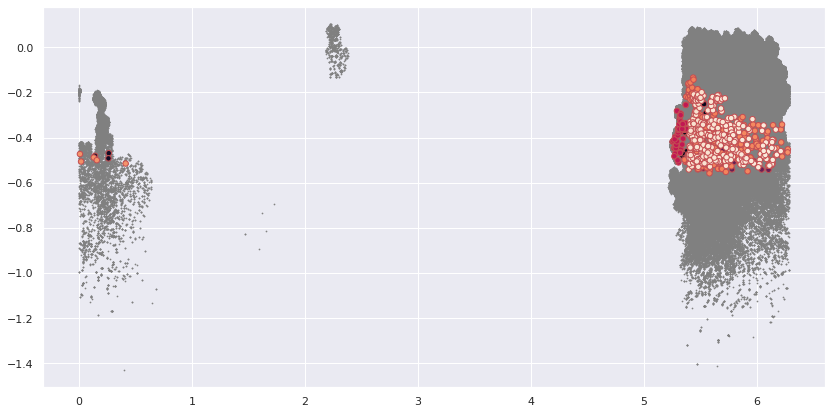

In [32]:
plt.figure(figsize=(14,7))
plt.subplot(111)

#plt.scatter(l_eq_gal, b_eq_gal, s=4, marker='v', label='Celestial Equator')
plt.scatter(np.deg2rad(dfinsel['AstRA(deg)'].values),np.deg2rad(dfinsel['AstDec(deg)'].values), s=0.5, label='Solar System Objects', c='gray')
plt.scatter(np.deg2rad(afdf['4'].values), np.deg2rad(afdf['5'].values), s=30, label='Affected Solar System Objects', c=times, edgecolors='r')


<AxesSubplot:>

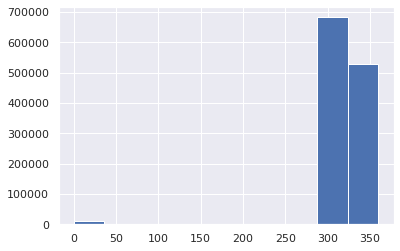

In [164]:
dfinsel['AstRA(deg)'].hist()

In [165]:
afdf[4].values

array([308.07022427, 308.76753925, 314.33830231, 318.80802135,
       309.55428062, 305.94849916, 306.08298624, 307.06830346,
       311.13527737, 316.49616546, 314.86131871, 317.55298573,
       316.44990649, 315.67517853, 315.36883028, 317.26249647,
       315.93239805, 319.79075208, 319.715049  , 311.23714305,
       312.31436857, 320.66877376, 318.83088594, 319.87979501,
       322.27539555, 322.65562277, 323.10633582, 326.49364655,
       322.90779199, 322.16891145, 309.97653207, 311.39856002,
       312.91071774, 312.96746594, 317.78960723, 316.86036725,
       316.946897  , 321.20333106, 323.6700787 , 325.79390769,
       324.3451075 , 328.29038678,   8.15571072,  15.17208825,
        15.01757156, 317.73525812, 327.97510803, 326.32513385,
       324.58332893, 325.64162738, 332.82091527, 310.6119648 ,
       313.37655472, 314.80745489, 318.20993944, 319.52001562,
       321.8805133 , 321.75374413, 329.79809482, 331.99801777,
       330.82730678, 332.03709617, 331.09567316, 314.26

In [166]:
lon_all

array([1.09820028, 1.08219792, 1.10313641, ..., 0.38569706, 0.38014649,
       0.37667491])

In [49]:
afdf['6'][0]

'SatID                                             starV2 25862\nTLELine1     1 25862U 20001A   23274.00000000  .00000000  0...\nTLELine2     2 25862  96.9000 192.0000 0001000   0.0000 557...\nSatNumber                                                17862\nName: 17862, dtype: object'

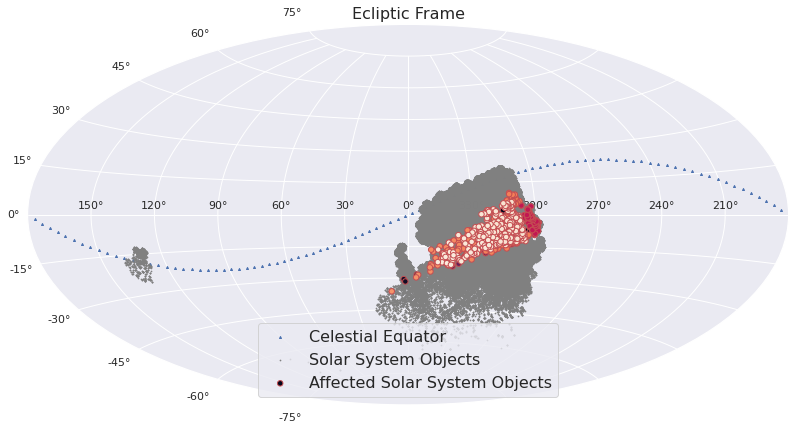

In [36]:
import numpy as np
from astropy.coordinates import SkyCoord
import astropy.units as u
import matplotlib.pyplot as plt
import seaborn as sns

#times=[int(i.mjd) for i in afdf[0].values]
times= afdf['0'].values
sns.set()

def eq2ecl(ra, dec):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    ecl = eq.barycentricmeanecliptic

    # Minus appears because of “mapping from the inside” issue
    lon_ecl, lat_ecl = -ecl.lon.wrap_at('180d').radian, ecl.lat.radian
    
    return lon_ecl, lat_ecl

def ecl2eq(lon_ecl, lat_ecl):
    
    '''
    Transforms ecliptic coordinates to galactic ones.
    Then prepares them for matplotlib aitoff projection.
    '''
    
    ecl = SkyCoord(lon_ecl, lat_ecl, unit=u.deg, frame='barycentricmeanecliptic')
    equ = ecl.icrs

    # Minus appears because of “mapping from the inside” issue
    ra, dec = -equ.ra.wrap_at('180d').radian, equ.dec.radian
    
    return ra, dec

# Equatorial plane
ra_all = np.linspace(-180, 180, 100)
dec_0 = np.zeros(100)

lon_eq, lat_eq = eq2ecl(ra_all, dec_0)

# # Ecliptic plane
# lon_ecl = np.linspace(0, 360, 100)
# lat_ecl = np.zeros(100)

lon_all, lat_all  = eq2ecl(dfinsel['AstRA(deg)'], dfinsel['AstDec(deg)'])
lon_aff, lat_aff  = eq2ecl(afdf['4'], afdf['5'])

plt.figure(figsize=(14,7))
plt.subplot(111, projection='aitoff')

#plt.scatter(l_eq_gal, b_eq_gal, s=4, marker='v', label='Celestial Equator')
plt.scatter(lon_eq, lat_eq, s=4, marker='^', label='Celestial Equator')

plt.scatter(lon_all, lat_all , s=0.5, label='Solar System Objects', c='gray')
plt.scatter(lon_aff, lat_aff, s=30, label='Affected Solar System Objects', c=times, edgecolors='r')
# Essential thing is to rename RA axis ticks to transform them to conventional format
plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°'])


plt.grid(True)
plt.legend(fontsize=16, loc='lower center')

plt.title('Ecliptic Frame', fontsize='16')

plt.show()

/tmp/ipykernel_219327/2211040072.py:117: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.pcolormesh(X,Y,-np.cos(X))


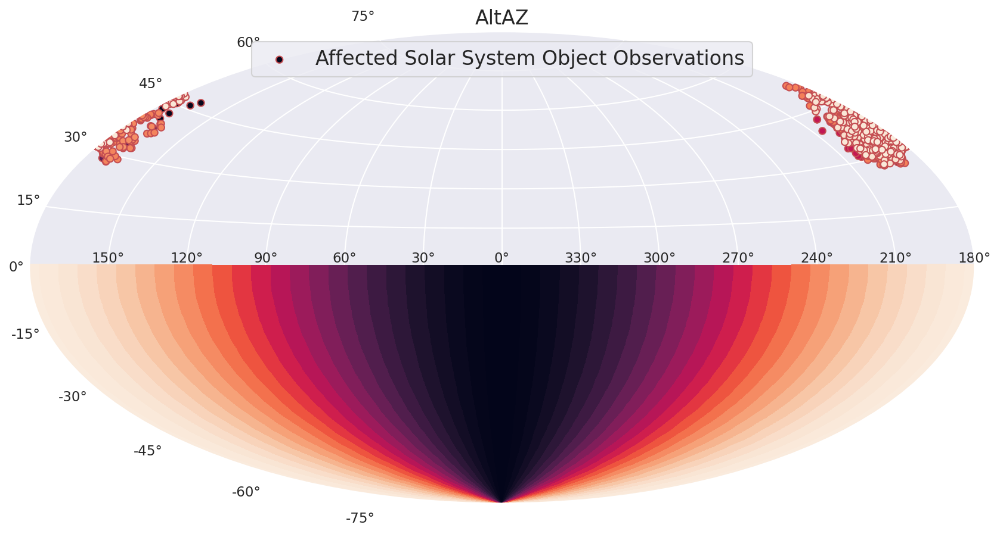

In [57]:
import numpy as np
from astropy.coordinates import AltAz, EarthLocation, SkyCoord, get_sun, angular_separation
import astropy.units as u
import matplotlib.pyplot as plt
import seaborn as sns

#times=[int(i.mjd) for i in afdf[0].values]
times= afdf['0'].values

sun_pos = get_sun(Time(times,format='mjd'))



sns.set()

def eq2eq(ra, dec):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    equ = eq.icrs

    # Minus appears because of “mapping from the inside” issue
    ra, dec = -equ.ra.wrap_at('180d').radian, equ.dec.radian
    
    return ra, dec


def eq2ecl(ra, dec):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    ecl = eq.barycentricmeanecliptic

    # Minus appears because of “mapping from the inside” issue
    lon_ecl, lat_ecl = -ecl.lon.wrap_at('180d').radian, ecl.lat.radian
    
    return lon_ecl, lat_ecl

def ecl2eq(lon_ecl, lat_ecl):
    
    '''
    Transforms ecliptic coordinates to galactic ones.
    Then prepares them for matplotlib aitoff projection.
    '''
    
    ecl = SkyCoord(lon_ecl, lat_ecl, unit=u.deg, frame='barycentricmeanecliptic')
    equ = ecl.icrs

    # Minus appears because of “mapping from the inside” issue
    ra, dec = -equ.ra.wrap_at('180d').radian, equ.dec.radian
    
    return ra, dec

def eq2altaz(ra, dec, time):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    #lsst_correct = EarthLocation(lat=-30.24506*u.deg, lon=-70.74913*u.deg, height=2663*u.m)
    lsst = EarthLocation(lat=-30.24506*u.deg, lon=70.74913*u.deg, height=2663*u.m)
    eq = SkyCoord(ra, dec, unit=u.deg)
    # topo = eq.altaz
    altaz = eq.transform_to(AltAz(obstime=time,location=lsst))
    # Minus appears because of “mapping from the inside” issue
    az, alt = -altaz.az.wrap_at('180d').radian, altaz.alt.radian
    
    return az, alt

# Equatorial plane
ra_all = np.linspace(-180, 180, 100)
dec_0 = np.zeros(100)

# az_eq, alt_gal = eq2altaz(ra_all, dec_0)

az,alt=eq2altaz(afdf['4'][0:1000], afdf['5'][0:1000], Time(afdf['0'][0:1000],format='mjd'))

# # Ecliptic plane
# lon_ecl = np.linspace(0, 360, 100)
# lat_ecl = np.zeros(100)

# l_ecl_gal, b_ecl_gal = ecl2eq(lon_ecl, lat_ecl)


# ra_sso, dec_sso = eq2eq(dfinsel['AstRA(deg)'].values,dfinsel['AstDec(deg)'].values)
# ra_aff, dec_aff = eq2eq(afdf[4].values,afdf[5].values)

plt.figure(figsize=(14,7), dpi=150)
plt.subplot(111, projection='aitoff')

# Correct! 
# plt.scatter(az, alt, s=30, label='Affected Solar System Objects', c=times[0:100], edgecolors='r')

# Due to wrong positon of LSST
plt.scatter(az, -alt, s=30, label='Affected Solar System Object Observations', c=times[0:1000], edgecolors='r')

# Essential thing is to rename RA axis ticks to transform them to conventional format
plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150, 180]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°','180°'])


x = np.linspace(-np.pi,np.pi)
y = np.linspace(-np.pi/2,0)
X,Y = np.meshgrid(x,y)

# plt.subplot(111, projection="aitoff")
plt.pcolormesh(X,Y,-np.cos(X))

plt.grid(True)
plt.legend(fontsize=16, loc='upper center')
plt.title('AltAZ', fontsize='16')

# plt.pause(0.5)  # without theses pauses the ticks are not displayed at all, not sure why
# ax = plt.gca()
# ax.set_ylim(0, 90)  # flip xticklabels
# plt.pause(0.5) # without theses pauses the ticks are not displayed at all, not sure why
plt.show()



plt.show()

/tmp/ipykernel_11418/43175883.py:130: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.pcolormesh(X,Y,-np.cos(X), cmap='inferno')


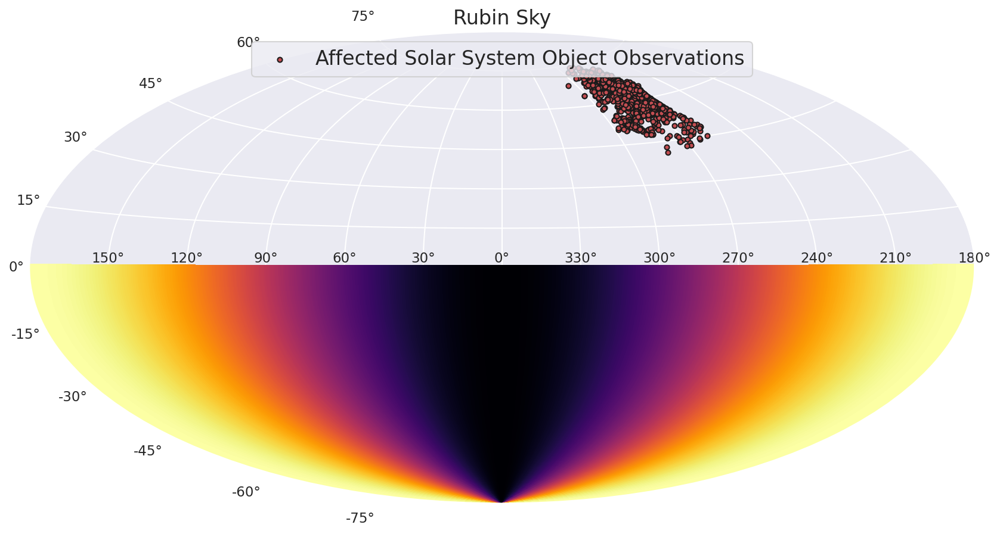

In [147]:
import numpy as np
from astropy.coordinates import AltAz, EarthLocation, SkyCoord, get_sun, angular_separation
import astropy.units as u
import matplotlib.pyplot as plt
import seaborn as sns

#times=[int(i.mjd) for i in afdf[0].values]
times= afdf['0'].values

sun_pos = get_sun(Time(times,format='mjd'))



sns.set()

def eq2eq(ra, dec):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    equ = eq.icrs

    # Minus appears because of “mapping from the inside” issue
    ra, dec = -equ.ra.wrap_at('180d').radian, equ.dec.radian
    
    return ra, dec


def eq2ecl(ra, dec):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    
    eq = SkyCoord(ra, dec, unit=u.deg)
    ecl = eq.barycentricmeanecliptic

    # Minus appears because of “mapping from the inside” issue
    lon_ecl, lat_ecl = -ecl.lon.wrap_at('180d').radian, ecl.lat.radian
    
    return lon_ecl, lat_ecl

def ecl2eq(lon_ecl, lat_ecl):
    
    '''
    Transforms ecliptic coordinates to galactic ones.
    Then prepares them for matplotlib aitoff projection.
    '''
    
    ecl = SkyCoord(lon_ecl, lat_ecl, unit=u.deg, frame='barycentricmeanecliptic')
    equ = ecl.icrs

    # Minus appears because of “mapping from the inside” issue
    ra, dec = -equ.ra.wrap_at('180d').radian, equ.dec.radian
    
    return ra, dec

def eq2altaz(ra, dec, time):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    #lsst_correct = EarthLocation(lat=-30.24506*u.deg, lon=-70.74913*u.deg, height=2663*u.m)
    #lsst = EarthLocation(lat=-30.24506*u.deg, lon=70.74913*u.deg, height=2663*u.m)
    lsst = EarthLocation(lat=-30.24506*u.deg, lon=-70.74913*u.deg, height=2663*u.m)
    eq = SkyCoord(ra, dec, unit=u.deg)
    # topo = eq.altaz
    altaz = eq.transform_to(AltAz(obstime=time,location=lsst))
    # Minus appears because of “mapping from the inside” issue
    az, alt = -altaz.az.wrap_at('180d').radian, altaz.alt.radian
    
    return az, alt

# Equatorial plane
ra_all = np.linspace(-180, 180, 100)
dec_0 = np.zeros(100)

# az_eq, alt_gal = eq2altaz(ra_all, dec_0)

az,alt=eq2altaz(afdf['4'][0:1000], afdf['5'][0:1000], Time(afdf['0'][0:1000],format='mjd'))

# # Ecliptic plane
# lon_ecl = np.linspace(0, 360, 100)
# lat_ecl = np.zeros(100)

# l_ecl_gal, b_ecl_gal = ecl2eq(lon_ecl, lat_ecl)


# ra_sso, dec_sso = eq2eq(dfinsel['AstRA(deg)'].values,dfinsel['AstDec(deg)'].values)
# ra_aff, dec_aff = eq2eq(afdf[4].values,afdf[5].values)

plt.figure(figsize=(14,7), dpi=150)
plt.subplot(111, projection='aitoff')

# Correct! 
# plt.scatter(az, alt, s=30, label='Affected Solar System Objects', c=times[0:100], edgecolors='r')

# Due to wrong positon of LSST
plt.scatter(az, alt, s=15, label='Affected Solar System Object Observations', c='r', edgecolors='k')

# Essential thing is to rename RA axis ticks to transform them to conventional format
plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150, 180]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°','180°'])


x = np.linspace(-np.pi,np.pi,10000)
y = np.linspace(-np.pi/2,0)
X,Y = np.meshgrid(x,y, indexing='ij')

# Z=np.zeros((len(x),len(y)))
# for i in range(len(x)):
#     for j in range(len(y)):
#         if (abs(np.pi-abs(x[i]))<(np.deg2rad(22))):
#             Z[i,j]=np.cos(abs(np.pi/2*x[i]/np.deg2rad(22)))
#         else:
#             Z[i,j]=0
# plt.subplot(111, projection="aitoff")
x = np.linspace(-np.pi,np.pi,1000)
y = np.linspace(-np.pi/2,0)
X,Y = np.meshgrid(x,y)

# plt.subplot(111, projection="aitoff")
plt.pcolormesh(X,Y,-np.cos(X), cmap='inferno')

# plt.pcolormesh(X,Y,Z, cmap='inferno')

plt.grid(True)
plt.legend(fontsize=16, loc='upper center')
plt.title('Rubin Sky', fontsize='16')

# plt.pause(0.5)  # without theses pauses the ticks are not displayed at all, not sure why
# ax = plt.gca()
# ax.set_ylim(0, 90)  # flip xticklabels
# plt.pause(0.5) # without theses pauses the ticks are not displayed at all, not sure why
plt.show()

In [135]:
dfneo

,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),...,AstrometricSigma(mas),PhotometricSigma(mag),SNR,AstrometricSigma(deg),MaginFilter,dmagDetect,dmagVignet,AstRATrue(deg),AstDecTrue(deg),detectorID
24,S0000suBa,58.0,60218.029783,3.967356e+07,-10.958573,5.462000,-0.132202,-64.744442,-0.169063,1.654548e+08,...,126.534819,0.175662,5.694286,0.000035,22.834082,0.007835,0.002633,5.462052,-64.744460,43
670,S0000Cyma,132.0,60218.064465,1.802780e+07,2.144554,12.665730,-0.282656,-29.421732,3.036232,1.639134e+08,...,54.266361,0.058888,17.941772,0.000015,20.860370,0.660638,0.000492,12.665730,-29.421743,128
719,S0000EbWa,171.0,60218.083277,3.042819e+07,0.889766,8.953192,-0.098218,-28.386828,-1.028819,1.750295e+08,...,142.333291,0.157324,6.413341,0.000040,22.206273,0.143658,0.058542,8.953106,-28.386846,178
671,S0000Cyma,182.0,60218.088208,1.803225e+07,2.196045,12.658898,-0.295993,-29.349609,3.040715,1.639202e+08,...,151.528451,0.095443,10.883075,0.000042,20.991578,0.321846,-0.000000,12.658857,-29.349603,128
672,S0000Cyma,541.0,60218.280383,1.807297e+07,2.721038,12.597704,-0.311058,-28.760543,3.090709,1.639741e+08,...,40.188899,0.048460,21.908720,0.000011,20.907153,0.766229,-0.000000,12.597683,-28.760541,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,S0000B7Ia,19257.0,60244.185149,2.569387e+07,-1.132456,346.707205,0.082069,-35.386225,0.292819,1.448642e+08,...,47.986541,0.115725,8.890939,0.000013,22.099658,0.062594,0.003113,346.707213,-35.386235,147
729,S0000GrCa,19667.0,60246.012073,2.775163e+07,-2.026630,345.443698,0.981761,-9.788212,0.440592,1.482377e+08,...,37.072285,0.101545,10.199928,0.000010,22.307437,0.596517,0.008543,345.443700,-9.788205,104
47,S0000sB2a,19698.0,60246.027129,2.258467e+07,-5.714872,63.703249,0.674098,-67.454355,-0.509958,1.255816e+08,...,64.378581,0.141890,7.162857,0.000018,22.318134,0.171326,0.012102,63.703282,-67.454356,45
48,S0000sB2a,19748.0,60246.051903,2.257244e+07,-5.713049,63.719549,0.639594,-67.466971,-0.508823,1.255379e+08,...,42.840164,0.100428,10.318774,0.000012,22.324525,0.185233,0.012602,63.719553,-67.466980,15


In [149]:
month=Time(60218.029783, format='mjd', scale='utc')

In [150]:
month.isot

'2023-10-01T00:42:53.251'

/tmp/ipykernel_11418/2994102808.py:64: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.pcolormesh(X,Y,Z, cmap='inferno')


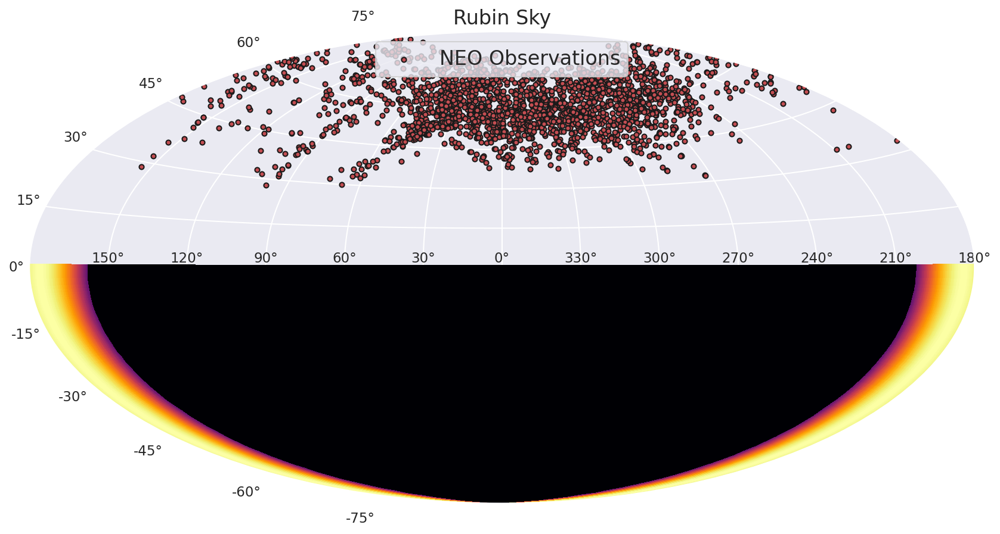

In [139]:
# az_eq, alt_gal = eq2altaz(ra_all, dec_0)
def eq2altaz(ra, dec, time):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    #lsst_correct = EarthLocation(lat=-30.24506*u.deg, lon=-70.74913*u.deg, height=2663*u.m)
    #lsst = EarthLocation(lat=-30.24506*u.deg, lon=70.74913*u.deg, height=2663*u.m)
    lsst = EarthLocation(lat=-30.24506*u.deg, lon=-70.74913*u.deg, height=2663*u.m)
    eq = SkyCoord(ra, dec, unit=u.deg)
    # topo = eq.altaz
    altaz = eq.transform_to(AltAz(obstime=time,location=lsst))
    # Minus appears because of “mapping from the inside” issue
    az, alt = -altaz.az.wrap_at('180d').radian, altaz.alt.radian
    
    return az, alt

# Equatorial plane
ra_all = np.linspace(-180, 180, 100)
dec_0 = np.zeros(100)


az,alt=eq2altaz(dfneo['AstRA(deg)'][0:10000], dfneo['AstDec(deg)'][0:10000], Time(dfneo['FieldMJD'][0:10000],format='mjd'))

# # Ecliptic plane
# lon_ecl = np.linspace(0, 360, 100)
# lat_ecl = np.zeros(100)

# l_ecl_gal, b_ecl_gal = ecl2eq(lon_ecl, lat_ecl)


# ra_sso, dec_sso = eq2eq(dfinsel['AstRA(deg)'].values,dfinsel['AstDec(deg)'].values)
# ra_aff, dec_aff = eq2eq(afdf[4].values,afdf[5].values)

plt.figure(figsize=(14,7), dpi=150)
plt.subplot(111, projection='aitoff')

# Correct! 
# plt.scatter(az, alt, s=30, label='Affected Solar System Objects', c=times[0:100], edgecolors='r')

# Due to wrong positon of LSST
plt.scatter(az, alt, s=15, label='NEO Observations', c='r', edgecolors='k')

# Essential thing is to rename RA axis ticks to transform them to conventional format
plt.xticks(ticks=np.radians([-150, -120, -90, -60, -30, 0, \
                             30, 60, 90, 120, 150, 180]),
           labels=['150°', '120°', '90°', '60°', '30°', '0°', \
                   '330°', '300°', '270°', '240°', '210°','180°'])


x = np.linspace(-np.pi,np.pi,1000)
y = np.linspace(-np.pi/2,0)
X,Y = np.meshgrid(x,y, indexing='ij')

Z=np.zeros((len(x),len(y)))
for i in range(len(x)):
    for j in range(len(y)):
        if (abs(np.pi-abs(x[i]))<(np.deg2rad(22))):
            Z[i,j]=np.cos(abs(np.pi/2*x[i]/np.deg2rad(22)))
        else:
            Z[i,j]=0
# plt.subplot(111, projection="aitoff")
plt.pcolormesh(X,Y,Z, cmap='inferno')

plt.grid(True)
plt.legend(fontsize=16, loc='upper center')
plt.title('Rubin Sky', fontsize='16')

# plt.pause(0.5)  # without theses pauses the ticks are not displayed at all, not sure why
# ax = plt.gca()
# ax.set_ylim(0, 90)  # flip xticklabels
# plt.pause(0.5) # without theses pauses the ticks are not displayed at all, not sure why
plt.show()

In [61]:
sun_pos.icrs

<SkyCoord (ICRS): (ra, dec, distance) in (deg, deg, AU)
    [(194.20729444, -4.54347312, 0.00866998),
     (194.20748909, -4.54355373, 0.00866997),
     (194.20751277, -4.54356353, 0.00866997),
     (194.20765904, -4.54362411, 0.00866997),
     (194.20848912, -4.54396787, 0.00866994),
     (194.20851285, -4.54397769, 0.00866994),
     (194.20851285, -4.54397769, 0.00866994),
     (194.20865947, -4.54403841, 0.00866993),
     (194.20870693, -4.54405807, 0.00866993),
     (194.20882752, -4.54410801, 0.00866992),
     (194.20882752, -4.54410801, 0.00866992),
     (194.20882752, -4.54410801, 0.00866992),
     (194.20890293, -4.54413924, 0.00866992),
     (194.20890293, -4.54413924, 0.00866992),
     (194.20890293, -4.54413924, 0.00866992),
     (194.20890293, -4.54413924, 0.00866992),
     (194.20892748, -4.5441494 , 0.00866992),
     (194.20910067, -4.54422113, 0.00866992),
     (194.20912445, -4.54423097, 0.00866991),
     (194.20926864, -4.54429069, 0.00866991),
     (194.20931607, -4.5

In [69]:
times

array([60218.10590972, 60218.10959455, 60218.11004276, 60218.11281178,
       60218.12852571, 60218.12897479, 60218.12897479, 60218.13175045,
       60218.13264884, 60218.13493179, 60218.13493179, 60218.13493179,
       60218.13635937, 60218.13635937, 60218.13635937, 60218.13635937,
       60218.13682404, 60218.14010267, 60218.14055277, 60218.14328241,
       60218.14418033, 60218.14777252, 60218.14822158, 60218.14868601,
       60218.14868601, 60218.14913589, 60218.15050697, 60218.15141358,
       60218.16324107, 60218.16413884, 60218.16685145, 60218.16730025,
       60218.16774903, 60218.16774903, 60218.16864419, 60218.16909052,
       60218.16909052, 60218.17224461, 60218.17269393, 60218.17361173,
       60218.17361173, 60218.17451432, 60218.26823961, 60218.29000086,
       60218.29000086, 60219.12024295, 60219.13813149, 60219.1394847 ,
       60219.1394847 , 60219.14038333, 60219.144292  , 60219.15449608,
       60219.15539224, 60219.15673335, 60219.1585306 , 60219.15897891,
      

In [71]:
solar_elongation=np.rad2deg(angular_separation(afdf['4'].values,afdf['5'].values,sun_pos.icrs.ra.deg,sun_pos.icrs.dec.deg))

In [72]:
solar_elongation

array([167.09323722,  89.28914873,  34.01809531, 112.01879595,
        65.96803898, 131.86473428, 163.29861322, 106.28077258,
       150.01778884,   3.64222329,  76.27760944,  95.02734879,
        96.90513197,   8.38160559,  84.33633104,  26.69172384,
        16.71909129,  35.57541629, 104.55719462,  89.90339419,
        37.61968227, 137.43869317, 108.39334944, 143.89143629,
       155.71641925,  86.35518838, 138.64028972,  28.3772941 ,
        34.50879642, 117.58749333,  11.73341303, 110.03347918,
        63.60691722,  34.89381448,  39.2452081 , 172.12673503,
       174.08131802, 136.40469354,  48.67528535, 154.36905123,
        95.75991553,  81.81980178, 138.46269868, 179.59429658,
       104.72045133,  24.62306574, 171.5413175 , 161.02029791,
       170.13851966,  94.36729012, 165.24276868,  14.0674353 ,
        59.93245291, 164.1109466 ,  68.85829866, 174.74154828,
        38.09717068,  93.81168929, 176.40402476, 157.52829332,
       170.83125381,  34.42279529,  66.25293368,  10.53

(array([83., 75., 92., 88., 73., 93., 85., 93., 92., 89.]),
 array([  0.74077068,  18.62612327,  36.51147586,  54.39682845,
         72.28218104,  90.16753363, 108.05288622, 125.93823881,
        143.8235914 , 161.70894399, 179.59429658]),
 <BarContainer object of 10 artists>)

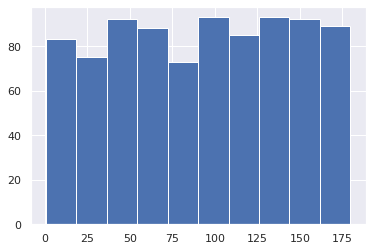

In [73]:
plt.hist(solar_elongation)

In [115]:
dfinsel2=dfinsel[("S0" in dfinsel['ObjID'].values)]

KeyError: False

In [117]:
( in )

False

In [127]:
testlist=dfinsel['ObjID'].values



In [132]:
dfneo = dfin[dfin['ObjID'].str.slice(0, 2)=='S0']

In [133]:
dfneo

,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),...,AstrometricSigma(mas),PhotometricSigma(mag),SNR,AstrometricSigma(deg),MaginFilter,dmagDetect,dmagVignet,AstRATrue(deg),AstDecTrue(deg),detectorID
24,S0000suBa,58.0,60218.029783,3.967356e+07,-10.958573,5.462000,-0.132202,-64.744442,-0.169063,1.654548e+08,...,126.534819,0.175662,5.694286,0.000035,22.834082,0.007835,0.002633,5.462052,-64.744460,43
670,S0000Cyma,132.0,60218.064465,1.802780e+07,2.144554,12.665730,-0.282656,-29.421732,3.036232,1.639134e+08,...,54.266361,0.058888,17.941772,0.000015,20.860370,0.660638,0.000492,12.665730,-29.421743,128
719,S0000EbWa,171.0,60218.083277,3.042819e+07,0.889766,8.953192,-0.098218,-28.386828,-1.028819,1.750295e+08,...,142.333291,0.157324,6.413341,0.000040,22.206273,0.143658,0.058542,8.953106,-28.386846,178
671,S0000Cyma,182.0,60218.088208,1.803225e+07,2.196045,12.658898,-0.295993,-29.349609,3.040715,1.639202e+08,...,151.528451,0.095443,10.883075,0.000042,20.991578,0.321846,-0.000000,12.658857,-29.349603,128
672,S0000Cyma,541.0,60218.280383,1.807297e+07,2.721038,12.597704,-0.311058,-28.760543,3.090709,1.639741e+08,...,40.188899,0.048460,21.908720,0.000011,20.907153,0.766229,-0.000000,12.597683,-28.760541,94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,S0000B7Ia,19257.0,60244.185149,2.569387e+07,-1.132456,346.707205,0.082069,-35.386225,0.292819,1.448642e+08,...,47.986541,0.115725,8.890939,0.000013,22.099658,0.062594,0.003113,346.707213,-35.386235,147
729,S0000GrCa,19667.0,60246.012073,2.775163e+07,-2.026630,345.443698,0.981761,-9.788212,0.440592,1.482377e+08,...,37.072285,0.101545,10.199928,0.000010,22.307437,0.596517,0.008543,345.443700,-9.788205,104
47,S0000sB2a,19698.0,60246.027129,2.258467e+07,-5.714872,63.703249,0.674098,-67.454355,-0.509958,1.255816e+08,...,64.378581,0.141890,7.162857,0.000018,22.318134,0.171326,0.012102,63.703282,-67.454356,45
48,S0000sB2a,19748.0,60246.051903,2.257244e+07,-5.713049,63.719549,0.639594,-67.466971,-0.508823,1.255379e+08,...,42.840164,0.100428,10.318774,0.000012,22.324525,0.185233,0.012602,63.719553,-67.466980,15


In [129]:
res = [i for i in testlist if i[0:2]=="S0"]

In [130]:
res

['S0000suBa',
 'S0000Cyma',
 'S0000EbWa',
 'S0000Cyma',
 'S0000Cyma',
 'S0000ARRa',
 'S0000ARRa',
 'S0000ARRa',
 'S0000RgIa',
 'S0000RgIa',
 'S0000IvNa',
 'S0000zK4a',
 'S0000Ll8a',
 'S0000y6xa',
 'S0000y6xa',
 'S0000ARRa',
 'S0000tara',
 'S0000Ll8a',
 'S0000y6xa',
 'S0000ARRa',
 'S0000y6xa',
 'S0000y0oa',
 'S0000ARRa',
 'S0000y6xa',
 'S0000DHsa',
 'S0000zK4a',
 'S0000Ll8a',
 'S0000y6xa',
 'S0000ARRa',
 'S0000Llba',
 'S0000EXBa',
 'S0000EXBa',
 'S0000ta0a',
 'S00018ICa',
 'S0000zF7a',
 'S0000BG3a',
 'S0000EXBa',
 'S0000Llba',
 'S0000EXBa',
 'S0000ta0a',
 'S00018ICa',
 'S0000BG3a',
 'S00018ICa',
 'S0000BG3a',
 'S00018ICa',
 'S0000skha',
 'S0000skha',
 'S0000zK4a',
 'S0000GLsa',
 'S0000skha',
 'S0000CXNa',
 'S0000KuJa',
 'S0000KuJa',
 'S0000EQba',
 'S0000EQba',
 'S0000A0ra',
 'S0000Yg9a',
 'S0000RgIa',
 'S0000EXBa',
 'S0000Llba',
 'S0000skha',
 'S0000RgIa',
 'S0000RgIa',
 'S0000YrUa',
 'S0000YrUa',
 'S0000GN0a',
 'S0000zo3a',
 'S0000RgIa',
 'S0000Eesa',
 'S0000B7Ia',
 'S0000Eesa',
 'S000

In [118]:
dfinsel['ObjID'].values

array(['S1004uuMa', 'S1000GrNa', '2001RD17', ..., 'S100dr7ia',
       '2015XC470', 'S100e4v3a'], dtype=object)

In [121]:
dfinsel['ObjID'].values

array(['S1004uuMa', 'S1000GrNa', '2001RD17', ..., 'S100dr7ia',
       '2015XC470', 'S100e4v3a'], dtype=object)

In [ ]:
def eq2altaz(ra, dec, time):
    
    '''
    Transforms equatorial coordinates to ecliptic ones.
    Then prepares them for matplotlib aitoff projection. 
    '''
    lsst = EarthLocation(lat=-30.24506*u.deg, lon=-70.74913*u.deg, height=2663*u.m)
    eq = SkyCoord(ra, dec, unit=u.deg)
    # topo = eq.altaz
    altaz = eq.transform_to(AltAz(obstime=time,location=lsst))
    # Minus appears because of “mapping from the inside” issue
    az, alt = -altaz.az.wrap_at('180d').radian, altaz.alt.radian
    
    return az, alt

In [192]:
az,alt=eq2altaz(afdf[4][0:100], afdf[5][0:100], afdf[0][0:100])

In [193]:
az

array([1.53850825, 1.38331305, 1.38046093, 1.39015377, 1.67760771,
       1.66049912, 1.64137635, 1.48733349, 1.43142937, 1.46367699,
       1.5185096 , 1.50795473, 1.63358617, 1.69865277, 1.64449704,
       1.71074615, 1.70934803, 1.69916553, 1.60287142, 1.26371659,
       1.34725727, 1.33102927, 1.4212835 , 1.55455274, 1.55075232,
       1.39588668, 1.5941088 , 1.63765509, 1.69279521, 1.64844278,
       1.35964838, 1.37931943, 1.47901361, 1.43949217, 1.39163005,
       1.34642519, 1.35054199, 1.65971463, 1.50479766, 1.61689304,
       1.57433741, 1.65306942, 1.57011881, 1.55022629, 1.6047501 ,
       1.16684207, 1.18189065, 1.47352731, 1.51999499, 1.57071003,
       1.40859572, 1.75795104, 1.71383094, 1.4857043 , 1.69191434,
       1.62107667, 1.34660043, 1.66637922, 1.55681848, 1.51411583,
       1.54625004, 1.63818886, 1.72285538, 1.78155878, 1.8030988 ,
       1.79180484, 1.55534134, 1.53943792, 1.6820554 , 1.68553831,
       1.61960272, 1.70104737, 1.69141712, 1.73394824, 1.72457

In [147]:
afdf

,0,1,2,3,4,5,6,7,8,9
0,60218.10590972008,2.464314,S100gw3ia,216.0,308.070224,-26.388113,SatID ...,"[0.5904852487908964, -0.6846615195229402, -0.4...","[0.5436883082261651, -0.7096096161475978, -0.4...","[0.5523767754956455, -0.7052266859573928, -0.4..."
1,60218.10959454888,2.381938,2005XU32,224.0,308.767539,-21.985347,SatID ...,"[0.5963423839853501, -0.7172115557865897, -0.3...","[0.5624653677601109, -0.7291272262704287, -0.3...","[0.5806274337117012, -0.7229932882259343, -0.3..."
2,60218.11004276185,1.927468,S1009PW1a,225.0,314.338302,-24.021737,SatID ...,"[0.6529217474963946, -0.6442858000237061, -0.3...","[0.6105298907981869, -0.6694208651165899, -0.4...","[0.6383631559465284, -0.653280760672168, -0.40..."
3,60218.11281178092,2.173583,S1005d7oa,231.0,318.808021,-25.438864,SatID ...,"[0.6490462781367958, -0.6045731985081371, -0.4...","[0.6827366500485874, -0.5935937706054132, -0.4...","[0.6795471395276578, -0.5947305241562353, -0.4..."
4,60218.12852570867,0.893991,S1001nDaa,265.0,309.554281,-28.803829,SatID ...,"[0.579809644071772, -0.6440549265125167, -0.49...","[0.5535258976025574, -0.6818257252893596, -0.4...","[0.5580194341749316, -0.67562657987849, -0.481..."
...,...,...,...,...,...,...,...,...,...,...
858,60222.22707655544,2.368643,S1011HXna,3254.0,347.276303,-27.618898,SatID ...,"[0.8720453717940144, -0.17795289184988938, -0....","[0.8509486568050456, -0.22285647630721897, -0....","[0.8642924478819534, -0.19515236421974994, -0...."
859,60222.22707655544,2.960205,S102da94a,3254.0,347.978015,-27.328589,SatID ...,"[0.8720453717940144, -0.17795289184988938, -0....","[0.8509486568050456, -0.22285647630721897, -0....","[0.8689039153801302, -0.18503972686994352, -0...."
860,60222.227535413505,0.842153,S100eNs7a,3255.0,347.166637,-26.294409,SatID ...,"[0.8728879026047219, -0.19394262993309289, -0....","[0.879653356221962, -0.22462871877976542, -0.4...","[0.8741345118326502, -0.1991338404172697, -0.4..."
861,60222.22799292547,1.168588,S100iJO6a,3256.0,347.136098,-19.820015,SatID ...,"[0.923173810219585, -0.20416549364607856, -0.3...","[0.9081481236987328, -0.21692568020021386, -0....","[0.9171508020883543, -0.2094475265259488, -0.3..."


In [227]:
nMBA=0
for index, row in afdf.iterrows():
    name = row[2]
    if (name[0:2]=='S1'):
        nMBA=nMBA+1
    else:
        print(name)

2005XU32
2016GE41
2002GO155
2014YE21
St50007va
2014UE227
2016PW33
2006KQ13
1998BZ42
2001SV11
2010GH83
2019QU31
2003WB71
2015OP145
2016GT285
2000HZ100
2015BN214
STC001IOa
2007RW166
STC00aJHa
St5004Mxa
2005EM156
2008WY47
2002RW45
2014MM32
2007ES148
2014WL582
2016GN170
2007EG231
2010HW140
St5001cNa
2019JS27
2018VC78
2006UT6
2018VL25
2015OP164
2015OL119
St5000Cpa
2017XV49
1999UX42
2000SW33
2019PG57
St50032ua
2011DD47
2015TY299
2015CF74
2013YC92
St500psza
2012HT18
2014WP306
2017YY35
2001SO142
1999FS71
2008VH69
St5009rRa
2007TV468
2004FD176
2019SX43
St5001Fga
St500bDfa
2021DM10
St5006EQa
2002EJ111
2015CT67
2017FF55
St5008fZa
2000CB150
2011BS153
1981DQ2
1999VW70
St500edSa
2007RE192
St500g0Ra
2010OC87
2018UO21
2001TZ268
2017UR115
2014QT351
2014AP60
4022T-3
2014RU79
2011AS101
St500BLNa
2016EQ290
2007UK149
St500pdNa
St5001lDa
St500gIca
St5001Dsa
St500jrja
St5002eTa
St5006aJa
St50000aa
2014WA140
St5005SSa
1990UK5
2019PT12
St50007Ha
CEN09492
St500b6Ya
2015AH157
2015TK449
2015BM300
St5002Nna
2003AL

In [229]:
nTroj=0
for index, row in afdf.iterrows():
    name = row[2]
    if (name[0:2]=='St' or name[0:2]=='ST'):
        nTroj=nTroj+1
    else:
        print(name)

S100gw3ia
2005XU32
S1009PW1a
S1005d7oa
S1001nDaa
S100bKWka
S1003vHca
2016GE41
S100bx9aa
S1005g4Sa
2002GO155
S1001YWua
S1000mMqa
2014YE21
2014UE227
2016PW33
2006KQ13
1998BZ42
S1006v6Wa
2001SV11
2010GH83
S1007SNGa
2019QU31
S100oSXea
2003WB71
S100eahma
2015OP145
2016GT285
2000HZ100
S10041lma
2015BN214
S1005G8Ra
S1006nu0a
2007RW166
S100abFFa
S100bvToa
S1003tFla
S100qf66a
S100EhyZa
S10007eYa
S100tYLqa
S100bacHa
S100dzsaa
S100p4xNa
S100i2TJa
2005EM156
S1007CCKa
2008WY47
S1003arGa
2002RW45
S100qwy7a
2014MM32
2007ES148
2014WL582
2016GN170
2007EG231
2010HW140
S100wNRQa
2019JS27
S1007G0ba
S100h3RCa
S1002eW9a
S1007QZYa
S100bBkra
S100vaVta
2018VC78
S100yXBTa
2006UT6
2018VL25
2015OP164
S1006hoCa
S100nNHca
2015OL119
S10052S6a
S1005jm2a
S100hCGRa
S100rNRja
S100dlmDa
S100ppvsa
S100pV9ga
S101bMTIa
S10188uha
S10159Xza
S1007X8za
S100eyC3a
2017XV49
1999UX42
S10137zja
2000SW33
S100ae8xa
S1001o7Sa
S100fNZMa
S1000mZYa
S1007LEQa
S10196Mya
2019PG57
2011DD47
S1005O7ma
S100mbbqa
S1000WPZa
2015TY299
2015CF74
S100

In [257]:
nTroj

86

In [231]:
known_list=[]
for index, row in afdf.iterrows():
    name = row[2]
    if (name[0:2]=='St' or name[0:2]=='ST' or name[0:2]=='S1'):
        print(name)
    else:
        known_list.append(name)

S100gw3ia
S1009PW1a
S1005d7oa
S1001nDaa
S100bKWka
S1003vHca
S100bx9aa
S1005g4Sa
S1001YWua
S1000mMqa
St50007va
S1006v6Wa
S1007SNGa
S100oSXea
S100eahma
S10041lma
S1005G8Ra
STC001IOa
S1006nu0a
S100abFFa
S100bvToa
S1003tFla
S100qf66a
S100EhyZa
S10007eYa
S100tYLqa
S100bacHa
S100dzsaa
S100p4xNa
STC00aJHa
S100i2TJa
St5004Mxa
S1007CCKa
S1003arGa
S100qwy7a
St5001cNa
S100wNRQa
S1007G0ba
S100h3RCa
S1002eW9a
S1007QZYa
S100bBkra
S100vaVta
S100yXBTa
S1006hoCa
S100nNHca
S10052S6a
St5000Cpa
S1005jm2a
S100hCGRa
S100rNRja
S100dlmDa
S100ppvsa
S100pV9ga
S101bMTIa
S10188uha
S10159Xza
S1007X8za
S100eyC3a
S10137zja
S100ae8xa
S1001o7Sa
S100fNZMa
S1000mZYa
S1007LEQa
S10196Mya
St50032ua
S1005O7ma
S100mbbqa
S1000WPZa
S100dl9Xa
S100hYvka
S1004kEWa
S101sUOda
S1006iFqa
S100mk2Aa
S100jbZza
S100nwRya
St500psza
S10227L1a
S100Egsja
S10201Wpa
S100JWc8a
S100GIzda
S1012k1ha
S100odf3a
S100g4LZa
S100txq1a
S100DDjia
S100DdOua
St5009rRa
S10001BBa
S1008Rgga
S100Ha1Na
S100eHR5a
S101mBwAa
S100Ftl9a
S100oZTZa
S100mGHOa
S100ctCka


In [232]:
known_list


['2005XU32',
 '2016GE41',
 '2002GO155',
 '2014YE21',
 '2014UE227',
 '2016PW33',
 '2006KQ13',
 '1998BZ42',
 '2001SV11',
 '2010GH83',
 '2019QU31',
 '2003WB71',
 '2015OP145',
 '2016GT285',
 '2000HZ100',
 '2015BN214',
 '2007RW166',
 '2005EM156',
 '2008WY47',
 '2002RW45',
 '2014MM32',
 '2007ES148',
 '2014WL582',
 '2016GN170',
 '2007EG231',
 '2010HW140',
 '2019JS27',
 '2018VC78',
 '2006UT6',
 '2018VL25',
 '2015OP164',
 '2015OL119',
 '2017XV49',
 '1999UX42',
 '2000SW33',
 '2019PG57',
 '2011DD47',
 '2015TY299',
 '2015CF74',
 '2013YC92',
 '2012HT18',
 '2014WP306',
 '2017YY35',
 '2001SO142',
 '1999FS71',
 '2008VH69',
 '2007TV468',
 '2004FD176',
 '2019SX43',
 '2021DM10',
 '2002EJ111',
 '2015CT67',
 '2017FF55',
 '2000CB150',
 '2011BS153',
 '1981DQ2',
 '1999VW70',
 '2007RE192',
 '2010OC87',
 '2018UO21',
 '2001TZ268',
 '2017UR115',
 '2014QT351',
 '2014AP60',
 '4022T-3',
 '2014RU79',
 '2011AS101',
 '2016EQ290',
 '2007UK149',
 '2014WA140',
 '1990UK5',
 '2019PT12',
 'CEN09492',
 '2015AH157',
 '2015TK44

In [233]:
from astroquery.mpc import MPC


In [255]:
nNeo=0
for i in known_list:
    
    nme=i[0:4]+' '+i[4:]
    print(nme)
    result = MPC.query_object('asteroid', designation=i[0:4]+' '+i[4:])
    print(result)
    if (result):
        if (result[0]['neo']):
            nNeo=nNeo+1

2005 XU32
[{'absolute_magnitude': '18.3', 'aphelion_distance': '2.864', 'arc_length': 5514, 'argument_of_perihelion': '250.23142', 'ascending_node': '102.0040782', 'critical_list_numbered_object': False, 'delta_v': 8.7, 'designation': '2005 XU32', 'earth_moid': 0.93208, 'eccentricity': '0.1931171', 'epoch': '2020-05-31.0', 'epoch_jd': '2459000.5', 'first_observation_date_used': '2001-10-25.0', 'first_opposition_used': '2001', 'inclination': '2.70308', 'jupiter_moid': 2.55708, 'km_neo': False, 'last_observation_date_used': '2016-11-29.0', 'last_opposition_used': '2016', 'mars_moid': 0.54889, 'mean_anomaly': '24.13554', 'mean_daily_motion': '0.2650451', 'mercury_moid': 1.55706, 'name': None, 'neo': False, 'number': None, 'observations': 58, 'oppositions': 4, 'orbit_type': 0, 'orbit_uncertainty': '1', 'p_vector_x': '0.98980753', 'p_vector_y': '-0.10649958', 'p_vector_z': '-0.09454568', 'perihelion_date': '2020-02-29.93798', 'perihelion_date_jd': '2458909.43798', 'perihelion_distance': '1.

In [256]:
nNeo

0

In [253]:
result[0]['neo']

False

In [136]:
rortho=R1-np.dot(R1,sun_vector)/np.linalg.norm(sun_vector)*sun_vector/np.linalg.norm(sun_vector)

In [103]:
np.linalg.norm(rortho)

4492.998928421295

In [104]:
af3=affected

In [105]:
 
    


print("Number of objects affected: " + str(obj_count))
print()
print("Satellite times:")
print(str(sat_times))

print()
print("Right Ascension, SATELLITE:")
print(ra_vals)
print("Declination, SATELLITE")
print(dec_vals)
print()

print()
print("Right Ascension, OBJECTS:")
print(good_obj_ra)
print("Declination, OBJECTS")
print(good_obj_dec)
print()
                

NameError: name 'obj_count' is not defined

In [106]:
len(affected)

863

In [107]:
af2=affected

In [108]:
tminus = Time(59000,format='mjd',scale='utc')
tplus = Time(59003.5,format='mjd',scale='utc')
print((tminus-tplus)*86400,'timestuff')
print(tminus.jd)
# do a more thorrow analysis by propagating the satellite to +15 and -15 secs and check for cross track distance
R2,V2 = getSatelliteStates(tplus,ch[1],ch[2])
R1,V1 = getSatelliteStates(tminus,ch[1],ch[2])


-302400.0 timestuff
2459000.5


NameError: name 'ch' is not defined

In [109]:
print('R1, R2',np.array(R1),np.array(R2))
print('R1-R2',np.array(R1)-np.array(R2))

R1, R2 [ 5760.96010069 -3495.96508772   145.57642291] [ 5709.83483293 -3529.71813841   602.96372144]
R1-R2 [  51.12526776   33.75305069 -457.38729853]


In [ ]:
FOV_dist_lim = 3.5/180*np.pi #3 degrees distance to FOV for a satellite to be excluded
rearth = 6371
LSSTExpDays = 30/86400
distlim = 2/180/3600*np.pi # 3 arcsecond distance from satellite track
shadow=0
affected=[]

# check each satellite against each FIELD
for f in field_ids: #[100:1000]:

    data = dfin[dfin['FieldID']==f]  # all objects in the field

    sun_vector = data[['Obs-Sun(J2000x)(km)', 'Obs-Sun(J2000y)(km)', 'Obs-Sun(J2000z)(km)']][0:1].values[0]
    sv = sun_vector/np.linalg.norm(sun_vector)

    ra_f = data['AstRA(deg)']  # RA for all objects
    dec_f = data['AstDec(deg)']  # Dec for all objects
    range_f = data['AstRange(km)'] # Distance for all objects
    time_f = data['FieldMJD'].median()
    objID_f = data['ObjID']
    xyzu = radec2icrf(ra_f, dec_f, deg=True)
    
    FOV_mean_direction=np.median(xyzu,axis=1)
#     print(xyzu)
#     print('md',mean_direction)
#     min_ra, max_ra = min(ra_f), max(ra_f) # Global minimum and maximums for objects in the field in question
#     min_dec, max_dec = min(dec_f), max(dec_f)
    
    time = Time(time_f, format='mjd', scale='utc')
    print(time.jd)
    observer_state = getObserverStates(time,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                  observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
    
    for index, row in satdf.iterrows():
        
        sat_r,sat_v = getSatelliteStates(time,row['TLELine1'],row['TLELine2'])
       
        
        # print('time',time,sat_r)
        
        #Is the satellite in Earth's Shadow?
        r_parallel = np.dot(sat_r,sv)*sv
        r_tangential = sat_r-r_parallel
            
        if(np.linalg.norm(r_tangential)<rearth):
            #print(np.linalg.norm(r_tangential),np.linalg.norm(r))
            #yes the satellite is in Earth's shadow, no need to continue (except for the moon of course)
            shadow=shadow+1
            continue
#         else:
#             print('not in shadow')
            # break
            
            
        #Is the satellite near the FOV?
        sat_d = np.linalg.norm(sat_r)
        ang_dist = np.arccos(np.dot(FOV_mean_direction,sat_r)/sat_d)
        
        if(ang_dist < FOV_dist_lim):
            continue
        
        tminus = Time(time.mjd-LSSTExpDays/2,format='mjd',scale='utc')
        tplus = Time(time.mjd+LSSTExpDays/2,format='mjd',scale='utc')
#         print((tminus-tplus)*86400,'timestuff')
#         print(tminus.jd)
        # do a more thorrow analysis by propagating the satellite to +15 and -15 secs and check for cross track distance
        R1,V1 = getSatelliteStates(tminus,row['TLELine1'],row['TLELine2'])
        R2,V2 = getSatelliteStates(tplus,row['TLELine1'],row['TLELine2'])
#         print('R1, R2',np.array(R1),np.array(R2))
#         print('R1-R2',np.array(R1)-np.array(R2))
        
        OBSERV1 = getObserverStates(tminus,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                  observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
        OBSERV2 = getObserverStates(tplus,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                  observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
   
        O1 = np.array(R1)-OBSERV1
        O2 = np.array(R2)-OBSERV2
        
        P1 = O1/np.linalg.norm(O1)
        P2 = O2/np.linalg.norm(O2)

        i = 0
        for obj in objID_f: 
            P3 = xyzu[:,i]
#             print('P1',P1,'P2',P2,'P3',P3)
            cdist = np.abs(crossTrackDistanceVectors(P1,P2,P3))
            #print('dist [arcsec]',dist*3600*180/np.pi)
            adist = np.arccos(np.dot(P1,P3))
            if ((cdist <= distlim) & (adist <= 2*FOV_dist_lim)):
                affected.append([time,cdist*3600*180/np.pi,obj,f,ra_f.values[i],dec_f.values[i],row,P1,P2,P3])
                print([time,cdist*3600*180/np.pi,obj,f,ra_f.values[i],dec_f.values[i],row,P1,P2,P3])
            i=i+1
    #radec2icrf(ra, dec, deg=True)
        
        #Is it in the extended FOV?

In [215]:
help(sat.sgp4)

Help on built-in function sgp4:

sgp4(...) method of sgp4.wrapper.Satrec instance
    Given a modified julian date, return position and velocity.



In [216]:
sat.sgp4(59000)

TypeError: sgp4() takes exactly 2 arguments (1 given)

In [133]:
chunks

[['STARLINK-24             ',
  '1 44238U 19029D   21237.86036098  .00007126  00000-0  37494-3 0  9993',
  '2 44238  52.9979  31.4542 0001740 103.9964 256.1222 15.16678365123214'],
 ['STARLINK-61             ',
  '1 44249U 19029Q   21237.61543563  .00009867  00000-0  43787-3 0  9994',
  '2 44249  52.9845   4.5063 0002069 294.3150  65.7629 15.22189982125322'],
 ['STARLINK-71             ',
  '1 44252U 19029T   21237.87426977  .00008416  00000-0  41478-3 0  9999',
  '2 44252  52.9989  32.1716 0002375 104.2717 255.8541 15.18750496123844'],
 ['STARLINK-43             ',
  '1 44257U 19029Y   21238.10491661  .00042073  00000-0  81370-3 0  9995',
  '2 44257  52.9970 267.2434 0002357  52.3365 307.7855 15.47360066126726'],
 ['STARLINK-70             ',
  '1 44281U 19029AY  21237.87370611  .00171460  00000-0  13610-2 0  9990',
  '2 44281  52.9909 290.5443 0007442  20.1280 340.0028 15.70203708 57431'],
 ['STARLINK-80             ',
  '1 44282U 19029AZ  21237.91594692  .00009603  00000-0  30423-3 

In [134]:
df=pd.DataFrame(chunks)

In [157]:
tle1=df[1].values

In [158]:
tle1exp=[t.split() for t in tle1]

In [159]:

tle2=df[2].values
tle2exp=[t.split() for t in tle2]

In [170]:
tlelist=[]
for i in range(len(tle1exp)):
    tlelist.append(tle1exp[i]+tle2exp[i])

In [171]:
tlelist

[['1',
  '44238U',
  '19029D',
  '21237.86036098',
  '.00007126',
  '00000-0',
  '37494-3',
  '0',
  '9993',
  '2',
  '44238',
  '52.9979',
  '31.4542',
  '0001740',
  '103.9964',
  '256.1222',
  '15.16678365123214',
  '2',
  '44238',
  '52.9979',
  '31.4542',
  '0001740',
  '103.9964',
  '256.1222',
  '15.16678365123214'],
 ['1',
  '44249U',
  '19029Q',
  '21237.61543563',
  '.00009867',
  '00000-0',
  '43787-3',
  '0',
  '9994',
  '2',
  '44249',
  '52.9845',
  '4.5063',
  '0002069',
  '294.3150',
  '65.7629',
  '15.22189982125322',
  '2',
  '44249',
  '52.9845',
  '4.5063',
  '0002069',
  '294.3150',
  '65.7629',
  '15.22189982125322'],
 ['1',
  '44252U',
  '19029T',
  '21237.87426977',
  '.00008416',
  '00000-0',
  '41478-3',
  '0',
  '9999',
  '2',
  '44252',
  '52.9989',
  '32.1716',
  '0002375',
  '104.2717',
  '255.8541',
  '15.18750496123844',
  '2',
  '44252',
  '52.9989',
  '32.1716',
  '0002375',
  '104.2717',
  '255.8541',
  '15.18750496123844'],
 ['1',
  '44257U',
  '1902

In [172]:
dftle=df[0]

In [173]:
dftle=pd.DataFrame(tlelist)

In [179]:
balcoef=dftle[6].values

In [195]:
balcoef

array(['37494-3', '43787-3', '41478-3', ..., '-17352-2', '-17211-2',
       '31691-2'], dtype=object)

In [209]:
balcoef2=[float(b[:-2]+'e'+b[-2:])/10 for b in balcoef]

In [213]:
exponents=[int(b[-2:]) for b in balcoef]

In [216]:
values=[int(b[:-2]) for b in balcoef]

In [217]:
np.median(values)

33329.0

In [218]:
np.median(exponents)

-4.0

In [211]:
balcoef2

[3.7494,
 4.3787,
 4.1478,
 8.137,
 13.61,
 3.0423,
 13.502,
 0.66232,
 0.81964,
 0.34906000000000004,
 1.0474999999999999,
 0.72678,
 0.6160300000000001,
 0.74544,
 1.0514,
 0.65315,
 0.70757,
 0.86609,
 0.7517400000000001,
 0.6094299999999999,
 0.8792199999999999,
 -5.0378,
 0.78083,
 1.8267,
 -0.34961000000000003,
 -0.39205,
 0.86337,
 0.73256,
 0.6778500000000001,
 2.9596,
 -0.66569,
 -0.45311,
 2.6913,
 0.65852,
 0.7693,
 1.8738,
 -0.53377,
 0.72309,
 0.74405,
 0.7372,
 -0.45953999999999995,
 9.3196,
 -0.47359999999999997,
 0.79351,
 0.67043,
 0.94443,
 -19.369,
 5.0009,
 1.3119,
 0.042967,
 0.30918,
 -0.44531,
 -0.38262999999999997,
 -0.6367,
 0.66982,
 0.9422200000000001,
 0.65899,
 0.9354699999999999,
 0.75205,
 -0.42783,
 56.883,
 2.3987,
 0.7645,
 -0.33195,
 0.73247,
 0.57979,
 8.1737,
 14.922,
 0.49973999999999996,
 0.58208,
 0.59301,
 0.5181899999999999,
 0.41242,
 0.52453,
 0.41983,
 0.44543,
 0.53854,
 0.72063,
 0.38026,
 0.55107,
 0.46603000000000006,
 0.40152,
 0.57379,

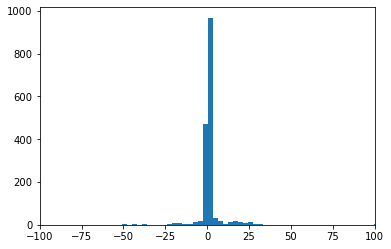

In [204]:
plt.plot(dpi=150)
plt.hist(balcoef2,bins=200)
plt.xlim(-100,100)
plt.show()

In [219]:
tle2exp

[['2',
  '44238',
  '52.9979',
  '31.4542',
  '0001740',
  '103.9964',
  '256.1222',
  '15.16678365123214'],
 ['2',
  '44249',
  '52.9845',
  '4.5063',
  '0002069',
  '294.3150',
  '65.7629',
  '15.22189982125322'],
 ['2',
  '44252',
  '52.9989',
  '32.1716',
  '0002375',
  '104.2717',
  '255.8541',
  '15.18750496123844'],
 ['2',
  '44257',
  '52.9970',
  '267.2434',
  '0002357',
  '52.3365',
  '307.7855',
  '15.47360066126726'],
 ['2',
  '44281',
  '52.9909',
  '290.5443',
  '0007442',
  '20.1280',
  '340.0028',
  '15.70203708',
  '57431'],
 ['2',
  '44282',
  '53.0200',
  '313.3207',
  '0003715',
  '121.0079',
  '239.1287',
  '15.33408778124484'],
 ['2',
  '44287',
  '52.9866',
  '276.5719',
  '0008158',
  '29.8287',
  '330.3194',
  '15.73617593127637'],
 ['2',
  '44713',
  '53.0557',
  '64.5206',
  '0001648',
  '97.8396',
  '262.2780',
  '15.06398515',
  '99020'],
 ['2',
  '44714',
  '53.0553',
  '64.5829',
  '0002316',
  '94.9934',
  '265.1320',
  '15.06408051',
  '99026'],
 ['2',


In [208]:
np.median(np.array(balcoef2))

0.63602

In [206]:
tle1exp.extend(tle2exp)

In [207]:
tle1exp

[['1',
  '44238U',
  '19029D',
  '21237.86036098',
  '.00007126',
  '00000-0',
  '37494-3',
  '0',
  '9993',
  '2',
  '44238',
  '52.9979',
  '31.4542',
  '0001740',
  '103.9964',
  '256.1222',
  '15.16678365123214'],
 ['1',
  '44249U',
  '19029Q',
  '21237.61543563',
  '.00009867',
  '00000-0',
  '43787-3',
  '0',
  '9994',
  '2',
  '44249',
  '52.9845',
  '4.5063',
  '0002069',
  '294.3150',
  '65.7629',
  '15.22189982125322'],
 ['1',
  '44252U',
  '19029T',
  '21237.87426977',
  '.00008416',
  '00000-0',
  '41478-3',
  '0',
  '9999',
  '2',
  '44252',
  '52.9989',
  '32.1716',
  '0002375',
  '104.2717',
  '255.8541',
  '15.18750496123844'],
 ['1',
  '44257U',
  '19029Y',
  '21238.10491661',
  '.00042073',
  '00000-0',
  '81370-3',
  '0',
  '9995',
  '2',
  '44257',
  '52.9970',
  '267.2434',
  '0002357',
  '52.3365',
  '307.7855',
  '15.47360066126726'],
 ['1',
  '44281U',
  '19029AY',
  '21237.87370611',
  '.00171460',
  '00000-0',
  '13610-2',
  '0',
  '9990',
  '2',
  '44281',
  

In [221]:
dftle2=pd.DataFrame(tle2exp)

In [222]:
dftle2


,0,1,2,3,4,5,6,7,8
0,2,44238,52.9979,31.4542,0001740,103.9964,256.1222,15.16678365123214,None
1,2,44249,52.9845,4.5063,0002069,294.3150,65.7629,15.22189982125322,None
2,2,44252,52.9989,32.1716,0002375,104.2717,255.8541,15.18750496123844,None
3,2,44257,52.9970,267.2434,0002357,52.3365,307.7855,15.47360066126726,None
4,2,44281,52.9909,290.5443,0007442,20.1280,340.0028,15.70203708,57431
...,...,...,...,...,...,...,...,...,...
1648,2,48696,53.0503,332.5553,0001149,65.0349,356.6593,15.51668817,3692
1649,2,48697,53.0496,332.5640,0001102,68.4311,305.5306,15.50430451,3691
1650,2,48879,97.5184,6.1245,0012660,94.2794,16.6235,15.15987066,3600
1651,2,48880,97.5184,6.1227,0012864,95.5669,11.0825,15.16003626,3609


In [228]:
tleecc=dftle2[4].values

ecc=[float('0.'+e) for e in tleecc]



0.0

In [229]:
ecc

[0.000174,
 0.0002069,
 0.0002375,
 0.0002357,
 0.0007442,
 0.0003715,
 0.0008158,
 0.0001648,
 0.0002316,
 0.000172,
 0.0001946,
 0.0002217,
 0.000137,
 0.0002069,
 0.0001919,
 0.0001556,
 0.0001869,
 0.0001802,
 0.0002039,
 0.0002172,
 0.0002019,
 0.0001452,
 0.0001341,
 0.0003075,
 0.0001823,
 0.0001992,
 0.0002212,
 0.0001499,
 0.0002198,
 0.0001688,
 0.0002232,
 0.0002097,
 0.0002002,
 0.0002305,
 0.0002053,
 0.0001038,
 0.000202,
 0.0002036,
 0.0002165,
 0.0002081,
 0.0002155,
 0.0008239,
 0.0001935,
 0.000199,
 0.0001889,
 0.0001564,
 0.0001313,
 0.0002195,
 0.0002111,
 0.0002793,
 0.00022,
 0.000213,
 0.0002211,
 0.0002275,
 0.000195,
 0.0002076,
 0.0001956,
 0.0001529,
 0.000231,
 0.0002005,
 0.0001675,
 0.000119,
 0.0002051,
 0.0002026,
 0.0001389,
 9.35e-05,
 9.95e-05,
 1.83e-05,
 8.77e-05,
 0.0001518,
 7.9e-05,
 8.18e-05,
 0.0001237,
 0.0001006,
 9.74e-05,
 0.0001149,
 7.79e-05,
 0.0001152,
 8.48e-05,
 8.98e-05,
 8.59e-05,
 7.81e-05,
 7.34e-05,
 7.71e-05,
 0.0001629,
 0.000

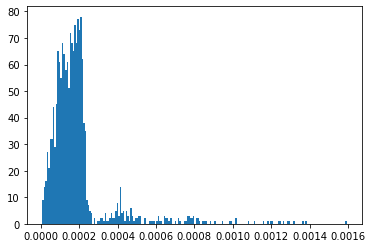

In [230]:
plt.plot(dpi=150)
plt.hist(ecc,bins=200)
plt.xlim()
plt.show()

TypeError: only size-1 arrays can be converted to Python scalars

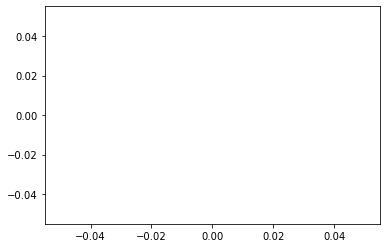

In [234]:
plt.plot(dpi=150)
plt.hist(float(dftle2[5].values),bins=360)
plt.xlim()
plt.show()

In [ ]:
dftle2[].hist()

In [218]:
import numpy as np
from astropy.time import Time



In [219]:
#propagate satellites

In [220]:
t_before=59000+np.arange(1,10,1)/84600

In [221]:
t_before

array([59000.00001182, 59000.00002364, 59000.00003546, 59000.00004728,
       59000.0000591 , 59000.00007092, 59000.00008274, 59000.00009456,
       59000.00010638])

In [222]:
time = Time(t_before, format='mjd', scale='utc')

In [223]:
observer_states=getObserverStates(time,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                     observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)

In [224]:
# getSatelliteStates(time,TLEFirstLine,TLESecondLine)

In [225]:
chunks

[['STARLINK-24             ',
  '1 44238U 19029D   21237.86036098  .00007126  00000-0  37494-3 0  9993',
  '2 44238  52.9979  31.4542 0001740 103.9964 256.1222 15.16678365123214'],
 ['STARLINK-61             ',
  '1 44249U 19029Q   21237.61543563  .00009867  00000-0  43787-3 0  9994',
  '2 44249  52.9845   4.5063 0002069 294.3150  65.7629 15.22189982125322'],
 ['STARLINK-71             ',
  '1 44252U 19029T   21237.87426977  .00008416  00000-0  41478-3 0  9999',
  '2 44252  52.9989  32.1716 0002375 104.2717 255.8541 15.18750496123844'],
 ['STARLINK-43             ',
  '1 44257U 19029Y   21238.10491661  .00042073  00000-0  81370-3 0  9995',
  '2 44257  52.9970 267.2434 0002357  52.3365 307.7855 15.47360066126726'],
 ['STARLINK-70             ',
  '1 44281U 19029AY  21237.87370611  .00171460  00000-0  13610-2 0  9990',
  '2 44281  52.9909 290.5443 0007442  20.1280 340.0028 15.70203708 57431'],
 ['STARLINK-80             ',
  '1 44282U 19029AZ  21237.91594692  .00009603  00000-0  30423-3 

In [226]:
satellite_states=[]
topo_radec=[]
geo_radec=[]

for ch in chunks:
    satellite_positions, satellite_velocities = getSatelliteStates(time,ch[1],ch[2])
    satellite_states.append([time,satellite_positions,satellite_velocities])
    
    sat_obs = satellite_positions-observer_states
    geo_radec.append(icrf2radec(satellite_positions/np.linalg.norm(satellite_positions)))
    topo_radec.append(icrf2radec(sat_obs/np.linalg.norm(sat_obs)))
    

0.500011820346 [2459000.50001182 2459000.50002364 2459000.50003546 2459000.50004728
 2459000.5000591  2459000.50007092 2459000.50008274 2459000.50009456
 2459000.50010638]
0.500023640692 [2459000.50001182 2459000.50002364 2459000.50003546 2459000.50004728
 2459000.5000591  2459000.50007092 2459000.50008274 2459000.50009456
 2459000.50010638]
0.500035461038 [2459000.50001182 2459000.50002364 2459000.50003546 2459000.50004728
 2459000.5000591  2459000.50007092 2459000.50008274 2459000.50009456
 2459000.50010638]
0.500047281384 [2459000.50001182 2459000.50002364 2459000.50003546 2459000.50004728
 2459000.5000591  2459000.50007092 2459000.50008274 2459000.50009456
 2459000.50010638]
0.500059101731 [2459000.50001182 2459000.50002364 2459000.50003546 2459000.50004728
 2459000.5000591  2459000.50007092 2459000.50008274 2459000.50009456
 2459000.50010638]
0.500070922077 [2459000.50001182 2459000.50002364 2459000.50003546 2459000.50004728
 2459000.5000591  2459000.50007092 2459000.50008274 2459

/tmp/ipykernel_68038/473470916.py:37: RuntimeWarning: invalid value encountered in remainder
  ra = modulo(rad2deg(phi)+360,360)


In [153]:
satellite_states

[[<Time object: scale='utc' format='mjd' value=[59000.00001182 59000.00002364 59000.00003546 59000.00004728
   59000.0000591  59000.00007092 59000.00008274 59000.00009456
   59000.00010638]>,
  array([[ 2526.6450485 , -3181.51767569, -5572.73146518],
         [ 2531.54723439, -3193.2416758 , -5563.79015463],
         [ 2536.43658458, -3204.94948662, -5554.82055738],
         [ 2541.31307414, -3216.64104869, -5545.82271847],
         [ 2546.17667807, -3228.31630231, -5536.79668331],
         [ 2551.0273716 , -3239.97518825, -5527.74249717],
         [ 2555.86512987, -3251.61764699, -5518.66020575],
         [ 2560.68992812, -3263.24361916, -5509.54985484],
         [ 2565.50174173, -3274.85304568, -5500.41149019]]),
  array([[ 2.39945327, -5.73477238,  4.36373297],
         [ 2.39318534, -5.72687337,  4.37757101],
         [ 2.38690517, -5.7189452 ,  4.39138703],
         [ 2.38061281, -5.71098791,  4.40518093],
         [ 2.37430827, -5.70300153,  4.41895266],
         [ 2.3679916 , -5

In [101]:
topo_radec

[(array([166.26595363, 166.62287087, 166.98242801, 167.34461845,
         167.70943404, 168.07686696, 168.44690686, 168.81954271,
         169.19476232]),
  array([-54.2189449 , -54.23304716, -54.24560816, -54.25659915,
         -54.26599114, -54.27375445, -54.27985945, -54.28427604,
         -54.2869738 ])),
 (array([166.26595363, 166.62287087, 166.98242801, 167.34461845,
         167.70943404, 168.07686696, 168.44690686, 168.81954271,
         169.19476232]),
  array([-54.2189449 , -54.23304716, -54.24560816, -54.25659915,
         -54.26599114, -54.27375445, -54.27985945, -54.28427604,
         -54.2869738 ])),
 (array([166.26595363, 166.62287087, 166.98242801, 167.34461845,
         167.70943404, 168.07686696, 168.44690686, 168.81954271,
         169.19476232]),
  array([-54.2189449 , -54.23304716, -54.24560816, -54.25659915,
         -54.26599114, -54.27375445, -54.27985945, -54.28427604,
         -54.2869738 ])),
 (array([166.26595363, 166.62287087, 166.98242801, 167.34461845,
  

In [102]:
geo_radec

[(array([308.45531781, 308.40677604, 308.35852457, 308.31056041,
         308.26288056, 308.2154821 , 308.16836212, 308.12151778,
         308.07494626]),
  array([-53.90637015, -53.78049537, -53.6546006 , -53.52868605,
         -53.40275193, -53.27679843, -53.15082575, -53.02483408,
         -52.89882362])),
 (array([308.45531781, 308.40677604, 308.35852457, 308.31056041,
         308.26288056, 308.2154821 , 308.16836212, 308.12151778,
         308.07494626]),
  array([-53.90637015, -53.78049537, -53.6546006 , -53.52868605,
         -53.40275193, -53.27679843, -53.15082575, -53.02483408,
         -52.89882362])),
 (array([308.45531781, 308.40677604, 308.35852457, 308.31056041,
         308.26288056, 308.2154821 , 308.16836212, 308.12151778,
         308.07494626]),
  array([-53.90637015, -53.78049537, -53.6546006 , -53.52868605,
         -53.40275193, -53.27679843, -53.15082575, -53.02483408,
         -52.89882362])),
 (array([308.45531781, 308.40677604, 308.35852457, 308.31056041,
  

In [45]:
satra=[]
satdec=[]


observer_states=getObserverStates(time,observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                     observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)

for ch in chunks:
    sat_num = ch[0].strip()  # the label for each satellite --> STARLINK-xx
    s = ch[1]  # first line of TLE set
    t = ch[2]  # second line of TLE set
    sat = sg.Satrec.twoline2rv(s, t)  

    

    
    for t in t_before:
#         print(t)
        jd_t = t + 2400000.5  # convert MJD to JD for sgp4 propagation calculation
        fr, whole = math.modf(float(str(jd_t)))  # fr = digits after decimal of MJD

        e, r, v = sat.sgp4(float(str(jd_t)), round(fr, 12))  # r is [x,y,z] for propagated satellite

#         #Is the satellite in Earth's Shadow?
#         r_parallel = np.dot(r,sv)*sv
#         r_tangential = r-r_parallel

#         if(np.linalg.norm(r_tangential)<rearth):
#             #print(np.linalg.norm(r_tangential),np.linalg.norm(r))
#             #yes the satellite is in Earth's shadow, no need to continue (except for the moon of course)
#             break


        x, y, z = r[0], r[1], r[2] # Possible issue due to Keplerian to non-Keplerian elements

        
        length = np.sqrt(x**2 + y**2 + z**2)
        norm_coords = np.array([x/length, y/length, z/length])  # normalizing onto unit sphere
        
        
        ra, dec = icrf2radec(norm_coords)  # convert to RA and Dec (Degrees)
        satra.append(ra)
        satdec.append(dec)
    
    

/tmp/ipykernel_68038/473470916.py:37: RuntimeWarning: invalid value encountered in remainder
  ra = modulo(rad2deg(phi)+360,360)


In [46]:
delraps=[]
deldecps=[]

delraps.append(np.array(satra[1:])-np.array(satra[0:-1])
deldecps=np.array(satdec[1:])-np.array(satdec[0:-1])

In [63]:
satra

[193.96597659399822,
 194.17898335951804,
 194.39196442125112,
 194.60491602957035,
 194.8178344516687,
 195.0307159292114,
 195.24355673612385,
 195.4563531438343,
 195.66910142588569,
 63.952505239744255,
 64.05414855006802,
 64.15560731225446,
 64.25688241934785,
 64.35797476400006,
 64.45888522409507,
 64.55961469086748,
 64.66016404502665,
 64.76053416656362,
 106.05292527791647,
 106.13055768774262,
 106.20817663732942,
 106.28578262904063,
 106.36337616952414,
 106.44095775286786,
 106.51852788551105,
 106.59608706814299,
 106.67363580350923,
 143.34185858536472,
 143.53064254684523,
 143.71905982056734,
 143.90710935931133,
 144.09479015060026,
 144.28210118905838,
 144.46904151990373,
 144.65561020531425,
 144.8418063409681,
 37.95234791467465,
 39.561207361382515,
 41.15390543836014,
 42.72924699345572,
 44.28614596272655,
 45.8236271641976,
 47.34082733064133,
 48.83699413552171,
 50.311484469521815,
 119.80014517349423,
 119.95032523461418,
 120.1008650006222,
 120.25176522

In [61]:
delraps*30

array([ 6.39020297,  6.38943185,  6.38854825, ..., -1.41359916,
       -1.40533019, -1.39714583])

In [53]:
deldecps*30

array([0.0720243 , 0.08345597, 0.09488498, ..., 3.7791804 , 3.77975004,
       3.78031396])

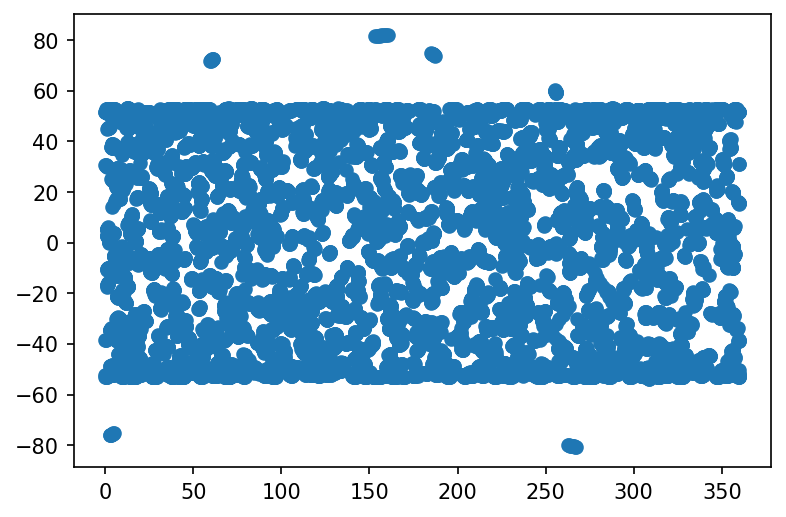

In [56]:
plt.figure(dpi=150)
plt.scatter(satra,satdec)
plt.show()

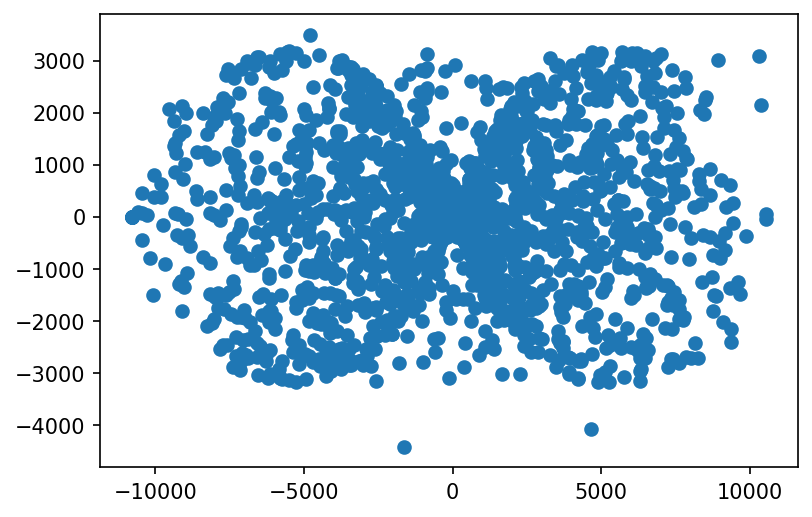

In [62]:
plt.figure(dpi=150)
plt.scatter(delraps*30,deldecps*30)
plt.show()

In [ ]:
t_before = t - TimeDelta(30.0, format='sec')
        
        # We're going to propagate every 2 seconds from 30 seconds before to 30 seconds after field time because exposure for the field is 30 seconds
        # Because of this, there will be 61 total iterations of propagations
        # If a satellite is within this time, it will leave a streak in the field image
        while count <= 61:
            jd_t = t_before + 2400000.5  # convert MJD to JD for sgp4 propagation calculation
            fr, whole = math.modf(float(str(jd_t)))  # fr = digits after decimal of MJD
    
            e, r, v = sat.sgp4(float(str(jd_t)), round(fr, 12))  # r is [x,y,z] for propagated satellite
        
            #Is the satellite in Earth's Shadow?
            r_parallel = np.dot(r,sv)*sv
            r_tangential = r-r_parallel
            
            if(np.linalg.norm(r_tangential)<rearth):
                #print(np.linalg.norm(r_tangential),np.linalg.norm(r))
                #yes the satellite is in Earth's shadow, no need to continue (except for the moon of course)
                break
        
       
            x, y, z = r[0], r[1], r[2] # Possible issue due to Keplerian to non-Keplerian elements
            length = np.sqrt(x**2 + y**2 + z**2)
            norm_coords = np.array([x/length, y/length, z/length])  # normalizing onto unit sphere
            ra, dec = icrf2radec(norm_coords)  # convert to RA and Dec (Degrees)

In [19]:
import warnings

In [20]:
def crosstrackdistance(lat1, long1, lat2, long2, lat3, long3):
    c1 = SkyCoord(ra=long1*u.radian, dec=lat1*u.radian, frame='icrs')  
    c2 = SkyCoord(ra=long2*u.radian, dec=lat2*u.radian, frame='icrs') 
    c3 = SkyCoord(ra=long3*u.radian, dec=lat3*u.radian, frame='icrs')
    
    c1.representation_type = 'cartesian'
    c2.representation_type = 'cartesian'
    c3.representation_type = 'cartesian'
    
    P1 = c1.x.value, c1.y.value, c1.z.value
    P2 = c2.x.value, c2.y.value, c2.z.value
    P3 = c3.x.value, c3.y.value, c3.z.value
    
    S = np.cross(P1,P2)
    dot = np.dot(S,P3)
    
    dist = np.arctan2(dot/np.linalg.norm(S), np.sqrt(1 - (dot/np.linalg.norm(S))**2 )) 
    
    return dist

In [21]:
# Rubin coordinates
    # latRubin = -30.24506 (Degrees)
    # longRubin = -70.74913 (Degrees)
    # DecRubin = -30.24506 (Radians)
    # RaRubin = 289.251 (Radians)
    # Earth radius = 6371 km

working on chunk ['STARLINK-24             ', '1 44238U 19029D   21237.86036098  .00007126  00000-0  37494-3 0  9993', '2 44238  52.9979  31.4542 0001740 103.9964 256.1222 15.16678365123214']
working on chunk ['STARLINK-61             ', '1 44249U 19029Q   21237.61543563  .00009867  00000-0  43787-3 0  9994', '2 44249  52.9845   4.5063 0002069 294.3150  65.7629 15.22189982125322']
working on chunk ['STARLINK-71             ', '1 44252U 19029T   21237.87426977  .00008416  00000-0  41478-3 0  9999', '2 44252  52.9989  32.1716 0002375 104.2717 255.8541 15.18750496123844']
working on chunk ['STARLINK-43             ', '1 44257U 19029Y   21238.10491661  .00042073  00000-0  81370-3 0  9995', '2 44257  52.9970 267.2434 0002357  52.3365 307.7855 15.47360066126726']
working on chunk ['STARLINK-70             ', '1 44281U 19029AY  21237.87370611  .00171460  00000-0  13610-2 0  9990', '2 44281  52.9909 290.5443 0007442  20.1280 340.0028 15.70203708 57431']

Could not propagate STARLINK-70

workin

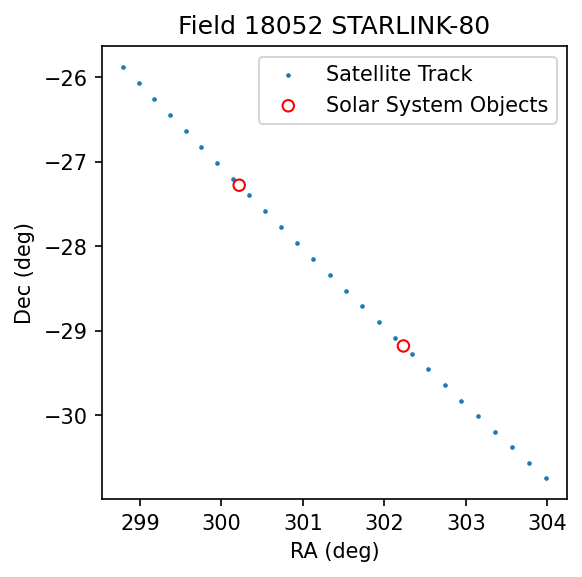

Number of objects affected: 2

Satellite times:
[59879.00219519431, 59879.00221834246, 59879.002241490605, 59879.00226463875, 59879.002287786905, 59879.00231093505, 59879.0023340832, 59879.002357231344, 59879.0023803795, 59879.002403527644, 59879.00242667579, 59879.002449823936, 59879.00247297209, 59879.002496120236, 59879.00251926838, 59879.00254241653, 59879.00256556468, 59879.00258871283, 59879.002611860975, 59879.00263500912, 59879.002658157275, 59879.00268130542, 59879.00270445357, 59879.00272760171, 59879.00275074987, 59879.00277389801, 59879.00279704616]

Right Ascension, SATELLITE:
[298.79259977512464, 298.98373075143087, 299.1754846075754, 299.3678716952895, 299.5608907995256, 299.7545523293992, 299.9488667995802, 300.1438330201982, 300.3394615572023, 300.5357591071934, 300.7327363827893, 300.93039223821137, 301.12873743670605, 301.32777882404565, 301.5275273227905, 301.72798180654337, 301.9291532577991, 302.131048663939, 302.3336791535879, 302.5370436312918, 302.7411532841814

In [41]:
# Time calculations output warnings --> ignore them
warnings.filterwarnings('ignore')


rearth=6372


# first iterate through each satellite
#for ch in chunks[:7]:
for ch in chunks:
    sat_num = ch[0].strip()  # the label for each satellite --> STARLINK-xx
    s = ch[1]  # first line of TLE set
    t = ch[2]  # second line of TLE set
    sat = sg.Satrec.twoline2rv(s, t)  
    
    print("working on chunk",ch)
    
    flag_2 = False

    # if True, satellite can't be propagated, so continue to next satellite
    if flag_2:
        continue
    
    # check each satellite against each FIELD
    for f in field_ids: #[100:1000]:
        ra_vals = []  # for satellite right ascensions
        dec_vals = []  # for satellite declinations
        sat_times = []  # for satellite times
        good_obj_times = [] # Observation times
        
        vectopsatlist = [] # for satellite topocentric vectors
        rangeobjects = [] # Distance to objects
        posrubin = []
        
        data = dfin[dfin['FieldID']==f]  # all objects in the field

        sun_vector = data[['Obs-Sun(J2000x)(km)', 'Obs-Sun(J2000y)(km)', 'Obs-Sun(J2000z)(km)']][0:1].values[0]
        sv = sun_vector/np.linalg.norm(sun_vector)
        
        ra_f = data['AstRA(deg)']  # RA for all objects
        dec_f = data['AstDec(deg)']  # Dec for all objects
        range_f = data['AstRange(km)'] # Distance for all objects
                
        min_ra, max_ra = min(ra_f), max(ra_f) # Global minimum and maximums for objects in the field in question
        min_dec, max_dec = min(dec_f), max(dec_f)

        mjd_t = data['FieldMJD'].unique()[0]  # field time
        
        t = Time(mjd_t, format='mjd')  # convert to Time format
        t_change = TimeDelta(2.0, format='sec')
        
        flag = False
        
        count = 1
        
        # Start 30 seconds before field time
        t_before = t - TimeDelta(30.0, format='sec')
        
        # We're going to propagate every 2 seconds from 30 seconds before to 30 seconds after field time because exposure for the field is 30 seconds
        # Because of this, there will be 61 total iterations of propagations
        # If a satellite is within this time, it will leave a streak in the field image
        while count <= 61:
            jd_t = t_before + 2400000.5  # convert MJD to JD for sgp4 propagation calculation
            fr, whole = math.modf(float(str(jd_t)))  # fr = digits after decimal of MJD
    
            e, r, v = sat.sgp4(float(str(jd_t)), round(fr, 12))  # r is [x,y,z] for propagated satellite
        
            #Is the satellite in Earth's Shadow?
            r_parallel = np.dot(r,sv)*sv
            r_tangential = r-r_parallel
            
            if(np.linalg.norm(r_tangential)<rearth):
                #print(np.linalg.norm(r_tangential),np.linalg.norm(r))
                #yes the satellite is in Earth's shadow, no need to continue (except for the moon of course)
                break
        
       
            x, y, z = r[0], r[1], r[2] # Possible issue due to Keplerian to non-Keplerian elements
            length = np.sqrt(x**2 + y**2 + z**2)
            norm_coords = np.array([x/length, y/length, z/length])  # normalizing onto unit sphere
            ra, dec = icrf2radec(norm_coords)  # convert to RA and Dec (Degrees)
            
            # print(np.linalg.norm(r_tangential),np.linalg.norm(r),ra,dec)
            
            if ra != ra:  # if nan --> satellite can't be propagated to that time
                flag = True
                break  # don't bother looking at all the times 

            # if the object is in the field i.e. within 1 degree
            if (min_ra - 1.0 <= ra <= max_ra + 1.0) and (min_dec - 1.0 <= dec <= max_dec + 1.0): 
                ra_vals.append(ra)
                dec_vals.append(dec)
                sat_times.append(t_before.value) # times for satellite propagation
                
                '''
                # Calculate topocentric vector for satellite positions from Rubin (Rotation Matrix)
                ts = load.timescale()
                tsat = ts.tt_jd(t_before.value) # Appropriate time format for rotation matrix
                Rsat = ecliptic_frame.rotation_at(tsat) # Incorrect rotation matrix
                vectopsat = [x, y, z] - np.matmul(Rsat, vecrubinxyz)
                vectopsatlist.append(vectopsat)
                '''
                
                # Calculate topocentric vector for satellite positions from Rubin (WGS84)
                tsat = Time(t_before.value, format='jd')
                vecrubinxyz = getObserverStates(tsat, observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                     observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
                vectopsat = [x, y, z] - vecrubinxyz
                vectopsatlist.append(vectopsat)
            
            t_before += t_change  # Propagate 2.0 seconds
            count += 1 
            
        if flag:
            print()
            print("Could not propagate " + sat_num)
            print()
            flag_2 = True
            break  # break out of for loop of the fields
                
        # Only satellite points that are within the field of objects
        if any(ra_vals) and any(dec_vals):
            good_obj_ra, good_obj_dec, good_obj_range = [], [], []
            
            obj_count = 0
            
            # for satellites
           
            min_ra_track, max_ra_track = ra_vals[0], ra_vals[-1]
            min_dec_track, max_dec_track = dec_vals[0], dec_vals[-1]
        
            
            min_long, max_long = np.deg2rad(min_ra_track), np.deg2rad(max_ra_track)  # Convert to radians 
        
            min_lat, max_lat = np.deg2rad(min_dec_track), np.deg2rad(max_dec_track)  
            

            for obj_r, obj_d, obj_range in zip(ra_f, dec_f, range_f): 
                obj_long = np.deg2rad(obj_r)
                obj_lat = np.deg2rad(obj_d)

                bound_d = 2.0 * np.pi/(180*3600)  # 2 arcseconds in radians

                # calculate cross track distance between satellite streak and objects
                dist = crosstrackdistance(min_lat, min_long, max_lat, max_long, obj_lat, obj_long) 
                
                # an object is considered obstructed if the satellite streak is within 2 arcseconds of it
                if (abs(dist) <= bound_d) and ((min_lat <= obj_lat <= max_lat) or (min_long <= obj_long <= max_long)):
                    good_obj_ra.append(obj_r)
                    good_obj_dec.append(obj_d)
                    good_obj_range.append(obj_range)
                    good_obj_times.append(t_before.value) # add observation time for objects
                    obj_count += 1 
                    
                    
            # only plot objects that are obstructed 
            if any(good_obj_ra):
#                 plt.figure(dpi=150,figsize=(4,4))
#                 plt.scatter(ra_vals, dec_vals, s=1.5, label='Satellite')
#                 plt.scatter(good_obj_ra, good_obj_dec, s=1.5, label='Objects')
#                 title = "Field " + str(f) + " " + sat_num
#                 plt.title(title)
#                 plt.xlabel('RA (deg)')
#                 plt.ylabel('Dec (deg)')
#                 plt.legend()
# #                 plt.savefig(title)
#                 plt.show()


                plt.figure(dpi=150,figsize=(4,4))
                plt.scatter(ra_vals, dec_vals, s=1.5, label='Satellite Track')
                #plt.plot(ra_vals, dec_vals, label='Satellite')
                plt.scatter(good_obj_ra, good_obj_dec, s=30, label='Solar System Objects', facecolors='none', edgecolors='r')
                title = "Field " + str(f) + " " + sat_num
                plt.title(title)
                plt.xlabel('RA (deg)')
                plt.ylabel('Dec (deg)')
                plt.legend()
#                 plt.savefig(title)
                plt.show()

                print("Number of objects affected: " + str(obj_count))
                print()
                print("Satellite times:")
                print(str(sat_times))
                
                print()
                print("Right Ascension, SATELLITE:")
                print(ra_vals)
                print("Declination, SATELLITE")
                print(dec_vals)
                print()
                
                print()
                print("Right Ascension, OBJECTS:")
                print(good_obj_ra)
                print("Declination, OBJECTS")
                print(good_obj_dec)
                print()
                
                
                # Topocentric vector for relevant satellite positions 
                vectopsatlistdisp = np.array(vectopsatlist)
                print("Topocentric vector for satellite positions from Rubin (km):")
                print(vectopsatlistdisp)
                
                '''
                # Topocentric vector for relevant objects
                for obj in range(0, len(good_obj_ra)):
                    ts = load.timescale()
                    tobj = ts.tt_jd(good_obj_times[obj]) # Appropriate time format for rotation matrix
                    R = ecliptic_frame.rotation_at(tobj) # Rotation matrix
                    objpos_xyz = good_obj_range[obj]*radec2icrf(good_obj_ra[obj], good_obj_dec[obj])
                    vectopobj = objpos_xyz - np.matmul(R, vecrubinxyz)
            
                    print('Topocentric vector for object', obj, '(km):')
                    print(vectopobj)
                '''
                
                # Topocentric vector for relevant objects
                for obj in range(0, len(good_obj_ra)):
                    tobj = Time(good_obj_times[obj], format='jd') 
                    vecrubinxyz = getObserverStates(tobj, observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                     observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
                    objpos_xyz = good_obj_range[obj]*radec2icrf(good_obj_ra[obj], good_obj_dec[obj])
                    vectopobj = objpos_xyz - vecrubinxyz
            
                    print('Topocentric vector for object', obj, '(km):')
                    print(vectopobj)
                

In [ ]:
# Time calculations output warnings --> ignore them
warnings.filterwarnings('ignore')


# List for calculation times
calctime = [] 
sat_cross=[]
obs_affected=[]

rearth=6372


# first iterate through each satellite
#for ch in chunks[:7]:
for ch in chunks:
    sat_num = ch[0].strip()  # the label for each satellite --> STARLINK-xx
    s = ch[1]  # first line of TLE set
    t = ch[2]  # second line of TLE set
    sat = sg.Satrec.twoline2rv(s, t)  
    
    print("working on chunk",ch)
    
    flag_2 = False

    # if True, satellite can't be propagated, so continue to next satellite
    if flag_2:
        continue
    
    # check each satellite against each FIELD
    for f in field_ids: #[100:1000]:
        ra_vals = []  # for satellite right ascensions
        dec_vals = []  # for satellite declinations
        sat_times = []  # for satellite times
        good_obj_times = [] # Observation times
        
        vectopsatlist = [] # for satellite topocentric vectors
        rangeobjects = [] # Distance to objects
        posrubin = []
        
        data = dfin[dfin['FieldID']==f]  # all objects in the field

        sun_vector = data[['Obs-Sun(J2000x)(km)', 'Obs-Sun(J2000y)(km)', 'Obs-Sun(J2000z)(km)']][0:1].values[0]
        sv = sun_vector/np.linalg.norm(sun_vector)
        
        ra_f = data['AstRA(deg)']  # RA for all objects
        dec_f = data['AstDec(deg)']  # Dec for all objects
        range_f = data['AstRange(km)'] # Distance for all objects
                
        min_ra, max_ra = min(ra_f), max(ra_f) # Global minimum and maximums for objects in the field in question
        min_dec, max_dec = min(dec_f), max(dec_f)

        mjd_t = data['FieldMJD'].unique()[0]  # field time
        
        t = Time(mjd_t, format='mjd')  # convert to Time format
        t_change = TimeDelta(2.0, format='sec')
        
        flag = False
        
        count = 1
        
        # Start 30 seconds before field time
        t_before = t - TimeDelta(30.0, format='sec')
        
        # We're going to propagate every 2 seconds from 30 seconds before to 30 seconds after field time because exposure for the field is 30 seconds
        # Because of this, there will be 61 total iterations of propagations
        # If a satellite is within this time, it will leave a streak in the field image
        while count <= 61:
            jd_t = t_before + 2400000.5  # convert MJD to JD for sgp4 propagation calculation
            fr, whole = math.modf(float(str(jd_t)))  # fr = digits after decimal of MJD
    
            e, r, v = sat.sgp4(float(str(jd_t)), round(fr, 12))  # r is [x,y,z] for propagated satellite
        
            #Is the satellite in Earth's Shadow?
            r_parallel = np.dot(r,sv)*sv
            r_tangential = r-r_parallel
            
            if(np.linalg.norm(r_tangential)<rearth):
                #print(np.linalg.norm(r_tangential),np.linalg.norm(r))
                #yes the satellite is in Earth's shadow, no need to continue (except for the moon of course)
                break
        
       
            x, y, z = r[0], r[1], r[2] # Possible issue due to Keplerian to non-Keplerian elements
            length = np.sqrt(x**2 + y**2 + z**2)
            norm_coords = np.array([x/length, y/length, z/length])  # normalizing onto unit sphere
            ra, dec = icrf2radec(norm_coords)  # convert to RA and Dec (Degrees)
            
            # print(np.linalg.norm(r_tangential),np.linalg.norm(r),ra,dec)
            
            if ra != ra:  # if nan --> satellite can't be propagated to that time
                flag = True
                break  # don't bother looking at all the times 

            # if the object is in the field i.e. within 1 degree
            if (min_ra - 1.0 <= ra <= max_ra + 1.0) and (min_dec - 1.0 <= dec <= max_dec + 1.0): 
                ra_vals.append(ra)
                dec_vals.append(dec)
                sat_times.append(t_before.value) # times for satellite propagation
                
                '''
                # Calculate topocentric vector for satellite positions from Rubin (Rotation Matrix)
                ts = load.timescale()
                tsat = ts.tt_jd(t_before.value) # Appropriate time format for rotation matrix
                Rsat = ecliptic_frame.rotation_at(tsat) # Incorrect rotation matrix
                vectopsat = [x, y, z] - np.matmul(Rsat, vecrubinxyz)
                vectopsatlist.append(vectopsat)
                '''
                
                # Calculate topocentric vector for satellite positions from Rubin (WGS84)
                tsat = Time(t_before.value, format='jd')
                vecrubinxyz = getObserverStates(tsat, observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                     observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
                vectopsat = [x, y, z] - vecrubinxyz
                vectopsatlist.append(vectopsat)
            
            t_before += t_change  # Propagate 2.0 seconds
            count += 1 
            
        if flag:
            print()
            print("Could not propagate " + sat_num)
            print()
            flag_2 = True
            break  # break out of for loop of the fields
                
        # Only satellite points that are within the field of objects
        if any(ra_vals) and any(dec_vals):
            good_obj_ra, good_obj_dec, good_obj_range = [], [], []
            
            obj_count = 0
            
            # for satellites
           
            min_ra_track, max_ra_track = ra_vals[0], ra_vals[-1]
            min_dec_track, max_dec_track = dec_vals[0], dec_vals[-1]
        
            
            min_long, max_long = np.deg2rad(min_ra_track), np.deg2rad(max_ra_track)  # Convert to radians 
        
            min_lat, max_lat = np.deg2rad(min_dec_track), np.deg2rad(max_dec_track)  
            

            for obj_r, obj_d, obj_range in zip(ra_f, dec_f, range_f): 
                obj_long = np.deg2rad(obj_r)
                obj_lat = np.deg2rad(obj_d)

                bound_d = 2.0 * np.pi/(180*3600)  # 2 arcseconds in radians

                # calculate cross track distance between satellite streak and objects
                dist = crosstrackdistance(min_lat, min_long, max_lat, max_long, obj_lat, obj_long) 
                
                # an object is considered obstructed if the satellite streak is within 2 arcseconds of it
                if (abs(dist) <= bound_d) and ((min_lat <= obj_lat <= max_lat) or (min_long <= obj_long <= max_long)):
                    good_obj_ra.append(obj_r)
                    good_obj_dec.append(obj_d)
                    good_obj_range.append(obj_range)
                    good_obj_times.append(t_before.value) # add observation time for objects
                    obj_count += 1 
                    
                    
            # only plot objects that are obstructed 
            if any(good_obj_ra):
#                 plt.figure(dpi=150,figsize=(4,4))
#                 plt.scatter(ra_vals, dec_vals, s=1.5, label='Satellite')
#                 plt.scatter(good_obj_ra, good_obj_dec, s=1.5, label='Objects')
#                 title = "Field " + str(f) + " " + sat_num
#                 plt.title(title)
#                 plt.xlabel('RA (deg)')
#                 plt.ylabel('Dec (deg)')
#                 plt.legend()
# #                 plt.savefig(title)
#                 plt.show()


                plt.figure(dpi=150,figsize=(4,4))
                plt.scatter(ra_vals, dec_vals, s=1.5, label='Satellite Track')
                #plt.plot(ra_vals, dec_vals, label='Satellite')
                plt.scatter(good_obj_ra, good_obj_dec, s=30, label='Solar System Objects', facecolors='none', edgecolors='r')
                title = "Field " + str(f) + " " + sat_num
                plt.title(title)
                plt.xlabel('RA (deg)')
                plt.ylabel('Dec (deg)')
                plt.legend()
#                 plt.savefig(title)
                plt.show()

                print("Number of objects affected: " + str(obj_count))
                print()
                print("Satellite times:")
                print(str(sat_times))
                
                print()
                print("Right Ascension, SATELLITE:")
                print(ra_vals)
                print("Declination, SATELLITE")
                print(dec_vals)
                print()
                
                print()
                print("Right Ascension, OBJECTS:")
                print(good_obj_ra)
                print("Declination, OBJECTS")
                print(good_obj_dec)
                print()
                
                
                # Topocentric vector for relevant satellite positions 
                vectopsatlistdisp = np.array(vectopsatlist)
                print("Topocentric vector for satellite positions from Rubin (km):")
                print(vectopsatlistdisp)
                
                '''
                # Topocentric vector for relevant objects
                for obj in range(0, len(good_obj_ra)):
                    ts = load.timescale()
                    tobj = ts.tt_jd(good_obj_times[obj]) # Appropriate time format for rotation matrix
                    R = ecliptic_frame.rotation_at(tobj) # Rotation matrix
                    objpos_xyz = good_obj_range[obj]*radec2icrf(good_obj_ra[obj], good_obj_dec[obj])
                    vectopobj = objpos_xyz - np.matmul(R, vecrubinxyz)
            
                    print('Topocentric vector for object', obj, '(km):')
                    print(vectopobj)
                '''
                
                # Topocentric vector for relevant objects
                for obj in range(0, len(good_obj_ra)):
                    tobj = Time(good_obj_times[obj], format='jd') 
                    vecrubinxyz = getObserverStates(tobj, observerLatitudeDeg=30.24506,observerLatitudeDirection='S',
                     observerLongitudeDeg=70.74913,observerLongitudeDirection='E',observerElevationMeters=2663)
                    objpos_xyz = good_obj_range[obj]*radec2icrf(good_obj_ra[obj], good_obj_dec[obj])
                    vectopobj = objpos_xyz - vecrubinxyz
            
                    print('Topocentric vector for object', obj, '(km):')
                    print(vectopobj)
                

In [124]:
state=np.array([3998.6041483012364, 1225.5645495062736, 5509.73555859796, -1.808565903339743, 7.36669830468402, -0.3236849265666902])

In [126]:
import spiceypy as sp

In [127]:
mu=3.986004418e5

In [129]:
oe=sp.oscelt(state,0,mu)

In [132]:
oe[0]-6370

546.6539712734166

In [ ]:
# Minimum propagation time for satellites
mintime = min(calctime)
print('Minimum propagation time: ', mintime)

print()
maxtime = max(calctime)
# Maximum propagation time for satellites
print('Maximum propagation time: ', maxtime)

print()
avtime = sum(calctime)/len(calctime)
print('Average propagation time: ', avtime)

print()
totaltime = sum(calctime)
print('Total run time: ', totaltime)